In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime

2023-12-13 09:40:12.902608: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
# Make this unique to data path for user running notebook
train_dir = 'PATH/TO/TRAINING_DATA'
validation_dir = 'PATH/TO/VALIDATION_DATA'
test_dir = 'PATH/TO/TESTING_DATA'

BATCH_SIZE = 16
XSize, YSize = 256, 256
IMG_SIZE = (XSize, YSize)

In [3]:
"""
Retrieves base model and modifies it for specific pneumonia detection task
Returns: model
"""
def retrieveBaseModel(model_name, dropout_val):
    
    # Create the base model from the pre-trained model MobileNet V2
    IMG_SHAPE = IMG_SIZE + (3,)
    
    if model_name == 'mobilenet':
        # Our base model expects pixel values in [-1, 1], but at this point, the pixel values in your images are in [0, 255]. To rescale them, use the preprocessing method included with the model.
        preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input 

        base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                                   include_top=False,
                                                   weights='imagenet')
    elif model_name == 'inception':
        preprocess_input = tf.keras.applications.inception_v3.preprocess_input 

        base_model = tf.keras.applications.InceptionV3(input_shape=IMG_SHAPE,
                                                   include_top=False,
                                                   weights='imagenet')
    elif model_name == 'xception':
        preprocess_input = tf.keras.applications.xception.preprocess_input 

        base_model = tf.keras.applications.Xception(input_shape=IMG_SHAPE,
                                                   include_top=False,
                                                   weights='imagenet')
    
    global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
    prediction_layer = tf.keras.layers.Dense(1)

    
    inputs = tf.keras.Input(shape=(XSize, YSize, 3))
    x = preprocess_input(inputs)
    x = base_model(x, training=False)
    x = global_average_layer(x)
    x = tf.keras.layers.Dropout(dropout_val)(x)
    outputs = prediction_layer(x)
    sig_outputs = tf.keras.activations.sigmoid(outputs)

    model = tf.keras.Model(inputs, sig_outputs)
    
    return model


"""
Builds and trains model. Saves training results for later analysis
"""
def runTrainPipeline(BATCH_SIZE, epochs, model_name, dropout_val, base_learning_rate = 0.0001):

    # Initilize train, validation, and test dataset
    train_dataset = tf.keras.utils.image_dataset_from_directory(train_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)
    

    validation_dataset = tf.keras.utils.image_dataset_from_directory(validation_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)


    test_dataset = tf.keras.utils.image_dataset_from_directory(test_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)
    
    class_names = train_dataset.class_names
    
    
    
    model = retrieveBaseModel(model_name, dropout_val)
    
    
    # Compile Model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
              metrics=[tf.keras.metrics.BinaryAccuracy(name='accuracy'), 
                      tf.keras.metrics.Recall( name='recall'),
                      tf.keras.metrics.Precision( name='precision')])
    
    
    # Train Model
    history = model.fit(train_dataset,
                        epochs=epochs,
                        validation_data=validation_dataset)
    
    return [history, model, test_dataset, class_names]


In [4]:
"""
Plots training and validation accuracy/loss from training
"""
def viewTrainingResults(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    plt.figure(figsize=(8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.ylim([min(plt.ylim()),1])
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    plt.ylim([0,1.0])
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')
    plt.show()
  

"""
Tests model on novel data and analyzes the results (e.g. with confusion matrices)
"""
def predictAndAnalyze(model, test_dataset, class_names, threshold):
    
    # Evaluate the model on the test dataset
    results = model.evaluate(test_dataset)
    
    
    # Print the evaluation results
    print("Test Accuracy:", results[1])
    print("Test Loss:", results[0])
    
    preds = []
    labels_list = []
    for image_batch, label_batch in test_dataset.as_numpy_iterator():
        predictions = model.predict_on_batch(image_batch).flatten()
        
        binary_predictions = tf.where(predictions < threshold, 0, 1)
        
        preds.append(binary_predictions)
        labels_list.append(label_batch)
        
    all_predictions = tf.concat(preds, axis=0)
    all_labels = tf.concat(labels_list, axis=0)
    
    preds = all_predictions.numpy().tolist()
    # print(preds[:20])
    actual_labels = all_labels.numpy().tolist()
    
    
        
    print(f"Length predictions: {len(preds)}")
    counter = 0
    fp = 0
    for i in range(len(preds)):
        if preds[i]==actual_labels[i]:
            counter += 1
        if preds[i] == 1:
            if actual_labels[i] == 0:
                fp +=1
    print(f"Hand calculated accuracy: {round(counter/len(preds),4)}")
    
    # Example lists of predictions and ground truth

    # Calculate True Positives (TP), True Negatives (TN), False Positives (FP), False Negatives (FN)
    tp = sum([1 for p, gt in zip(preds, actual_labels) if p == 1 and gt == 1])
    tn = sum([1 for p, gt in zip(preds, actual_labels) if p == 0 and gt == 0])
    fp = sum([1 for p, gt in zip(preds, actual_labels) if p == 1 and gt == 0])
    fn = sum([1 for p, gt in zip(preds, actual_labels) if p == 0 and gt == 1])

    # Calculate accuracy, precision, and recall
    accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) != 0 else 0
    precision = tp / (tp + fp) if (tp + fp) != 0 else 0
    recall = tp / (tp + fn) if (tp + fn) != 0 else 0

    # Print the results
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)



    # Compute confusion matrix
    cm = confusion_matrix(actual_labels, preds)

    # Create a heatmap for visualization
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()
    
    return [accuracy, precision, recall]

In [5]:
"""
Tests impact of different dropouts
"""
def test_dropouts(dropout_values, thresholds):
    
    accuracies_overall = []
    precisions_overall = []
    recalls_overall = []
    
    for d in dropout_values:
        accuracies = []
        precisions = []
        recalls = []
        print(f"Model Name: {m}")
        print(f"Dropout: {d}")
        history, model, test_dataset, class_names = runTrainPipeline(16,4,m, d)
        # View training results
        viewTrainingResults(history)
        for t in thresholds:
            print(f"Threshold: {t}")
            accuracy, precision, recall = predictAndAnalyze(model, test_dataset, class_names, t) 
            accuracies.append(accuracy)
            precisions.append(precision)
            recalls.append(recall)

        
            all_unorganized_data.append([accuracies,precisions,recalls])
        sorted_data = sorted(zip(thresholds, accuracies, precisions, recalls))
        thresholds, accuracies, precisions, recalls = zip(*sorted_data)
        accuracies_overall.append(accuracies)
        precisions_overall.append(precisions)
        recalls_overall.append(recalls)


        plt.title(f"Accuracy, Precision, Recall Over Thresholds for Model {m} and Dropout {d}", fontsize = "xx-large")
        plt.plot(thresholds, accuracies, label = 'accuracy', color = 'pink')
        plt.plot(thresholds, precisions, label = 'precision', color = 'darkorange')
        plt.plot(thresholds, recalls, label = 'recall', color = 'navy')
        plt.legend(loc='best')
        plt.show()
        print()
        print()
        print("_______________")
        print()
        print()
        
    return [accuracies_overall, precisions_overall, recalls_overall]

In [6]:
"""
Graphs performance metrics for different dropouts
"""
def graphModelResults(data, dropout_values, thresholds, string):
    colors = ["red","green","blue","purple","pink"]
    for i in range(len(dropout_values)):
        plt.title(f"{string} for Models by Dropout {m}", fontsize = "xx-large")
        plt.plot(thresholds, data[i], label = f"{string} Dropout {dropout_values[i]}", color = colors[i])

        plt.legend(loc='best')
    plt.show()
    print()
    print()
    print("_______________")
    print()
    print()
    

2023-12-13 09:40:16.031087
Model Name: mobilenet
Dropout: 0
Found 4099 files belonging to 2 classes.


2023-12-13 09:40:16.533804: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-12-13 09:40:16.542012: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-12-13 09:40:16.542114: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-12-13 09:40:16.542485: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compi

Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4


2023-12-13 09:40:20.577062: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8201
2023-12-13 09:40:21.975179: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


257/257 [==============================] - 31s 102ms/step - loss: 0.1773 - accuracy: 0.9290 - recall: 0.9562 - precision: 0.9470 - val_loss: 0.1169 - val_accuracy: 0.9591 - val_recall: 0.9907 - val_precision: 0.9550
Epoch 2/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0986 - accuracy: 0.9654 - recall: 0.9749 - precision: 0.9775 - val_loss: 0.1111 - val_accuracy: 0.9676 - val_recall: 0.9953 - val_precision: 0.9616
Epoch 3/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0524 - accuracy: 0.9827 - recall: 0.9883 - precision: 0.9880 - val_loss: 0.0737 - val_accuracy: 0.9744 - val_recall: 0.9836 - val_precision: 0.9814
Epoch 4/4
257/257 [==============================] - 25s 97ms/step - loss: 0.0532 - accuracy: 0.9793 - recall: 0.9843 - precision: 0.9873 - val_loss: 0.0910 - val_accuracy: 0.9779 - val_recall: 0.9883 - val_precision: 0.9814


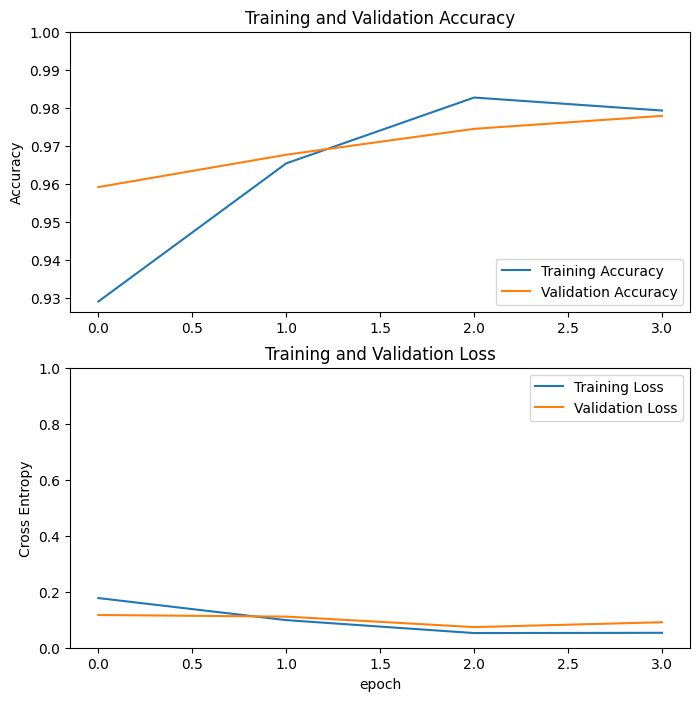

Threshold: 0.01
74/74 [==============================] - 2s 21ms/step - loss: 0.1011 - accuracy: 0.9675 - recall: 0.9813 - precision: 0.9744
Test Accuracy: 0.9675213694572449
Test Loss: 0.10108251869678497
Length predictions: 1170
Hand calculated accuracy: 0.8915
Accuracy: 0.8914529914529915
Precision: 0.8705402650356778
Recall: 1.0


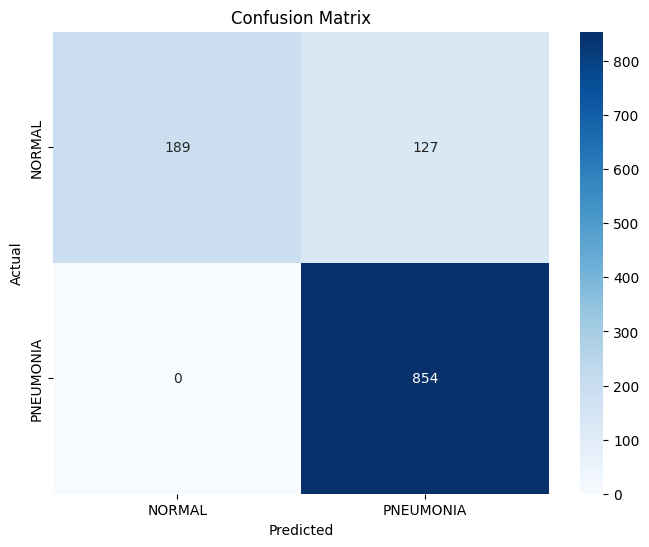

Threshold: 0.1
74/74 [==============================] - 1s 18ms/step - loss: 0.1011 - accuracy: 0.9675 - recall: 0.9813 - precision: 0.9744
Test Accuracy: 0.9675213694572449
Test Loss: 0.10108255594968796
Length predictions: 1170
Hand calculated accuracy: 0.9573
Accuracy: 0.9572649572649573
Precision: 0.9496644295302014
Recall: 0.9941451990632318


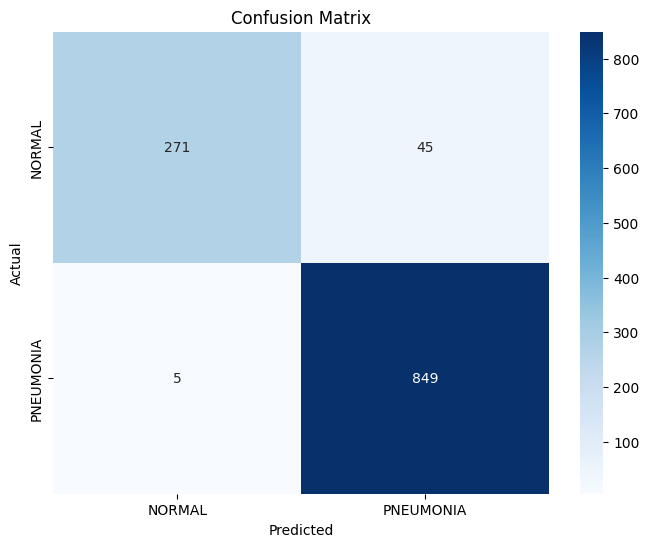

Threshold: 0.25
74/74 [==============================] - 1s 19ms/step - loss: 0.1011 - accuracy: 0.9675 - recall: 0.9813 - precision: 0.9744
Test Accuracy: 0.9675213694572449
Test Loss: 0.10108250379562378
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.9644902634593356
Recall: 0.9859484777517564


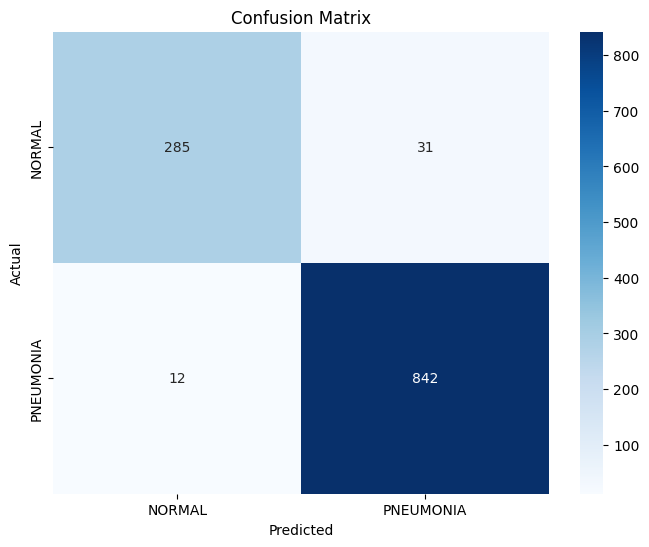

Threshold: 0.5
74/74 [==============================] - 1s 18ms/step - loss: 0.1011 - accuracy: 0.9675 - recall: 0.9813 - precision: 0.9744
Test Accuracy: 0.9675213694572449
Test Loss: 0.10108252614736557
Length predictions: 1170
Hand calculated accuracy: 0.9675
Accuracy: 0.9675213675213675
Precision: 0.9744186046511628
Recall: 0.9812646370023419


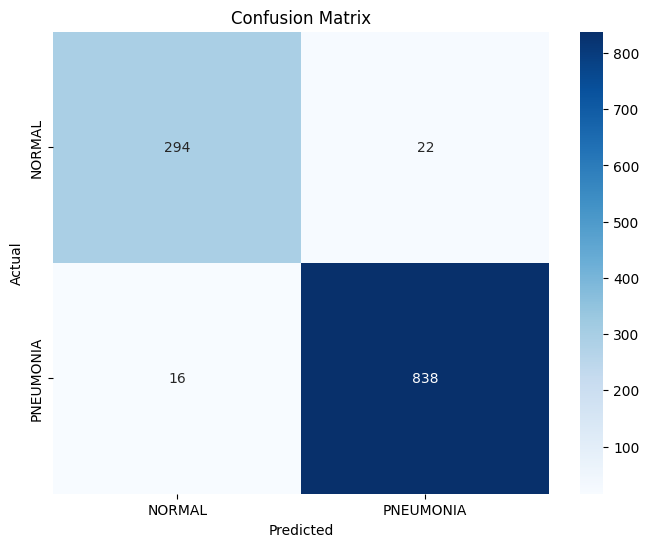

Threshold: 0.6
74/74 [==============================] - 1s 19ms/step - loss: 0.1011 - accuracy: 0.9675 - recall: 0.9813 - precision: 0.9744
Test Accuracy: 0.9675213694572449
Test Loss: 0.10108286887407303
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9766899766899767
Recall: 0.9812646370023419


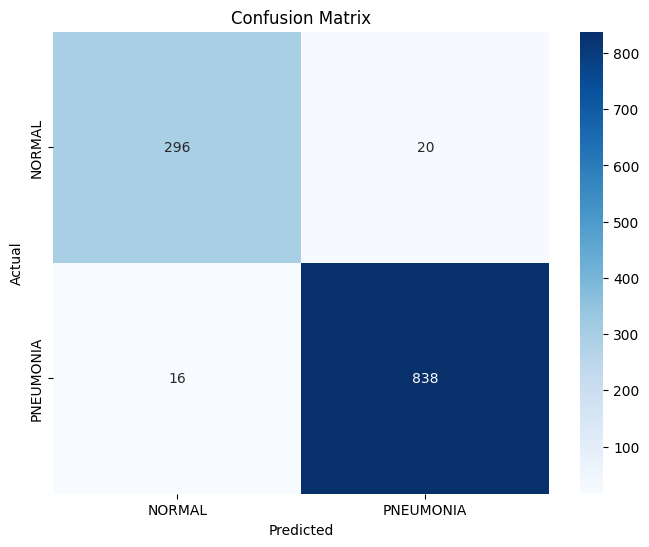

Threshold: 0.75
74/74 [==============================] - 1s 19ms/step - loss: 0.1011 - accuracy: 0.9675 - recall: 0.9813 - precision: 0.9744
Test Accuracy: 0.9675213694572449
Test Loss: 0.10108253359794617
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9811764705882353
Recall: 0.9765807962529274


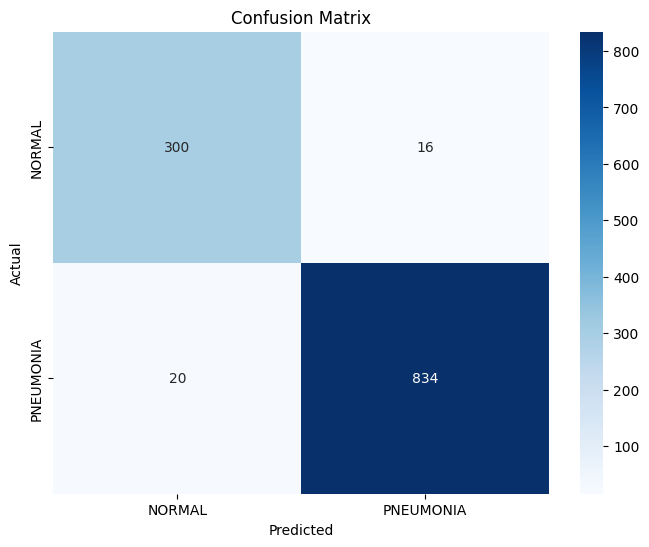

Threshold: 0.9
74/74 [==============================] - 1s 19ms/step - loss: 0.1011 - accuracy: 0.9675 - recall: 0.9813 - precision: 0.9744
Test Accuracy: 0.9675213694572449
Test Loss: 0.10108250379562378
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.98562874251497
Recall: 0.9637002341920374


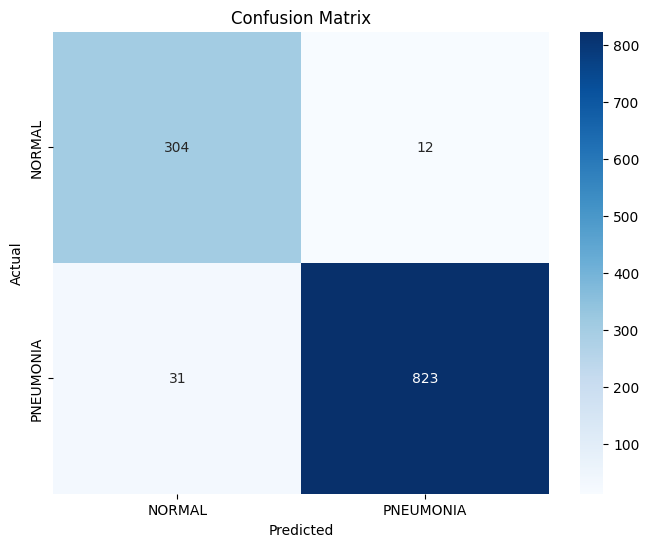

Threshold: 0.95
74/74 [==============================] - 1s 19ms/step - loss: 0.1011 - accuracy: 0.9675 - recall: 0.9813 - precision: 0.9744
Test Accuracy: 0.9675213694572449
Test Loss: 0.10108250379562378
Length predictions: 1170
Hand calculated accuracy: 0.9607
Accuracy: 0.9606837606837607
Precision: 0.9902912621359223
Recall: 0.955503512880562


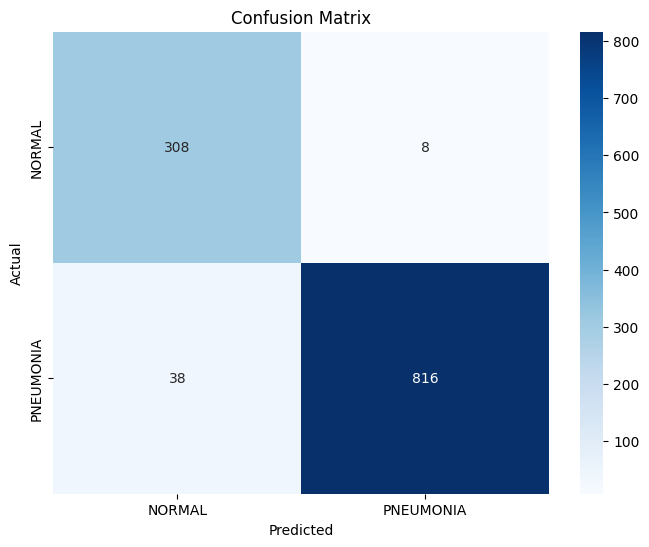

Threshold: 0.99
74/74 [==============================] - 1s 18ms/step - loss: 0.1011 - accuracy: 0.9675 - recall: 0.9813 - precision: 0.9744
Test Accuracy: 0.9675213694572449
Test Loss: 0.1010827124118805
Length predictions: 1170
Hand calculated accuracy: 0.941
Accuracy: 0.941025641025641
Precision: 0.9924717691342535
Recall: 0.9262295081967213


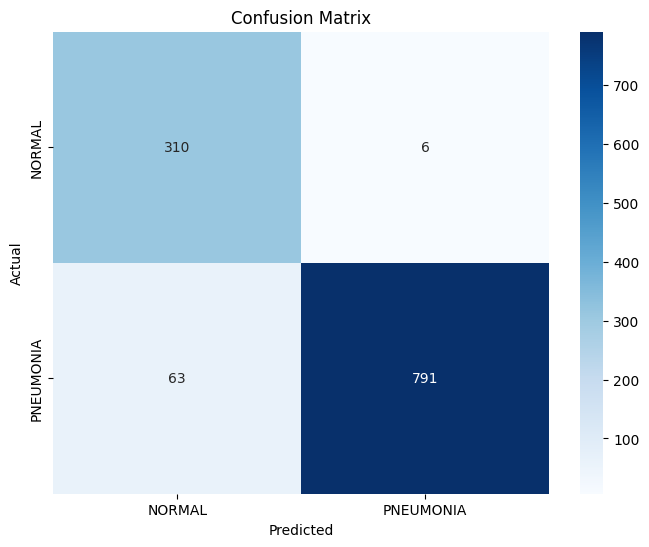

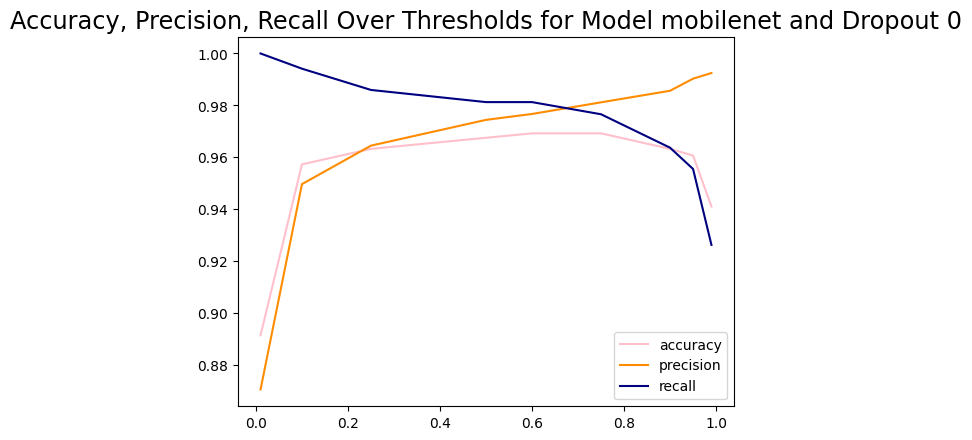



_______________


Model Name: mobilenet
Dropout: 0.2
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 28s 102ms/step - loss: 0.1925 - accuracy: 0.9185 - recall: 0.9495 - precision: 0.9395 - val_loss: 0.1511 - val_accuracy: 0.9370 - val_recall: 0.9322 - val_precision: 0.9803
Epoch 2/4
257/257 [==============================] - 26s 100ms/step - loss: 0.0886 - accuracy: 0.9668 - recall: 0.9773 - precision: 0.9773 - val_loss: 0.1342 - val_accuracy: 0.9523 - val_recall: 0.9486 - val_precision: 0.9854
Epoch 3/4
257/257 [==============================] - 26s 100ms/step - loss: 0.0641 - accuracy: 0.9758 - recall: 0.9829 - precision: 0.9839 - val_loss: 0.1209 - val_accuracy: 0.9659 - val_recall: 0.9650 - val_precision: 0.9880
Epoch 4/4
257/257 [==============================] - 26s 100ms/step - loss: 0.0600 - accuracy: 0.9763 - recall: 0.9846 - precision: 0.9830 - val_

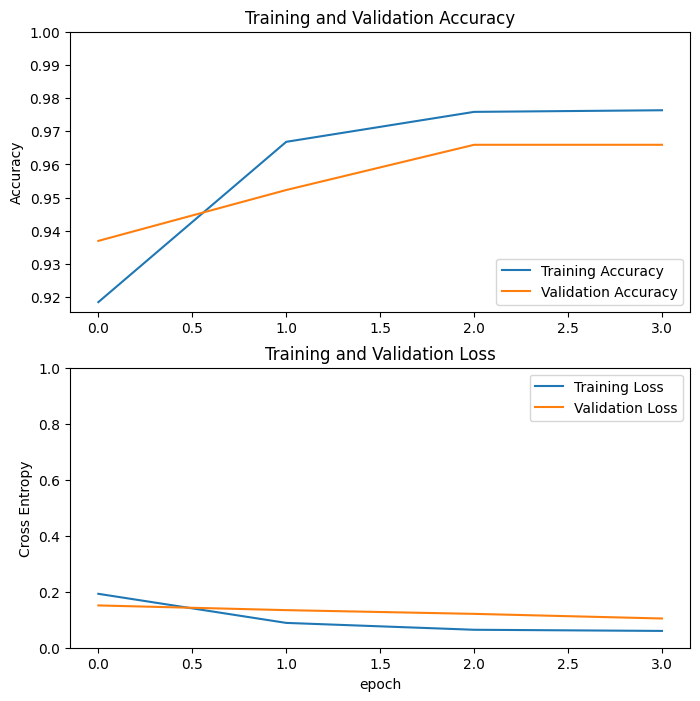

Threshold: 0.01
74/74 [==============================] - 2s 19ms/step - loss: 0.1227 - accuracy: 0.9692 - recall: 0.9871 - precision: 0.9712
Test Accuracy: 0.9692307710647583
Test Loss: 0.12265026569366455
Length predictions: 1170
Hand calculated accuracy: 0.9308
Accuracy: 0.9307692307692308
Precision: 0.9151450053705693
Recall: 0.9976580796252927


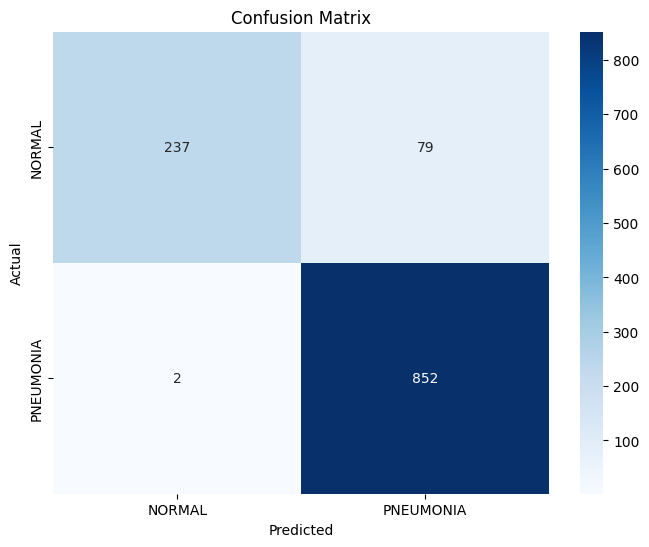

Threshold: 0.1
74/74 [==============================] - 2s 19ms/step - loss: 0.1227 - accuracy: 0.9692 - recall: 0.9871 - precision: 0.9712
Test Accuracy: 0.9692307710647583
Test Loss: 0.12265028804540634
Length predictions: 1170
Hand calculated accuracy: 0.9598
Accuracy: 0.9598290598290599
Precision: 0.9528619528619529
Recall: 0.9941451990632318


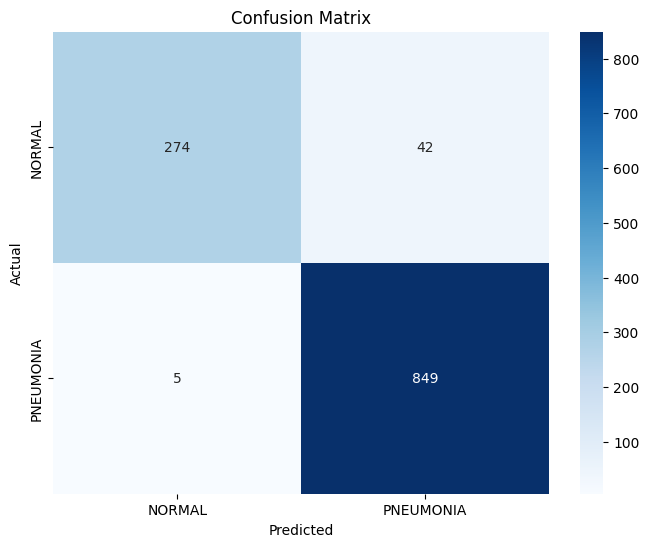

Threshold: 0.25
74/74 [==============================] - 1s 18ms/step - loss: 0.1227 - accuracy: 0.9692 - recall: 0.9871 - precision: 0.9712
Test Accuracy: 0.9692307710647583
Test Loss: 0.12265023589134216
Length predictions: 1170
Hand calculated accuracy: 0.9658
Accuracy: 0.9658119658119658
Precision: 0.965675057208238
Recall: 0.9882903981264637


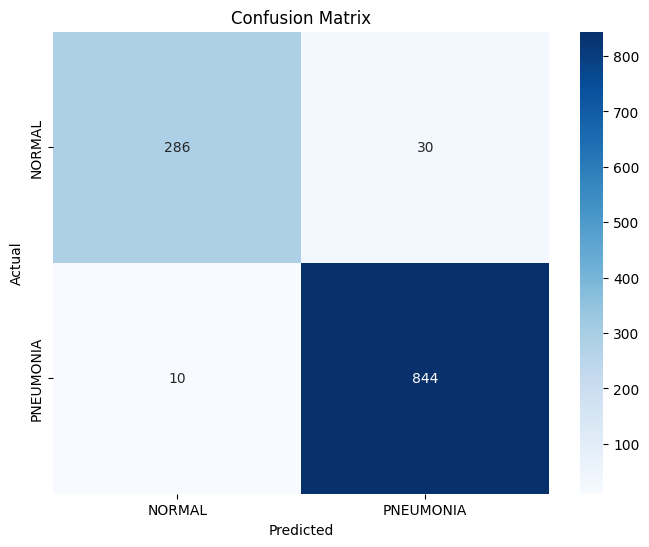

Threshold: 0.5
74/74 [==============================] - 2s 19ms/step - loss: 0.1227 - accuracy: 0.9692 - recall: 0.9871 - precision: 0.9712
Test Accuracy: 0.9692307710647583
Test Loss: 0.12265026569366455
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9711981566820277
Recall: 0.9871194379391101


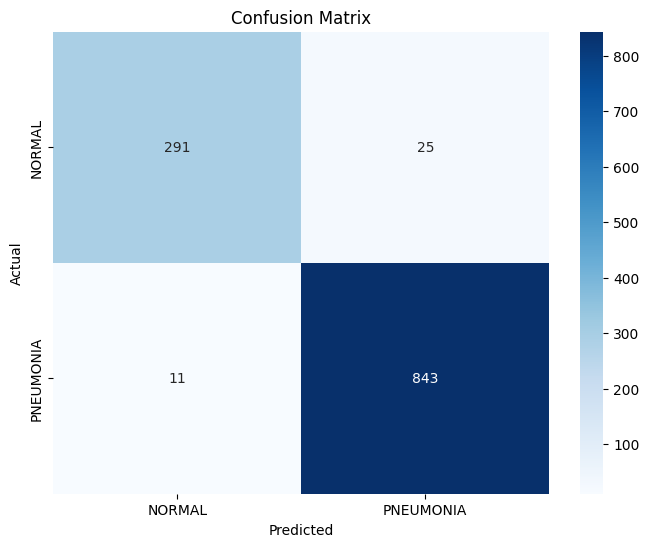

Threshold: 0.6
74/74 [==============================] - 1s 19ms/step - loss: 0.1227 - accuracy: 0.9692 - recall: 0.9871 - precision: 0.9712
Test Accuracy: 0.9692307710647583
Test Loss: 0.12265049666166306
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9722863741339491
Recall: 0.9859484777517564


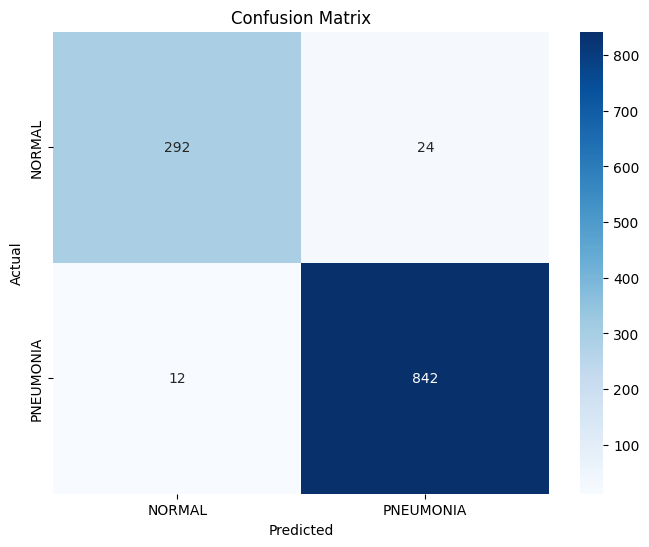

Threshold: 0.75
74/74 [==============================] - 2s 20ms/step - loss: 0.1227 - accuracy: 0.9692 - recall: 0.9871 - precision: 0.9712
Test Accuracy: 0.9692307710647583
Test Loss: 0.12265028059482574
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9778812572759022
Recall: 0.9836065573770492


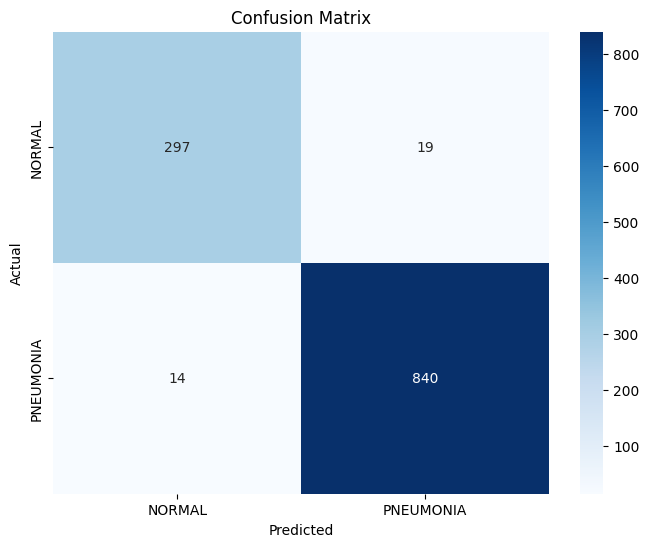

Threshold: 0.9
74/74 [==============================] - 2s 19ms/step - loss: 0.1227 - accuracy: 0.9692 - recall: 0.9871 - precision: 0.9712
Test Accuracy: 0.9692307710647583
Test Loss: 0.12265025079250336
Length predictions: 1170
Hand calculated accuracy: 0.9675
Accuracy: 0.9675213675213675
Precision: 0.98
Recall: 0.9754098360655737


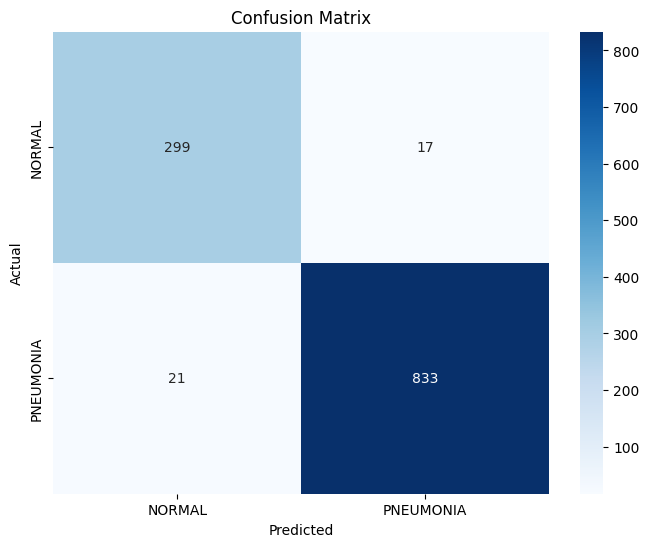

Threshold: 0.95
74/74 [==============================] - 1s 19ms/step - loss: 0.1227 - accuracy: 0.9692 - recall: 0.9871 - precision: 0.9712
Test Accuracy: 0.9692307710647583
Test Loss: 0.12265026569366455
Length predictions: 1170
Hand calculated accuracy: 0.9641
Accuracy: 0.9641025641025641
Precision: 0.981042654028436
Recall: 0.9695550351288056


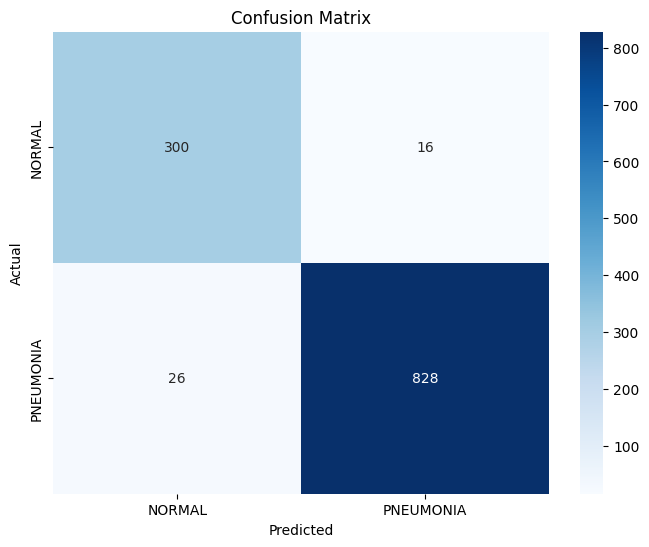

Threshold: 0.99
74/74 [==============================] - 2s 19ms/step - loss: 0.1227 - accuracy: 0.9692 - recall: 0.9871 - precision: 0.9712
Test Accuracy: 0.9692307710647583
Test Loss: 0.12265023589134216
Length predictions: 1170
Hand calculated accuracy: 0.9538
Accuracy: 0.9538461538461539
Precision: 0.9878048780487805
Recall: 0.9484777517564403


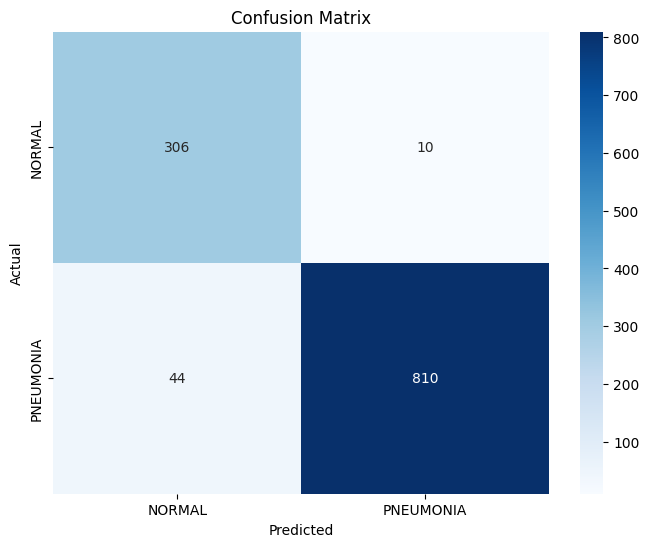

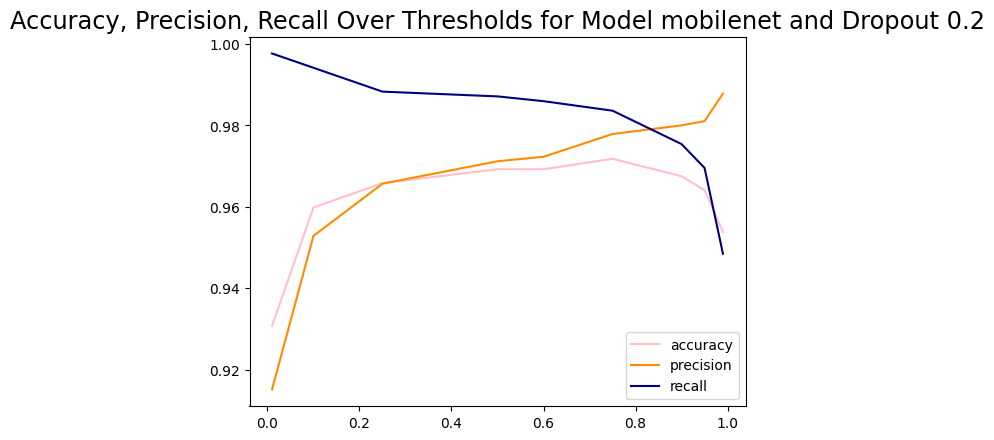



_______________


Model Name: mobilenet
Dropout: 0.5
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 28s 102ms/step - loss: 0.2111 - accuracy: 0.9136 - recall: 0.9458 - precision: 0.9364 - val_loss: 0.1311 - val_accuracy: 0.9608 - val_recall: 0.9743 - val_precision: 0.9720
Epoch 2/4
257/257 [==============================] - 26s 100ms/step - loss: 0.1018 - accuracy: 0.9639 - recall: 0.9779 - precision: 0.9727 - val_loss: 0.1263 - val_accuracy: 0.9591 - val_recall: 0.9977 - val_precision: 0.9489
Epoch 3/4
257/257 [==============================] - 26s 100ms/step - loss: 0.0745 - accuracy: 0.9727 - recall: 0.9823 - precision: 0.9803 - val_loss: 0.1160 - val_accuracy: 0.9676 - val_recall: 0.9953 - val_precision: 0.9616
Epoch 4/4
257/257 [==============================] - 26s 100ms/step - loss: 0.0602 - accuracy: 0.9768 - recall: 0.9843 - precision: 0.9840 - val_

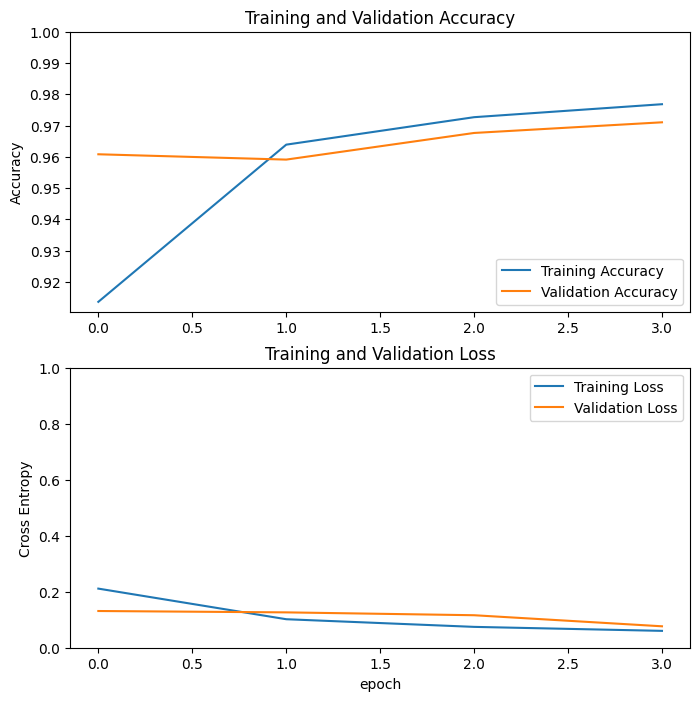

Threshold: 0.01
74/74 [==============================] - 2s 20ms/step - loss: 0.0855 - accuracy: 0.9701 - recall: 0.9766 - precision: 0.9823
Test Accuracy: 0.9700854420661926
Test Loss: 0.08551952242851257
Length predictions: 1170
Hand calculated accuracy: 0.8966
Accuracy: 0.8965811965811966
Precision: 0.8758974358974358
Recall: 1.0


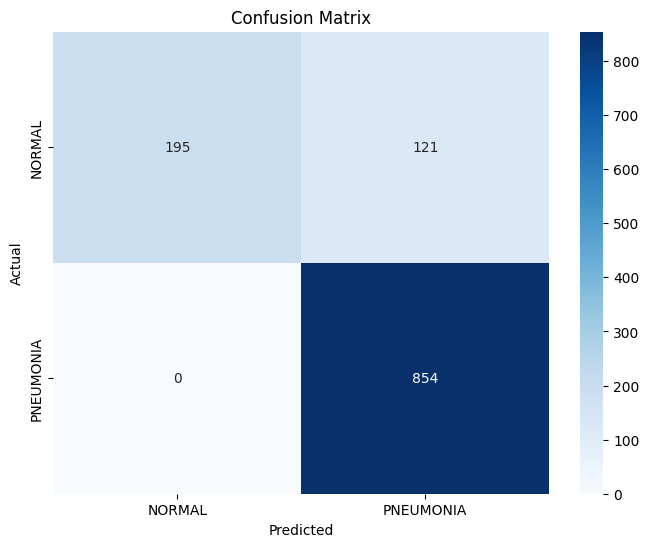

Threshold: 0.1
74/74 [==============================] - 2s 19ms/step - loss: 0.0855 - accuracy: 0.9701 - recall: 0.9766 - precision: 0.9823
Test Accuracy: 0.9700854420661926
Test Loss: 0.0855201706290245
Length predictions: 1170
Hand calculated accuracy: 0.9641
Accuracy: 0.9641025641025641
Precision: 0.9592760180995475
Recall: 0.9929742388758782


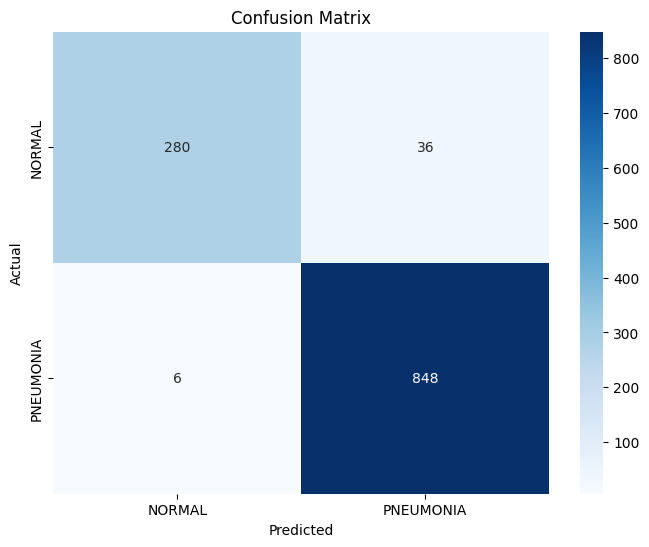

Threshold: 0.25
74/74 [==============================] - 1s 19ms/step - loss: 0.0855 - accuracy: 0.9701 - recall: 0.9766 - precision: 0.9823
Test Accuracy: 0.9700854420661926
Test Loss: 0.08551951497793198
Length predictions: 1170
Hand calculated accuracy: 0.9735
Accuracy: 0.9735042735042735
Precision: 0.9746251441753172
Recall: 0.9894613583138173


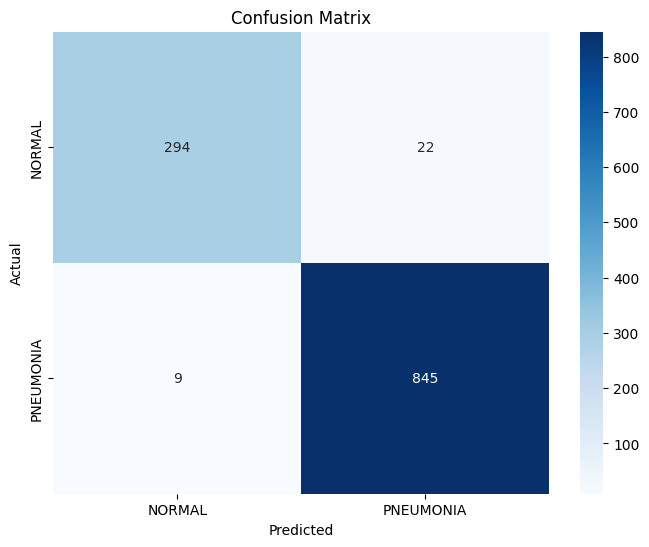

Threshold: 0.5
74/74 [==============================] - 1s 19ms/step - loss: 0.0855 - accuracy: 0.9701 - recall: 0.9766 - precision: 0.9823
Test Accuracy: 0.9700854420661926
Test Loss: 0.08551937341690063
Length predictions: 1170
Hand calculated accuracy: 0.9701
Accuracy: 0.9700854700854701
Precision: 0.9823321554770318
Recall: 0.9765807962529274


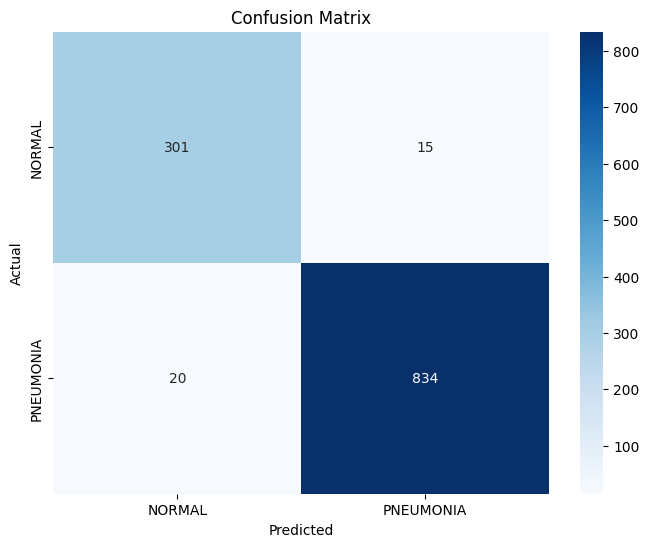

Threshold: 0.6
74/74 [==============================] - 1s 19ms/step - loss: 0.0855 - accuracy: 0.9701 - recall: 0.9766 - precision: 0.9823
Test Accuracy: 0.9700854420661926
Test Loss: 0.08551953732967377
Length predictions: 1170
Hand calculated accuracy: 0.9667
Accuracy: 0.9666666666666667
Precision: 0.9845422116527943
Recall: 0.9695550351288056


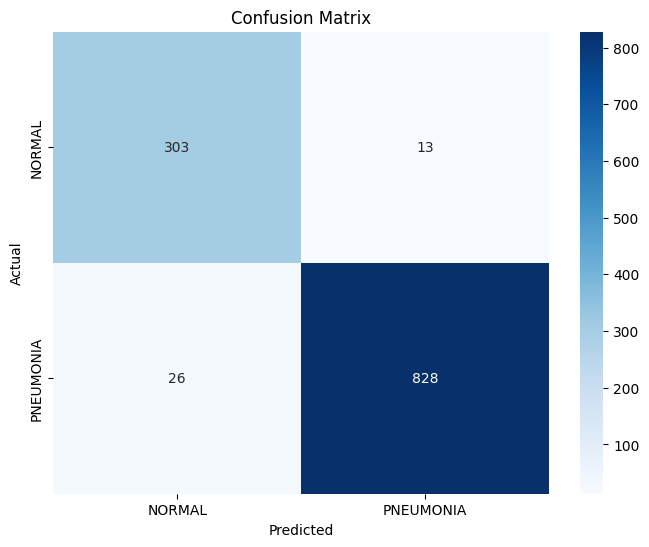

Threshold: 0.75
74/74 [==============================] - 1s 19ms/step - loss: 0.0855 - accuracy: 0.9701 - recall: 0.9766 - precision: 0.9823
Test Accuracy: 0.9700854420661926
Test Loss: 0.08551947772502899
Length predictions: 1170
Hand calculated accuracy: 0.9581
Accuracy: 0.9581196581196582
Precision: 0.9843561973525873
Recall: 0.9578454332552693


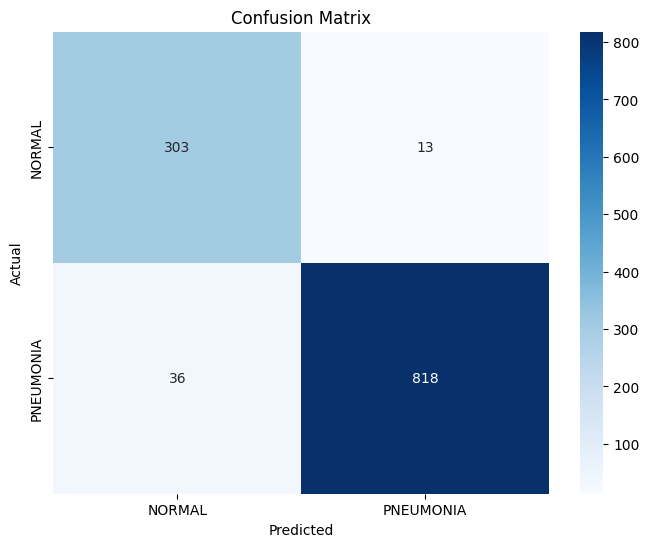

Threshold: 0.9
74/74 [==============================] - 2s 20ms/step - loss: 0.0855 - accuracy: 0.9701 - recall: 0.9766 - precision: 0.9823
Test Accuracy: 0.9700854420661926
Test Loss: 0.08551949262619019
Length predictions: 1170
Hand calculated accuracy: 0.9402
Accuracy: 0.9401709401709402
Precision: 0.9912280701754386
Recall: 0.9262295081967213


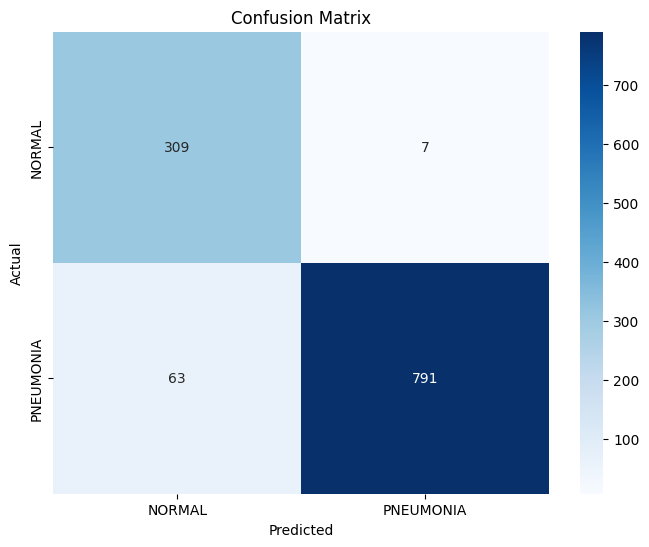

Threshold: 0.95
74/74 [==============================] - 1s 19ms/step - loss: 0.0855 - accuracy: 0.9701 - recall: 0.9766 - precision: 0.9823
Test Accuracy: 0.9700854420661926
Test Loss: 0.08551950752735138
Length predictions: 1170
Hand calculated accuracy: 0.9214
Accuracy: 0.9213675213675213
Precision: 0.9935233160621761
Recall: 0.8981264637002342


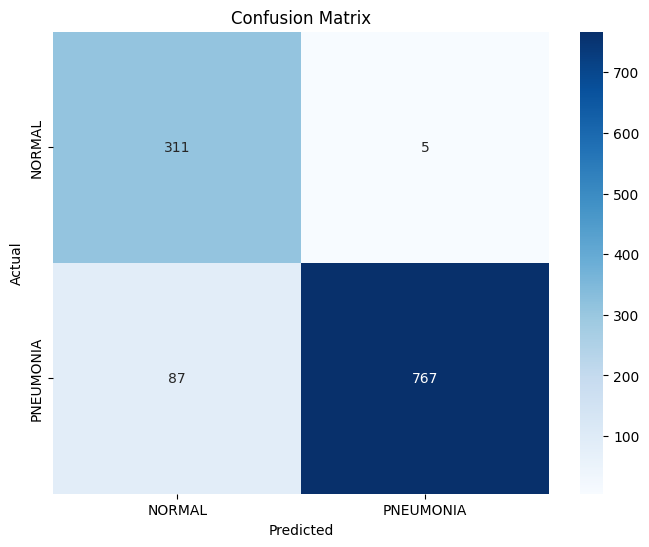

Threshold: 0.99
74/74 [==============================] - 2s 19ms/step - loss: 0.0855 - accuracy: 0.9701 - recall: 0.9766 - precision: 0.9823
Test Accuracy: 0.9700854420661926
Test Loss: 0.08551947772502899
Length predictions: 1170
Hand calculated accuracy: 0.8333
Accuracy: 0.8333333333333334
Precision: 0.9984871406959153
Recall: 0.7728337236533958


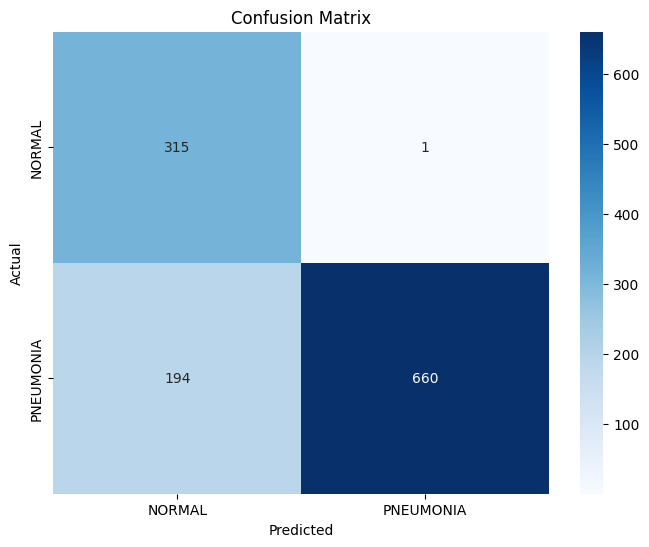

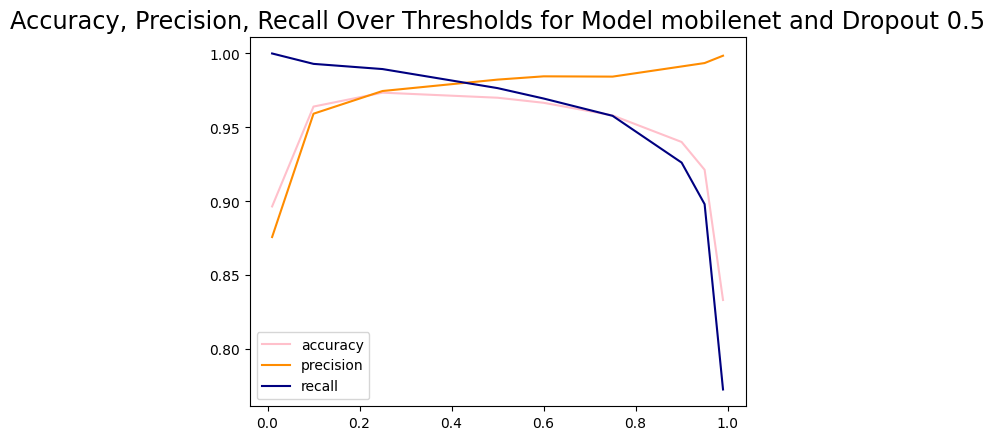



_______________


Model Name: mobilenet
Dropout: 0.7
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 28s 102ms/step - loss: 0.2141 - accuracy: 0.9149 - recall: 0.9502 - precision: 0.9343 - val_loss: 0.1740 - val_accuracy: 0.9319 - val_recall: 0.9136 - val_precision: 0.9924
Epoch 2/4
257/257 [==============================] - 25s 98ms/step - loss: 0.1048 - accuracy: 0.9622 - recall: 0.9749 - precision: 0.9733 - val_loss: 0.0871 - val_accuracy: 0.9710 - val_recall: 0.9860 - val_precision: 0.9746
Epoch 3/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0875 - accuracy: 0.9702 - recall: 0.9803 - precision: 0.9790 - val_loss: 0.0842 - val_accuracy: 0.9676 - val_recall: 0.9720 - val_precision: 0.9835
Epoch 4/4
257/257 [==============================] - 26s 99ms/step - loss: 0.0597 - accuracy: 0.9798 - recall: 0.9856 - precision: 0.9866 - val_los

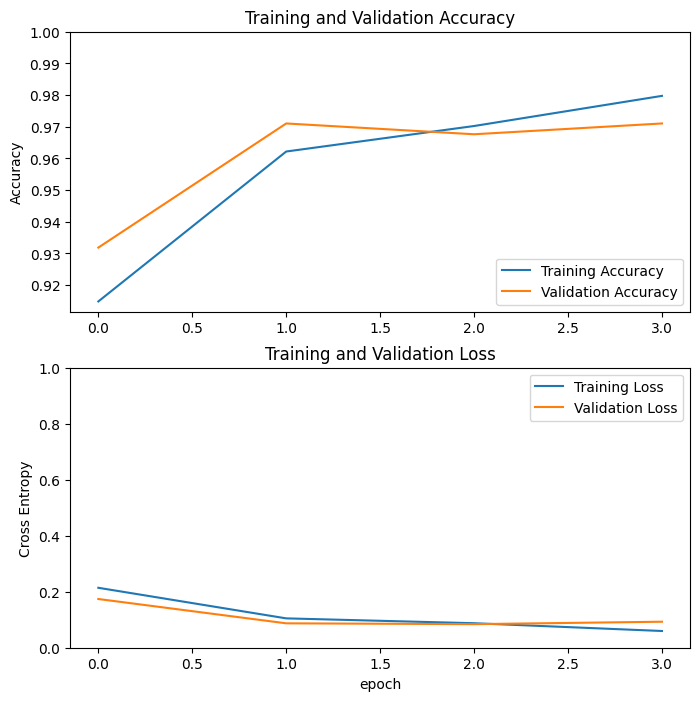

Threshold: 0.01
74/74 [==============================] - 1s 18ms/step - loss: 0.0985 - accuracy: 0.9726 - recall: 0.9836 - precision: 0.9790
Test Accuracy: 0.9726495742797852
Test Loss: 0.0985255017876625
Length predictions: 1170
Hand calculated accuracy: 0.941
Accuracy: 0.941025641025641
Precision: 0.9261672095548317
Recall: 0.9988290398126464


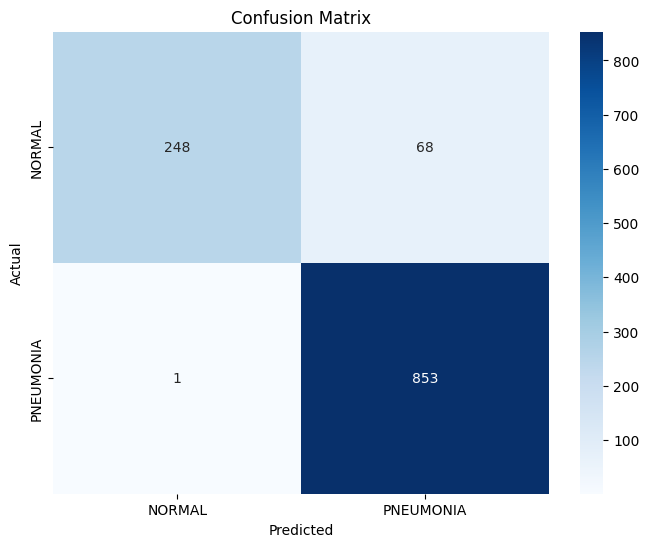

Threshold: 0.1
74/74 [==============================] - 2s 19ms/step - loss: 0.0985 - accuracy: 0.9726 - recall: 0.9836 - precision: 0.9790
Test Accuracy: 0.9726495742797852
Test Loss: 0.09852549433708191
Length predictions: 1170
Hand calculated accuracy: 0.9675
Accuracy: 0.9675213675213675
Precision: 0.9625850340136054
Recall: 0.9941451990632318


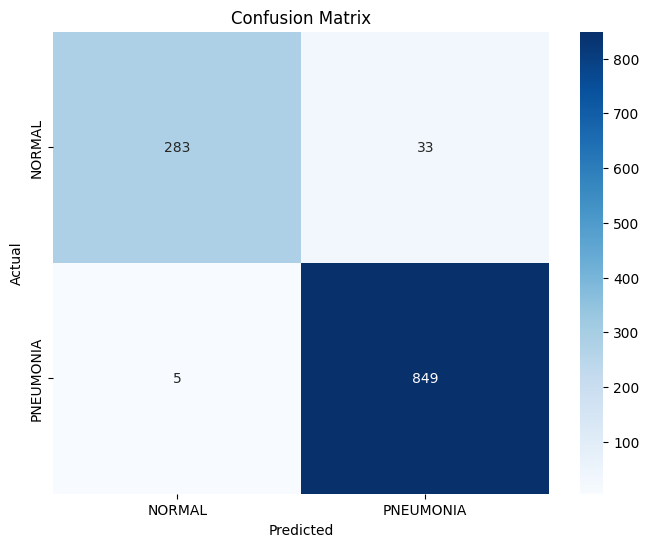

Threshold: 0.25
74/74 [==============================] - 1s 18ms/step - loss: 0.0985 - accuracy: 0.9726 - recall: 0.9836 - precision: 0.9790
Test Accuracy: 0.9726495742797852
Test Loss: 0.09852604568004608
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9679633867276888
Recall: 0.990632318501171


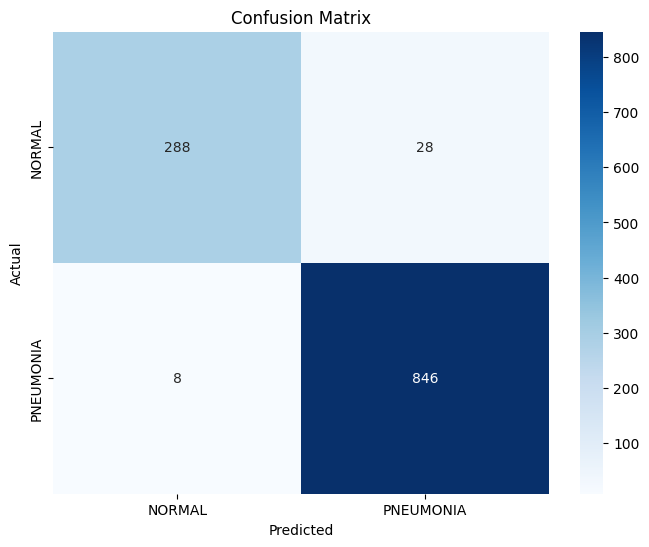

Threshold: 0.5
74/74 [==============================] - 1s 19ms/step - loss: 0.0985 - accuracy: 0.9726 - recall: 0.9836 - precision: 0.9790
Test Accuracy: 0.9726495742797852
Test Loss: 0.0985255315899849
Length predictions: 1170
Hand calculated accuracy: 0.9726
Accuracy: 0.9726495726495726
Precision: 0.9790209790209791
Recall: 0.9836065573770492


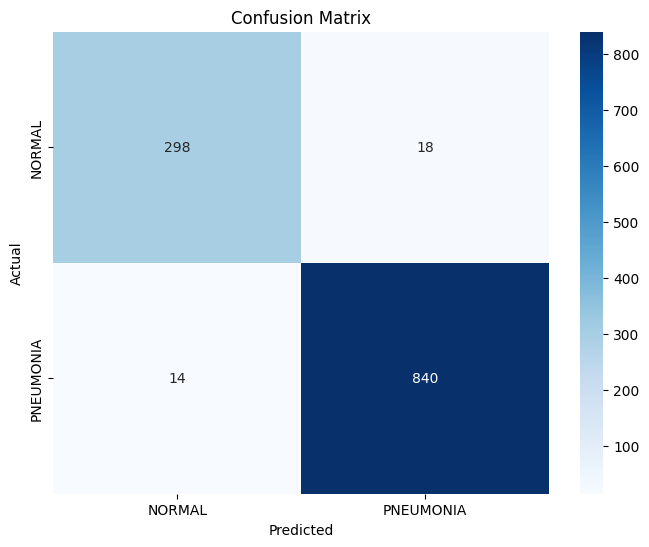

Threshold: 0.6
74/74 [==============================] - 2s 19ms/step - loss: 0.0985 - accuracy: 0.9726 - recall: 0.9836 - precision: 0.9790
Test Accuracy: 0.9726495742797852
Test Loss: 0.0985255092382431
Length predictions: 1170
Hand calculated accuracy: 0.9726
Accuracy: 0.9726495726495726
Precision: 0.9801401869158879
Recall: 0.9824355971896955


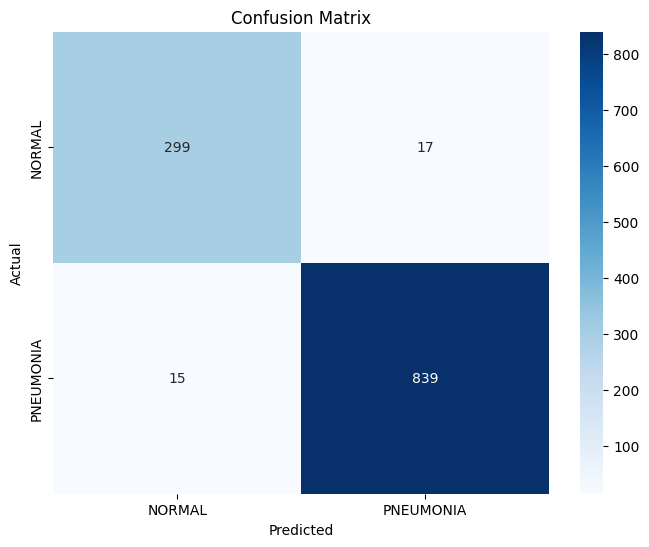

Threshold: 0.75
74/74 [==============================] - 1s 19ms/step - loss: 0.0985 - accuracy: 0.9726 - recall: 0.9836 - precision: 0.9790
Test Accuracy: 0.9726495742797852
Test Loss: 0.09852553904056549
Length predictions: 1170
Hand calculated accuracy: 0.9709
Accuracy: 0.9709401709401709
Precision: 0.9834905660377359
Recall: 0.9765807962529274


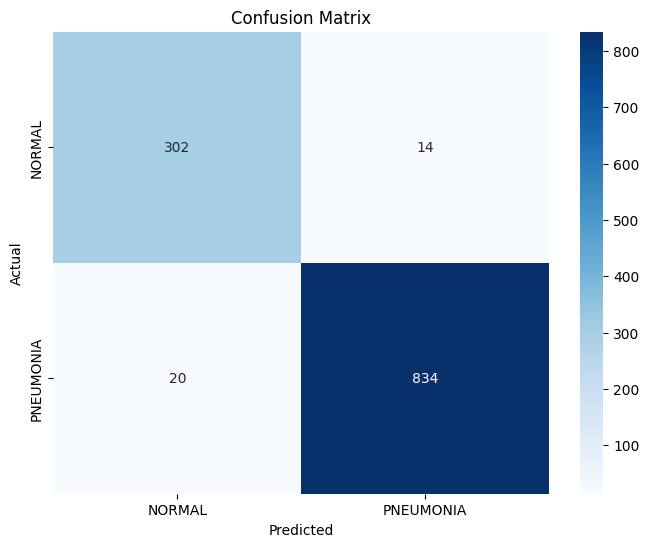

Threshold: 0.9
74/74 [==============================] - 1s 18ms/step - loss: 0.0985 - accuracy: 0.9726 - recall: 0.9836 - precision: 0.9790
Test Accuracy: 0.9726495742797852
Test Loss: 0.0985255092382431
Length predictions: 1170
Hand calculated accuracy: 0.9658
Accuracy: 0.9658119658119658
Precision: 0.9868421052631579
Recall: 0.9660421545667447


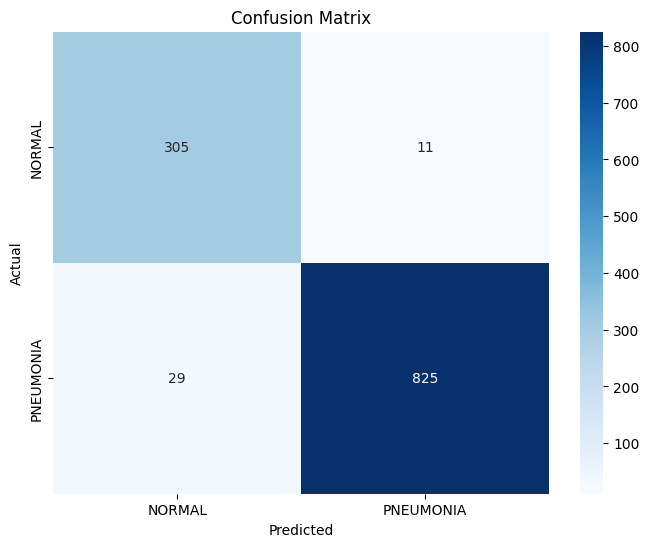

Threshold: 0.95
74/74 [==============================] - 1s 18ms/step - loss: 0.0985 - accuracy: 0.9726 - recall: 0.9836 - precision: 0.9790
Test Accuracy: 0.9726495742797852
Test Loss: 0.0985255166888237
Length predictions: 1170
Hand calculated accuracy: 0.9624
Accuracy: 0.9623931623931624
Precision: 0.9891304347826086
Recall: 0.9590163934426229


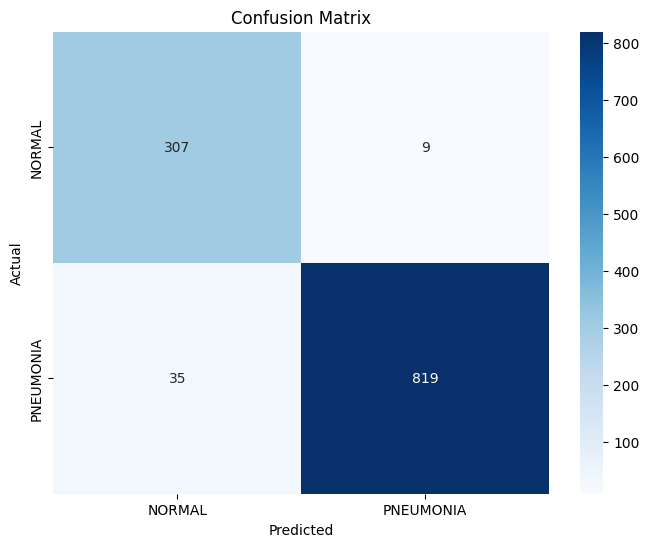

Threshold: 0.99
74/74 [==============================] - 1s 19ms/step - loss: 0.0985 - accuracy: 0.9726 - recall: 0.9836 - precision: 0.9790
Test Accuracy: 0.9726495742797852
Test Loss: 0.0985255241394043
Length predictions: 1170
Hand calculated accuracy: 0.941
Accuracy: 0.941025641025641
Precision: 0.9900124843945068
Recall: 0.9285714285714286


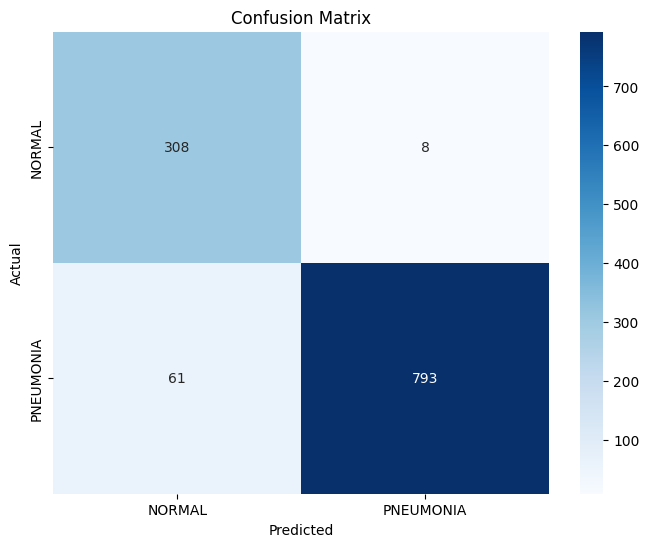

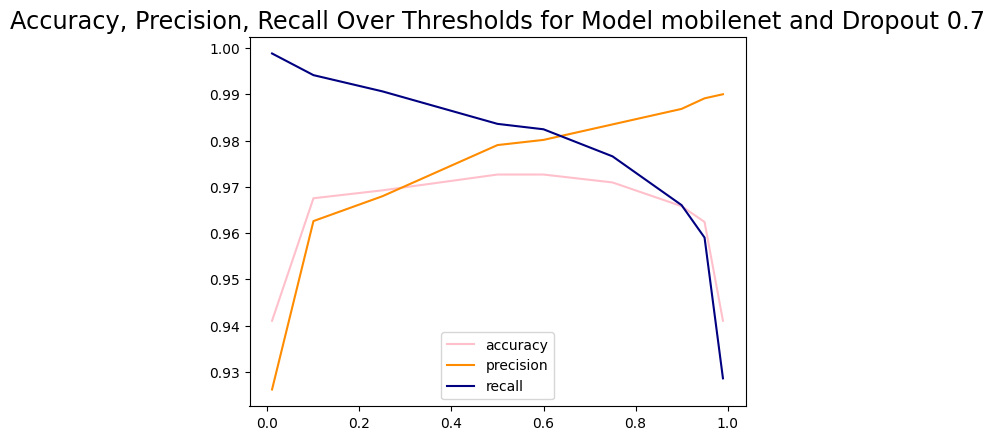



_______________


Model Name: mobilenet
Dropout: 0
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 28s 100ms/step - loss: 0.1799 - accuracy: 0.9295 - recall: 0.9549 - precision: 0.9488 - val_loss: 0.2004 - val_accuracy: 0.9404 - val_recall: 0.9229 - val_precision: 0.9950
Epoch 2/4
257/257 [==============================] - 26s 100ms/step - loss: 0.0956 - accuracy: 0.9680 - recall: 0.9803 - precision: 0.9760 - val_loss: 0.1342 - val_accuracy: 0.9574 - val_recall: 0.9533 - val_precision: 0.9879
Epoch 3/4
257/257 [==============================] - 26s 99ms/step - loss: 0.0806 - accuracy: 0.9705 - recall: 0.9806 - precision: 0.9790 - val_loss: 0.1367 - val_accuracy: 0.9642 - val_recall: 0.9930 - val_precision: 0.9594
Epoch 4/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0479 - accuracy: 0.9837 - recall: 0.9893 - precision: 0.9883 - val_loss

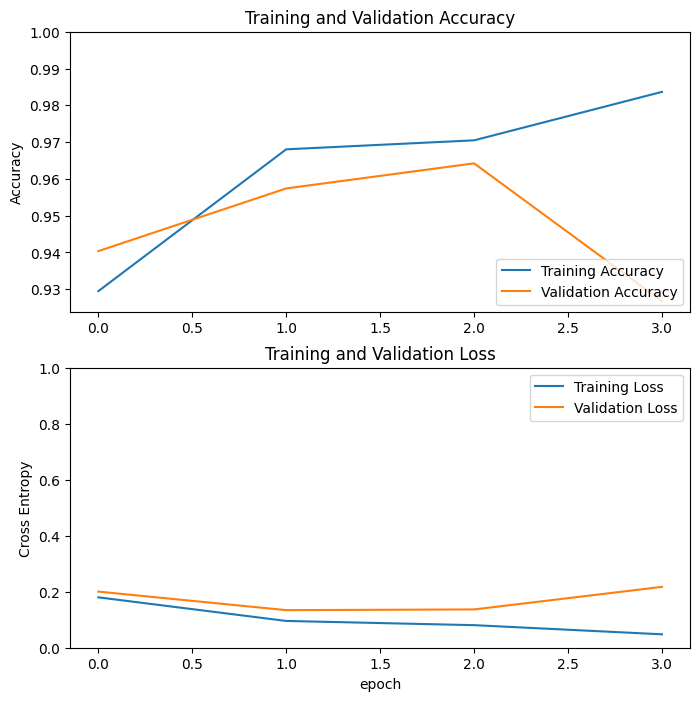

Threshold: 0.01
74/74 [==============================] - 1s 19ms/step - loss: 0.2090 - accuracy: 0.9299 - recall: 0.9133 - precision: 0.9898
Test Accuracy: 0.9299145340919495
Test Loss: 0.2090449035167694
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9755813953488373
Recall: 0.9824355971896955


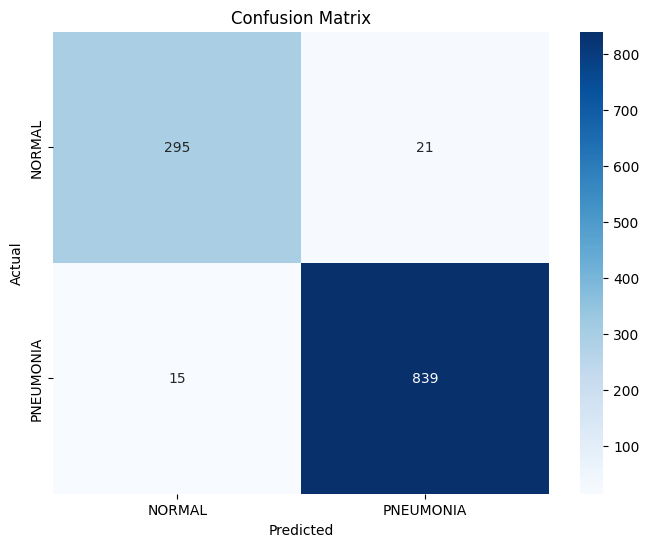

Threshold: 0.1
74/74 [==============================] - 1s 19ms/step - loss: 0.2090 - accuracy: 0.9299 - recall: 0.9133 - precision: 0.9898
Test Accuracy: 0.9299145340919495
Test Loss: 0.20904424786567688
Length predictions: 1170
Hand calculated accuracy: 0.959
Accuracy: 0.958974358974359
Precision: 0.9832134292565947
Recall: 0.9601873536299765


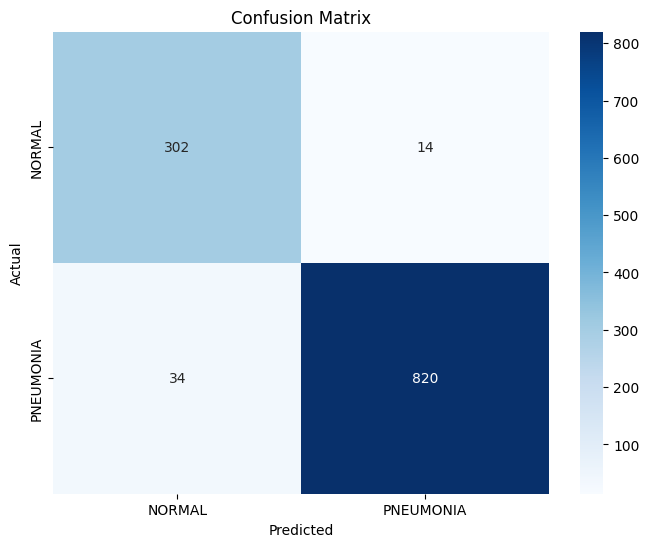

Threshold: 0.25
74/74 [==============================] - 1s 19ms/step - loss: 0.2090 - accuracy: 0.9299 - recall: 0.9133 - precision: 0.9898
Test Accuracy: 0.9299145340919495
Test Loss: 0.20904430747032166
Length predictions: 1170
Hand calculated accuracy: 0.9496
Accuracy: 0.9495726495726495
Precision: 0.9901356350184957
Recall: 0.9402810304449649


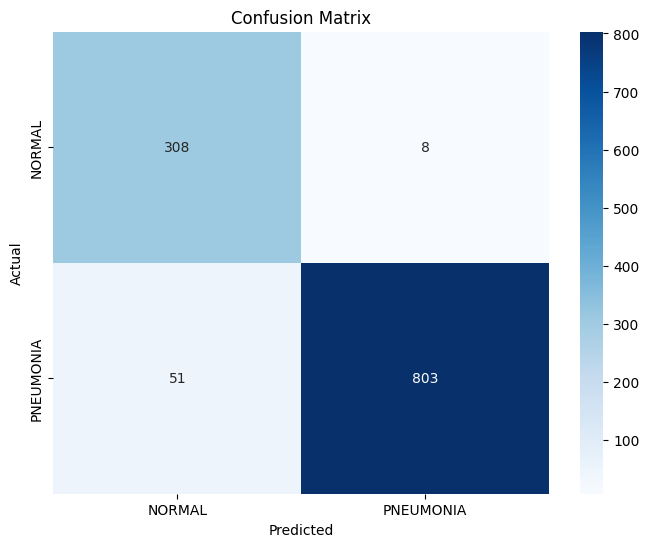

Threshold: 0.5
74/74 [==============================] - 1s 19ms/step - loss: 0.2090 - accuracy: 0.9299 - recall: 0.9133 - precision: 0.9898
Test Accuracy: 0.9299145340919495
Test Loss: 0.20904427766799927
Length predictions: 1170
Hand calculated accuracy: 0.9299
Accuracy: 0.9299145299145299
Precision: 0.9898477157360406
Recall: 0.9133489461358314


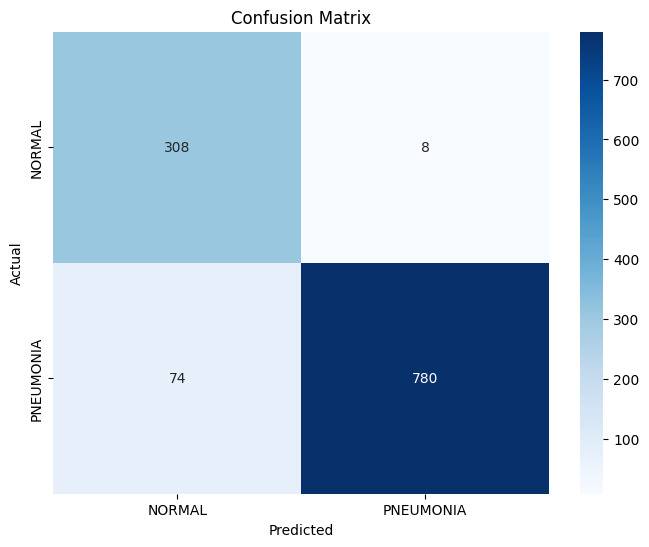

Threshold: 0.6
74/74 [==============================] - 1s 19ms/step - loss: 0.2090 - accuracy: 0.9299 - recall: 0.9133 - precision: 0.9898
Test Accuracy: 0.9299145340919495
Test Loss: 0.2090456485748291
Length predictions: 1170
Hand calculated accuracy: 0.9197
Accuracy: 0.9196581196581196
Precision: 0.9909560723514211
Recall: 0.8981264637002342


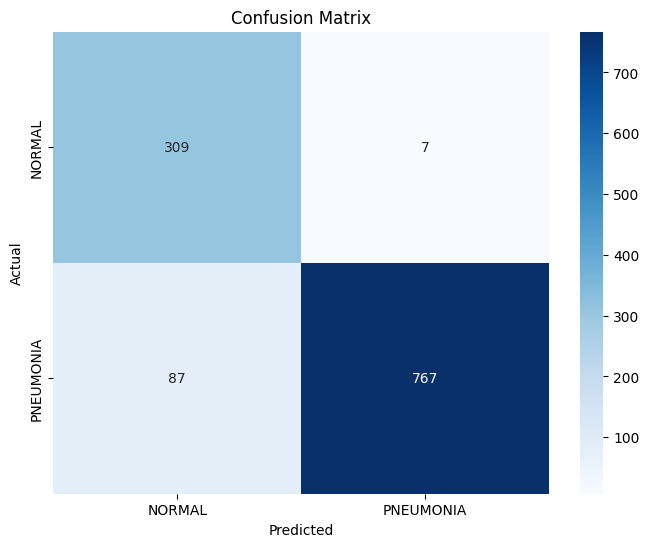

Threshold: 0.75
74/74 [==============================] - 1s 19ms/step - loss: 0.2090 - accuracy: 0.9299 - recall: 0.9133 - precision: 0.9898
Test Accuracy: 0.9299145340919495
Test Loss: 0.20904436707496643
Length predictions: 1170
Hand calculated accuracy: 0.9026
Accuracy: 0.9025641025641026
Precision: 0.9907161803713528
Recall: 0.8747072599531616


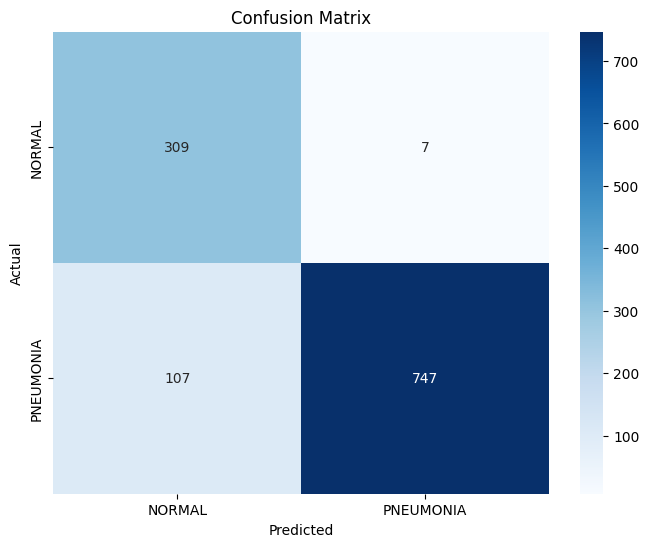

Threshold: 0.9
74/74 [==============================] - 2s 19ms/step - loss: 0.2090 - accuracy: 0.9299 - recall: 0.9133 - precision: 0.9898
Test Accuracy: 0.9299145340919495
Test Loss: 0.20904430747032166
Length predictions: 1170
Hand calculated accuracy: 0.8778
Accuracy: 0.8777777777777778
Precision: 0.9944367176634215
Recall: 0.8372365339578455


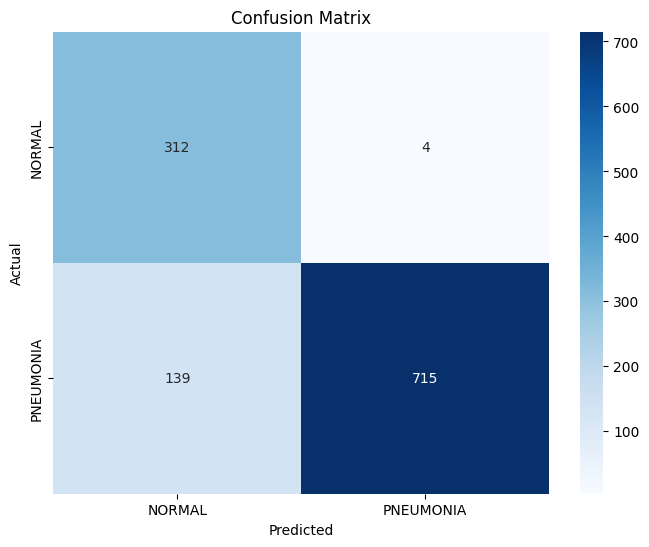

Threshold: 0.95
74/74 [==============================] - 2s 19ms/step - loss: 0.2090 - accuracy: 0.9299 - recall: 0.9133 - precision: 0.9898
Test Accuracy: 0.9299145340919495
Test Loss: 0.20904430747032166
Length predictions: 1170
Hand calculated accuracy: 0.8573
Accuracy: 0.8572649572649572
Precision: 1.0
Recall: 0.8044496487119438


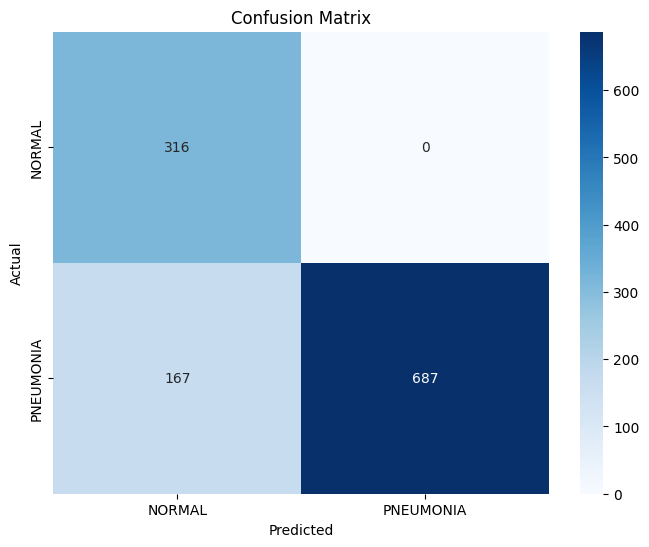

Threshold: 0.99
74/74 [==============================] - 1s 18ms/step - loss: 0.2090 - accuracy: 0.9299 - recall: 0.9133 - precision: 0.9898
Test Accuracy: 0.9299145340919495
Test Loss: 0.20904430747032166
Length predictions: 1170
Hand calculated accuracy: 0.7932
Accuracy: 0.7931623931623931
Precision: 1.0
Recall: 0.7166276346604216


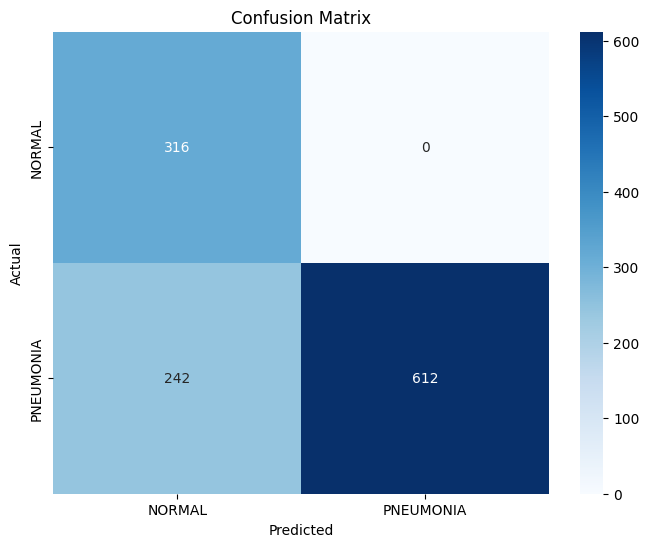

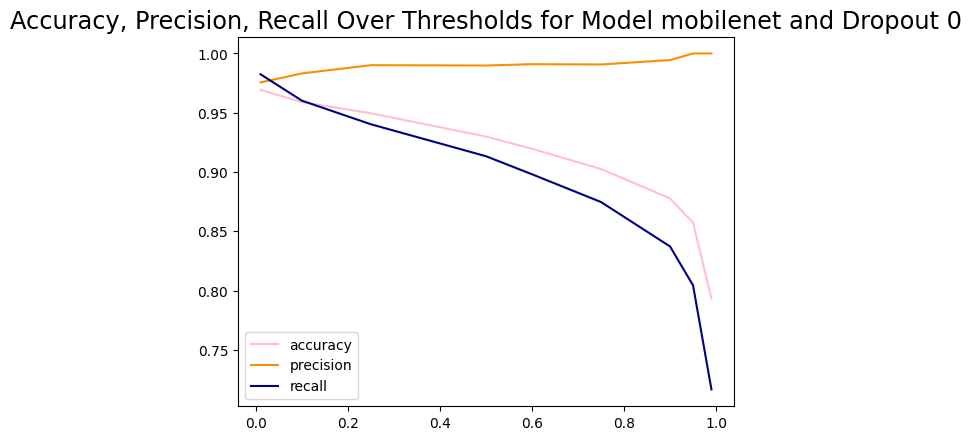



_______________


Model Name: mobilenet
Dropout: 0.2
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 28s 101ms/step - loss: 0.1925 - accuracy: 0.9258 - recall: 0.9539 - precision: 0.9450 - val_loss: 0.1415 - val_accuracy: 0.9404 - val_recall: 0.9907 - val_precision: 0.9319
Epoch 2/4
257/257 [==============================] - 25s 97ms/step - loss: 0.0940 - accuracy: 0.9624 - recall: 0.9739 - precision: 0.9746 - val_loss: 0.0844 - val_accuracy: 0.9693 - val_recall: 0.9696 - val_precision: 0.9881
Epoch 3/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0818 - accuracy: 0.9702 - recall: 0.9783 - precision: 0.9809 - val_loss: 0.0717 - val_accuracy: 0.9796 - val_recall: 0.9836 - val_precision: 0.9883
Epoch 4/4
257/257 [==============================] - 25s 97ms/step - loss: 0.0517 - accuracy: 0.9798 - recall: 0.9860 - precision: 0.9863 - val_los

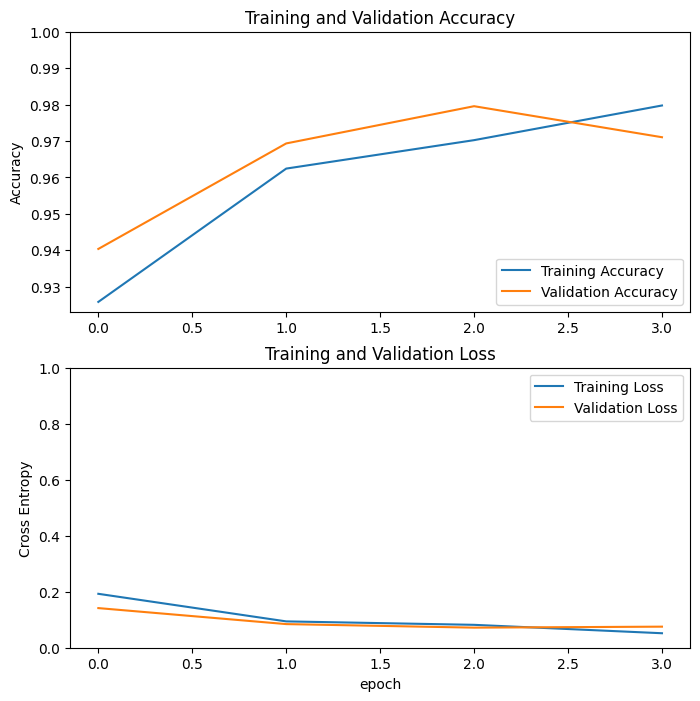

Threshold: 0.01
74/74 [==============================] - 2s 19ms/step - loss: 0.0904 - accuracy: 0.9675 - recall: 0.9754 - precision: 0.9800
Test Accuracy: 0.9675213694572449
Test Loss: 0.09039384871721268
Length predictions: 1170
Hand calculated accuracy: 0.9368
Accuracy: 0.9367521367521368
Precision: 0.9211663066954644
Recall: 0.9988290398126464


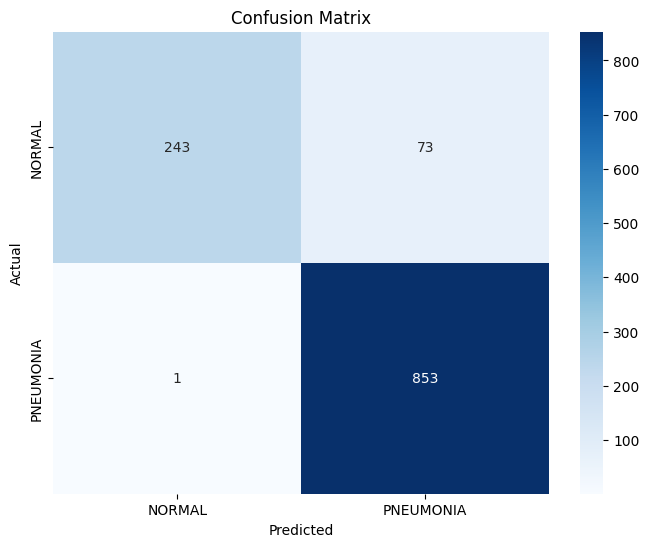

Threshold: 0.1
74/74 [==============================] - 2s 20ms/step - loss: 0.0904 - accuracy: 0.9675 - recall: 0.9754 - precision: 0.9800
Test Accuracy: 0.9675213694572449
Test Loss: 0.09039387851953506
Length predictions: 1170
Hand calculated accuracy: 0.9684
Accuracy: 0.9683760683760684
Precision: 0.9690011481056258
Recall: 0.9882903981264637


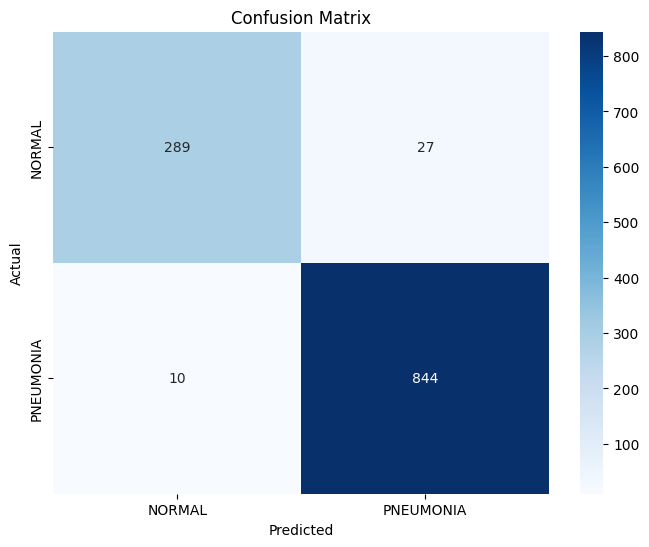

Threshold: 0.25
74/74 [==============================] - 2s 20ms/step - loss: 0.0904 - accuracy: 0.9675 - recall: 0.9754 - precision: 0.9800
Test Accuracy: 0.9675213694572449
Test Loss: 0.09039387106895447
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9767711962833914
Recall: 0.9847775175644028


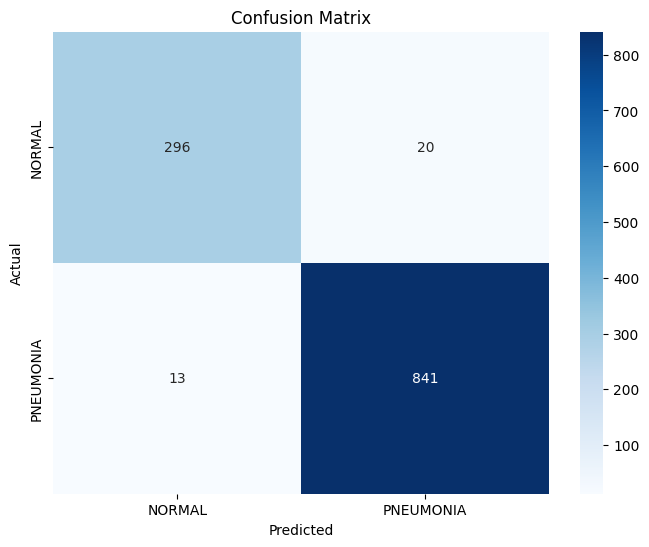

Threshold: 0.5
74/74 [==============================] - 2s 19ms/step - loss: 0.0904 - accuracy: 0.9675 - recall: 0.9754 - precision: 0.9800
Test Accuracy: 0.9675213694572449
Test Loss: 0.09039390087127686
Length predictions: 1170
Hand calculated accuracy: 0.9675
Accuracy: 0.9675213675213675
Precision: 0.98
Recall: 0.9754098360655737


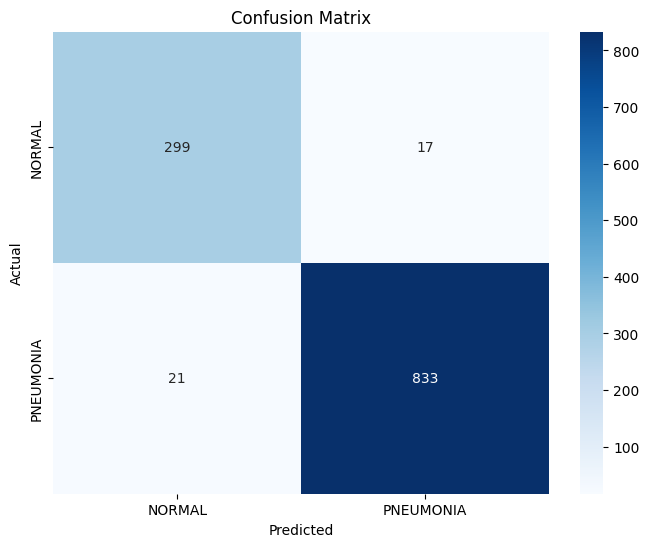

Threshold: 0.6
74/74 [==============================] - 2s 20ms/step - loss: 0.0904 - accuracy: 0.9675 - recall: 0.9754 - precision: 0.9800
Test Accuracy: 0.9675213694572449
Test Loss: 0.09039389342069626
Length predictions: 1170
Hand calculated accuracy: 0.9658
Accuracy: 0.9658119658119658
Precision: 0.9845238095238096
Recall: 0.968384074941452


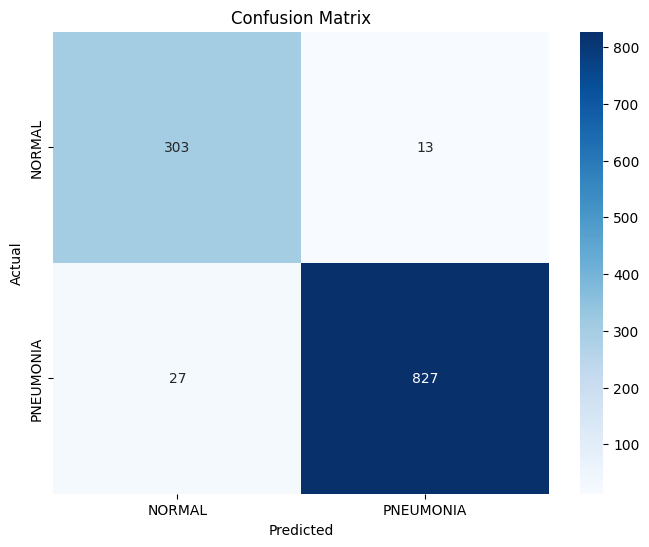

Threshold: 0.75
74/74 [==============================] - 2s 19ms/step - loss: 0.0904 - accuracy: 0.9675 - recall: 0.9754 - precision: 0.9800
Test Accuracy: 0.9675213694572449
Test Loss: 0.0903937891125679
Length predictions: 1170
Hand calculated accuracy: 0.9615
Accuracy: 0.9615384615384616
Precision: 0.9891172914147521
Recall: 0.9578454332552693


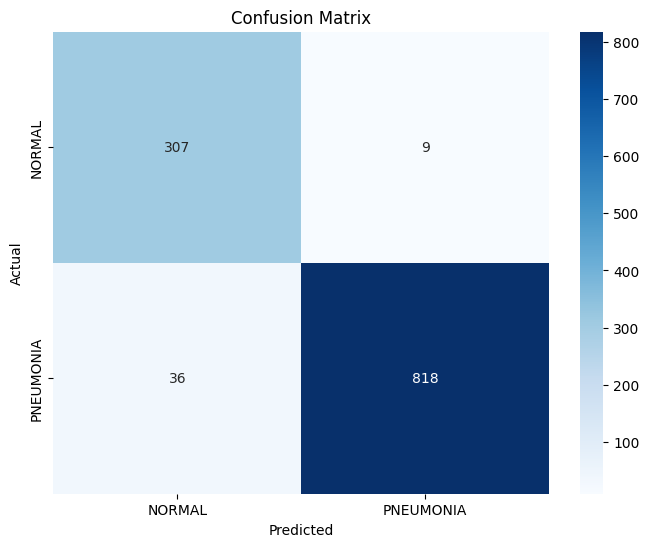

Threshold: 0.9
74/74 [==============================] - 2s 20ms/step - loss: 0.0904 - accuracy: 0.9675 - recall: 0.9754 - precision: 0.9800
Test Accuracy: 0.9675213694572449
Test Loss: 0.09039387851953506
Length predictions: 1170
Hand calculated accuracy: 0.9427
Accuracy: 0.9427350427350427
Precision: 0.9912609238451935
Recall: 0.9297423887587822


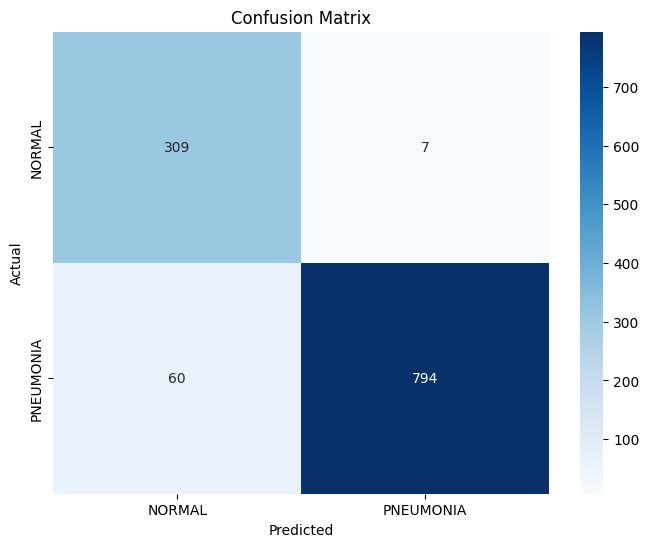

Threshold: 0.95
74/74 [==============================] - 2s 19ms/step - loss: 0.0904 - accuracy: 0.9675 - recall: 0.9754 - precision: 0.9800
Test Accuracy: 0.9675213694572449
Test Loss: 0.09039388597011566
Length predictions: 1170
Hand calculated accuracy: 0.9282
Accuracy: 0.9282051282051282
Precision: 0.9923273657289002
Recall: 0.9086651053864169


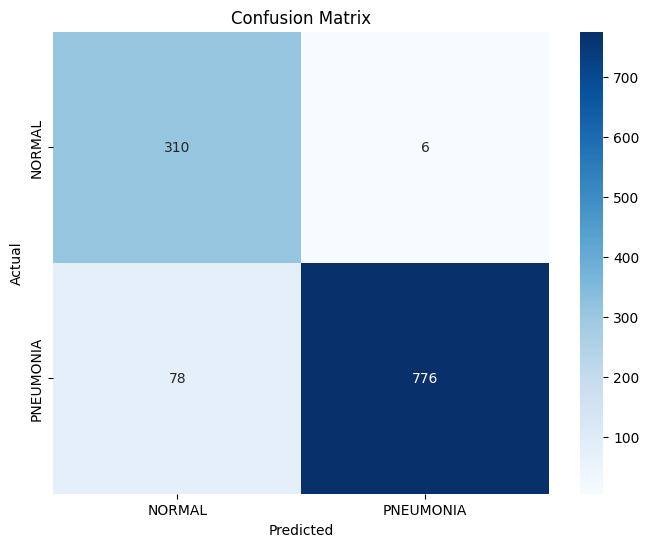

Threshold: 0.99
74/74 [==============================] - 2s 19ms/step - loss: 0.0904 - accuracy: 0.9675 - recall: 0.9754 - precision: 0.9800
Test Accuracy: 0.9675213694572449
Test Loss: 0.09039387851953506
Length predictions: 1170
Hand calculated accuracy: 0.8846
Accuracy: 0.8846153846153846
Precision: 0.9972337482710927
Recall: 0.8442622950819673


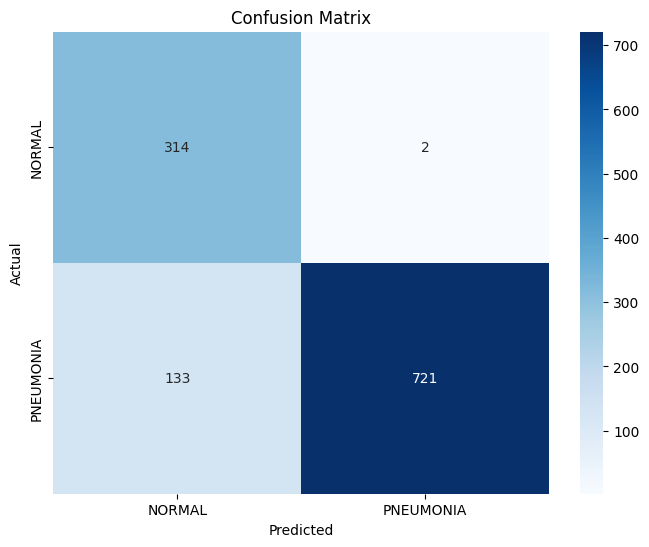

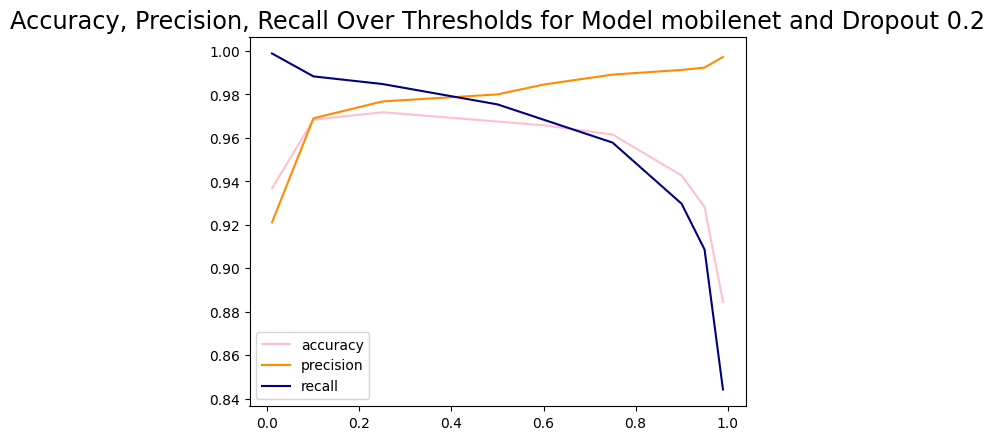



_______________


Model Name: mobilenet
Dropout: 0.5
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 28s 100ms/step - loss: 0.2078 - accuracy: 0.9151 - recall: 0.9468 - precision: 0.9374 - val_loss: 0.1237 - val_accuracy: 0.9557 - val_recall: 0.9766 - val_precision: 0.9631
Epoch 2/4
257/257 [==============================] - 25s 98ms/step - loss: 0.1111 - accuracy: 0.9590 - recall: 0.9712 - precision: 0.9725 - val_loss: 0.1080 - val_accuracy: 0.9659 - val_recall: 0.9953 - val_precision: 0.9595
Epoch 3/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0795 - accuracy: 0.9707 - recall: 0.9803 - precision: 0.9796 - val_loss: 0.1001 - val_accuracy: 0.9710 - val_recall: 0.9720 - val_precision: 0.9881
Epoch 4/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0483 - accuracy: 0.9834 - recall: 0.9876 - precision: 0.9896 - val_los

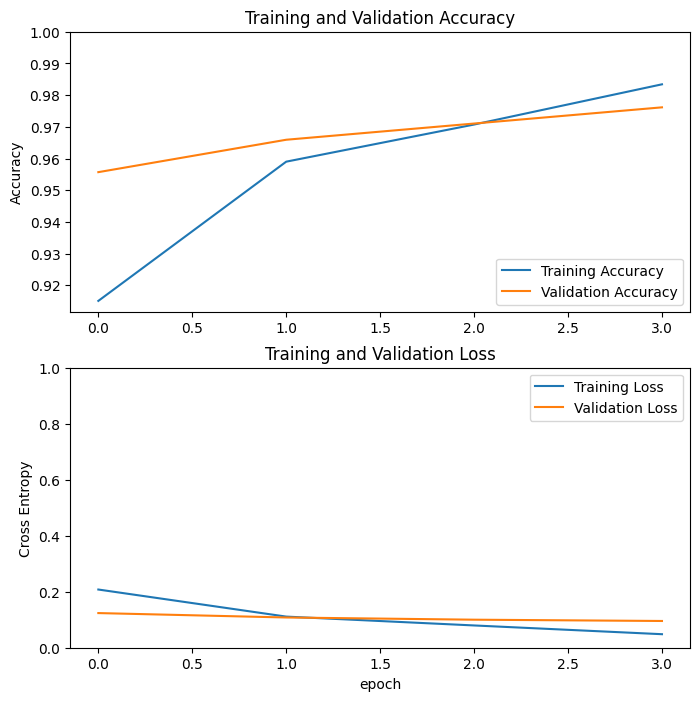

Threshold: 0.01
74/74 [==============================] - 1s 19ms/step - loss: 0.1190 - accuracy: 0.9744 - recall: 0.9895 - precision: 0.9758
Test Accuracy: 0.9743589758872986
Test Loss: 0.11897208541631699
Length predictions: 1170
Hand calculated accuracy: 0.9103
Accuracy: 0.9102564102564102
Precision: 0.8905109489051095
Recall: 1.0


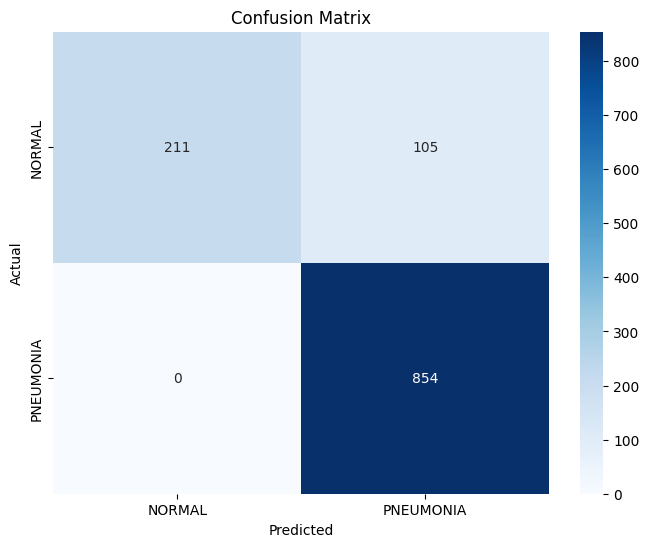

Threshold: 0.1
74/74 [==============================] - 1s 18ms/step - loss: 0.1190 - accuracy: 0.9744 - recall: 0.9895 - precision: 0.9758
Test Accuracy: 0.9743589758872986
Test Loss: 0.11897207051515579
Length predictions: 1170
Hand calculated accuracy: 0.9581
Accuracy: 0.9581196581196582
Precision: 0.9497206703910615
Recall: 0.9953161592505855


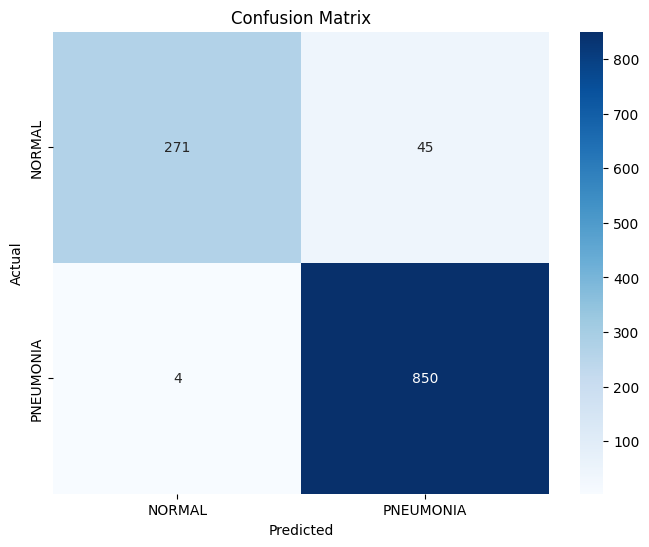

Threshold: 0.25
74/74 [==============================] - 1s 19ms/step - loss: 0.1190 - accuracy: 0.9744 - recall: 0.9895 - precision: 0.9758
Test Accuracy: 0.9743589758872986
Test Loss: 0.11897211521863937
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9680729760547321
Recall: 0.9941451990632318


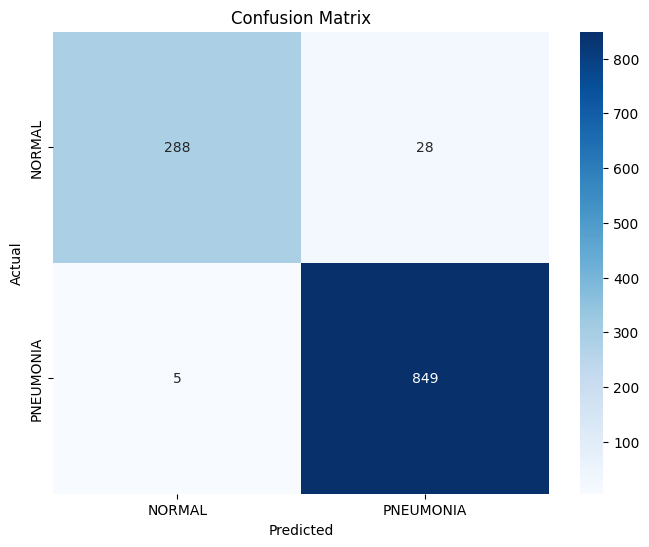

Threshold: 0.5
74/74 [==============================] - 1s 19ms/step - loss: 0.1190 - accuracy: 0.9744 - recall: 0.9895 - precision: 0.9758
Test Accuracy: 0.9743589758872986
Test Loss: 0.11897190660238266
Length predictions: 1170
Hand calculated accuracy: 0.9744
Accuracy: 0.9743589743589743
Precision: 0.9757505773672055
Recall: 0.9894613583138173


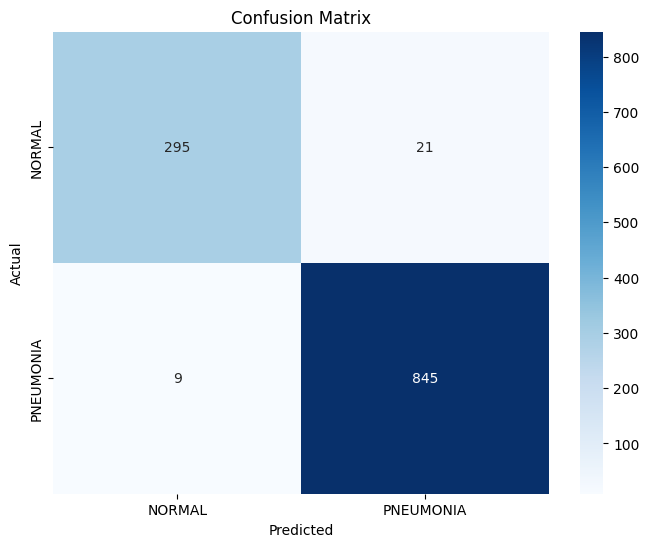

Threshold: 0.6
74/74 [==============================] - 1s 19ms/step - loss: 0.1190 - accuracy: 0.9744 - recall: 0.9895 - precision: 0.9758
Test Accuracy: 0.9743589758872986
Test Loss: 0.11897207051515579
Length predictions: 1170
Hand calculated accuracy: 0.9761
Accuracy: 0.976068376068376
Precision: 0.9780092592592593
Recall: 0.9894613583138173


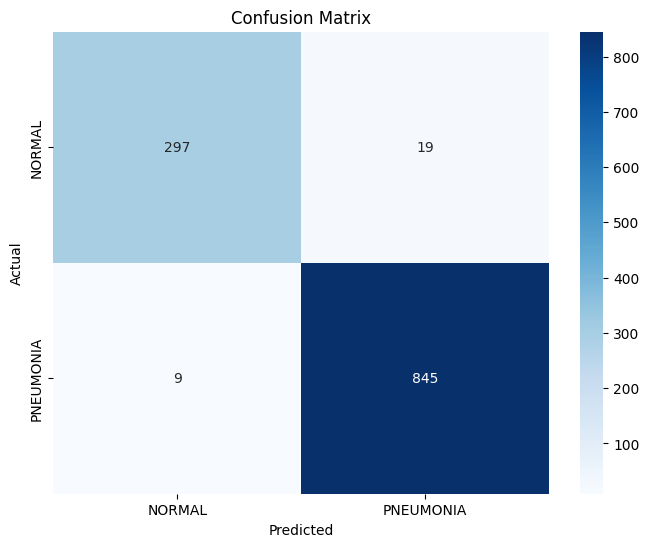

Threshold: 0.75
74/74 [==============================] - 1s 19ms/step - loss: 0.1190 - accuracy: 0.9744 - recall: 0.9895 - precision: 0.9758
Test Accuracy: 0.9743589758872986
Test Loss: 0.1189720630645752
Length predictions: 1170
Hand calculated accuracy: 0.9744
Accuracy: 0.9743589743589743
Precision: 0.9779582366589327
Recall: 0.9871194379391101


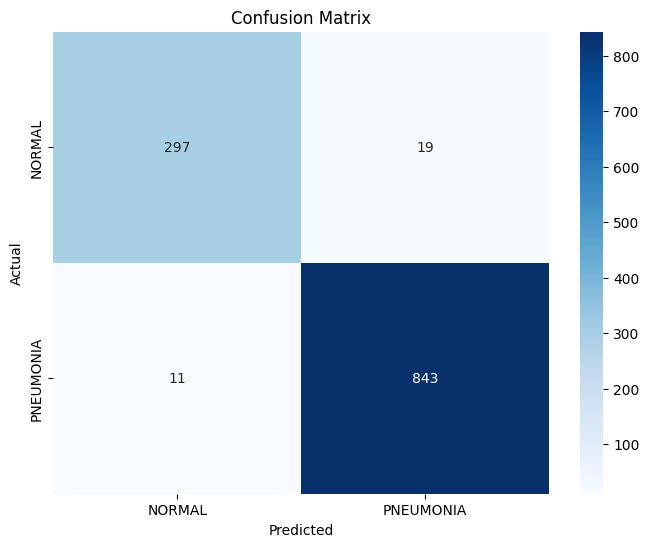

Threshold: 0.9
74/74 [==============================] - 1s 18ms/step - loss: 0.1190 - accuracy: 0.9744 - recall: 0.9895 - precision: 0.9758
Test Accuracy: 0.9743589758872986
Test Loss: 0.11897208541631699
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.982373678025852
Recall: 0.9789227166276346


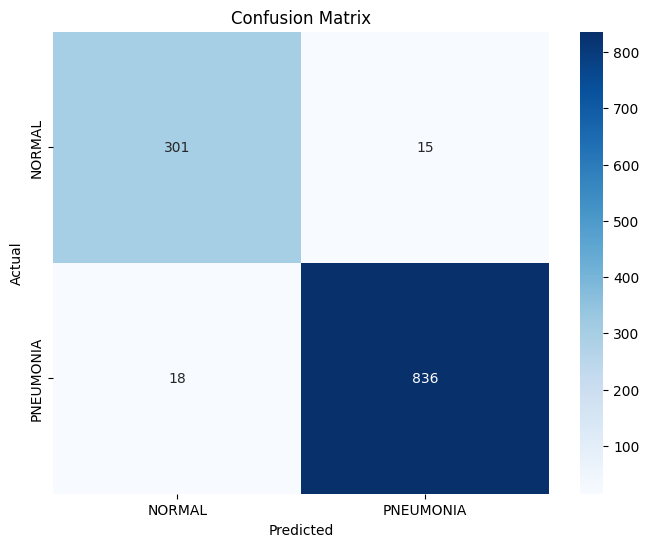

Threshold: 0.95
74/74 [==============================] - 1s 19ms/step - loss: 0.1190 - accuracy: 0.9744 - recall: 0.9895 - precision: 0.9758
Test Accuracy: 0.9743589758872986
Test Loss: 0.11897207051515579
Length predictions: 1170
Hand calculated accuracy: 0.9675
Accuracy: 0.9675213675213675
Precision: 0.9834123222748815
Recall: 0.9718969555035128


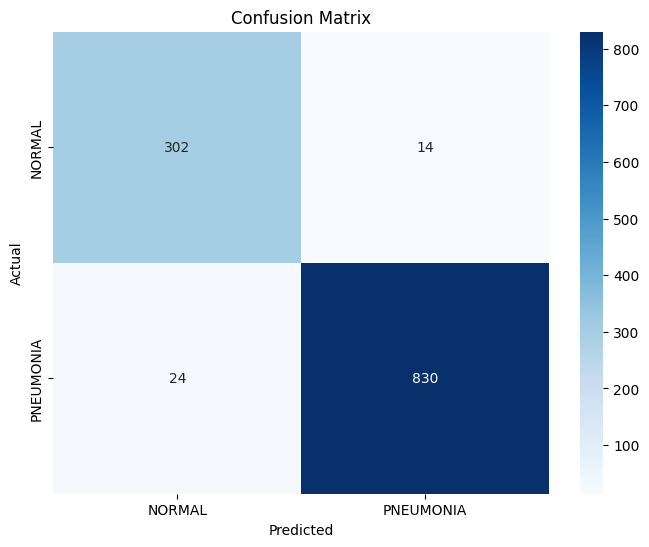

Threshold: 0.99
74/74 [==============================] - 1s 18ms/step - loss: 0.1190 - accuracy: 0.9744 - recall: 0.9895 - precision: 0.9758
Test Accuracy: 0.9743589758872986
Test Loss: 0.11897143721580505
Length predictions: 1170
Hand calculated accuracy: 0.9504
Accuracy: 0.9504273504273504
Precision: 0.9865525672371638
Recall: 0.9449648711943794


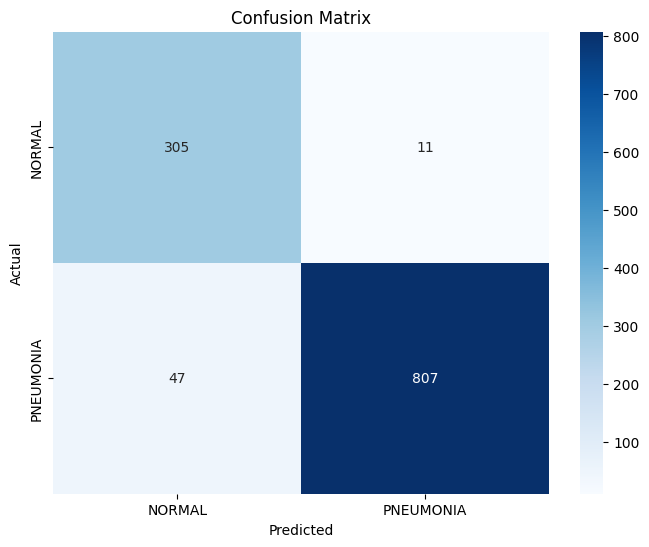

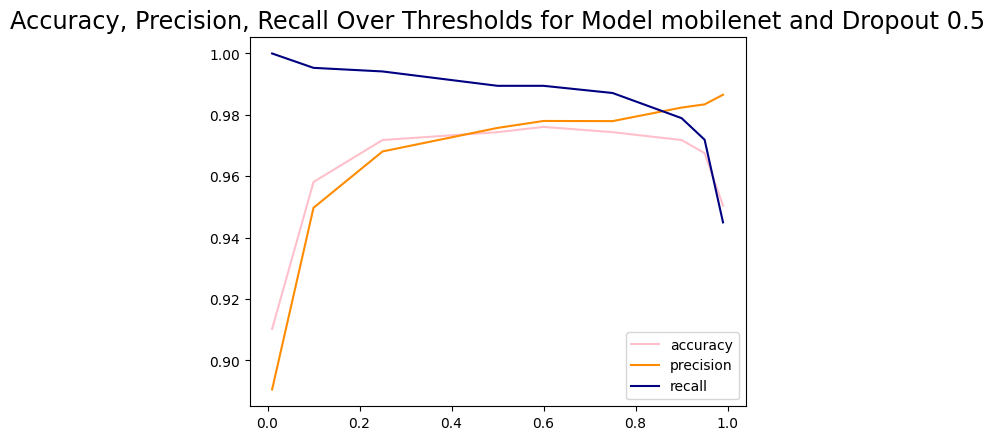



_______________


Model Name: mobilenet
Dropout: 0.7
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 28s 102ms/step - loss: 0.2172 - accuracy: 0.9168 - recall: 0.9482 - precision: 0.9385 - val_loss: 0.1490 - val_accuracy: 0.9489 - val_recall: 0.9439 - val_precision: 0.9854
Epoch 2/4
257/257 [==============================] - 25s 98ms/step - loss: 0.1276 - accuracy: 0.9534 - recall: 0.9679 - precision: 0.9682 - val_loss: 0.0947 - val_accuracy: 0.9625 - val_recall: 0.9626 - val_precision: 0.9856
Epoch 3/4
257/257 [==============================] - 26s 99ms/step - loss: 0.0947 - accuracy: 0.9661 - recall: 0.9773 - precision: 0.9763 - val_loss: 0.1088 - val_accuracy: 0.9642 - val_recall: 0.9790 - val_precision: 0.9722
Epoch 4/4
257/257 [==============================] - 26s 99ms/step - loss: 0.0630 - accuracy: 0.9795 - recall: 0.9856 - precision: 0.9863 - val_los

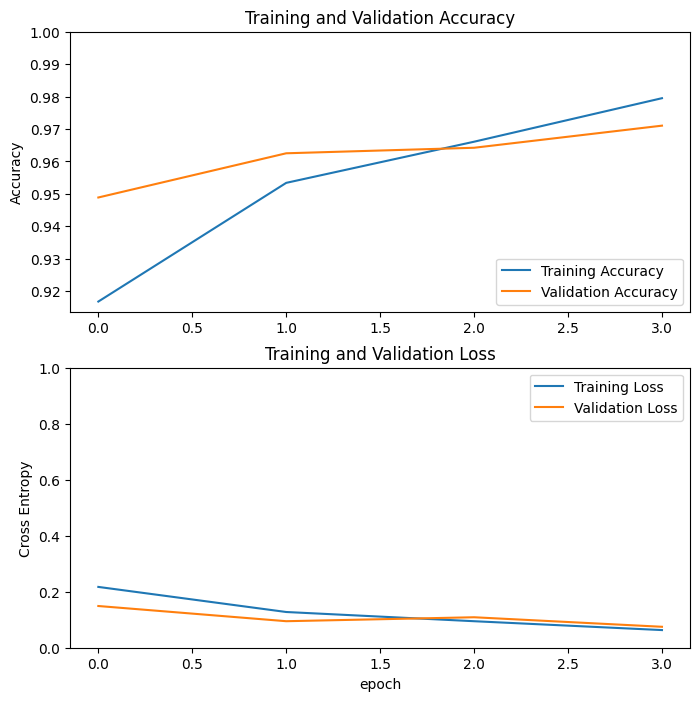

Threshold: 0.01
74/74 [==============================] - 2s 19ms/step - loss: 0.1064 - accuracy: 0.9726 - recall: 0.9848 - precision: 0.9779
Test Accuracy: 0.9726495742797852
Test Loss: 0.10644998401403427
Length predictions: 1170
Hand calculated accuracy: 0.9274
Accuracy: 0.9273504273504274
Precision: 0.9129967776584318
Recall: 0.9953161592505855


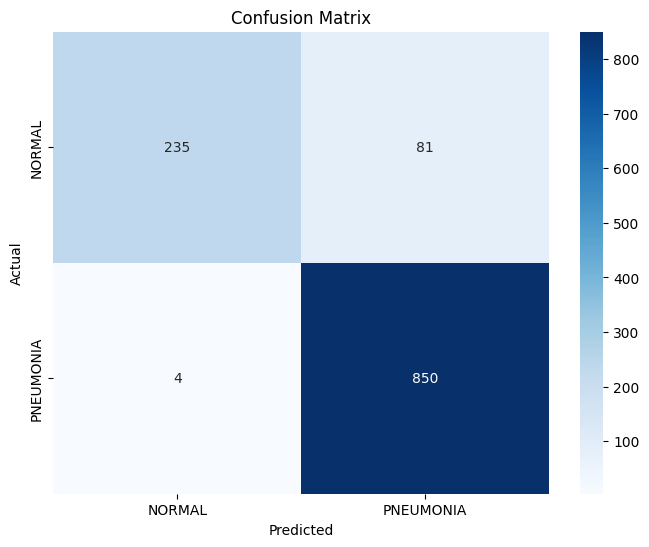

Threshold: 0.1
74/74 [==============================] - 2s 20ms/step - loss: 0.1064 - accuracy: 0.9726 - recall: 0.9848 - precision: 0.9779
Test Accuracy: 0.9726495742797852
Test Loss: 0.10644867271184921
Length predictions: 1170
Hand calculated accuracy: 0.9624
Accuracy: 0.9623931623931624
Precision: 0.9581447963800905
Recall: 0.9918032786885246


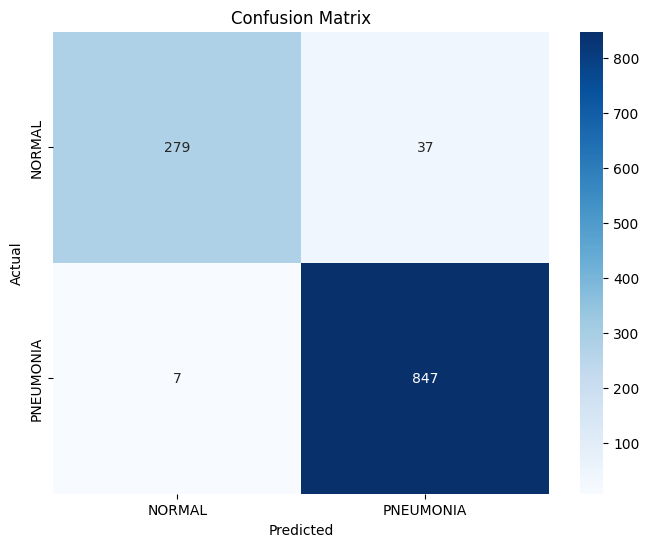

Threshold: 0.25
74/74 [==============================] - 1s 19ms/step - loss: 0.1064 - accuracy: 0.9726 - recall: 0.9848 - precision: 0.9779
Test Accuracy: 0.9726495742797852
Test Loss: 0.1064499020576477
Length predictions: 1170
Hand calculated accuracy: 0.9709
Accuracy: 0.9709401709401709
Precision: 0.9712643678160919
Recall: 0.9894613583138173


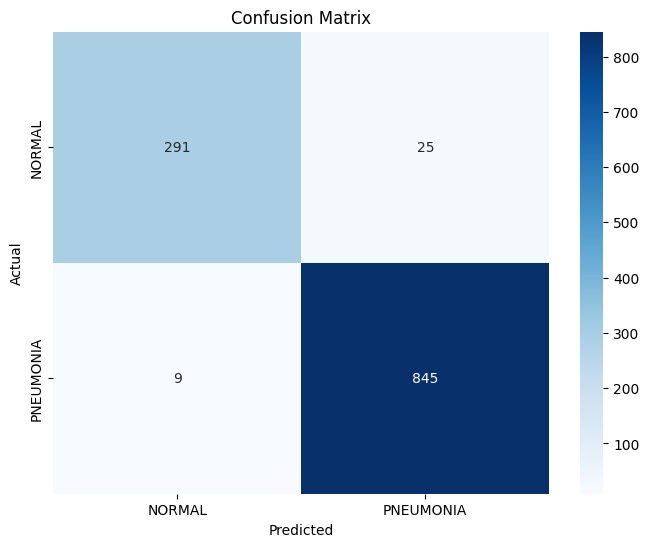

Threshold: 0.5
74/74 [==============================] - 1s 19ms/step - loss: 0.1065 - accuracy: 0.9726 - recall: 0.9848 - precision: 0.9779
Test Accuracy: 0.9726495742797852
Test Loss: 0.10645000636577606
Length predictions: 1170
Hand calculated accuracy: 0.9726
Accuracy: 0.9726495726495726
Precision: 0.977906976744186
Recall: 0.9847775175644028


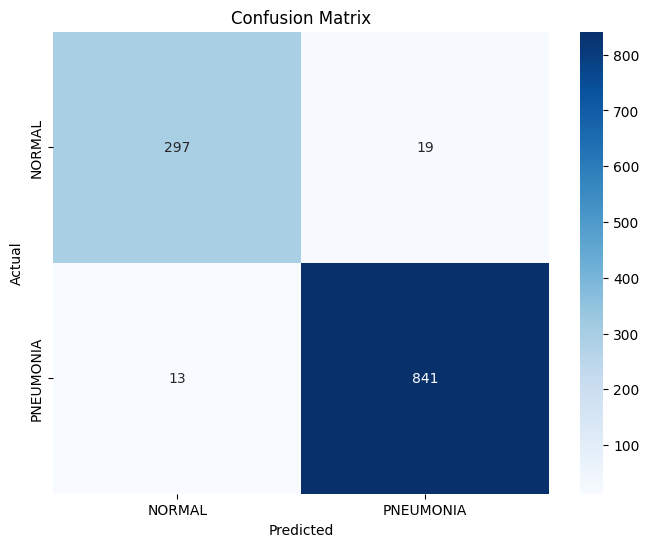

Threshold: 0.6
74/74 [==============================] - 2s 19ms/step - loss: 0.1064 - accuracy: 0.9726 - recall: 0.9848 - precision: 0.9779
Test Accuracy: 0.9726495742797852
Test Loss: 0.10644996911287308
Length predictions: 1170
Hand calculated accuracy: 0.9701
Accuracy: 0.9700854700854701
Precision: 0.9789473684210527
Recall: 0.9800936768149883


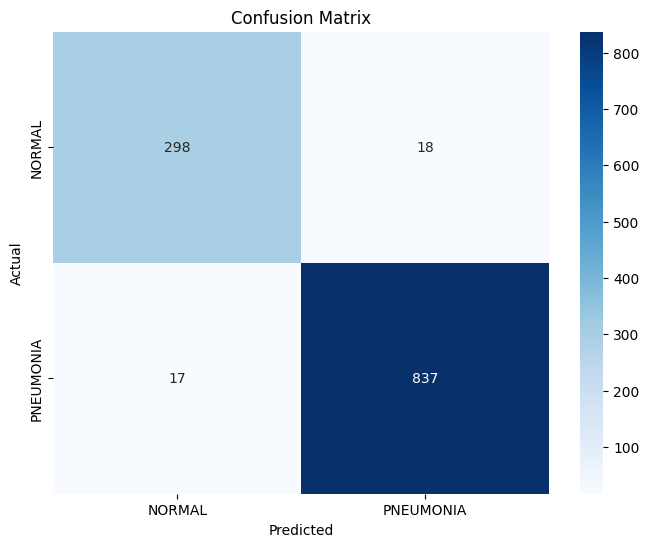

Threshold: 0.75
74/74 [==============================] - 1s 19ms/step - loss: 0.1064 - accuracy: 0.9726 - recall: 0.9848 - precision: 0.9779
Test Accuracy: 0.9726495742797852
Test Loss: 0.10644997656345367
Length predictions: 1170
Hand calculated accuracy: 0.9658
Accuracy: 0.9658119658119658
Precision: 0.9799528301886793
Recall: 0.9730679156908665


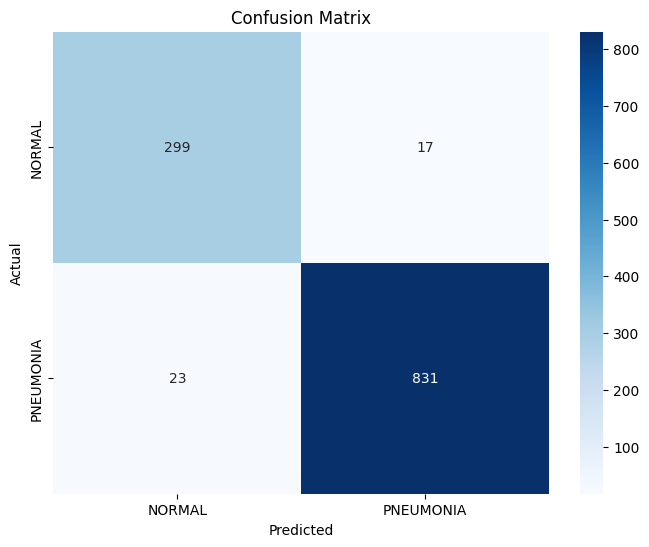

Threshold: 0.9
74/74 [==============================] - 1s 19ms/step - loss: 0.1064 - accuracy: 0.9726 - recall: 0.9848 - precision: 0.9779
Test Accuracy: 0.9726495742797852
Test Loss: 0.10644996166229248
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.98562874251497
Recall: 0.9637002341920374


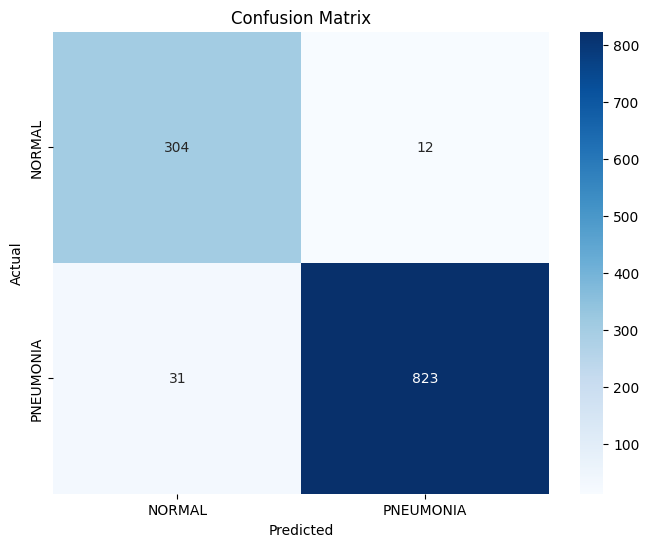

Threshold: 0.95
74/74 [==============================] - 2s 19ms/step - loss: 0.1064 - accuracy: 0.9726 - recall: 0.9848 - precision: 0.9779
Test Accuracy: 0.9726495742797852
Test Loss: 0.10644996166229248
Length predictions: 1170
Hand calculated accuracy: 0.9547
Accuracy: 0.9547008547008548
Precision: 0.9878197320341048
Recall: 0.949648711943794


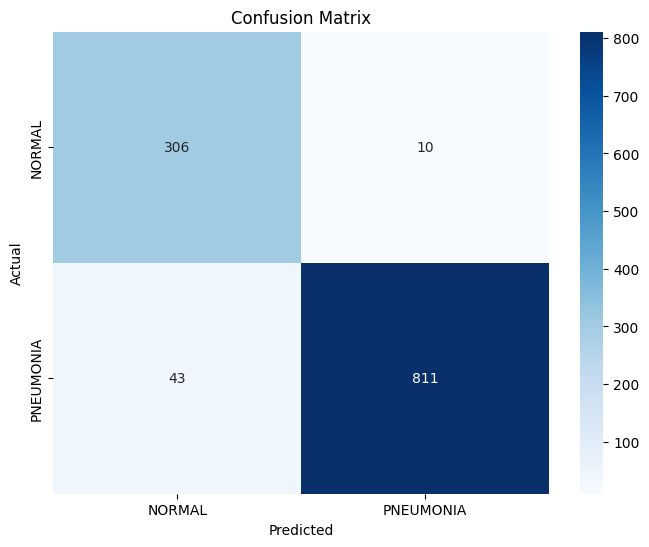

Threshold: 0.99
74/74 [==============================] - 2s 19ms/step - loss: 0.1064 - accuracy: 0.9726 - recall: 0.9848 - precision: 0.9779
Test Accuracy: 0.9726495742797852
Test Loss: 0.10644997656345367
Length predictions: 1170
Hand calculated accuracy: 0.9274
Accuracy: 0.9273504273504274
Precision: 0.9923175416133163
Recall: 0.9074941451990632


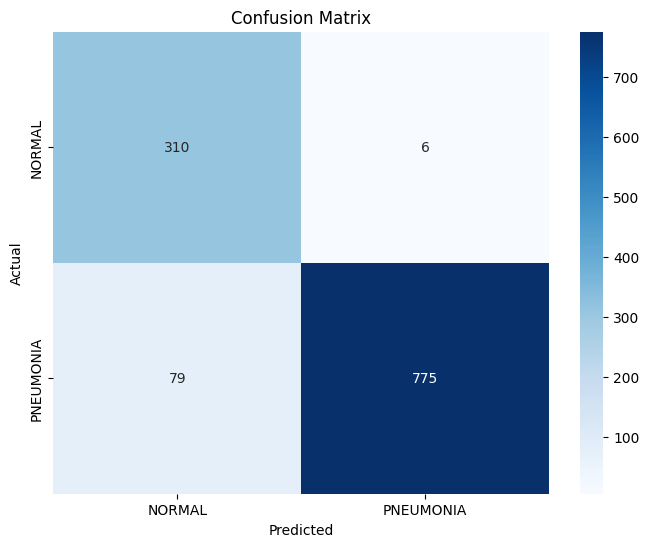

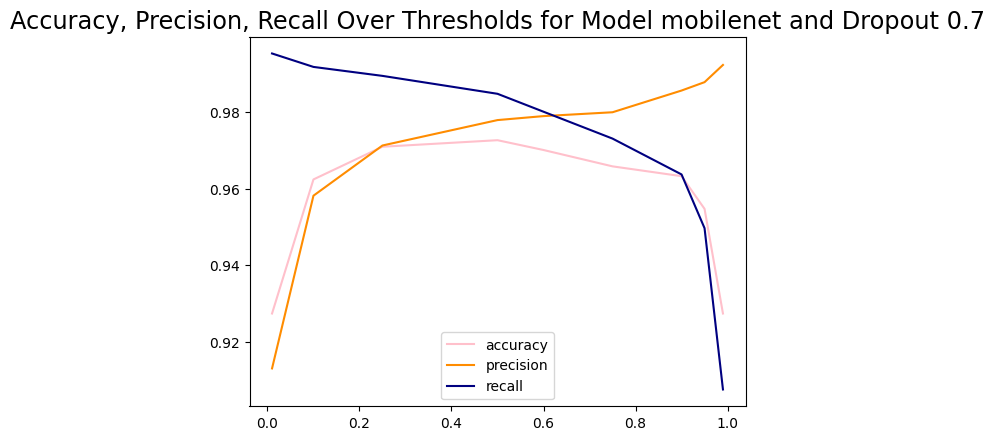



_______________


Model Name: mobilenet
Dropout: 0
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 27s 100ms/step - loss: 0.1888 - accuracy: 0.9212 - recall: 0.9498 - precision: 0.9426 - val_loss: 0.1070 - val_accuracy: 0.9591 - val_recall: 0.9860 - val_precision: 0.9591
Epoch 2/4
257/257 [==============================] - 25s 98ms/step - loss: 0.1002 - accuracy: 0.9639 - recall: 0.9749 - precision: 0.9756 - val_loss: 0.1169 - val_accuracy: 0.9523 - val_recall: 0.9907 - val_precision: 0.9464
Epoch 3/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0946 - accuracy: 0.9624 - recall: 0.9749 - precision: 0.9736 - val_loss: 0.1358 - val_accuracy: 0.9506 - val_recall: 0.9393 - val_precision: 0.9926
Epoch 4/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0604 - accuracy: 0.9778 - recall: 0.9840 - precision: 0.9856 - val_loss:

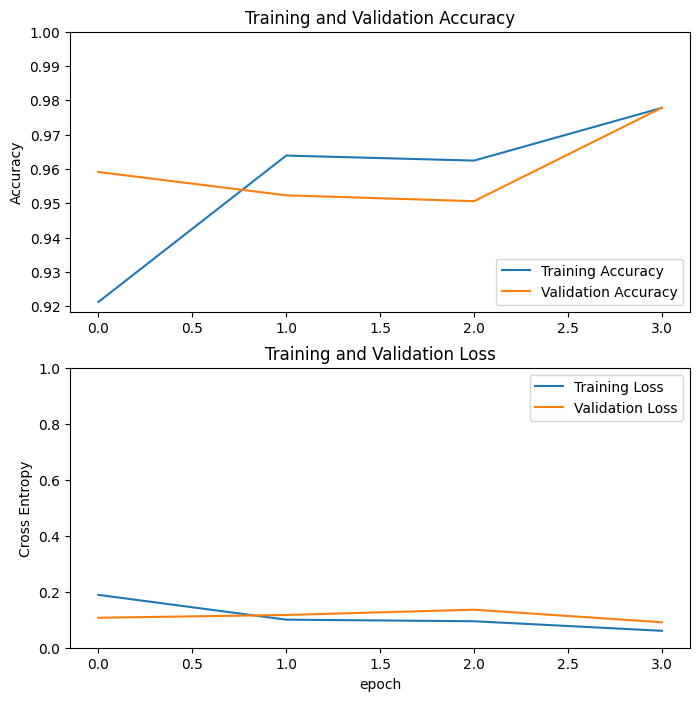

Threshold: 0.01
74/74 [==============================] - 2s 19ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9906 - precision: 0.9691
Test Accuracy: 0.9700854420661926
Test Loss: 0.09825365245342255
Length predictions: 1170
Hand calculated accuracy: 0.8915
Accuracy: 0.8914529914529915
Precision: 0.8705402650356778
Recall: 1.0


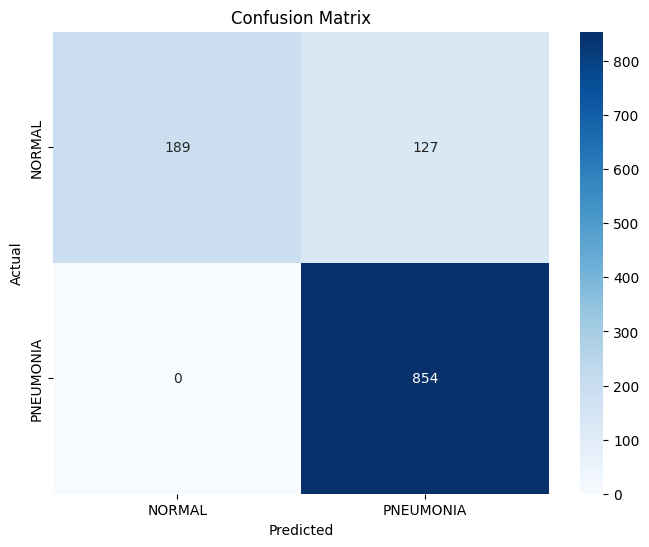

Threshold: 0.1
74/74 [==============================] - 1s 19ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9906 - precision: 0.9691
Test Accuracy: 0.9700854420661926
Test Loss: 0.09825358539819717
Length predictions: 1170
Hand calculated accuracy: 0.947
Accuracy: 0.947008547008547
Precision: 0.9342105263157895
Recall: 0.9976580796252927


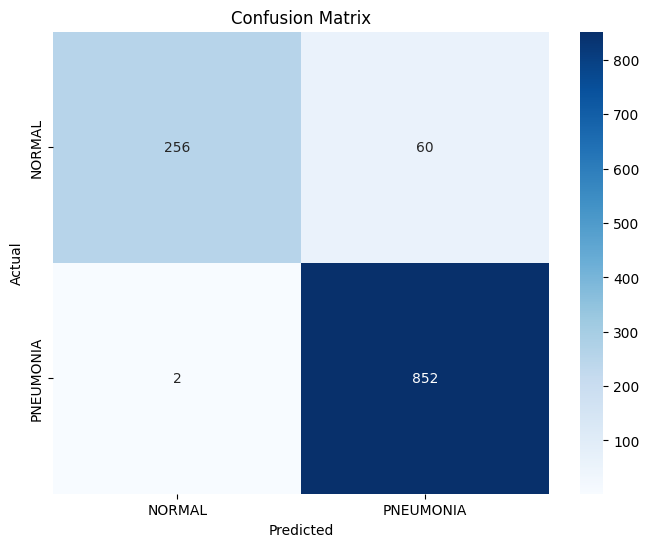

Threshold: 0.25
74/74 [==============================] - 2s 19ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9906 - precision: 0.9691
Test Accuracy: 0.9700854420661926
Test Loss: 0.09825362265110016
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9582863585118376
Recall: 0.9953161592505855


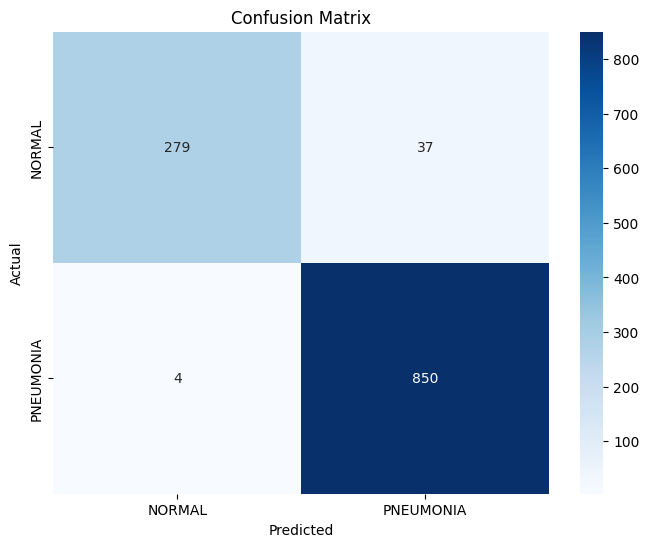

Threshold: 0.5
74/74 [==============================] - 2s 19ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9906 - precision: 0.9691
Test Accuracy: 0.9700854420661926
Test Loss: 0.09825361520051956
Length predictions: 1170
Hand calculated accuracy: 0.9701
Accuracy: 0.9700854700854701
Precision: 0.9690721649484536
Recall: 0.990632318501171


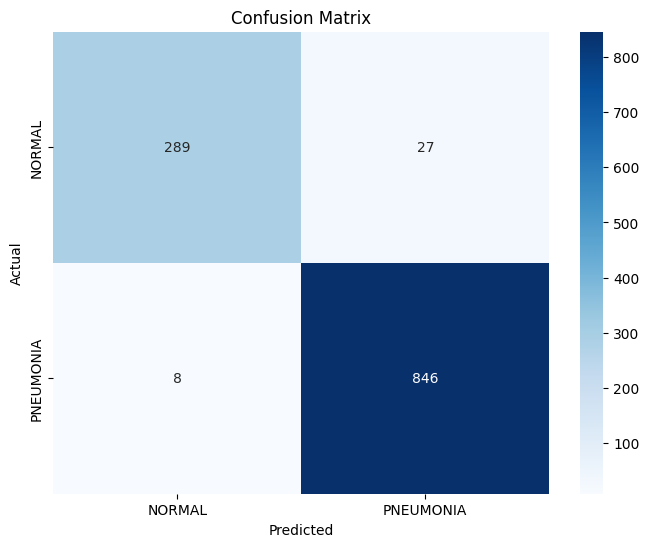

Threshold: 0.6
74/74 [==============================] - 2s 19ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9906 - precision: 0.9691
Test Accuracy: 0.9700854420661926
Test Loss: 0.09825361520051956
Length predictions: 1170
Hand calculated accuracy: 0.9735
Accuracy: 0.9735042735042735
Precision: 0.9746251441753172
Recall: 0.9894613583138173


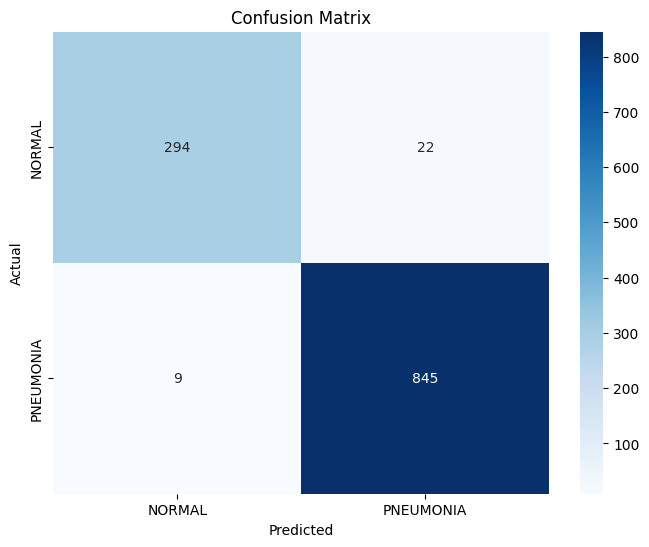

Threshold: 0.75
74/74 [==============================] - 1s 19ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9906 - precision: 0.9691
Test Accuracy: 0.9700854420661926
Test Loss: 0.09825344383716583
Length predictions: 1170
Hand calculated accuracy: 0.9709
Accuracy: 0.9709401709401709
Precision: 0.9778554778554779
Recall: 0.9824355971896955


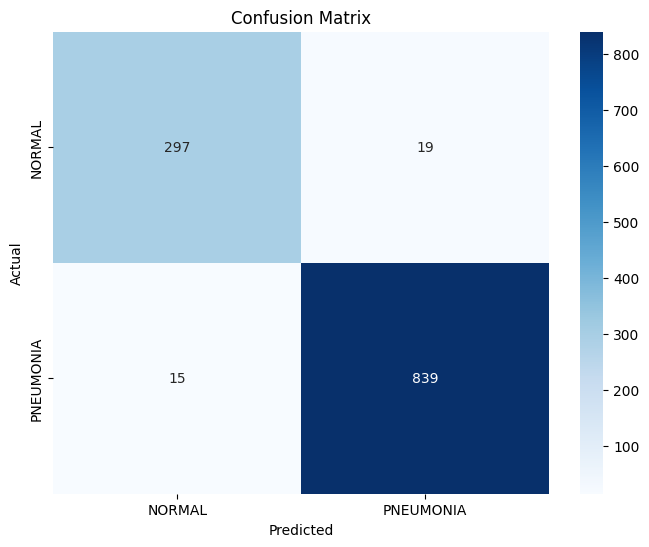

Threshold: 0.9
74/74 [==============================] - 1s 18ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9906 - precision: 0.9691
Test Accuracy: 0.9700854420661926
Test Loss: 0.09825395792722702
Length predictions: 1170
Hand calculated accuracy: 0.9709
Accuracy: 0.9709401709401709
Precision: 0.9823529411764705
Recall: 0.977751756440281


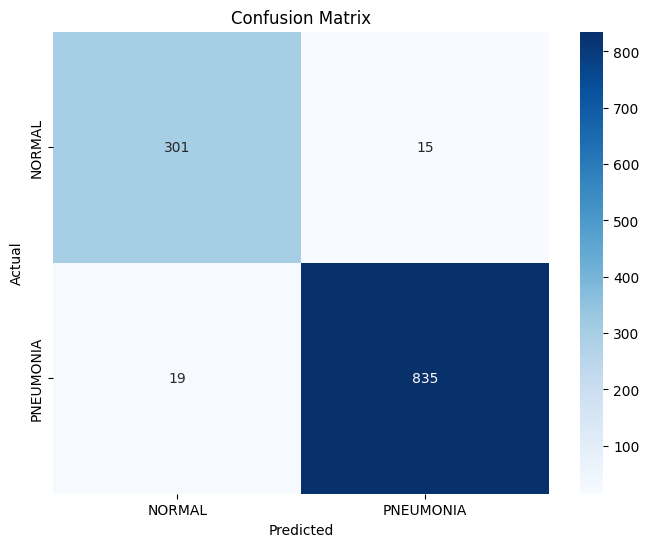

Threshold: 0.95
74/74 [==============================] - 2s 19ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9906 - precision: 0.9691
Test Accuracy: 0.9700854420661926
Test Loss: 0.09825361520051956
Length predictions: 1170
Hand calculated accuracy: 0.9658
Accuracy: 0.9658119658119658
Precision: 0.9845238095238096
Recall: 0.968384074941452


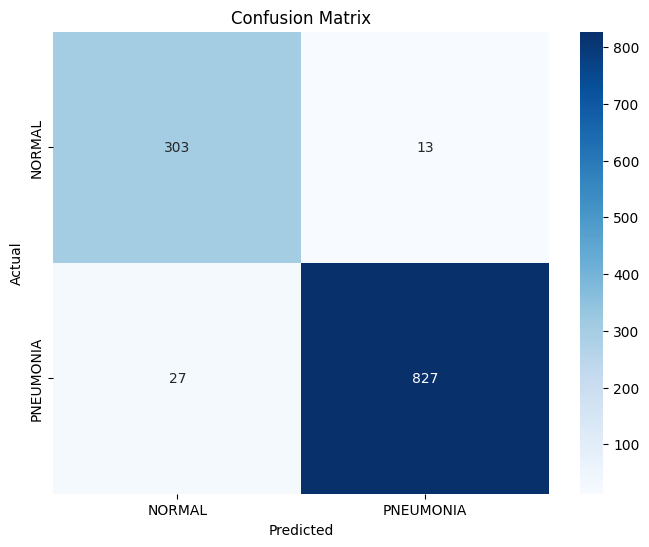

Threshold: 0.99
74/74 [==============================] - 1s 19ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9906 - precision: 0.9691
Test Accuracy: 0.9700854420661926
Test Loss: 0.09825362265110016
Length predictions: 1170
Hand calculated accuracy: 0.9487
Accuracy: 0.9487179487179487
Precision: 0.9901234567901235
Recall: 0.9391100702576113


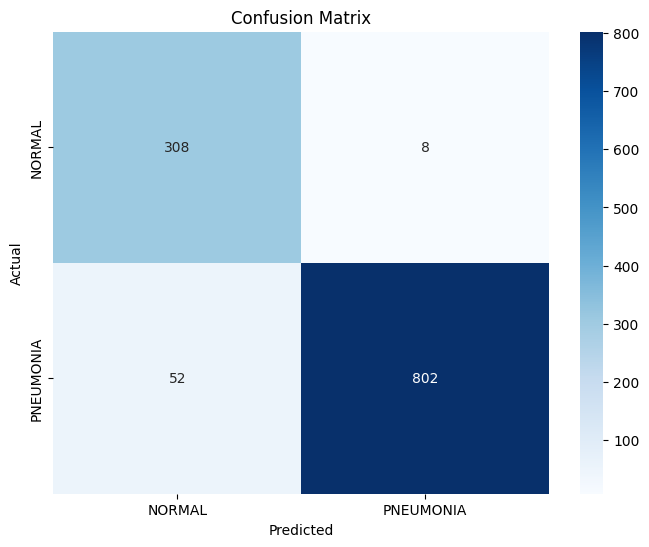

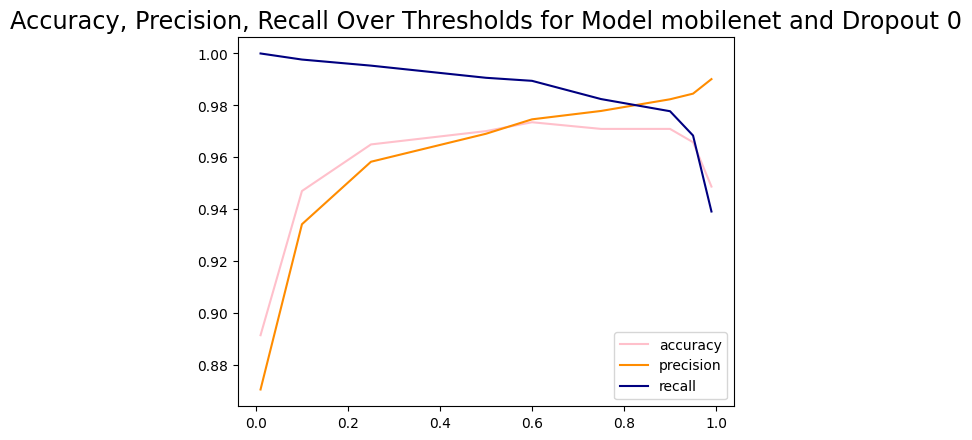



_______________


Model Name: mobilenet
Dropout: 0.2
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 27s 99ms/step - loss: 0.1800 - accuracy: 0.9241 - recall: 0.9512 - precision: 0.9452 - val_loss: 0.1152 - val_accuracy: 0.9506 - val_recall: 0.9486 - val_precision: 0.9831
Epoch 2/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0902 - accuracy: 0.9685 - recall: 0.9789 - precision: 0.9780 - val_loss: 0.1566 - val_accuracy: 0.9421 - val_recall: 0.9276 - val_precision: 0.9925
Epoch 3/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0753 - accuracy: 0.9715 - recall: 0.9803 - precision: 0.9806 - val_loss: 0.1137 - val_accuracy: 0.9676 - val_recall: 0.9977 - val_precision: 0.9596
Epoch 4/4
257/257 [==============================] - 25s 98ms/step - loss: 0.0634 - accuracy: 0.9773 - recall: 0.9860 - precision: 0.9830 - val_loss

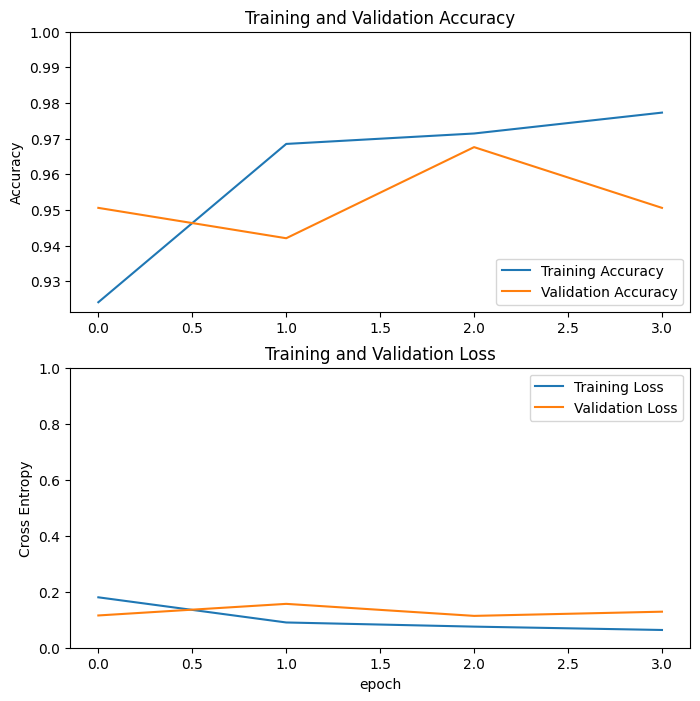

Threshold: 0.01
74/74 [==============================] - 1s 19ms/step - loss: 0.1162 - accuracy: 0.9632 - recall: 0.9649 - precision: 0.9845
Test Accuracy: 0.9632478356361389
Test Loss: 0.11621901392936707
Length predictions: 1170
Hand calculated accuracy: 0.9521
Accuracy: 0.9521367521367521
Precision: 0.9413716814159292
Recall: 0.9964871194379391


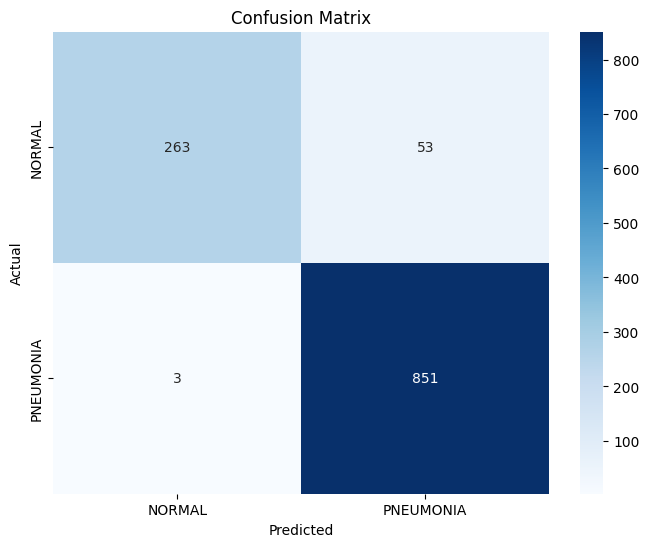

Threshold: 0.1
74/74 [==============================] - 1s 19ms/step - loss: 0.1162 - accuracy: 0.9632 - recall: 0.9649 - precision: 0.9845
Test Accuracy: 0.9632478356361389
Test Loss: 0.11621974408626556
Length predictions: 1170
Hand calculated accuracy: 0.9675
Accuracy: 0.9675213675213675
Precision: 0.9722222222222222
Recall: 0.9836065573770492


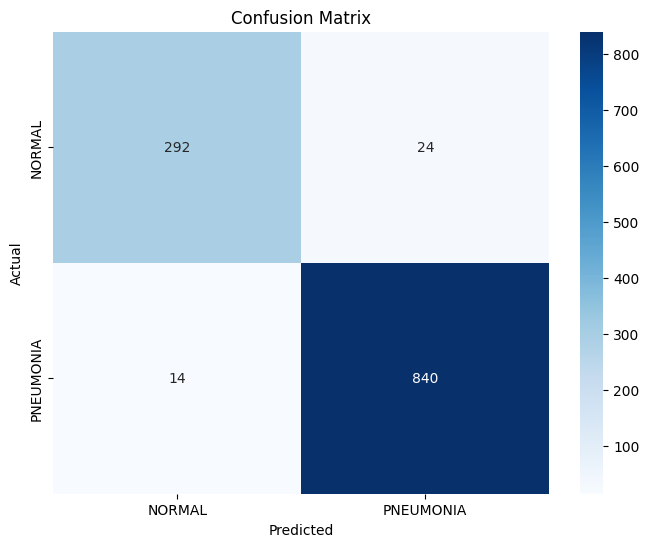

Threshold: 0.25
74/74 [==============================] - 1s 19ms/step - loss: 0.1162 - accuracy: 0.9632 - recall: 0.9649 - precision: 0.9845
Test Accuracy: 0.9632478356361389
Test Loss: 0.11621972918510437
Length predictions: 1170
Hand calculated accuracy: 0.9675
Accuracy: 0.9675213675213675
Precision: 0.9811320754716981
Recall: 0.9742388758782201


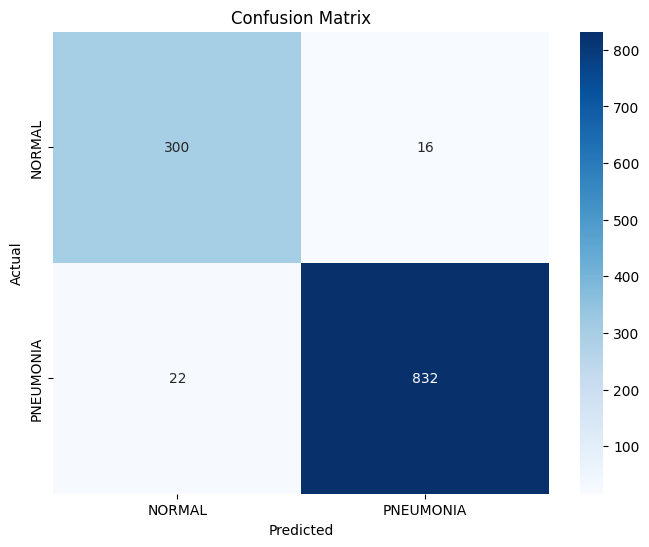

Threshold: 0.5
74/74 [==============================] - 1s 18ms/step - loss: 0.1162 - accuracy: 0.9632 - recall: 0.9649 - precision: 0.9845
Test Accuracy: 0.9632478356361389
Test Loss: 0.11621974408626556
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.984468339307049
Recall: 0.9648711943793911


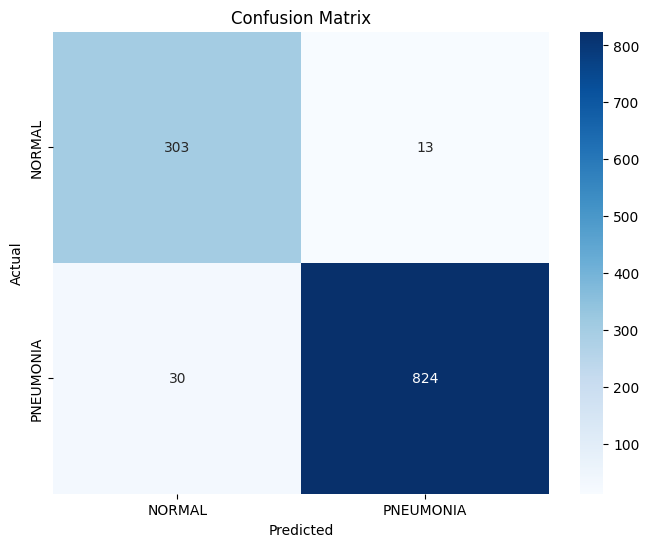

Threshold: 0.6
74/74 [==============================] - 1s 18ms/step - loss: 0.1162 - accuracy: 0.9632 - recall: 0.9649 - precision: 0.9845
Test Accuracy: 0.9632478356361389
Test Loss: 0.11621974408626556
Length predictions: 1170
Hand calculated accuracy: 0.9615
Accuracy: 0.9615384615384616
Precision: 0.98676293622142
Recall: 0.9601873536299765


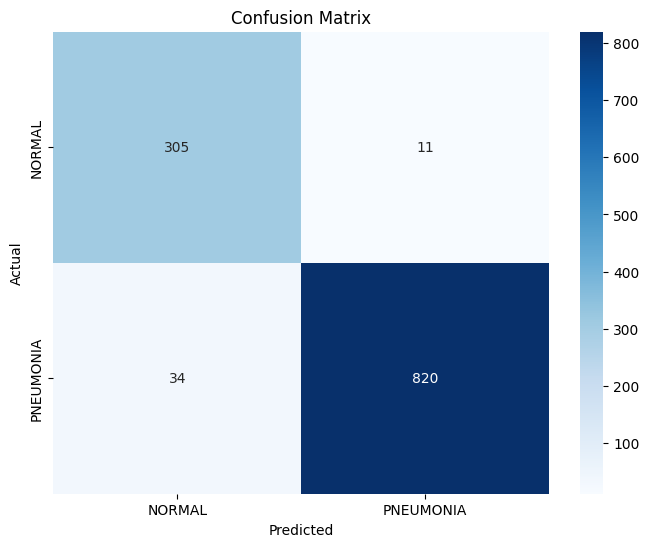

Threshold: 0.75
74/74 [==============================] - 1s 19ms/step - loss: 0.1162 - accuracy: 0.9632 - recall: 0.9649 - precision: 0.9845
Test Accuracy: 0.9632478356361389
Test Loss: 0.11621975153684616
Length predictions: 1170
Hand calculated accuracy: 0.9521
Accuracy: 0.9521367521367521
Precision: 0.9877750611246944
Recall: 0.9461358313817331


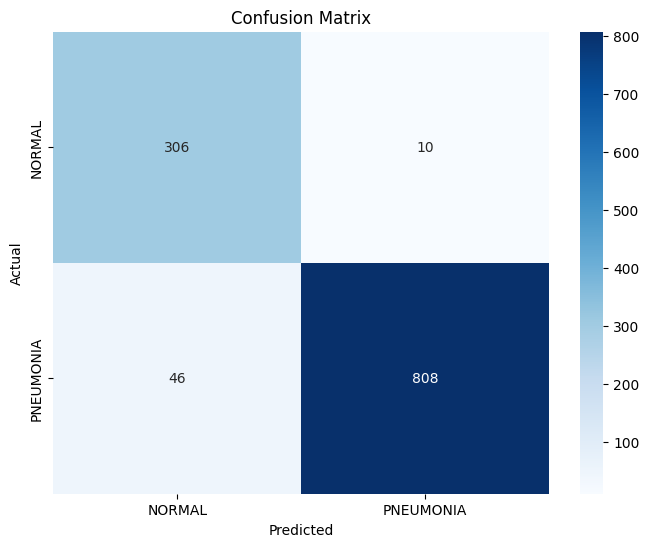

Threshold: 0.9
74/74 [==============================] - 1s 19ms/step - loss: 0.1162 - accuracy: 0.9632 - recall: 0.9649 - precision: 0.9845
Test Accuracy: 0.9632478356361389
Test Loss: 0.11621974408626556
Length predictions: 1170
Hand calculated accuracy: 0.9291
Accuracy: 0.9290598290598291
Precision: 0.9898348157560356
Recall: 0.9121779859484778


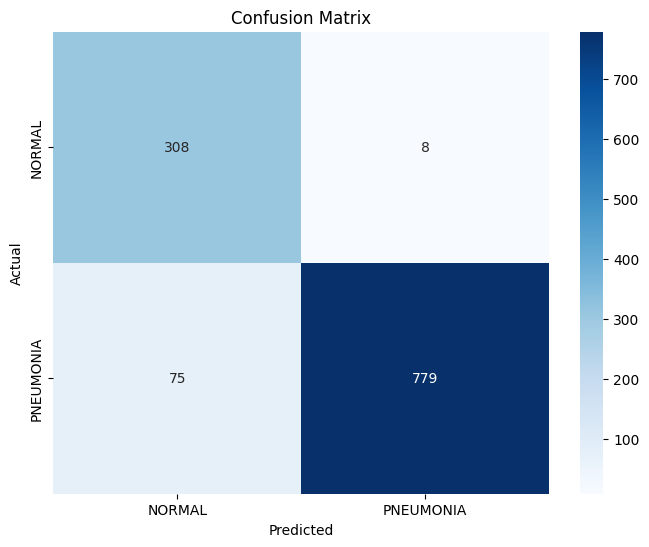

Threshold: 0.95
74/74 [==============================] - 1s 19ms/step - loss: 0.1162 - accuracy: 0.9632 - recall: 0.9649 - precision: 0.9845
Test Accuracy: 0.9632478356361389
Test Loss: 0.11621972918510437
Length predictions: 1170
Hand calculated accuracy: 0.9094
Accuracy: 0.9094017094017094
Precision: 0.9934036939313984
Recall: 0.8817330210772834


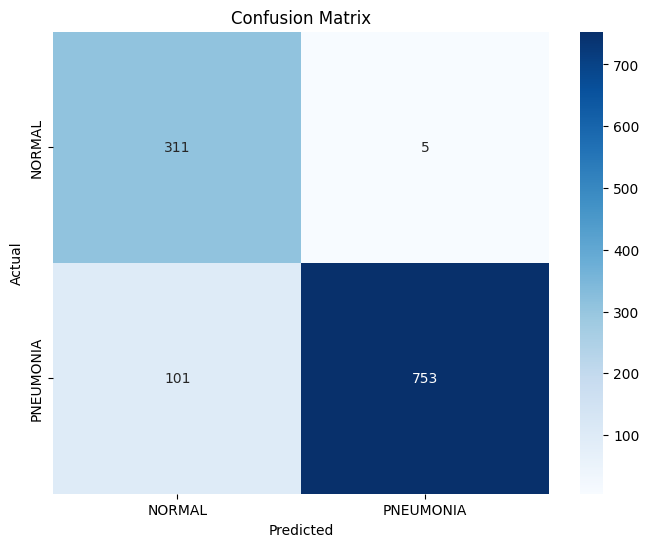

Threshold: 0.99
74/74 [==============================] - 1s 18ms/step - loss: 0.1162 - accuracy: 0.9632 - recall: 0.9649 - precision: 0.9845
Test Accuracy: 0.9632478356361389
Test Loss: 0.11622023582458496
Length predictions: 1170
Hand calculated accuracy: 0.8282
Accuracy: 0.8282051282051283
Precision: 0.9984732824427481
Recall: 0.765807962529274


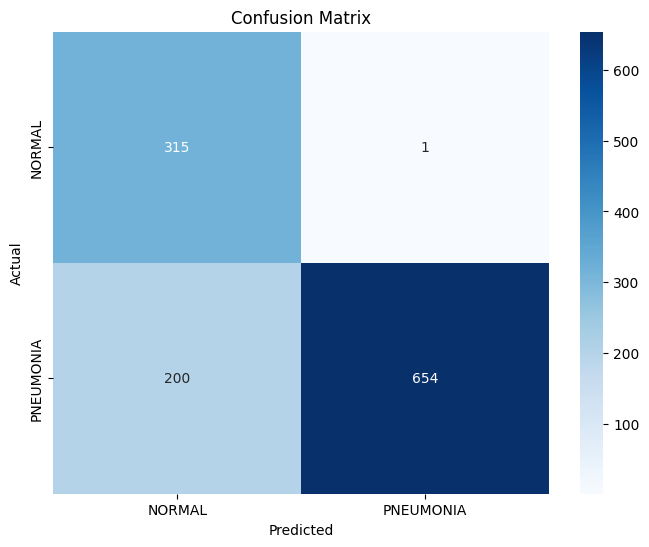

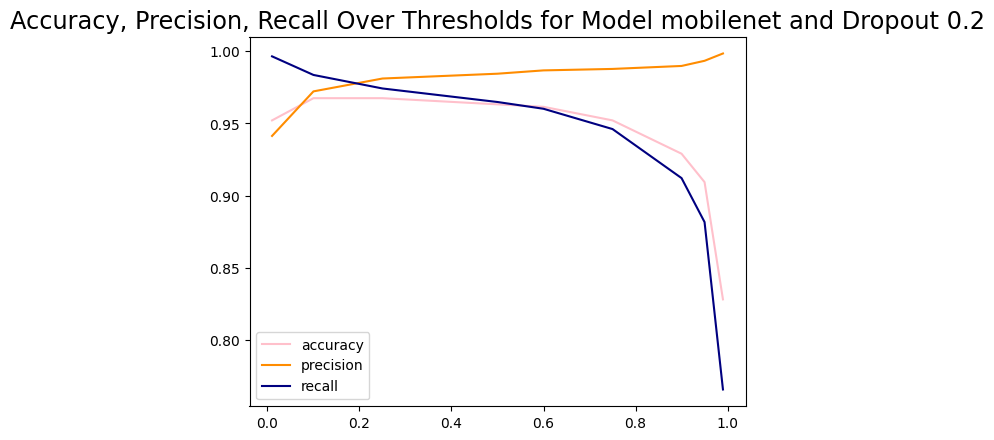



_______________


Model Name: mobilenet
Dropout: 0.5
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 27s 99ms/step - loss: 0.1889 - accuracy: 0.9195 - recall: 0.9502 - precision: 0.9401 - val_loss: 0.0974 - val_accuracy: 0.9625 - val_recall: 0.9673 - val_precision: 0.9810
Epoch 2/4
257/257 [==============================] - 26s 100ms/step - loss: 0.1156 - accuracy: 0.9615 - recall: 0.9729 - precision: 0.9742 - val_loss: 0.1106 - val_accuracy: 0.9557 - val_recall: 0.9509 - val_precision: 0.9879
Epoch 3/4
257/257 [==============================] - 26s 100ms/step - loss: 0.0734 - accuracy: 0.9746 - recall: 0.9809 - precision: 0.9842 - val_loss: 0.2177 - val_accuracy: 0.9267 - val_recall: 1.0000 - val_precision: 0.9087
Epoch 4/4
257/257 [==============================] - 26s 101ms/step - loss: 0.0625 - accuracy: 0.9812 - recall: 0.9870 - precision: 0.9873 - val_l

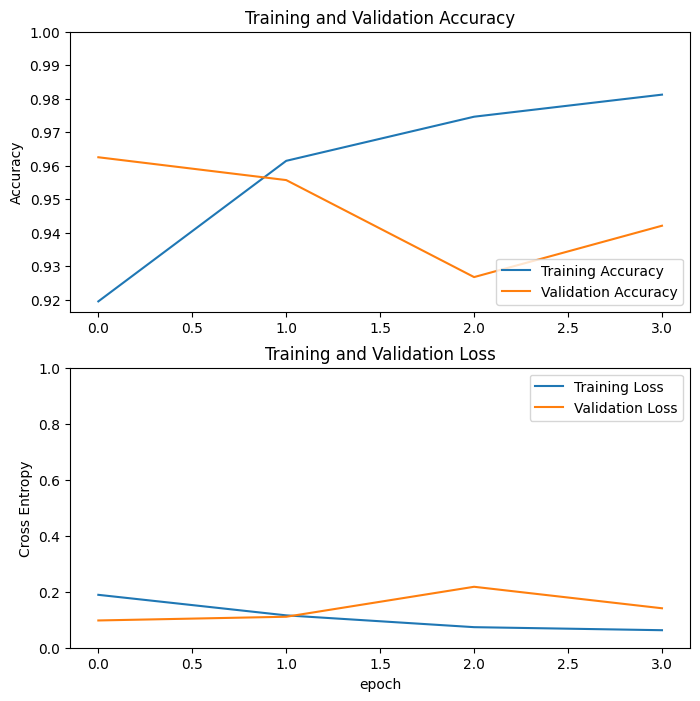

Threshold: 0.01
74/74 [==============================] - 2s 19ms/step - loss: 0.1512 - accuracy: 0.9470 - recall: 0.9379 - precision: 0.9889
Test Accuracy: 0.9470085501670837
Test Loss: 0.15121027827262878
Length predictions: 1170
Hand calculated accuracy: 0.9658
Accuracy: 0.9658119658119658
Precision: 0.9635535307517085
Recall: 0.990632318501171


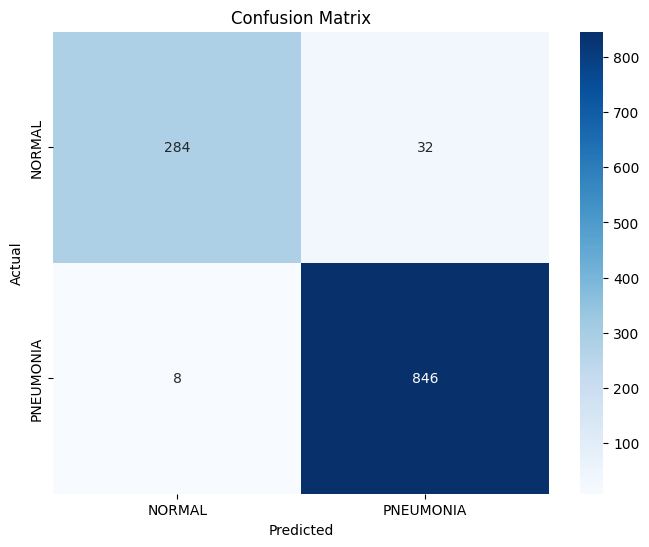

Threshold: 0.1
74/74 [==============================] - 1s 18ms/step - loss: 0.1512 - accuracy: 0.9470 - recall: 0.9379 - precision: 0.9889
Test Accuracy: 0.9470085501670837
Test Loss: 0.1512104719877243
Length predictions: 1170
Hand calculated accuracy: 0.9684
Accuracy: 0.9683760683760684
Precision: 0.9800235017626322
Recall: 0.9765807962529274


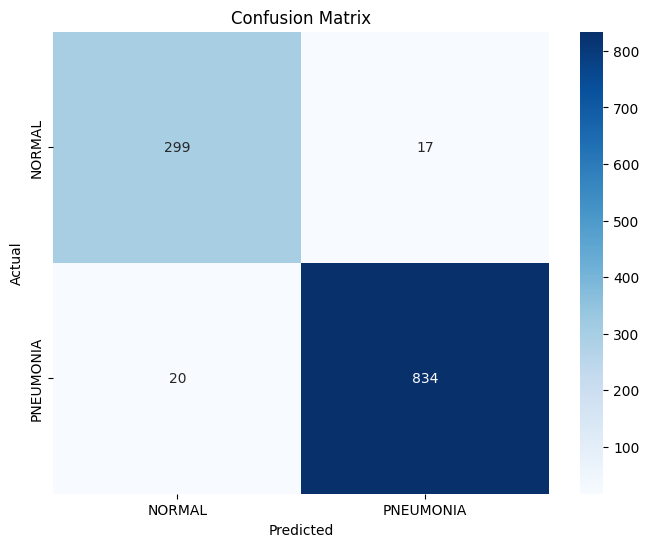

Threshold: 0.25
74/74 [==============================] - 2s 20ms/step - loss: 0.1512 - accuracy: 0.9470 - recall: 0.9379 - precision: 0.9889
Test Accuracy: 0.9470085501670837
Test Loss: 0.15121038258075714
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.98562874251497
Recall: 0.9637002341920374


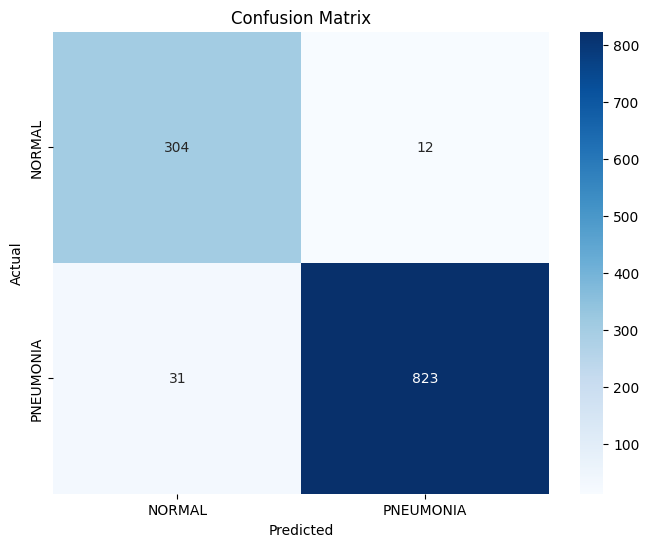

Threshold: 0.5
74/74 [==============================] - 1s 19ms/step - loss: 0.1512 - accuracy: 0.9470 - recall: 0.9379 - precision: 0.9889
Test Accuracy: 0.9470085501670837
Test Loss: 0.1512104719877243
Length predictions: 1170
Hand calculated accuracy: 0.947
Accuracy: 0.947008547008547
Precision: 0.9888888888888889
Recall: 0.9379391100702577


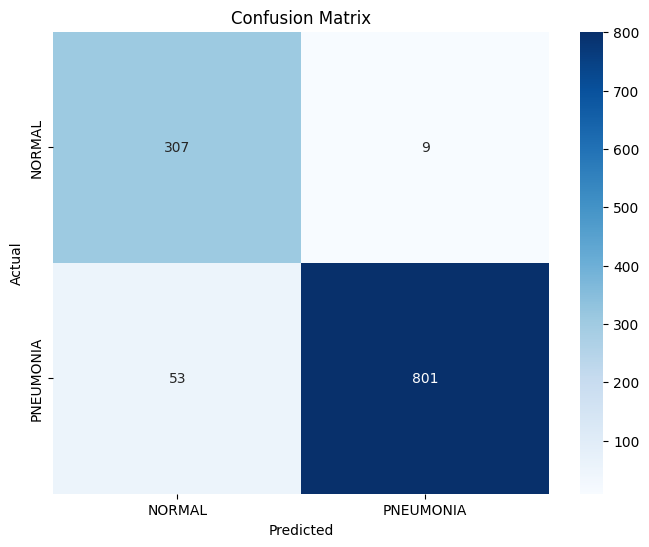

Threshold: 0.6
74/74 [==============================] - 2s 19ms/step - loss: 0.1512 - accuracy: 0.9470 - recall: 0.9379 - precision: 0.9889
Test Accuracy: 0.9470085501670837
Test Loss: 0.1512102633714676
Length predictions: 1170
Hand calculated accuracy: 0.9402
Accuracy: 0.9401709401709402
Precision: 0.9887780548628429
Recall: 0.9285714285714286


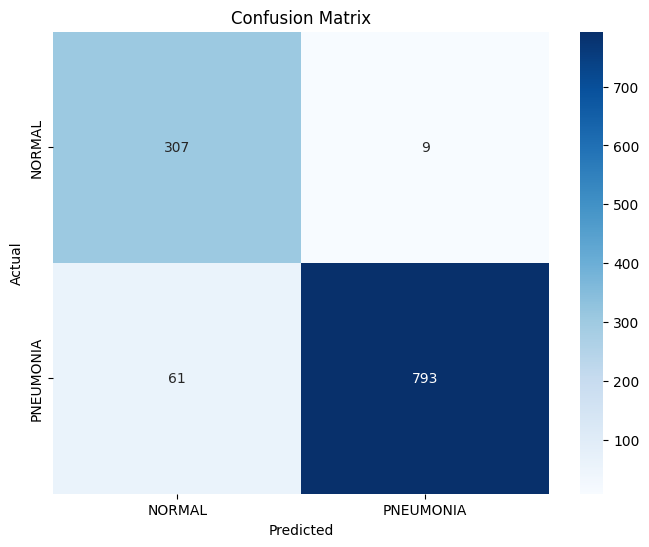

Threshold: 0.75
74/74 [==============================] - 2s 19ms/step - loss: 0.1512 - accuracy: 0.9470 - recall: 0.9379 - precision: 0.9889
Test Accuracy: 0.9470085501670837
Test Loss: 0.15121039748191833
Length predictions: 1170
Hand calculated accuracy: 0.9274
Accuracy: 0.9273504273504274
Precision: 0.9898089171974522
Recall: 0.9098360655737705


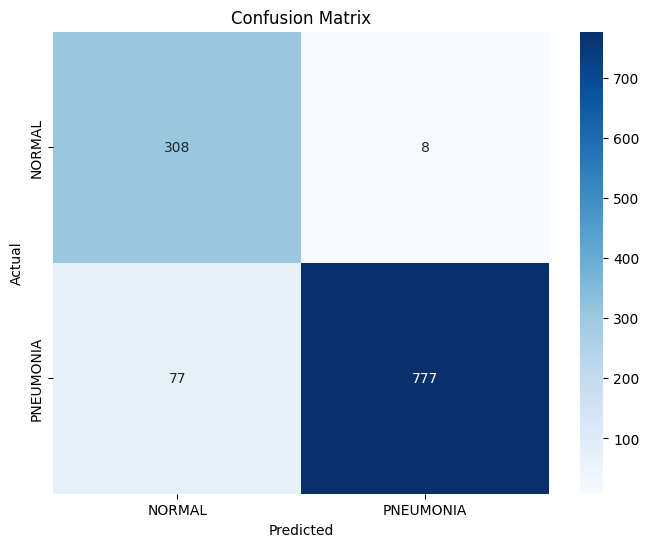

Threshold: 0.9
74/74 [==============================] - 2s 20ms/step - loss: 0.1512 - accuracy: 0.9470 - recall: 0.9379 - precision: 0.9889
Test Accuracy: 0.9470085501670837
Test Loss: 0.15121044218540192
Length predictions: 1170
Hand calculated accuracy: 0.9034
Accuracy: 0.9034188034188034
Precision: 0.9933422103861518
Recall: 0.8735362997658079


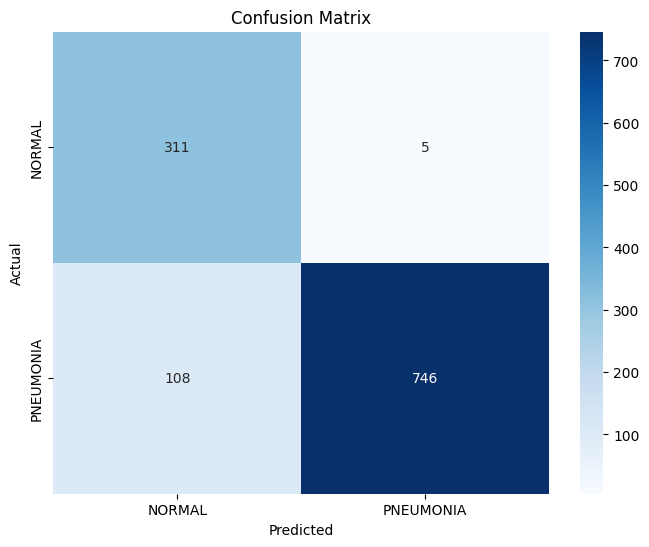

Threshold: 0.95
74/74 [==============================] - 1s 19ms/step - loss: 0.1512 - accuracy: 0.9470 - recall: 0.9379 - precision: 0.9889
Test Accuracy: 0.9470085501670837
Test Loss: 0.1512104719877243
Length predictions: 1170
Hand calculated accuracy: 0.8786
Accuracy: 0.8786324786324786
Precision: 0.9958217270194986
Recall: 0.8372365339578455


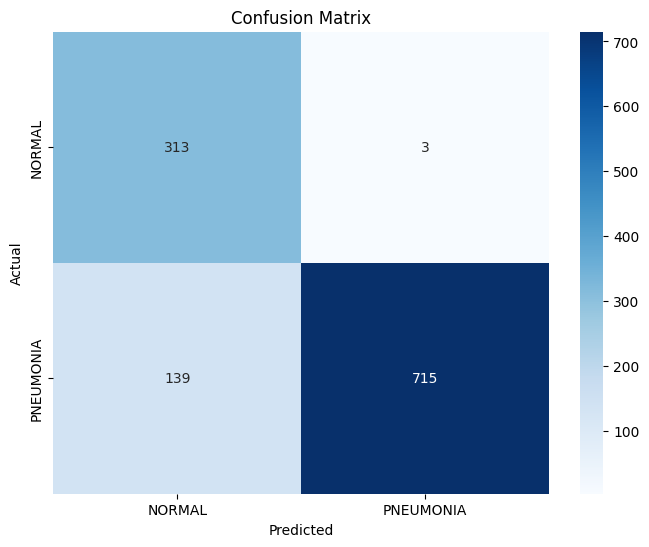

Threshold: 0.99
74/74 [==============================] - 2s 19ms/step - loss: 0.1512 - accuracy: 0.9470 - recall: 0.9379 - precision: 0.9889
Test Accuracy: 0.9470085501670837
Test Loss: 0.1512104719877243
Length predictions: 1170
Hand calculated accuracy: 0.7991
Accuracy: 0.7991452991452992
Precision: 0.998389694041868
Recall: 0.7259953161592506


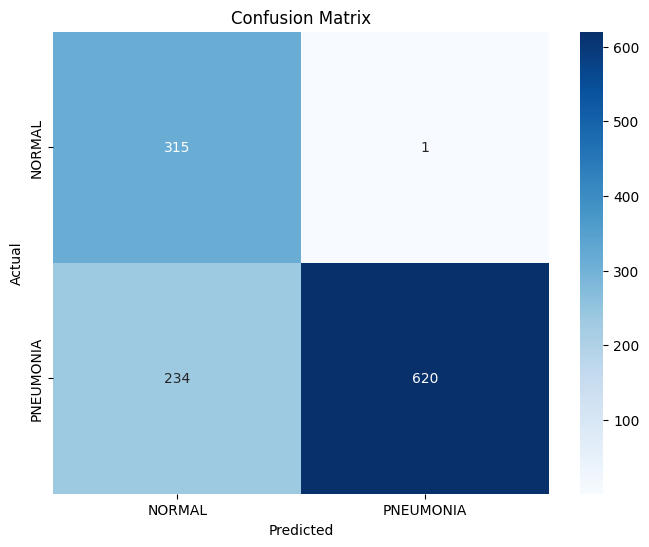

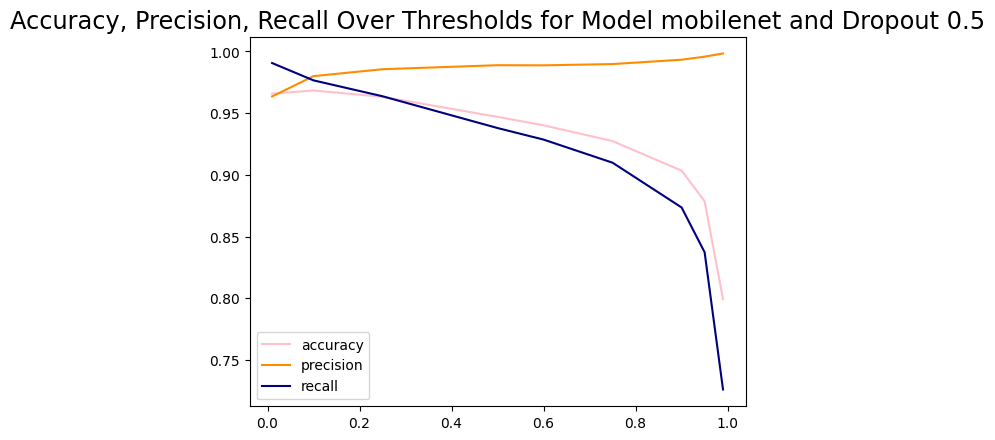



_______________


Model Name: mobilenet
Dropout: 0.7
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 28s 101ms/step - loss: 0.2273 - accuracy: 0.9058 - recall: 0.9405 - precision: 0.9311 - val_loss: 0.1288 - val_accuracy: 0.9455 - val_recall: 0.9393 - val_precision: 0.9853
Epoch 2/4
257/257 [==============================] - 26s 99ms/step - loss: 0.1197 - accuracy: 0.9563 - recall: 0.9729 - precision: 0.9674 - val_loss: 0.1041 - val_accuracy: 0.9574 - val_recall: 0.9579 - val_precision: 0.9832
Epoch 3/4
257/257 [==============================] - 26s 100ms/step - loss: 0.0951 - accuracy: 0.9702 - recall: 0.9789 - precision: 0.9802 - val_loss: 0.3032 - val_accuracy: 0.8807 - val_recall: 1.0000 - val_precision: 0.8594
Epoch 4/4
257/257 [==============================] - 26s 101ms/step - loss: 0.0829 - accuracy: 0.9690 - recall: 0.9769 - precision: 0.9805 - val_l

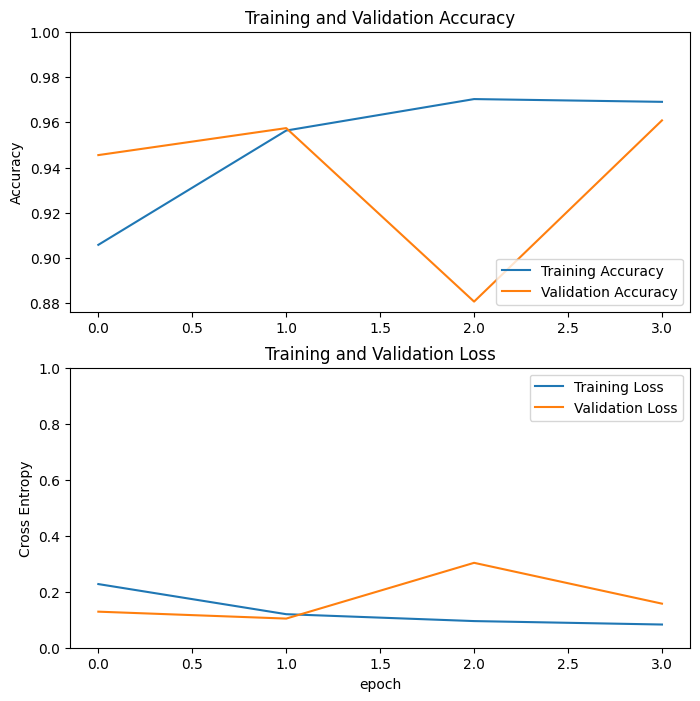

Threshold: 0.01
74/74 [==============================] - 1s 19ms/step - loss: 0.1503 - accuracy: 0.9641 - recall: 0.9883 - precision: 0.9635
Test Accuracy: 0.964102566242218
Test Loss: 0.1502903401851654
Length predictions: 1170
Hand calculated accuracy: 0.8085
Accuracy: 0.8085470085470086
Precision: 0.7922077922077922
Recall: 1.0


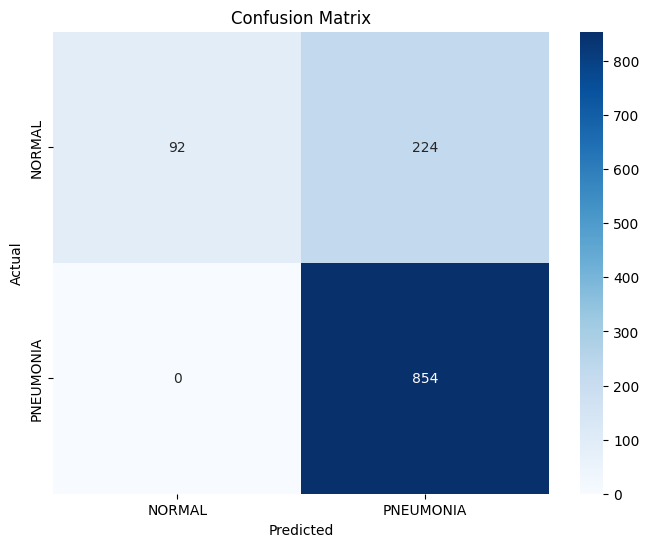

Threshold: 0.1
74/74 [==============================] - 1s 19ms/step - loss: 0.1503 - accuracy: 0.9641 - recall: 0.9883 - precision: 0.9635
Test Accuracy: 0.964102566242218
Test Loss: 0.150290384888649
Length predictions: 1170
Hand calculated accuracy: 0.9179
Accuracy: 0.9179487179487179
Precision: 0.8989473684210526
Recall: 1.0


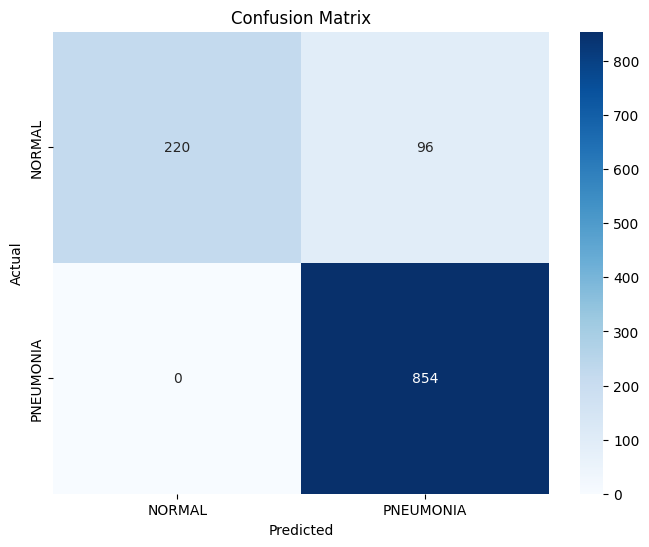

Threshold: 0.25
74/74 [==============================] - 1s 19ms/step - loss: 0.1503 - accuracy: 0.9641 - recall: 0.9883 - precision: 0.9635
Test Accuracy: 0.964102566242218
Test Loss: 0.150290384888649
Length predictions: 1170
Hand calculated accuracy: 0.9419
Accuracy: 0.9418803418803419
Precision: 0.930921052631579
Recall: 0.9941451990632318


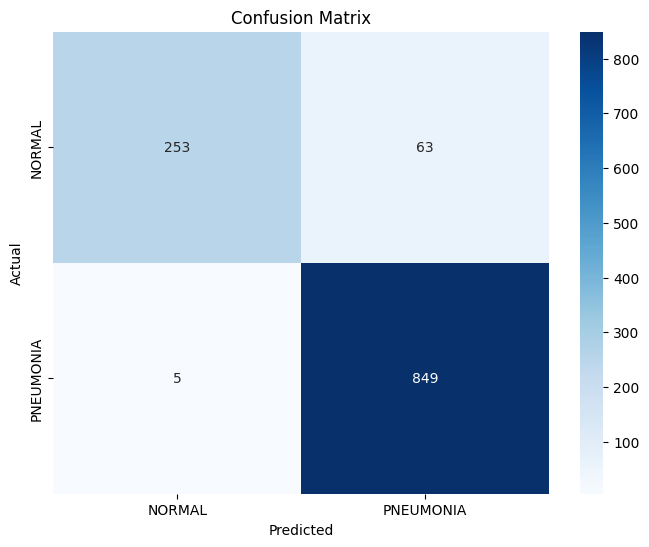

Threshold: 0.5
74/74 [==============================] - 1s 19ms/step - loss: 0.1503 - accuracy: 0.9641 - recall: 0.9883 - precision: 0.9635
Test Accuracy: 0.964102566242218
Test Loss: 0.1502903550863266
Length predictions: 1170
Hand calculated accuracy: 0.9641
Accuracy: 0.9641025641025641
Precision: 0.9634703196347032
Recall: 0.9882903981264637


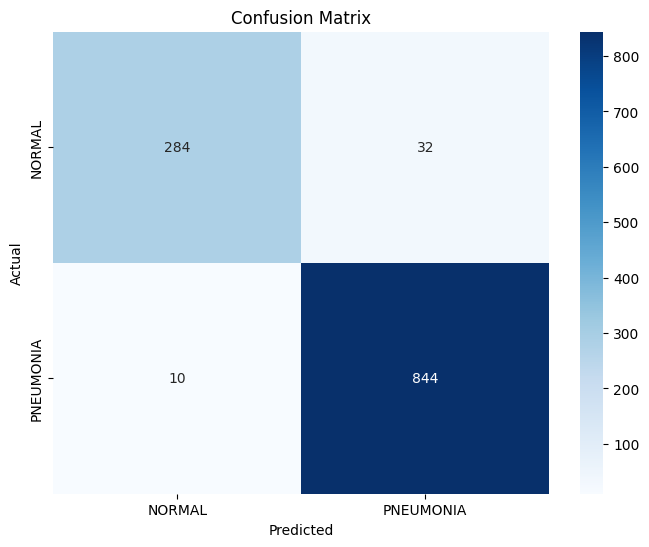

Threshold: 0.6
74/74 [==============================] - 1s 19ms/step - loss: 0.1503 - accuracy: 0.9641 - recall: 0.9883 - precision: 0.9635
Test Accuracy: 0.964102566242218
Test Loss: 0.1502903550863266
Length predictions: 1170
Hand calculated accuracy: 0.9675
Accuracy: 0.9675213675213675
Precision: 0.9711316397228638
Recall: 0.9847775175644028


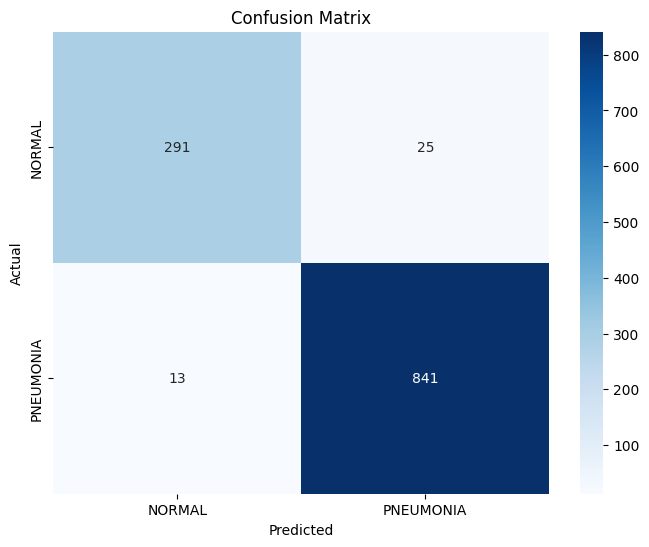

Threshold: 0.75
74/74 [==============================] - 1s 18ms/step - loss: 0.1503 - accuracy: 0.9641 - recall: 0.9883 - precision: 0.9635
Test Accuracy: 0.964102566242218
Test Loss: 0.1502903550863266
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.974477958236659
Recall: 0.9836065573770492


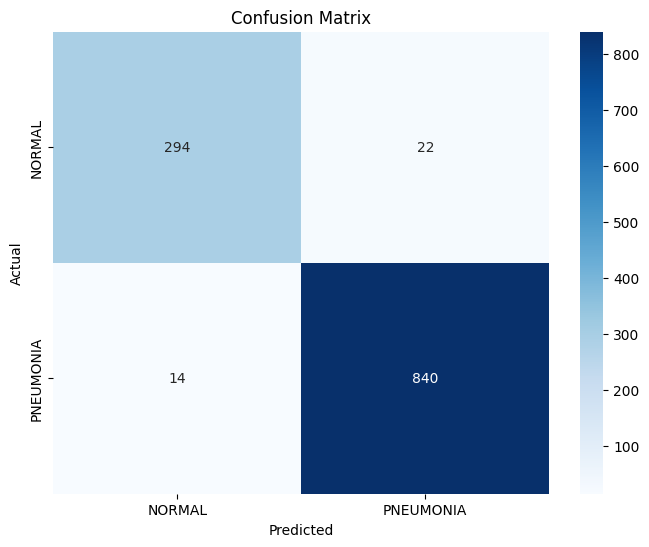

Threshold: 0.9
74/74 [==============================] - 1s 19ms/step - loss: 0.1503 - accuracy: 0.9641 - recall: 0.9883 - precision: 0.9635
Test Accuracy: 0.964102566242218
Test Loss: 0.1502903699874878
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9766899766899767
Recall: 0.9812646370023419


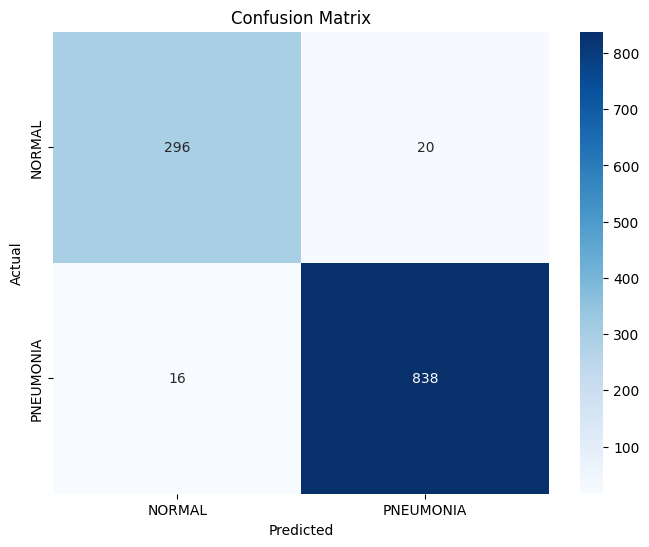

Threshold: 0.95
74/74 [==============================] - 1s 19ms/step - loss: 0.1503 - accuracy: 0.9641 - recall: 0.9883 - precision: 0.9635
Test Accuracy: 0.964102566242218
Test Loss: 0.1502903699874878
Length predictions: 1170
Hand calculated accuracy: 0.9684
Accuracy: 0.9683760683760684
Precision: 0.9811542991755006
Recall: 0.9754098360655737


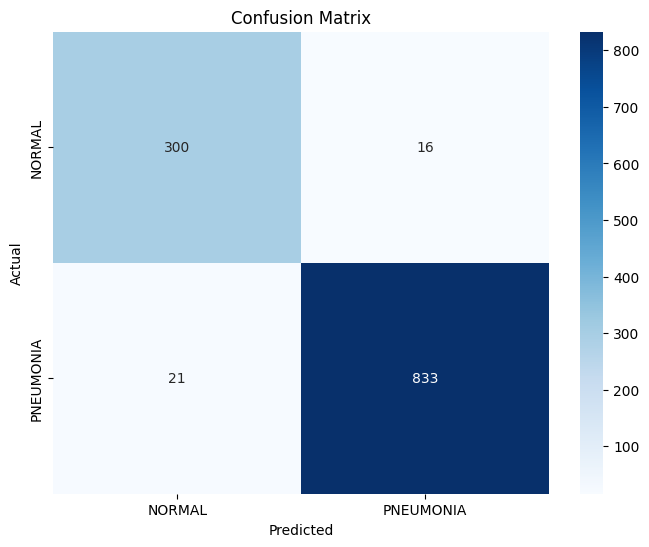

Threshold: 0.99
74/74 [==============================] - 1s 19ms/step - loss: 0.1503 - accuracy: 0.9641 - recall: 0.9883 - precision: 0.9635
Test Accuracy: 0.964102566242218
Test Loss: 0.150290384888649
Length predictions: 1170
Hand calculated accuracy: 0.9624
Accuracy: 0.9623931623931624
Precision: 0.9856115107913669
Recall: 0.9625292740046838


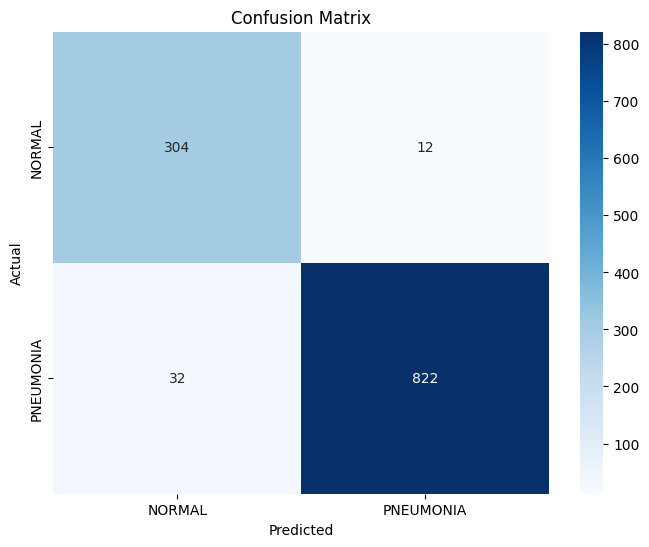

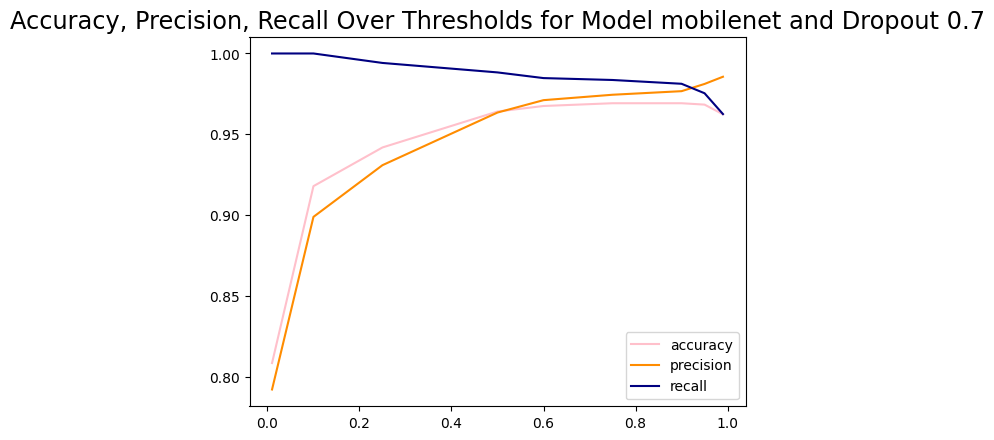



_______________


ACC 1 [(0.8914529914529915, 0.9572649572649573, 0.9632478632478633, 0.9675213675213675, 0.9692307692307692, 0.9692307692307692, 0.9632478632478633, 0.9606837606837607, 0.941025641025641), (0.9307692307692308, 0.9598290598290599, 0.9658119658119658, 0.9692307692307692, 0.9692307692307692, 0.9717948717948718, 0.9675213675213675, 0.9641025641025641, 0.9538461538461539), (0.8965811965811966, 0.9641025641025641, 0.9735042735042735, 0.9700854700854701, 0.9666666666666667, 0.9581196581196582, 0.9401709401709402, 0.9213675213675213, 0.8333333333333334), (0.941025641025641, 0.9675213675213675, 0.9692307692307692, 0.9726495726495726, 0.9726495726495726, 0.9709401709401709, 0.9658119658119658, 0.9623931623931624, 0.941025641025641)]
ACC 2 [(0.9692307692307692, 0.958974358974359, 0.9495726495726495, 0.9299145299145299, 0.9196581196581196, 0.9025641025641026, 0.8777777777777778, 0.8572649572649572, 0.7931623931623931), (0.9367521367521368, 0.9683760683760684, 0.9717948717948718,

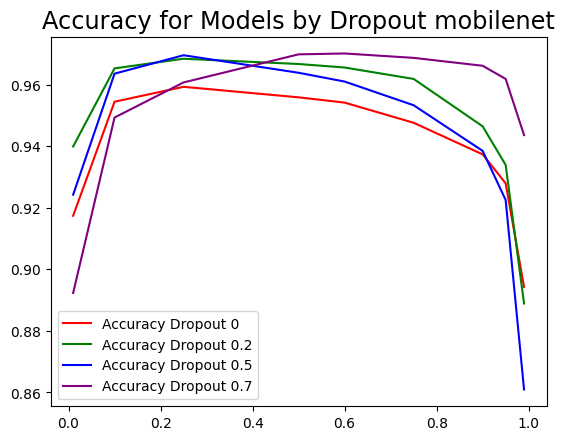



_______________




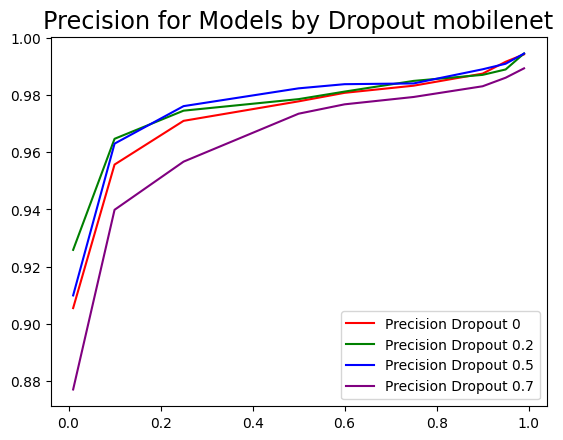



_______________




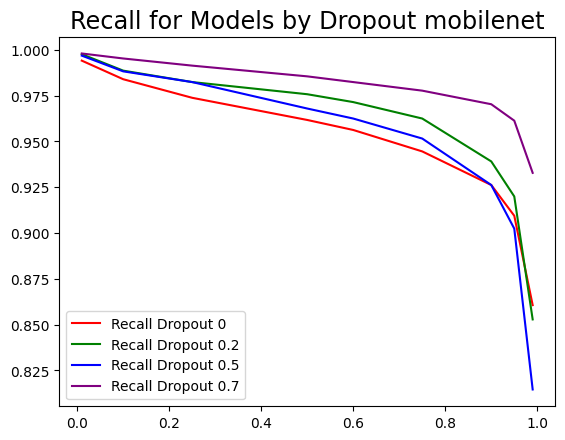



_______________


2023-12-13 10:08:15.958553
Model Name: inception
Dropout: 0
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 29s 95ms/step - loss: 0.1772 - accuracy: 0.9344 - recall: 0.9585 - precision: 0.9519 - val_loss: 0.2433 - val_accuracy: 0.8978 - val_recall: 1.0000 - val_precision: 0.8770
Epoch 2/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0885 - accuracy: 0.9719 - recall: 0.9823 - precision: 0.9793 - val_loss: 0.0932 - val_accuracy: 0.9625 - val_recall: 0.9766 - val_precision: 0.9721
Epoch 3/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0644 - accuracy: 0.9761 - recall: 0.9846 - precision: 0.9826 - val_loss: 0.0978 - val_accuracy: 0.9727 - val_recall: 0.9883 - val_precision: 0.9747
Epoch 4/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0524 - accuracy: 0.9824 - recall: 0.9883 - pre

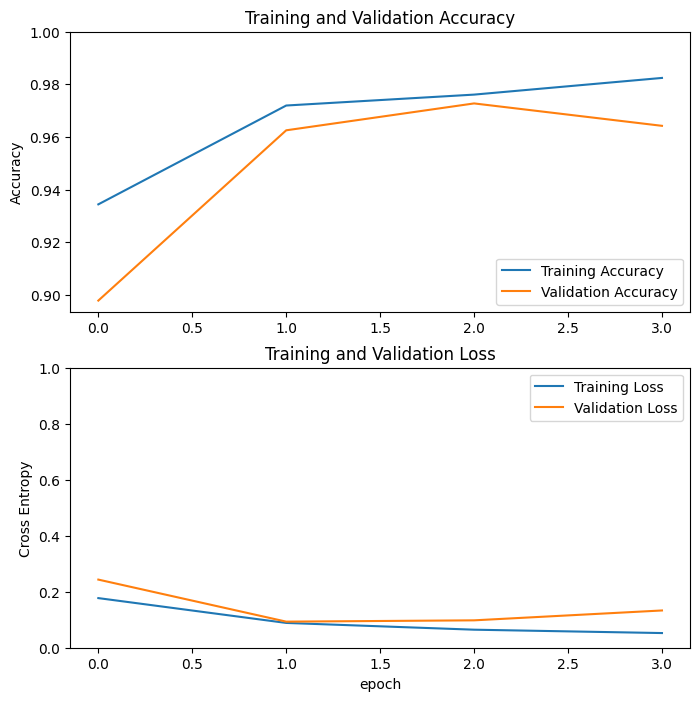

Threshold: 0.01
74/74 [==============================] - 3s 36ms/step - loss: 0.1263 - accuracy: 0.9684 - recall: 0.9883 - precision: 0.9690
Test Accuracy: 0.9683760404586792
Test Loss: 0.12631723284721375
Length predictions: 1170
Hand calculated accuracy: 0.9188
Accuracy: 0.9188034188034188
Precision: 0.9007391763463569
Recall: 0.9988290398126464


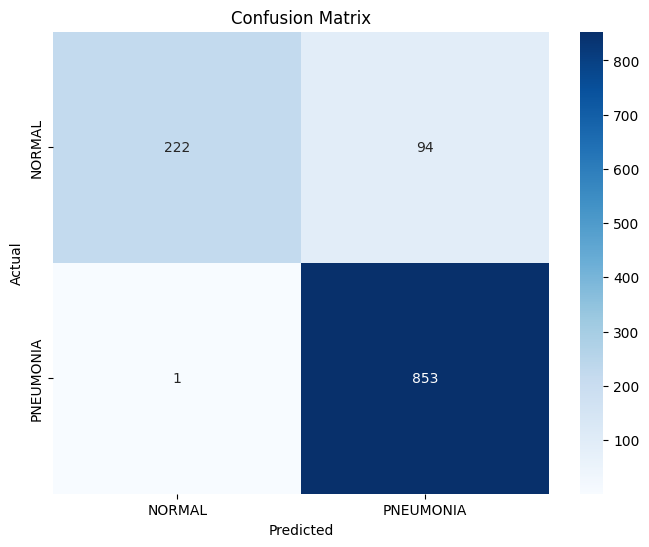

Threshold: 0.1
74/74 [==============================] - 2s 30ms/step - loss: 0.1263 - accuracy: 0.9684 - recall: 0.9883 - precision: 0.9690
Test Accuracy: 0.9683760404586792
Test Loss: 0.12631700932979584
Length predictions: 1170
Hand calculated accuracy: 0.9564
Accuracy: 0.9564102564102565
Precision: 0.946607341490545
Recall: 0.9964871194379391


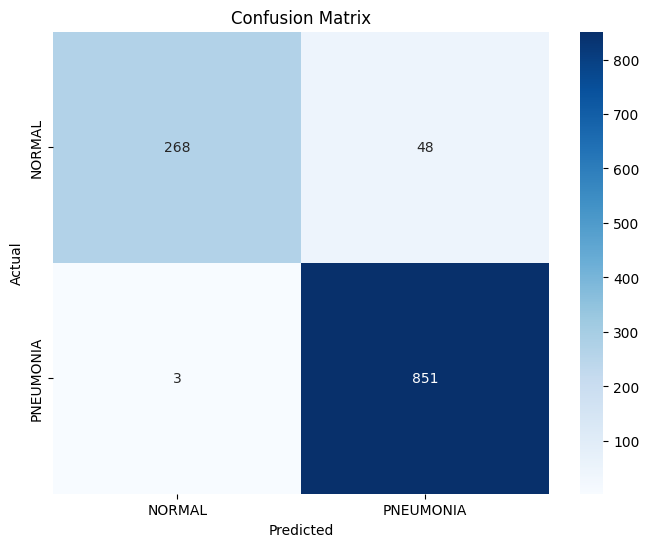

Threshold: 0.25
74/74 [==============================] - 2s 30ms/step - loss: 0.1263 - accuracy: 0.9684 - recall: 0.9883 - precision: 0.9690
Test Accuracy: 0.9683760404586792
Test Loss: 0.12631700932979584
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9593220338983051
Recall: 0.9941451990632318


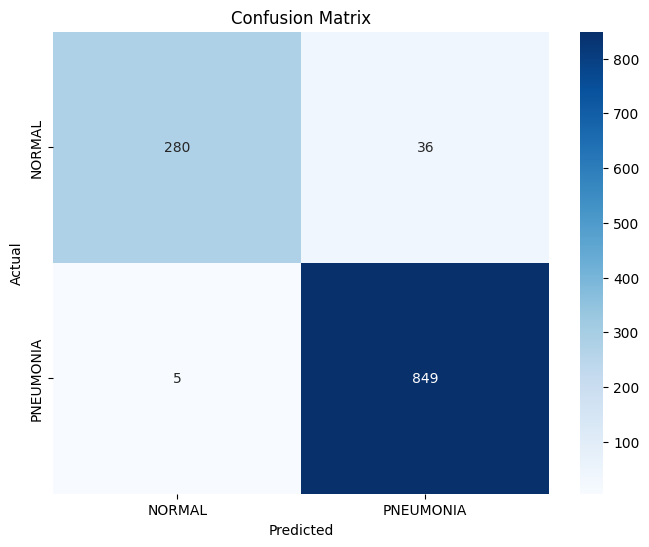

Threshold: 0.5
74/74 [==============================] - 2s 30ms/step - loss: 0.1263 - accuracy: 0.9684 - recall: 0.9883 - precision: 0.9690
Test Accuracy: 0.9683760404586792
Test Loss: 0.12631700932979584
Length predictions: 1170
Hand calculated accuracy: 0.9684
Accuracy: 0.9683760683760684
Precision: 0.9690011481056258
Recall: 0.9882903981264637


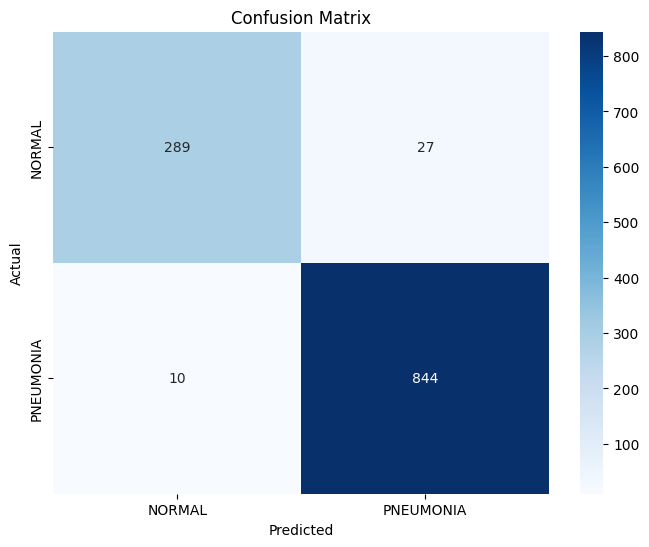

Threshold: 0.6
74/74 [==============================] - 2s 31ms/step - loss: 0.1263 - accuracy: 0.9684 - recall: 0.9883 - precision: 0.9690
Test Accuracy: 0.9683760404586792
Test Loss: 0.12631699442863464
Length predictions: 1170
Hand calculated accuracy: 0.9709
Accuracy: 0.9709401709401709
Precision: 0.9734411085450346
Recall: 0.9871194379391101


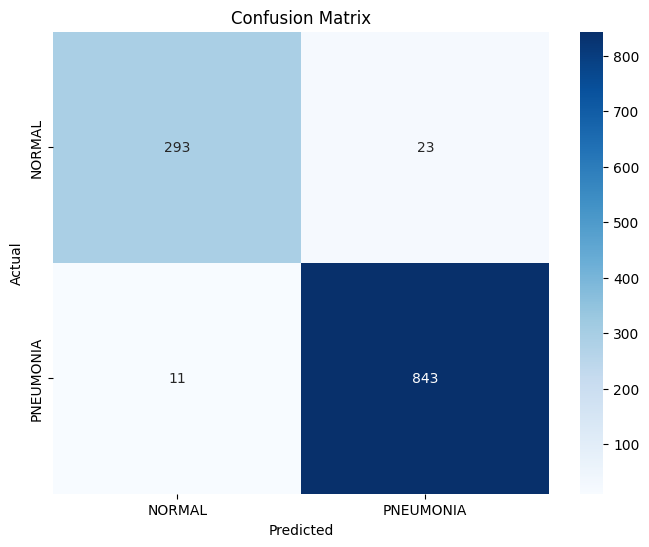

Threshold: 0.75
74/74 [==============================] - 2s 29ms/step - loss: 0.1263 - accuracy: 0.9684 - recall: 0.9883 - precision: 0.9690
Test Accuracy: 0.9683760404586792
Test Loss: 0.12631699442863464
Length predictions: 1170
Hand calculated accuracy: 0.9701
Accuracy: 0.9700854700854701
Precision: 0.9745075318655851
Recall: 0.9847775175644028


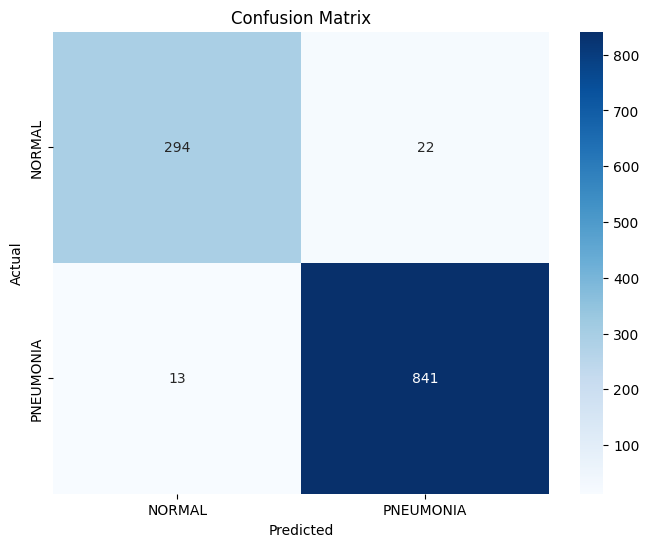

Threshold: 0.9
74/74 [==============================] - 2s 30ms/step - loss: 0.1263 - accuracy: 0.9684 - recall: 0.9883 - precision: 0.9690
Test Accuracy: 0.9683760404586792
Test Loss: 0.12631680071353912
Length predictions: 1170
Hand calculated accuracy: 0.9709
Accuracy: 0.9709401709401709
Precision: 0.9800936768149883
Recall: 0.9800936768149883


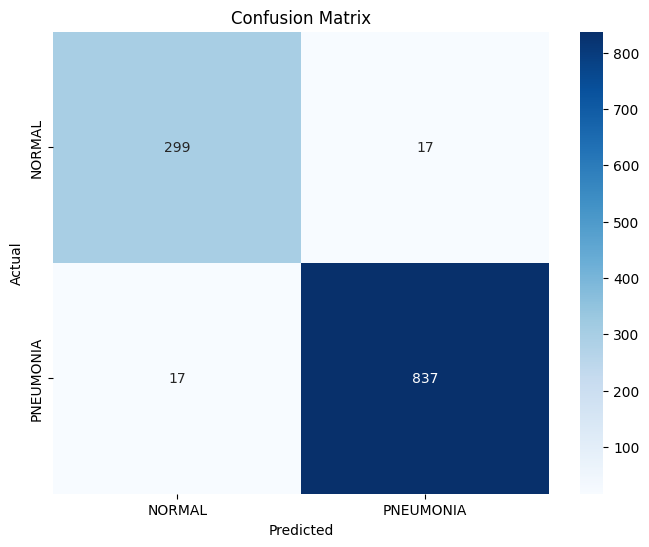

Threshold: 0.95
74/74 [==============================] - 2s 30ms/step - loss: 0.1263 - accuracy: 0.9684 - recall: 0.9883 - precision: 0.9690
Test Accuracy: 0.9683760404586792
Test Loss: 0.12631702423095703
Length predictions: 1170
Hand calculated accuracy: 0.9675
Accuracy: 0.9675213675213675
Precision: 0.9822695035460993
Recall: 0.9730679156908665


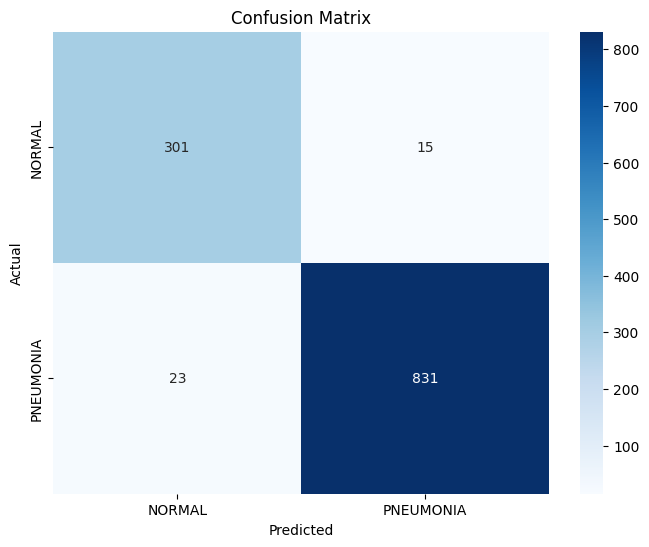

Threshold: 0.99
74/74 [==============================] - 2s 30ms/step - loss: 0.1263 - accuracy: 0.9684 - recall: 0.9883 - precision: 0.9690
Test Accuracy: 0.9683760404586792
Test Loss: 0.12631700932979584
Length predictions: 1170
Hand calculated accuracy: 0.953
Accuracy: 0.9529914529914529
Precision: 0.9854191980558931
Recall: 0.949648711943794


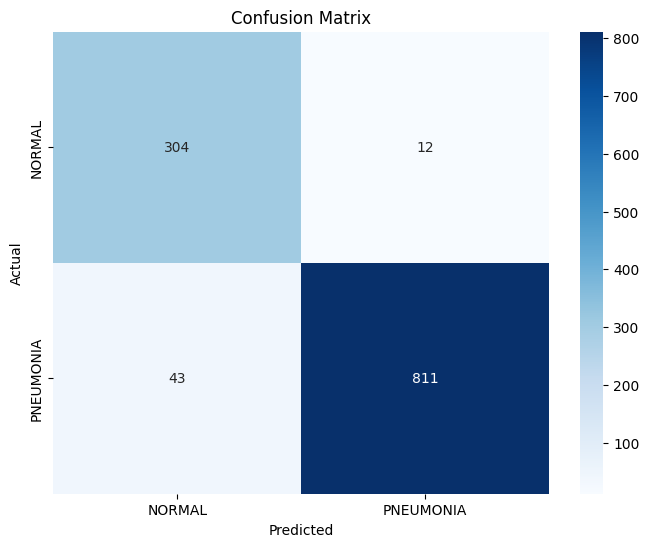

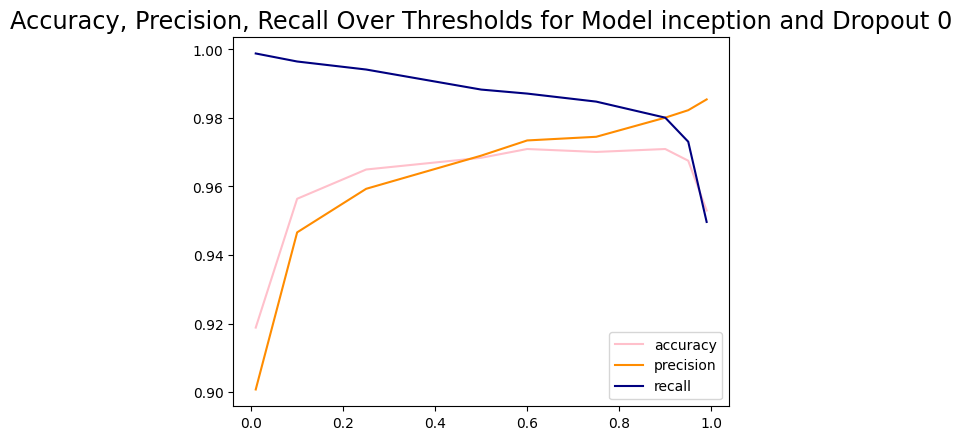



_______________


Model Name: inception
Dropout: 0.2
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 25s 89ms/step - loss: 0.1890 - accuracy: 0.9283 - recall: 0.9559 - precision: 0.9464 - val_loss: 0.1351 - val_accuracy: 0.9506 - val_recall: 0.9533 - val_precision: 0.9784
Epoch 2/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0958 - accuracy: 0.9695 - recall: 0.9803 - precision: 0.9780 - val_loss: 0.1199 - val_accuracy: 0.9557 - val_recall: 0.9556 - val_precision: 0.9832
Epoch 3/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0751 - accuracy: 0.9734 - recall: 0.9819 - precision: 0.9816 - val_loss: 0.2663 - val_accuracy: 0.9284 - val_recall: 0.9089 - val_precision: 0.9923
Epoch 4/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0882 - accuracy: 0.9680 - recall: 0.9783 - precision: 0.9779 - val_loss

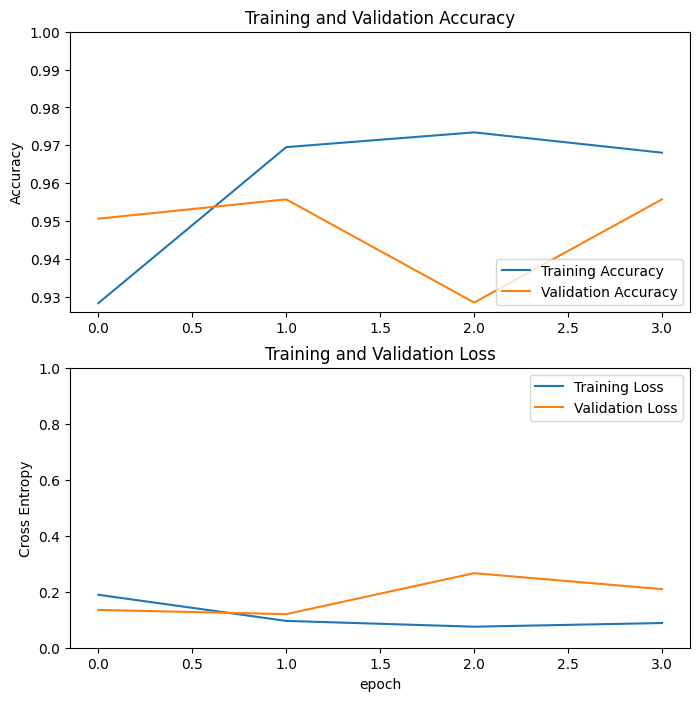

Threshold: 0.01
74/74 [==============================] - 2s 29ms/step - loss: 0.2323 - accuracy: 0.9479 - recall: 0.9930 - precision: 0.9391
Test Accuracy: 0.9478632211685181
Test Loss: 0.23232847452163696
Length predictions: 1170
Hand calculated accuracy: 0.8641
Accuracy: 0.8641025641025641
Precision: 0.8437190900098912
Recall: 0.9988290398126464


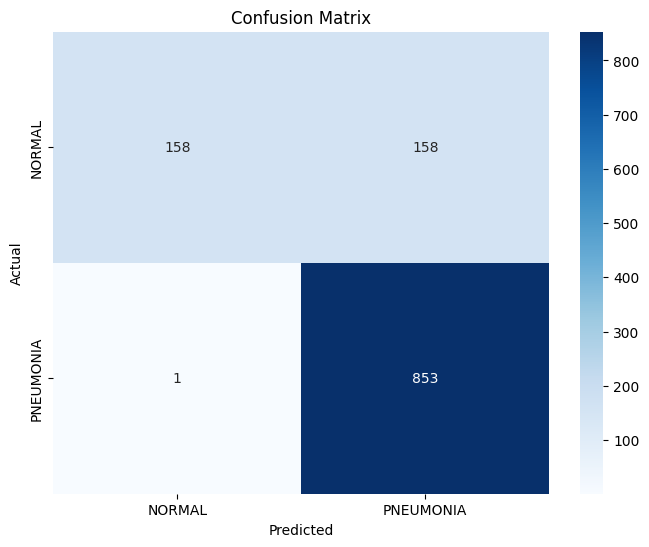

Threshold: 0.1
74/74 [==============================] - 2s 30ms/step - loss: 0.2323 - accuracy: 0.9479 - recall: 0.9930 - precision: 0.9391
Test Accuracy: 0.9478632211685181
Test Loss: 0.23232851922512054
Length predictions: 1170
Hand calculated accuracy: 0.9316
Accuracy: 0.9316239316239316
Precision: 0.9161290322580645
Recall: 0.9976580796252927


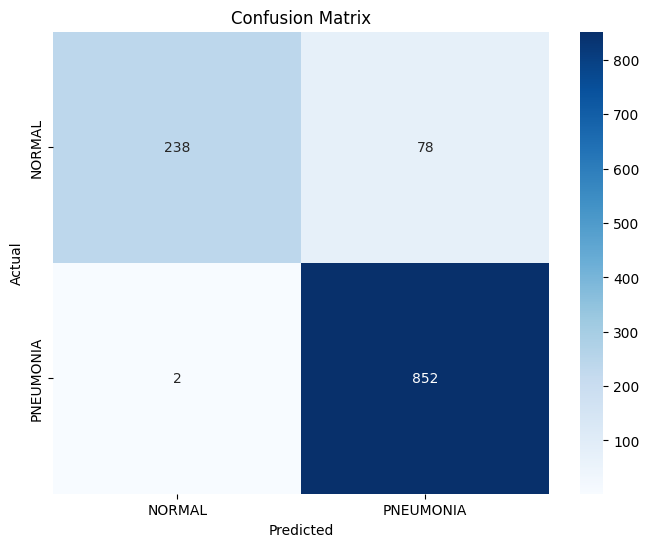

Threshold: 0.25
74/74 [==============================] - 2s 30ms/step - loss: 0.2323 - accuracy: 0.9479 - recall: 0.9930 - precision: 0.9391
Test Accuracy: 0.9478632211685181
Test Loss: 0.23232851922512054
Length predictions: 1170
Hand calculated accuracy: 0.941
Accuracy: 0.941025641025641
Precision: 0.9270946681175191
Recall: 0.9976580796252927


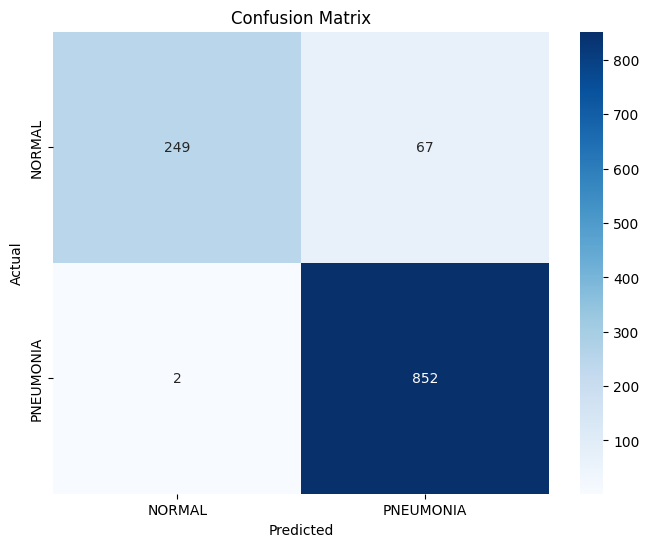

Threshold: 0.5
74/74 [==============================] - 2s 30ms/step - loss: 0.2323 - accuracy: 0.9479 - recall: 0.9930 - precision: 0.9391
Test Accuracy: 0.9478632211685181
Test Loss: 0.23232848942279816
Length predictions: 1170
Hand calculated accuracy: 0.9479
Accuracy: 0.9478632478632478
Precision: 0.9390919158361019
Recall: 0.9929742388758782


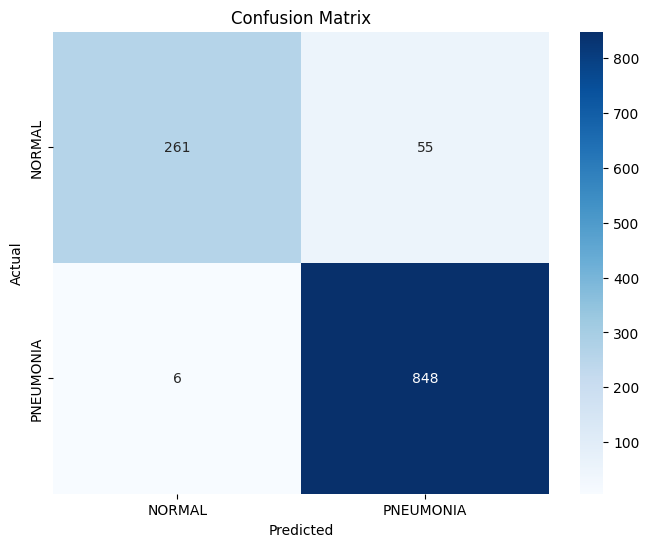

Threshold: 0.6
74/74 [==============================] - 2s 30ms/step - loss: 0.2323 - accuracy: 0.9479 - recall: 0.9930 - precision: 0.9391
Test Accuracy: 0.9478632211685181
Test Loss: 0.23232851922512054
Length predictions: 1170
Hand calculated accuracy: 0.9513
Accuracy: 0.9512820512820512
Precision: 0.9432703003337041
Recall: 0.9929742388758782


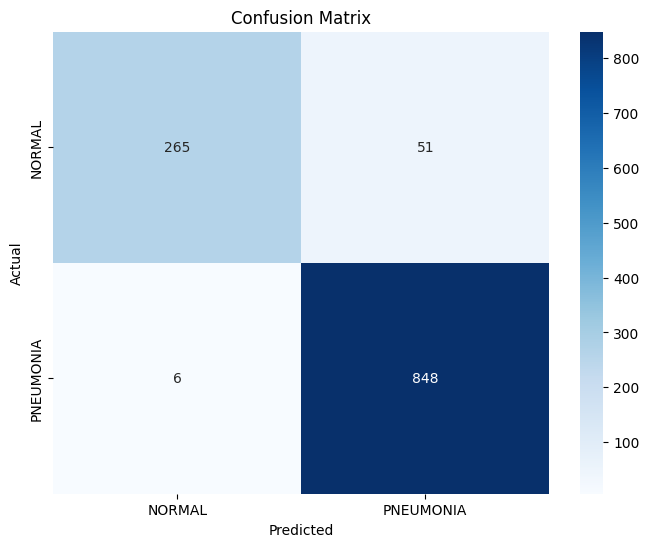

Threshold: 0.75
74/74 [==============================] - 2s 30ms/step - loss: 0.2323 - accuracy: 0.9479 - recall: 0.9930 - precision: 0.9391
Test Accuracy: 0.9478632211685181
Test Loss: 0.23232795298099518
Length predictions: 1170
Hand calculated accuracy: 0.9573
Accuracy: 0.9572649572649573
Precision: 0.9516853932584269
Recall: 0.9918032786885246


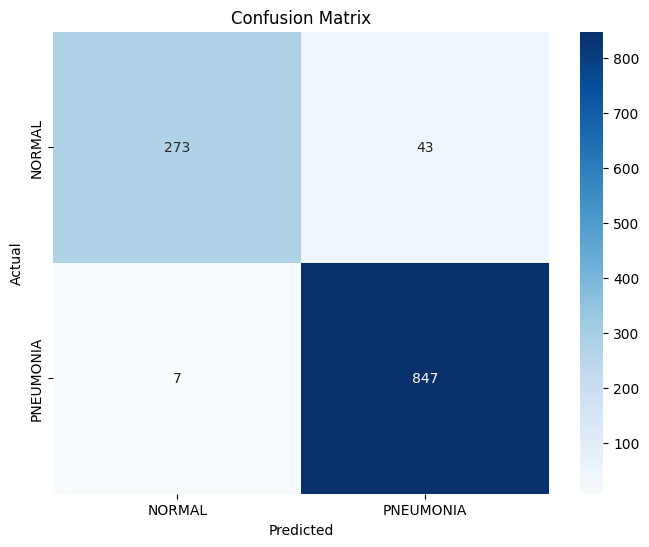

Threshold: 0.9
74/74 [==============================] - 2s 29ms/step - loss: 0.2323 - accuracy: 0.9479 - recall: 0.9930 - precision: 0.9391
Test Accuracy: 0.9478632211685181
Test Loss: 0.23232851922512054
Length predictions: 1170
Hand calculated accuracy: 0.959
Accuracy: 0.958974358974359
Precision: 0.958997722095672
Recall: 0.9859484777517564


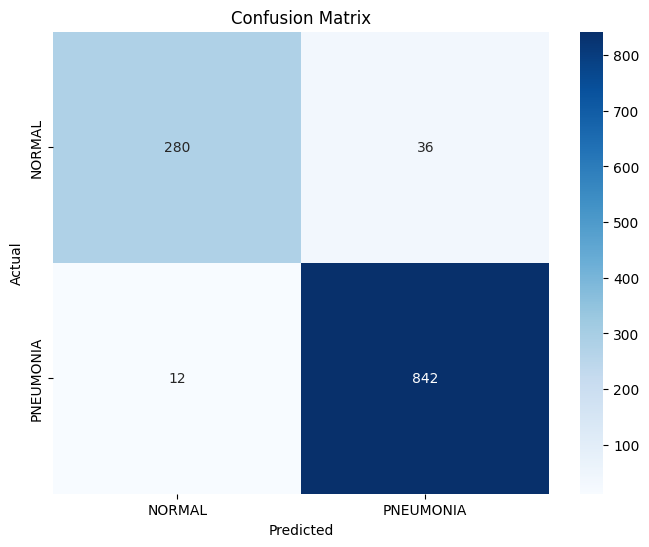

Threshold: 0.95
74/74 [==============================] - 2s 30ms/step - loss: 0.2323 - accuracy: 0.9479 - recall: 0.9930 - precision: 0.9391
Test Accuracy: 0.9478632211685181
Test Loss: 0.23232847452163696
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9667049368541906
Recall: 0.9859484777517564


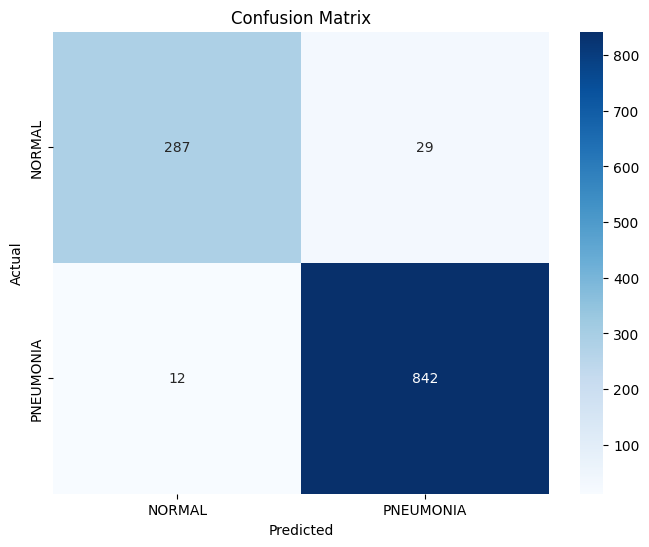

Threshold: 0.99
74/74 [==============================] - 2s 30ms/step - loss: 0.2323 - accuracy: 0.9479 - recall: 0.9930 - precision: 0.9391
Test Accuracy: 0.9478632211685181
Test Loss: 0.23232847452163696
Length predictions: 1170
Hand calculated accuracy: 0.9598
Accuracy: 0.9598290598290599
Precision: 0.9730363423212193
Recall: 0.9718969555035128


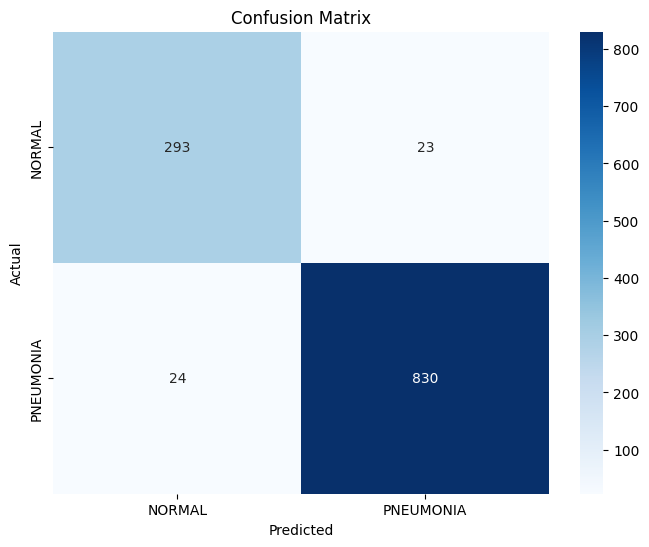

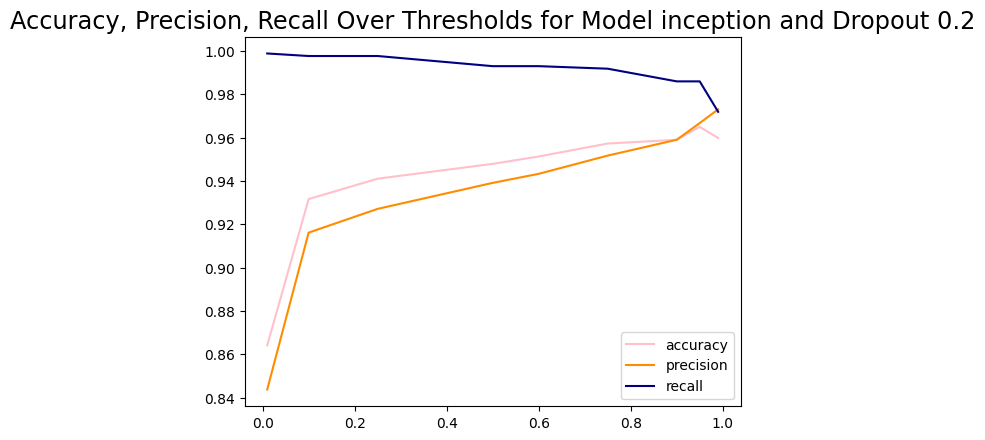



_______________


Model Name: inception
Dropout: 0.5
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 26s 88ms/step - loss: 0.2273 - accuracy: 0.9097 - recall: 0.9408 - precision: 0.9358 - val_loss: 0.1583 - val_accuracy: 0.9284 - val_recall: 0.9252 - val_precision: 0.9754
Epoch 2/4
257/257 [==============================] - 22s 86ms/step - loss: 0.1100 - accuracy: 0.9641 - recall: 0.9719 - precision: 0.9788 - val_loss: 0.1002 - val_accuracy: 0.9608 - val_recall: 0.9883 - val_precision: 0.9592
Epoch 3/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0909 - accuracy: 0.9724 - recall: 0.9793 - precision: 0.9829 - val_loss: 0.0979 - val_accuracy: 0.9608 - val_recall: 0.9743 - val_precision: 0.9720
Epoch 4/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0599 - accuracy: 0.9766 - recall: 0.9826 - precision: 0.9852 - val_loss

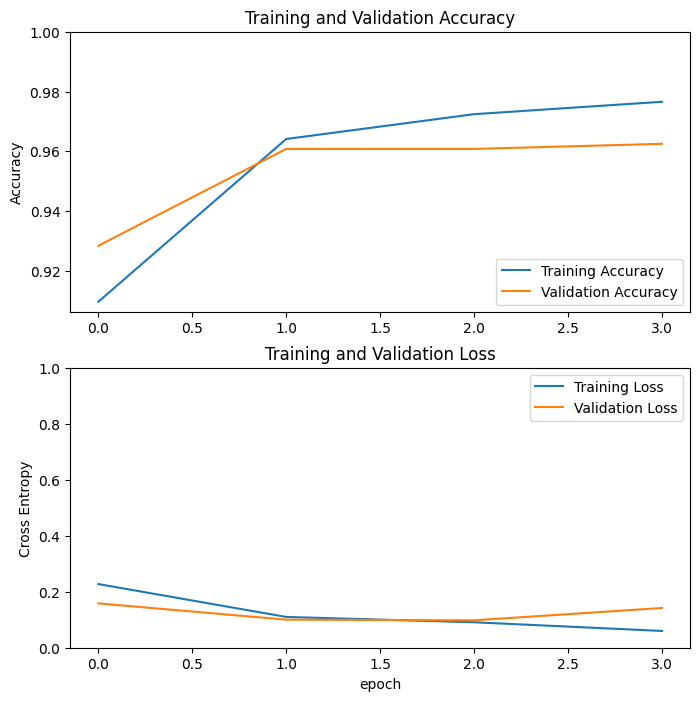

Threshold: 0.01
74/74 [==============================] - 2s 30ms/step - loss: 0.1321 - accuracy: 0.9675 - recall: 0.9789 - precision: 0.9766
Test Accuracy: 0.9675213694572449
Test Loss: 0.1320623904466629
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9593220338983051
Recall: 0.9941451990632318


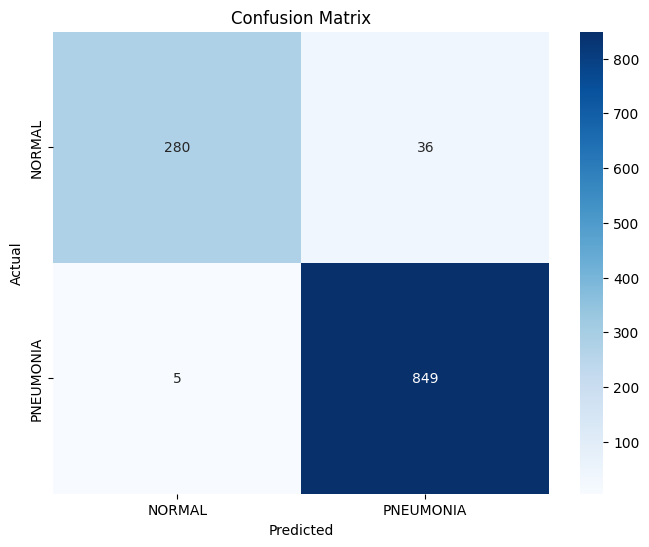

Threshold: 0.1
74/74 [==============================] - 2s 31ms/step - loss: 0.1321 - accuracy: 0.9675 - recall: 0.9789 - precision: 0.9766
Test Accuracy: 0.9675213694572449
Test Loss: 0.13206236064434052
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9756662804171495
Recall: 0.9859484777517564


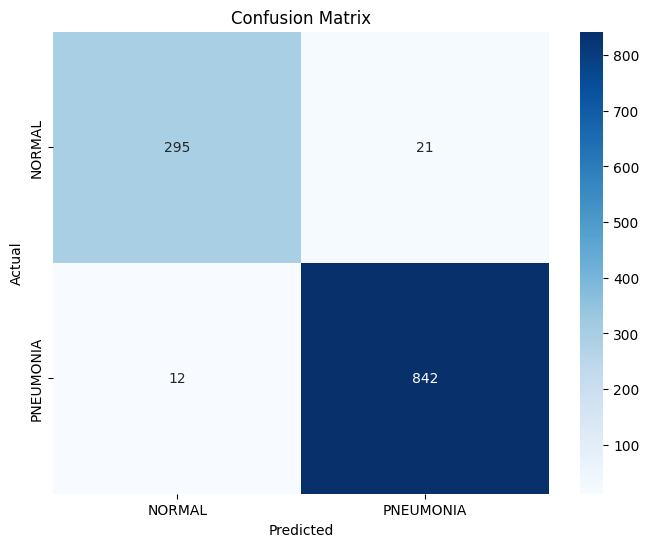

Threshold: 0.25
74/74 [==============================] - 2s 30ms/step - loss: 0.1321 - accuracy: 0.9675 - recall: 0.9789 - precision: 0.9766
Test Accuracy: 0.9675213694572449
Test Loss: 0.1320624053478241
Length predictions: 1170
Hand calculated accuracy: 0.9709
Accuracy: 0.9709401709401709
Precision: 0.9767441860465116
Recall: 0.9836065573770492


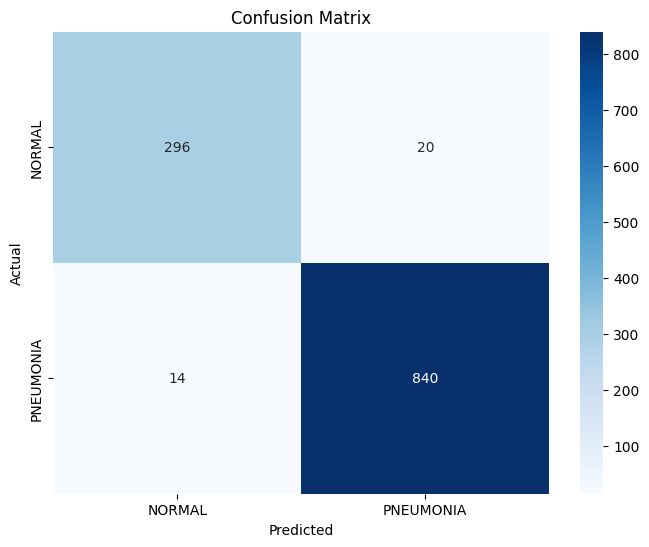

Threshold: 0.5
74/74 [==============================] - 2s 31ms/step - loss: 0.1321 - accuracy: 0.9675 - recall: 0.9789 - precision: 0.9766
Test Accuracy: 0.9675213694572449
Test Loss: 0.13206243515014648
Length predictions: 1170
Hand calculated accuracy: 0.9675
Accuracy: 0.9675213675213675
Precision: 0.9766355140186916
Recall: 0.9789227166276346


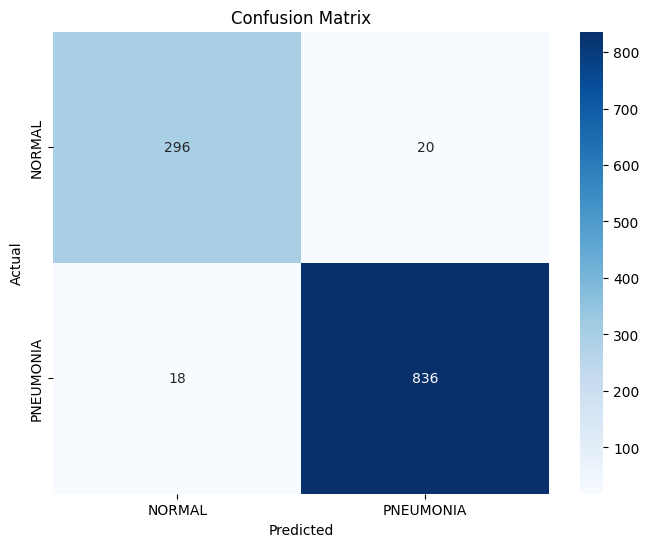

Threshold: 0.6
74/74 [==============================] - 2s 30ms/step - loss: 0.1321 - accuracy: 0.9675 - recall: 0.9789 - precision: 0.9766
Test Accuracy: 0.9675213694572449
Test Loss: 0.1320631057024002
Length predictions: 1170
Hand calculated accuracy: 0.9667
Accuracy: 0.9666666666666667
Precision: 0.9788484136310224
Recall: 0.9754098360655737


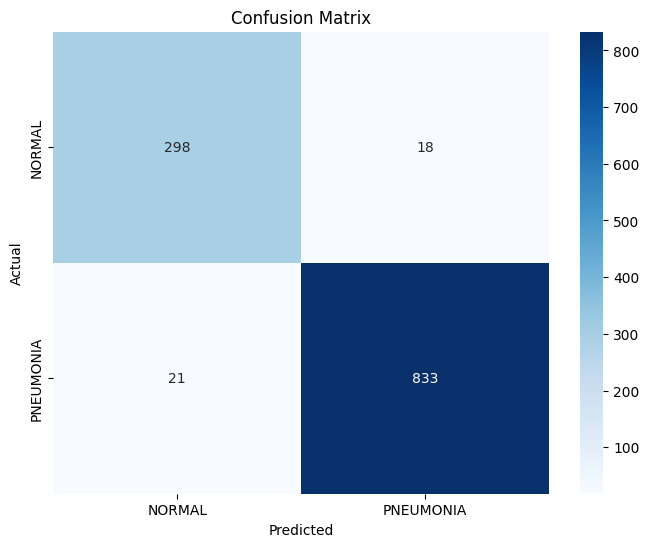

Threshold: 0.75
74/74 [==============================] - 2s 31ms/step - loss: 0.1321 - accuracy: 0.9675 - recall: 0.9789 - precision: 0.9766
Test Accuracy: 0.9675213694572449
Test Loss: 0.13206243515014648
Length predictions: 1170
Hand calculated accuracy: 0.9641
Accuracy: 0.9641025641025641
Precision: 0.982185273159145
Recall: 0.968384074941452


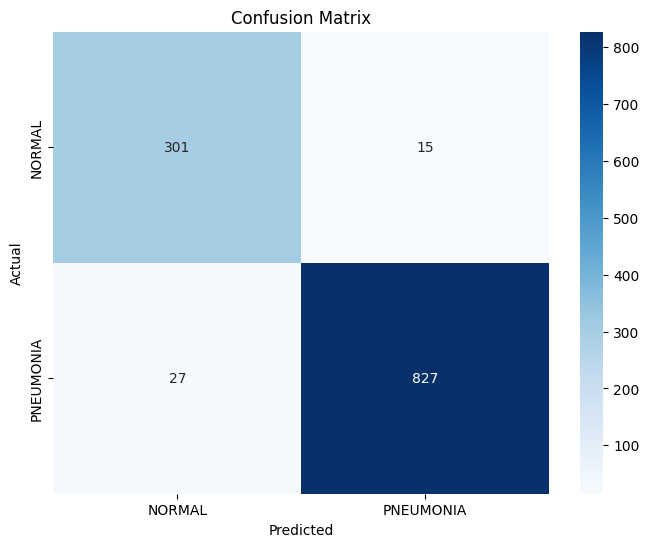

Threshold: 0.9
74/74 [==============================] - 2s 30ms/step - loss: 0.1321 - accuracy: 0.9675 - recall: 0.9789 - precision: 0.9766
Test Accuracy: 0.9675213694572449
Test Loss: 0.1320624053478241
Length predictions: 1170
Hand calculated accuracy: 0.953
Accuracy: 0.9529914529914529
Precision: 0.9854191980558931
Recall: 0.949648711943794


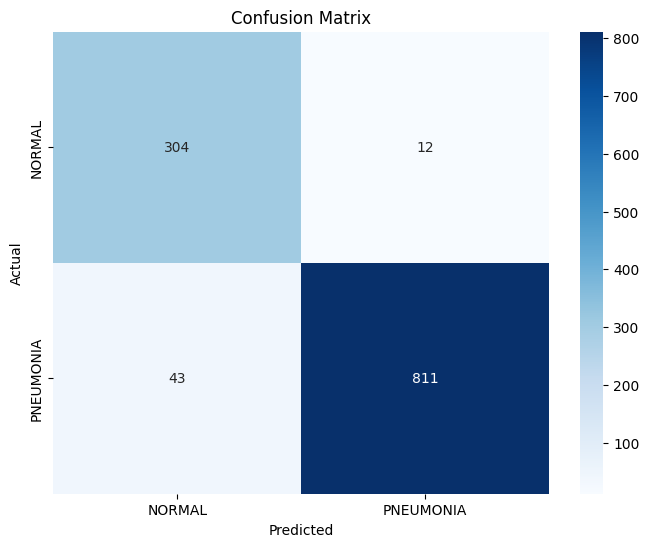

Threshold: 0.95
74/74 [==============================] - 2s 30ms/step - loss: 0.1321 - accuracy: 0.9675 - recall: 0.9789 - precision: 0.9766
Test Accuracy: 0.9675213694572449
Test Loss: 0.1320624202489853
Length predictions: 1170
Hand calculated accuracy: 0.9504
Accuracy: 0.9504273504273504
Precision: 0.9889434889434889
Recall: 0.9426229508196722


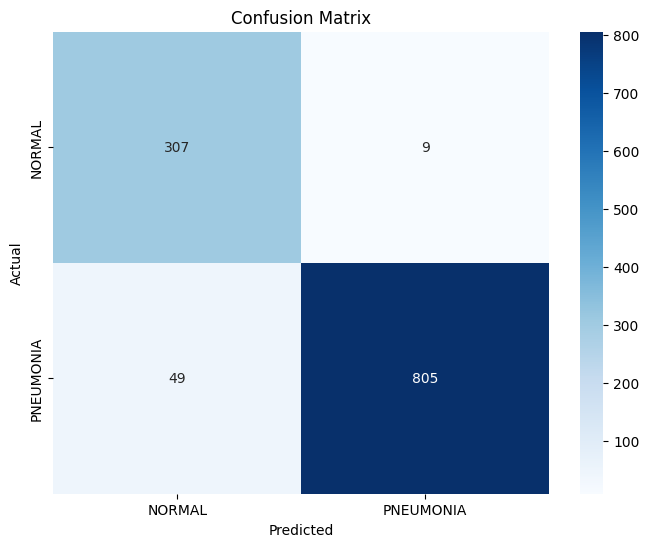

Threshold: 0.99
74/74 [==============================] - 2s 30ms/step - loss: 0.1321 - accuracy: 0.9675 - recall: 0.9789 - precision: 0.9766
Test Accuracy: 0.9675213694572449
Test Loss: 0.1320624053478241
Length predictions: 1170
Hand calculated accuracy: 0.9282
Accuracy: 0.9282051282051282
Precision: 0.9935897435897436
Recall: 0.9074941451990632


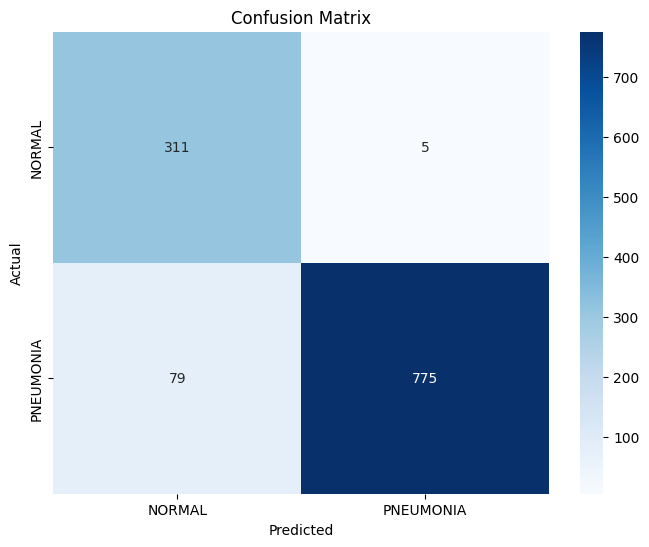

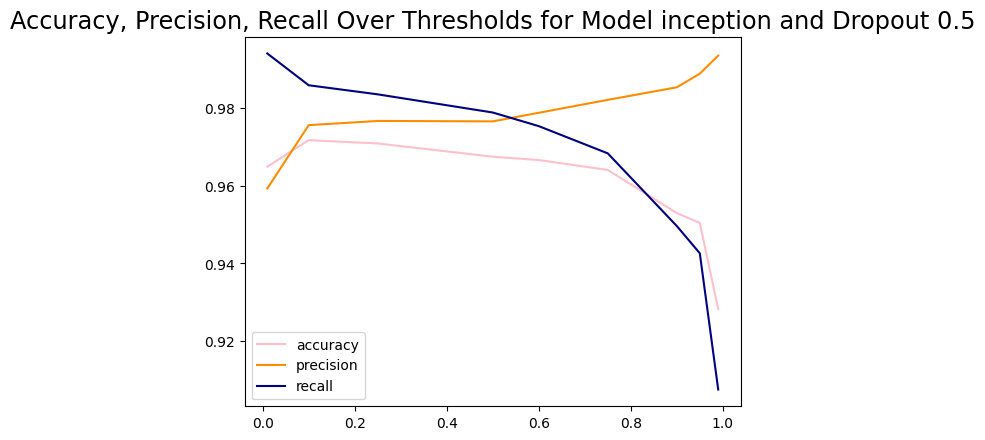



_______________


Model Name: inception
Dropout: 0.7
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 26s 88ms/step - loss: 0.2215 - accuracy: 0.9151 - recall: 0.9529 - precision: 0.9323 - val_loss: 0.1155 - val_accuracy: 0.9608 - val_recall: 0.9650 - val_precision: 0.9810
Epoch 2/4
257/257 [==============================] - 22s 86ms/step - loss: 0.1215 - accuracy: 0.9597 - recall: 0.9736 - precision: 0.9713 - val_loss: 0.1881 - val_accuracy: 0.9233 - val_recall: 0.9019 - val_precision: 0.9923
Epoch 3/4
257/257 [==============================] - 22s 86ms/step - loss: 0.1198 - accuracy: 0.9563 - recall: 0.9682 - precision: 0.9718 - val_loss: 0.1093 - val_accuracy: 0.9642 - val_recall: 0.9696 - val_precision: 0.9811
Epoch 4/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0725 - accuracy: 0.9744 - recall: 0.9819 - precision: 0.9829 - val_loss

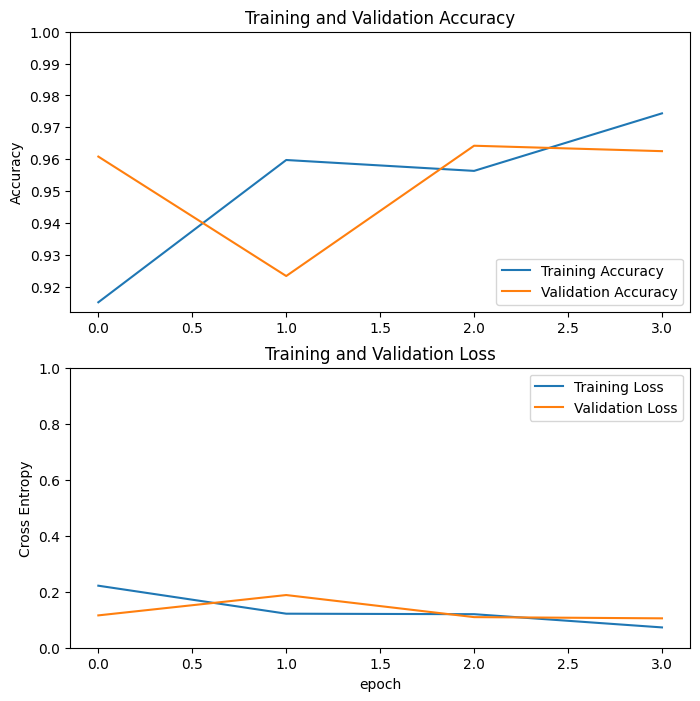

Threshold: 0.01
74/74 [==============================] - 2s 30ms/step - loss: 0.1039 - accuracy: 0.9615 - recall: 0.9859 - precision: 0.9623
Test Accuracy: 0.9615384340286255
Test Loss: 0.10389695316553116
Length predictions: 1170
Hand calculated accuracy: 0.9291
Accuracy: 0.9290598290598291
Precision: 0.9122994652406418
Recall: 0.9988290398126464


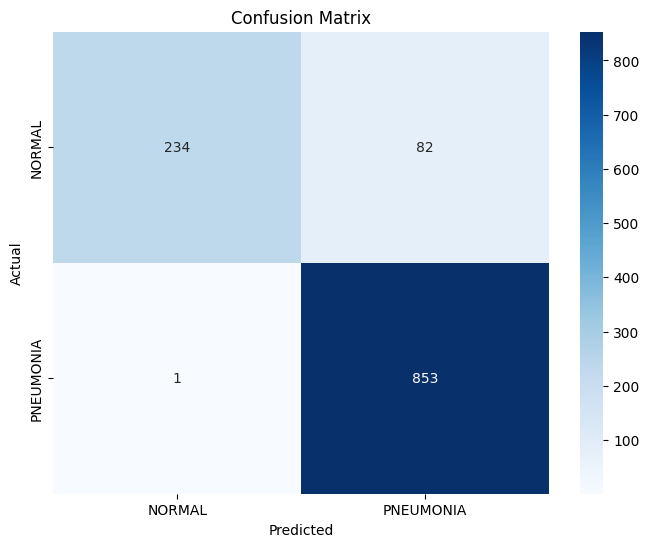

Threshold: 0.1
74/74 [==============================] - 2s 30ms/step - loss: 0.1039 - accuracy: 0.9615 - recall: 0.9859 - precision: 0.9623
Test Accuracy: 0.9615384340286255
Test Loss: 0.10389695316553116
Length predictions: 1170
Hand calculated accuracy: 0.9521
Accuracy: 0.9521367521367521
Precision: 0.9413716814159292
Recall: 0.9964871194379391


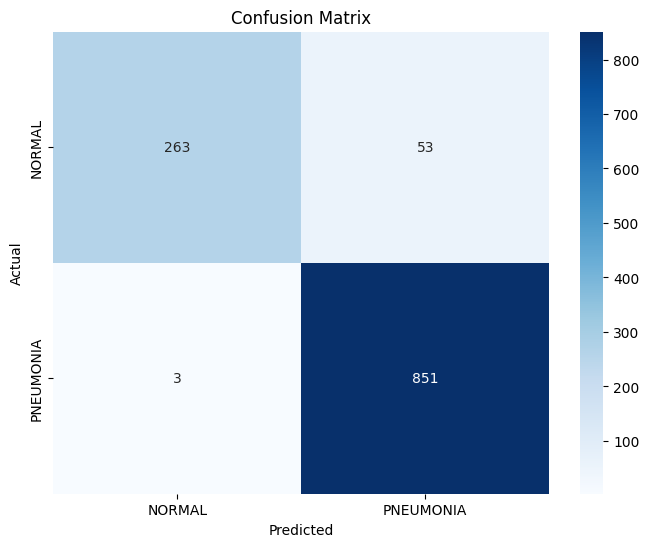

Threshold: 0.25
74/74 [==============================] - 2s 30ms/step - loss: 0.1039 - accuracy: 0.9615 - recall: 0.9859 - precision: 0.9623
Test Accuracy: 0.9615384340286255
Test Loss: 0.10389696061611176
Length predictions: 1170
Hand calculated accuracy: 0.9624
Accuracy: 0.9623931623931624
Precision: 0.9550561797752809
Recall: 0.9953161592505855


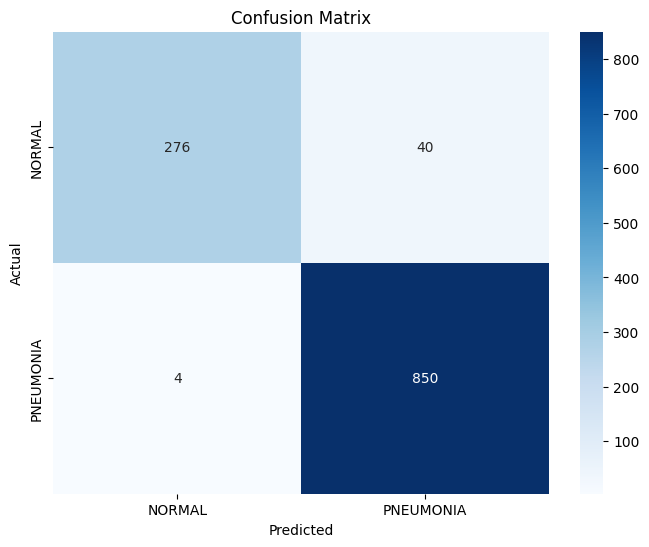

Threshold: 0.5
74/74 [==============================] - 2s 31ms/step - loss: 0.1039 - accuracy: 0.9615 - recall: 0.9859 - precision: 0.9623
Test Accuracy: 0.9615384340286255
Test Loss: 0.10389696061611176
Length predictions: 1170
Hand calculated accuracy: 0.9615
Accuracy: 0.9615384615384616
Precision: 0.9622857142857143
Recall: 0.9859484777517564


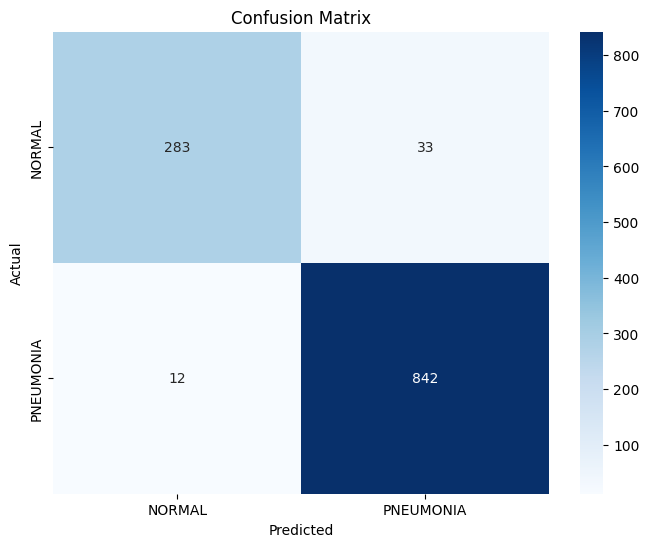

Threshold: 0.6
74/74 [==============================] - 2s 30ms/step - loss: 0.1039 - accuracy: 0.9615 - recall: 0.9859 - precision: 0.9623
Test Accuracy: 0.9615384340286255
Test Loss: 0.10389696061611176
Length predictions: 1170
Hand calculated accuracy: 0.9641
Accuracy: 0.9641025641025641
Precision: 0.9688221709006929
Recall: 0.9824355971896955


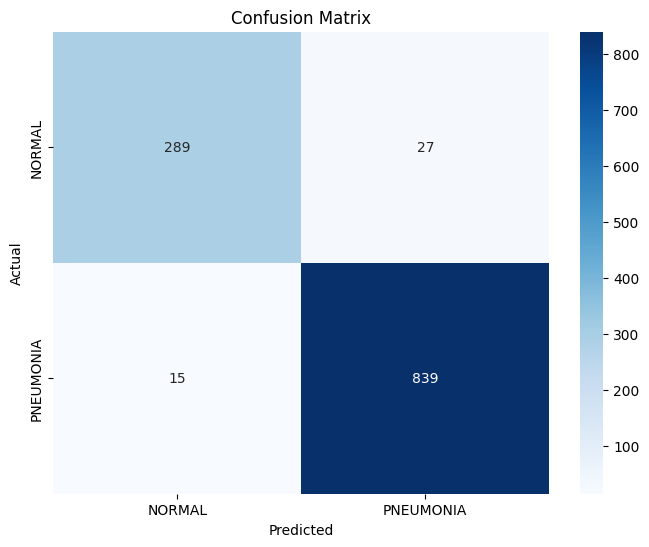

Threshold: 0.75
74/74 [==============================] - 2s 30ms/step - loss: 0.1039 - accuracy: 0.9615 - recall: 0.9859 - precision: 0.9623
Test Accuracy: 0.9615384340286255
Test Loss: 0.10389696061611176
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9743290548424738
Recall: 0.977751756440281


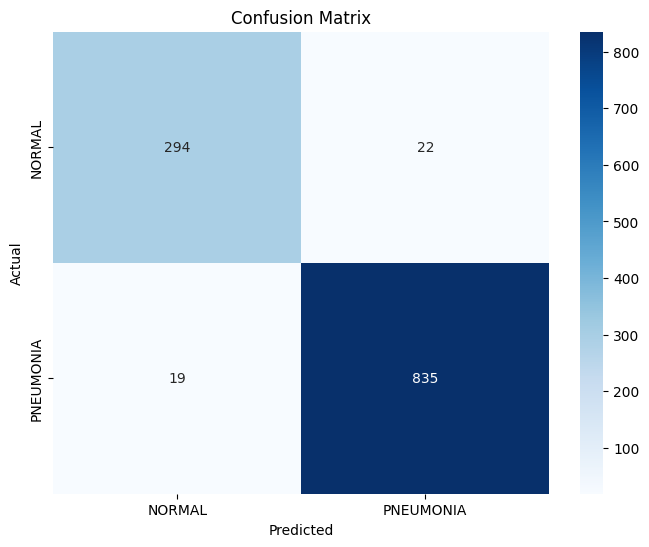

Threshold: 0.9
74/74 [==============================] - 2s 29ms/step - loss: 0.1039 - accuracy: 0.9615 - recall: 0.9859 - precision: 0.9623
Test Accuracy: 0.9615384340286255
Test Loss: 0.10389694571495056
Length predictions: 1170
Hand calculated accuracy: 0.9598
Accuracy: 0.9598290598290599
Precision: 0.9786476868327402
Recall: 0.9660421545667447


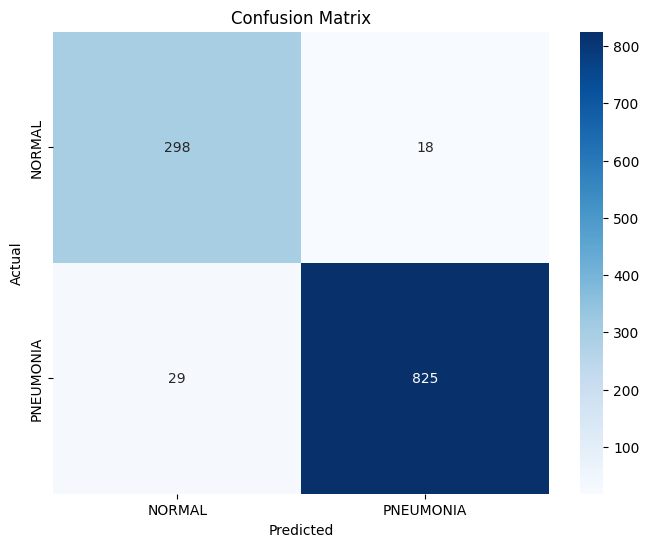

Threshold: 0.95
74/74 [==============================] - 2s 30ms/step - loss: 0.1039 - accuracy: 0.9615 - recall: 0.9859 - precision: 0.9623
Test Accuracy: 0.9615384340286255
Test Loss: 0.10389695316553116
Length predictions: 1170
Hand calculated accuracy: 0.9538
Accuracy: 0.9538461538461539
Precision: 0.9854368932038835
Recall: 0.9508196721311475


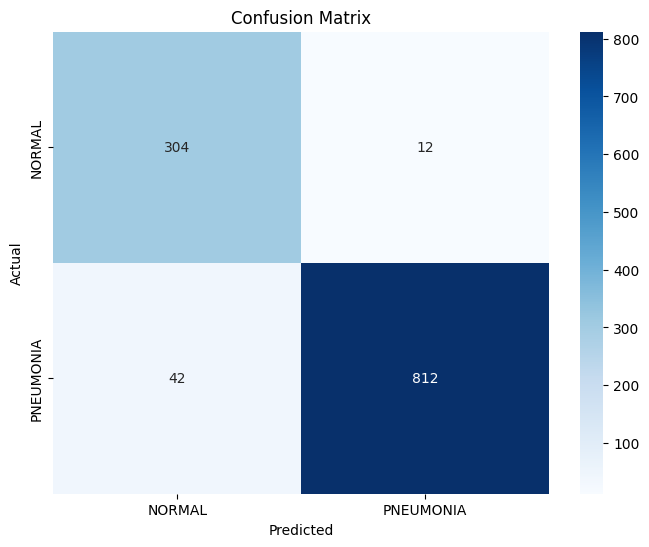

Threshold: 0.99
74/74 [==============================] - 2s 30ms/step - loss: 0.1039 - accuracy: 0.9615 - recall: 0.9859 - precision: 0.9623
Test Accuracy: 0.9615384340286255
Test Loss: 0.10389695316553116
Length predictions: 1170
Hand calculated accuracy: 0.8949
Accuracy: 0.8948717948717949
Precision: 0.9959294436906377
Recall: 0.8594847775175644


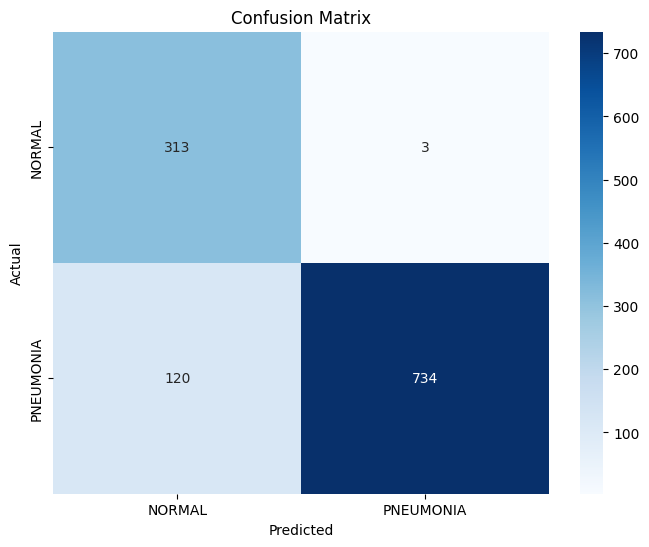

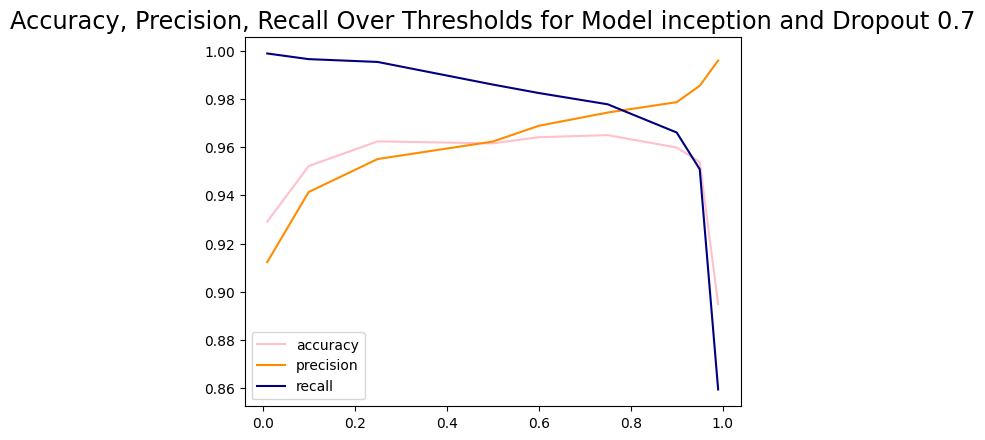



_______________


Model Name: inception
Dropout: 0
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 26s 88ms/step - loss: 0.1759 - accuracy: 0.9268 - recall: 0.9552 - precision: 0.9451 - val_loss: 0.1035 - val_accuracy: 0.9574 - val_recall: 0.9650 - val_precision: 0.9764
Epoch 2/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0996 - accuracy: 0.9646 - recall: 0.9769 - precision: 0.9746 - val_loss: 0.1162 - val_accuracy: 0.9625 - val_recall: 0.9860 - val_precision: 0.9635
Epoch 3/4
257/257 [==============================] - 23s 87ms/step - loss: 0.0677 - accuracy: 0.9780 - recall: 0.9853 - precision: 0.9846 - val_loss: 0.1143 - val_accuracy: 0.9625 - val_recall: 0.9743 - val_precision: 0.9743
Epoch 4/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0534 - accuracy: 0.9802 - recall: 0.9870 - precision: 0.9860 - val_loss: 

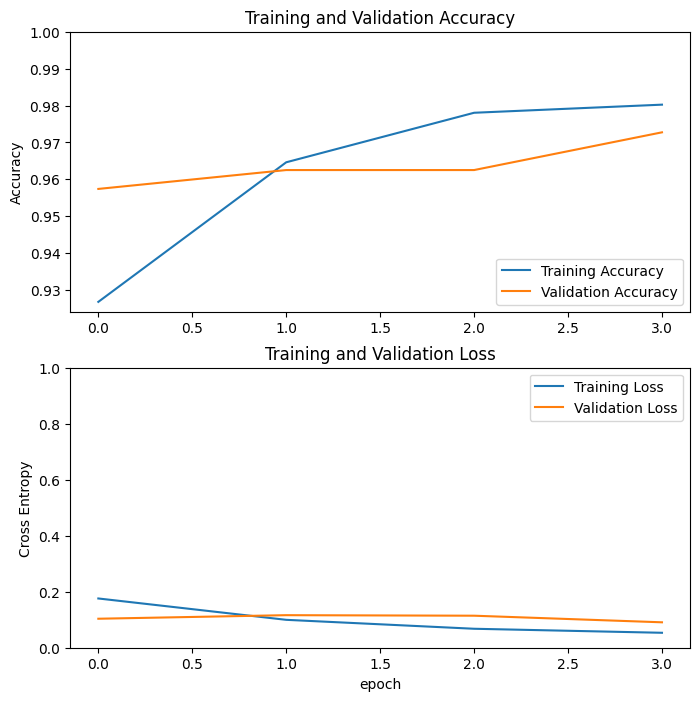

Threshold: 0.01
74/74 [==============================] - 2s 30ms/step - loss: 0.1045 - accuracy: 0.9701 - recall: 0.9918 - precision: 0.9680
Test Accuracy: 0.9700854420661926
Test Loss: 0.10453552007675171
Length predictions: 1170
Hand calculated accuracy: 0.9214
Accuracy: 0.9213675213675213
Precision: 0.9036016949152542
Recall: 0.9988290398126464


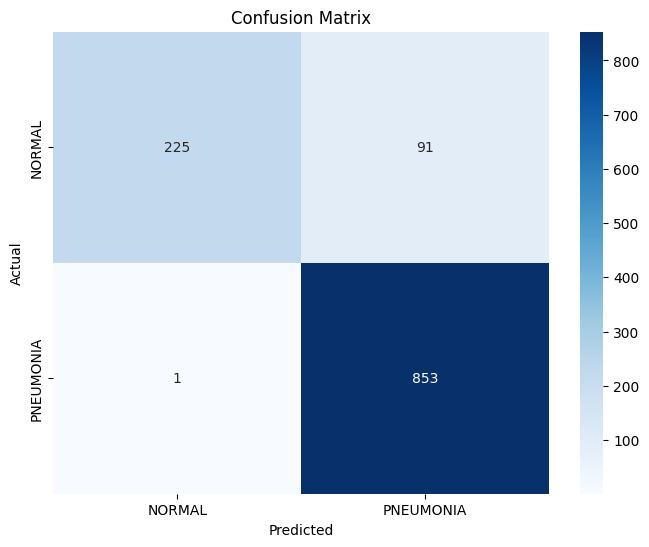

Threshold: 0.1
74/74 [==============================] - 2s 30ms/step - loss: 0.1045 - accuracy: 0.9701 - recall: 0.9918 - precision: 0.9680
Test Accuracy: 0.9700854420661926
Test Loss: 0.10453561693429947
Length predictions: 1170
Hand calculated accuracy: 0.9598
Accuracy: 0.9598290598290599
Precision: 0.9498327759197325
Recall: 0.9976580796252927


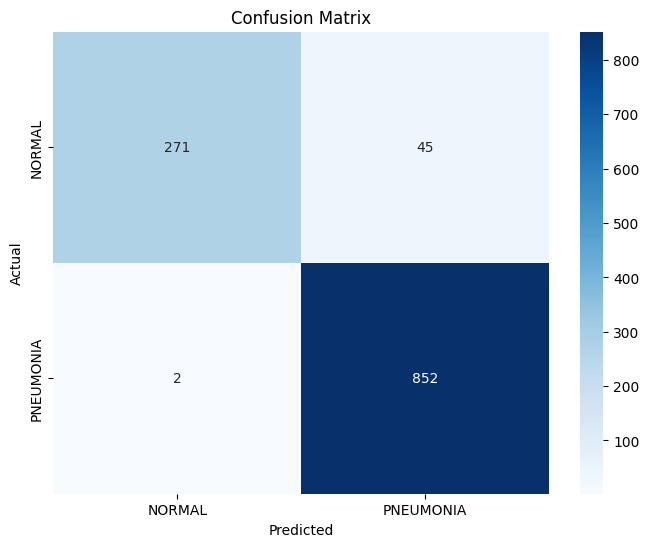

Threshold: 0.25
74/74 [==============================] - 2s 30ms/step - loss: 0.1045 - accuracy: 0.9701 - recall: 0.9918 - precision: 0.9680
Test Accuracy: 0.9700854420661926
Test Loss: 0.10453569889068604
Length predictions: 1170
Hand calculated accuracy: 0.9641
Accuracy: 0.9641025641025641
Precision: 0.9561797752808989
Recall: 0.9964871194379391


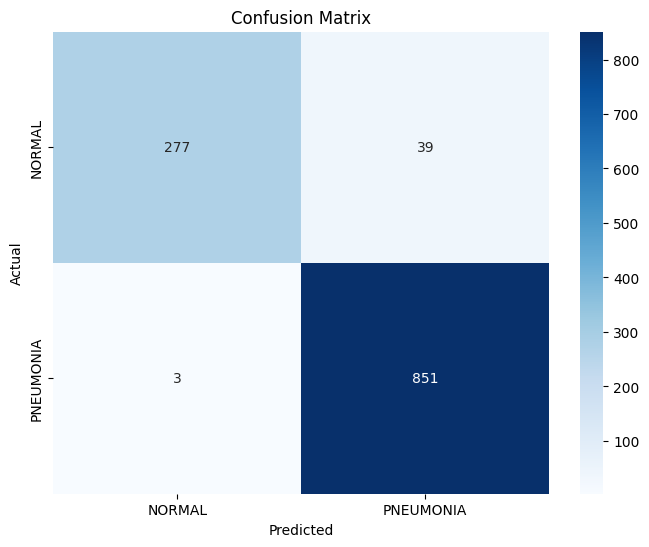

Threshold: 0.5
74/74 [==============================] - 2s 30ms/step - loss: 0.1045 - accuracy: 0.9701 - recall: 0.9918 - precision: 0.9680
Test Accuracy: 0.9700854420661926
Test Loss: 0.10453570634126663
Length predictions: 1170
Hand calculated accuracy: 0.9701
Accuracy: 0.9700854700854701
Precision: 0.968
Recall: 0.9918032786885246


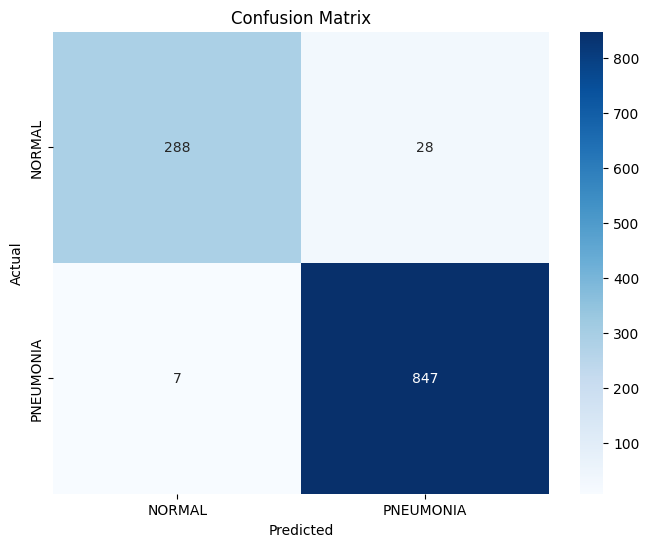

Threshold: 0.6
74/74 [==============================] - 2s 31ms/step - loss: 0.1045 - accuracy: 0.9701 - recall: 0.9918 - precision: 0.9680
Test Accuracy: 0.9700854420661926
Test Loss: 0.104536272585392
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9712973593570609
Recall: 0.990632318501171


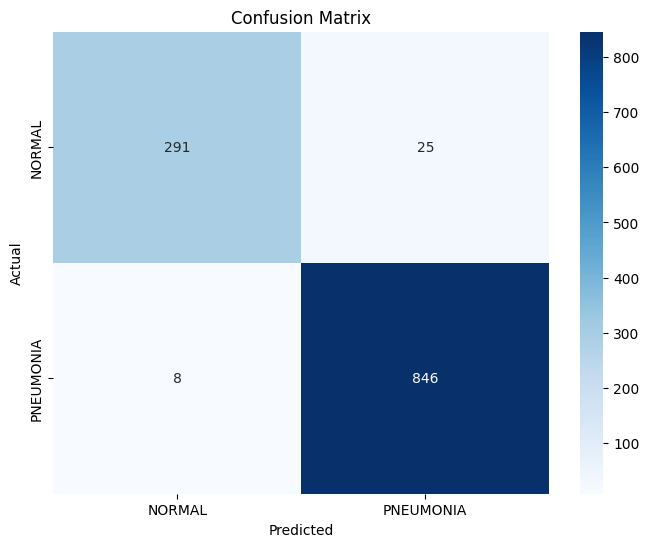

Threshold: 0.75
74/74 [==============================] - 2s 29ms/step - loss: 0.1045 - accuracy: 0.9701 - recall: 0.9918 - precision: 0.9680
Test Accuracy: 0.9700854420661926
Test Loss: 0.10453571379184723
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9756662804171495
Recall: 0.9859484777517564


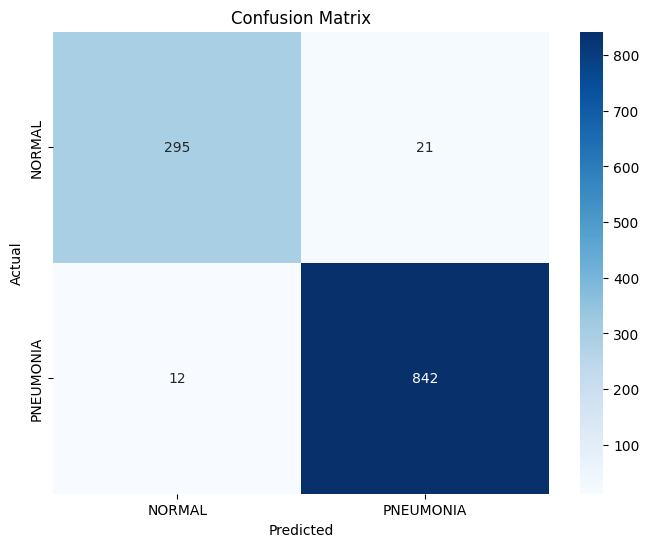

Threshold: 0.9
74/74 [==============================] - 2s 29ms/step - loss: 0.1045 - accuracy: 0.9701 - recall: 0.9918 - precision: 0.9680
Test Accuracy: 0.9700854420661926
Test Loss: 0.10453569889068604
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9801169590643275
Recall: 0.9812646370023419


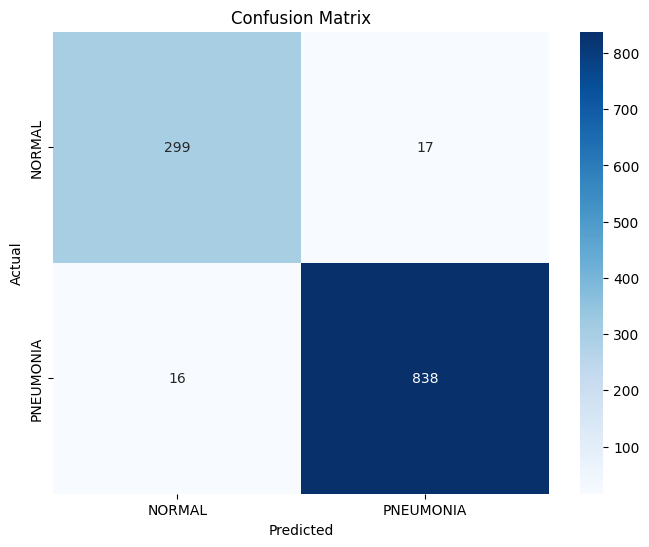

Threshold: 0.95
74/74 [==============================] - 2s 30ms/step - loss: 0.1045 - accuracy: 0.9701 - recall: 0.9918 - precision: 0.9680
Test Accuracy: 0.9700854420661926
Test Loss: 0.10453569144010544
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9846517119244392
Recall: 0.9765807962529274


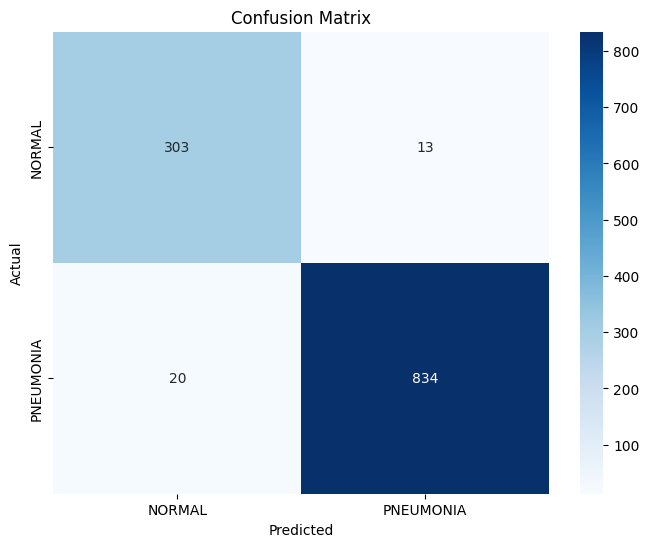

Threshold: 0.99
74/74 [==============================] - 2s 29ms/step - loss: 0.1045 - accuracy: 0.9701 - recall: 0.9918 - precision: 0.9680
Test Accuracy: 0.9700854420661926
Test Loss: 0.10453570634126663
Length predictions: 1170
Hand calculated accuracy: 0.9564
Accuracy: 0.9564102564102565
Precision: 0.9914320685434517
Recall: 0.9484777517564403


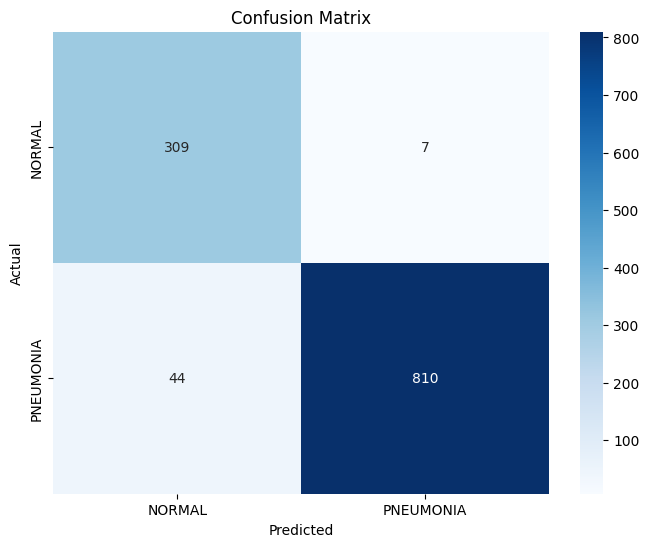

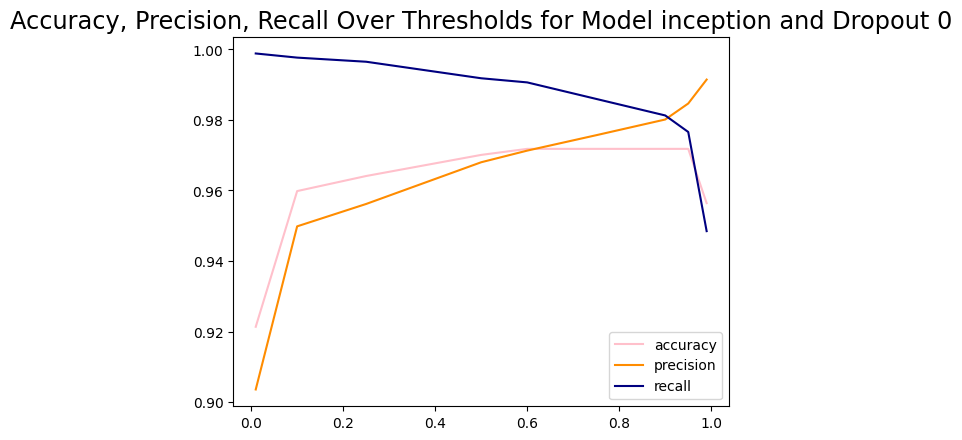



_______________


Model Name: inception
Dropout: 0.2
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 25s 88ms/step - loss: 0.2428 - accuracy: 0.9000 - recall: 0.9445 - precision: 0.9205 - val_loss: 0.1438 - val_accuracy: 0.9438 - val_recall: 0.9509 - val_precision: 0.9714
Epoch 2/4
257/257 [==============================] - 22s 85ms/step - loss: 0.1057 - accuracy: 0.9610 - recall: 0.9736 - precision: 0.9729 - val_loss: 0.1280 - val_accuracy: 0.9540 - val_recall: 0.9626 - val_precision: 0.9740
Epoch 3/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0826 - accuracy: 0.9719 - recall: 0.9786 - precision: 0.9829 - val_loss: 0.1386 - val_accuracy: 0.9557 - val_recall: 0.9533 - val_precision: 0.9855
Epoch 4/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0681 - accuracy: 0.9773 - recall: 0.9829 - precision: 0.9859 - val_loss

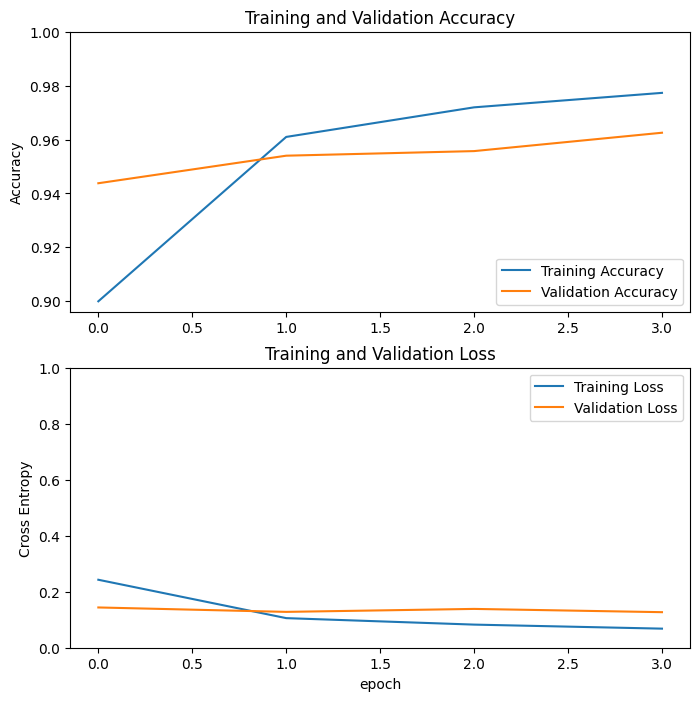

Threshold: 0.01
74/74 [==============================] - 2s 31ms/step - loss: 0.1378 - accuracy: 0.9632 - recall: 0.9941 - precision: 0.9572
Test Accuracy: 0.9632478356361389
Test Loss: 0.13783740997314453
Length predictions: 1170
Hand calculated accuracy: 0.888
Accuracy: 0.888034188034188
Precision: 0.867005076142132
Recall: 1.0


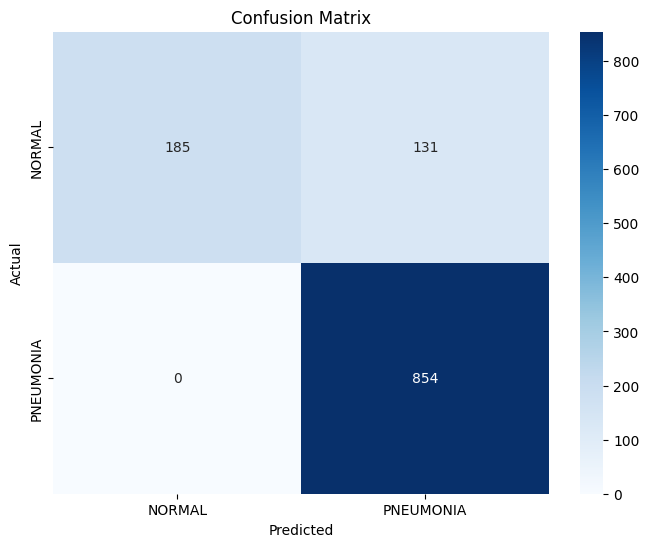

Threshold: 0.1
74/74 [==============================] - 2s 30ms/step - loss: 0.1378 - accuracy: 0.9632 - recall: 0.9941 - precision: 0.9572
Test Accuracy: 0.9632478356361389
Test Loss: 0.13783739507198334
Length predictions: 1170
Hand calculated accuracy: 0.9436
Accuracy: 0.9435897435897436
Precision: 0.9301310043668122
Recall: 0.9976580796252927


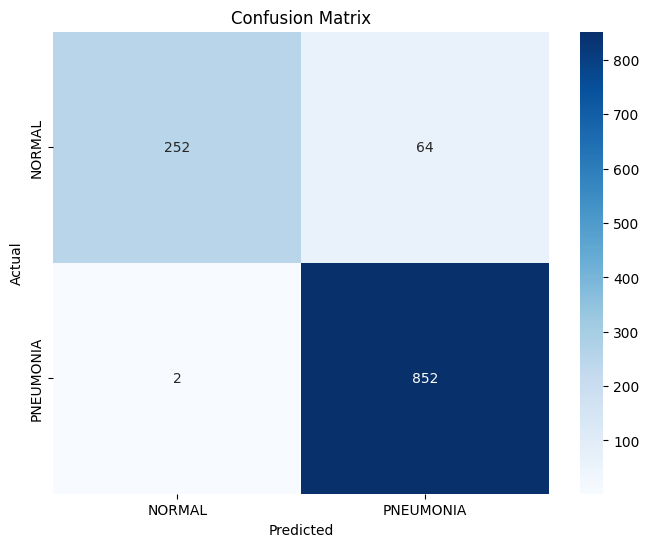

Threshold: 0.25
74/74 [==============================] - 2s 29ms/step - loss: 0.1378 - accuracy: 0.9632 - recall: 0.9941 - precision: 0.9572
Test Accuracy: 0.9632478356361389
Test Loss: 0.1378374695777893
Length predictions: 1170
Hand calculated accuracy: 0.9547
Accuracy: 0.9547008547008548
Precision: 0.9435215946843853
Recall: 0.9976580796252927


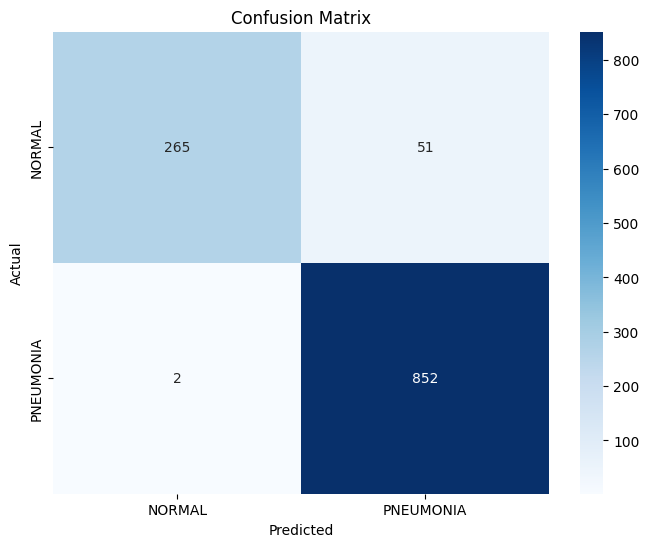

Threshold: 0.5
74/74 [==============================] - 2s 30ms/step - loss: 0.1378 - accuracy: 0.9632 - recall: 0.9941 - precision: 0.9572
Test Accuracy: 0.9632478356361389
Test Loss: 0.1378374546766281
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.9571589627959414
Recall: 0.9941451990632318


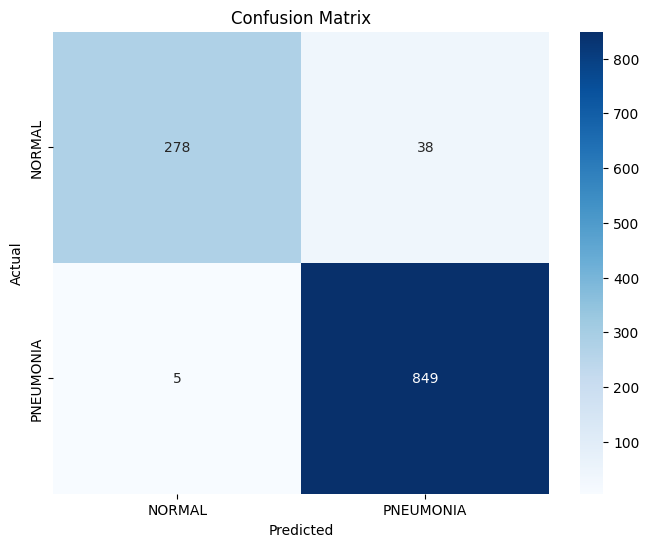

Threshold: 0.6
74/74 [==============================] - 2s 30ms/step - loss: 0.1378 - accuracy: 0.9632 - recall: 0.9941 - precision: 0.9572
Test Accuracy: 0.9632478356361389
Test Loss: 0.1378374546766281
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.9592298980747452
Recall: 0.9918032786885246


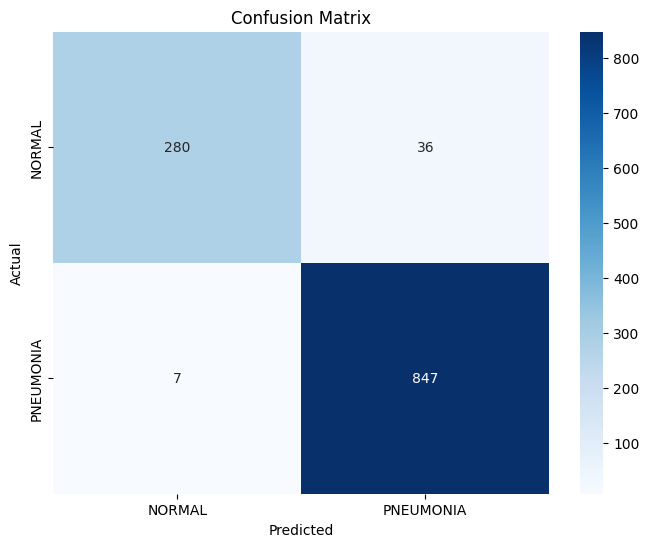

Threshold: 0.75
74/74 [==============================] - 2s 29ms/step - loss: 0.1378 - accuracy: 0.9632 - recall: 0.9941 - precision: 0.9572
Test Accuracy: 0.9632478356361389
Test Loss: 0.13783742487430573
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.9634285714285714
Recall: 0.9871194379391101


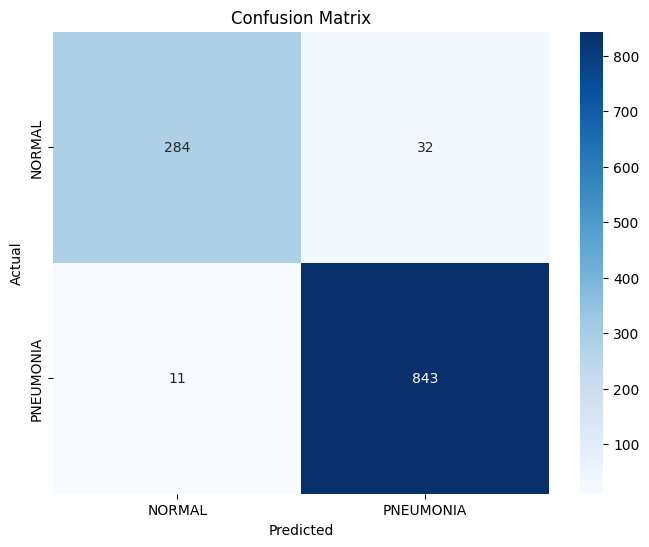

Threshold: 0.9
74/74 [==============================] - 2s 29ms/step - loss: 0.1378 - accuracy: 0.9632 - recall: 0.9941 - precision: 0.9572
Test Accuracy: 0.9632478356361389
Test Loss: 0.13783742487430573
Length predictions: 1170
Hand calculated accuracy: 0.9607
Accuracy: 0.9606837606837607
Precision: 0.9675925925925926
Recall: 0.9789227166276346


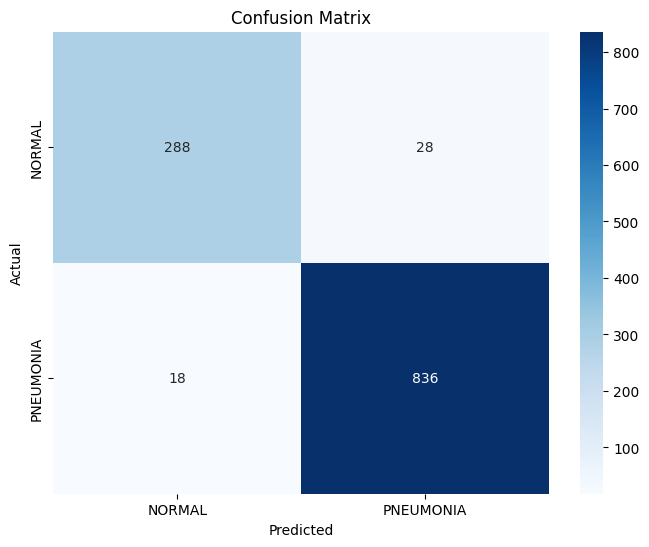

Threshold: 0.95
74/74 [==============================] - 2s 30ms/step - loss: 0.1378 - accuracy: 0.9632 - recall: 0.9941 - precision: 0.9572
Test Accuracy: 0.9632478356361389
Test Loss: 0.13783743977546692
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.9753810082063306
Recall: 0.9742388758782201


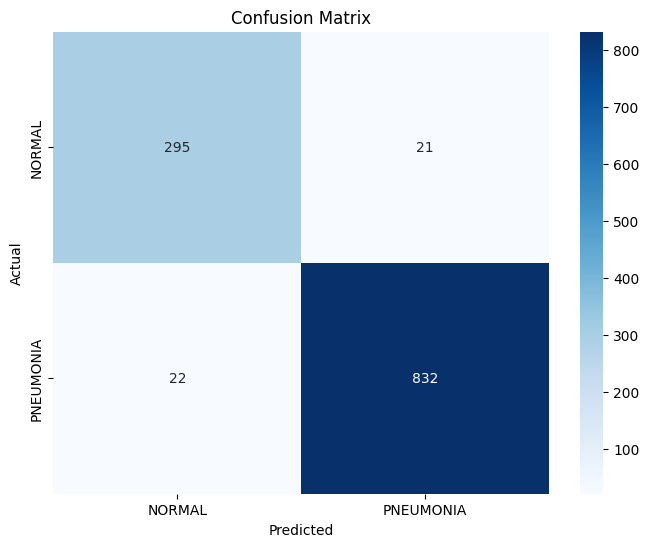

Threshold: 0.99
74/74 [==============================] - 2s 30ms/step - loss: 0.1378 - accuracy: 0.9632 - recall: 0.9941 - precision: 0.9572
Test Accuracy: 0.9632478356361389
Test Loss: 0.13783743977546692
Length predictions: 1170
Hand calculated accuracy: 0.9564
Accuracy: 0.9564102564102565
Precision: 0.9878493317132442
Recall: 0.9519906323185011


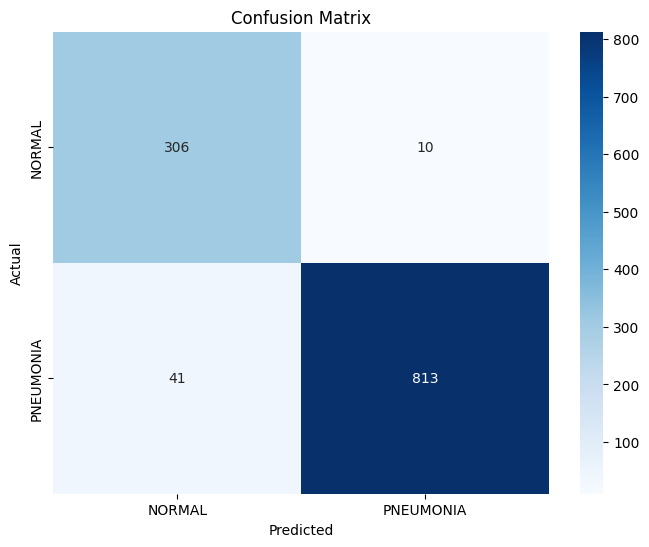

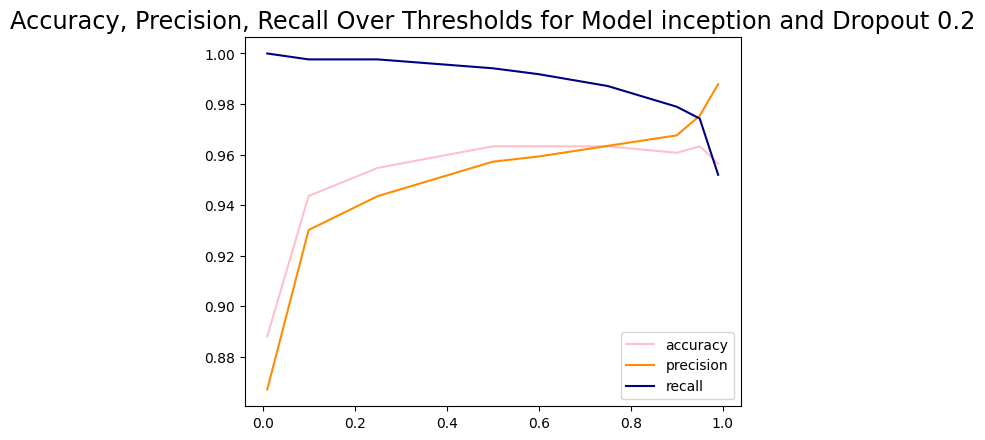



_______________


Model Name: inception
Dropout: 0.5
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 26s 88ms/step - loss: 0.1743 - accuracy: 0.9339 - recall: 0.9542 - precision: 0.9552 - val_loss: 0.1780 - val_accuracy: 0.9489 - val_recall: 0.9977 - val_precision: 0.9364
Epoch 2/4
257/257 [==============================] - 22s 86ms/step - loss: 0.1015 - accuracy: 0.9641 - recall: 0.9746 - precision: 0.9762 - val_loss: 0.1596 - val_accuracy: 0.9455 - val_recall: 0.9369 - val_precision: 0.9877
Epoch 3/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0732 - accuracy: 0.9773 - recall: 0.9829 - precision: 0.9859 - val_loss: 0.1052 - val_accuracy: 0.9608 - val_recall: 0.9766 - val_precision: 0.9698
Epoch 4/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0690 - accuracy: 0.9776 - recall: 0.9846 - precision: 0.9846 - val_loss

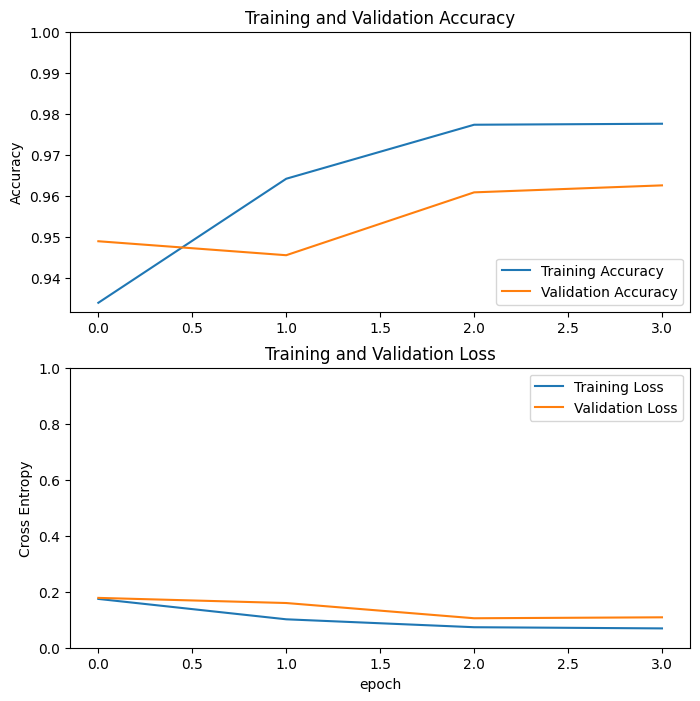

Threshold: 0.01
74/74 [==============================] - 2s 29ms/step - loss: 0.1248 - accuracy: 0.9607 - recall: 0.9696 - precision: 0.9764
Test Accuracy: 0.9606837630271912
Test Loss: 0.12477950751781464
Length predictions: 1170
Hand calculated accuracy: 0.9393
Accuracy: 0.9393162393162393
Precision: 0.926006528835691
Recall: 0.9964871194379391


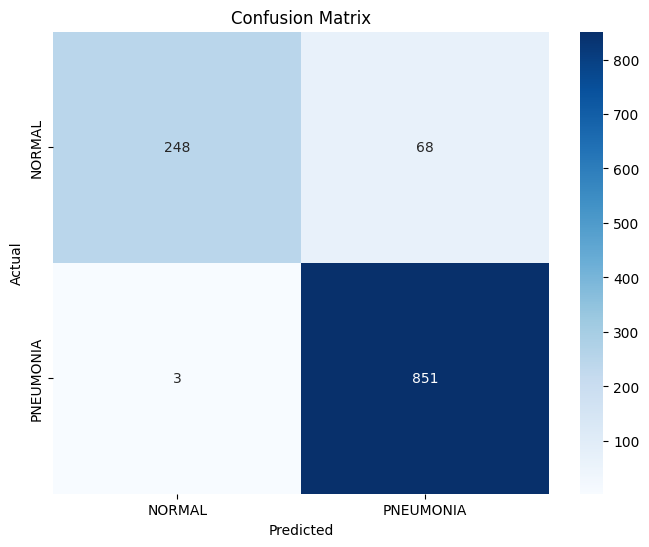

Threshold: 0.1
74/74 [==============================] - 2s 29ms/step - loss: 0.1248 - accuracy: 0.9607 - recall: 0.9696 - precision: 0.9764
Test Accuracy: 0.9606837630271912
Test Loss: 0.12477950751781464
Length predictions: 1170
Hand calculated accuracy: 0.9556
Accuracy: 0.9555555555555556
Precision: 0.9536199095022625
Recall: 0.9871194379391101


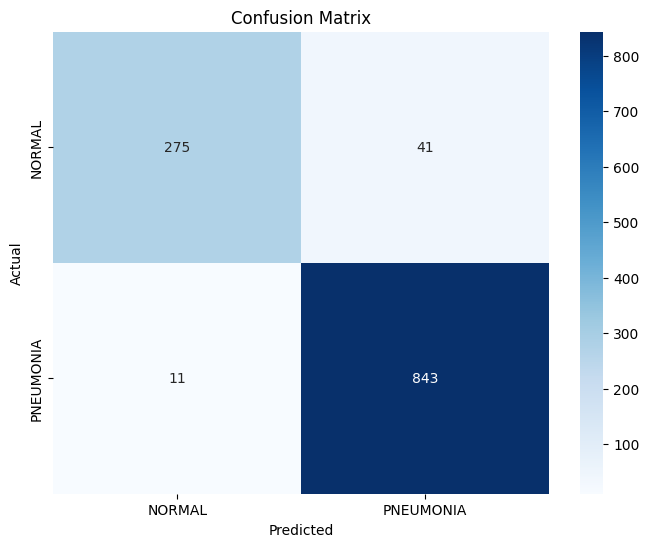

Threshold: 0.25
74/74 [==============================] - 2s 29ms/step - loss: 0.1248 - accuracy: 0.9607 - recall: 0.9696 - precision: 0.9764
Test Accuracy: 0.9606837630271912
Test Loss: 0.12477942556142807
Length predictions: 1170
Hand calculated accuracy: 0.9615
Accuracy: 0.9615384615384616
Precision: 0.9676300578034682
Recall: 0.9800936768149883


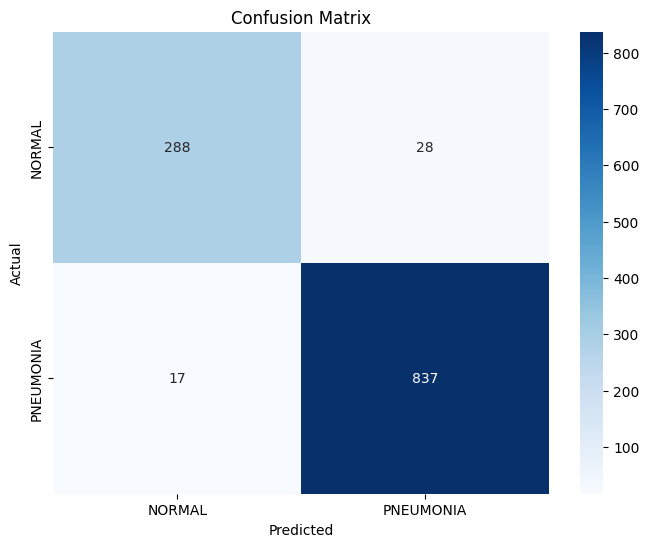

Threshold: 0.5
74/74 [==============================] - 2s 29ms/step - loss: 0.1248 - accuracy: 0.9607 - recall: 0.9696 - precision: 0.9764
Test Accuracy: 0.9606837630271912
Test Loss: 0.12477951496839523
Length predictions: 1170
Hand calculated accuracy: 0.9607
Accuracy: 0.9606837606837607
Precision: 0.9764150943396226
Recall: 0.9695550351288056


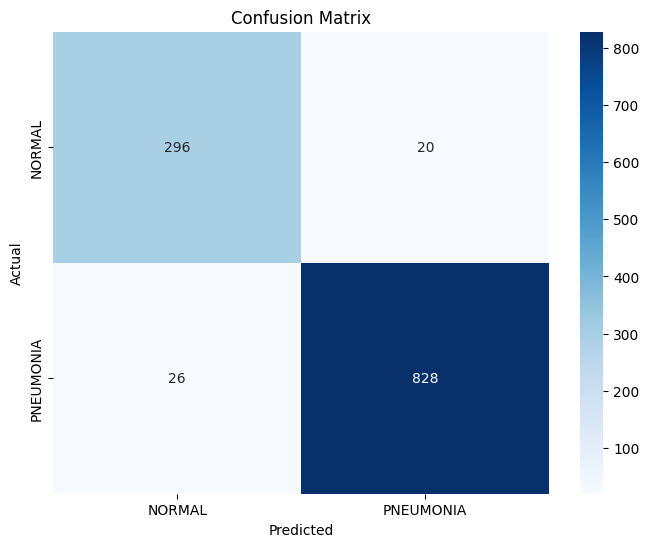

Threshold: 0.6
74/74 [==============================] - 2s 28ms/step - loss: 0.1248 - accuracy: 0.9607 - recall: 0.9696 - precision: 0.9764
Test Accuracy: 0.9606837630271912
Test Loss: 0.12477950751781464
Length predictions: 1170
Hand calculated accuracy: 0.9607
Accuracy: 0.9606837606837607
Precision: 0.9809523809523809
Recall: 0.9648711943793911


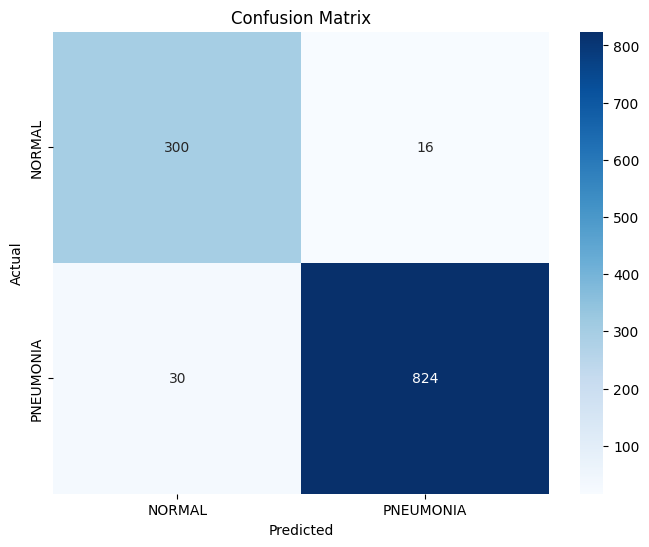

Threshold: 0.75
74/74 [==============================] - 2s 29ms/step - loss: 0.1248 - accuracy: 0.9607 - recall: 0.9696 - precision: 0.9764
Test Accuracy: 0.9606837630271912
Test Loss: 0.12477947771549225
Length predictions: 1170
Hand calculated accuracy: 0.9564
Accuracy: 0.9564102564102565
Precision: 0.9819927971188476
Recall: 0.9578454332552693


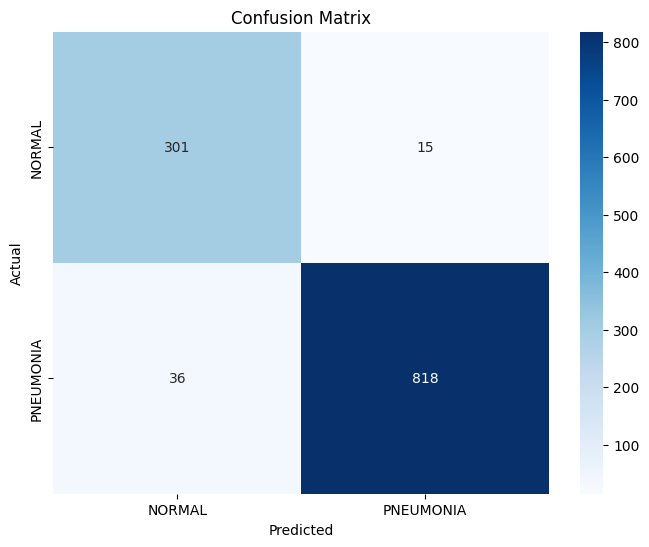

Threshold: 0.9
74/74 [==============================] - 2s 29ms/step - loss: 0.1248 - accuracy: 0.9607 - recall: 0.9696 - precision: 0.9764
Test Accuracy: 0.9606837630271912
Test Loss: 0.12477949261665344
Length predictions: 1170
Hand calculated accuracy: 0.941
Accuracy: 0.941025641025641
Precision: 0.9851668726823238
Recall: 0.9332552693208431


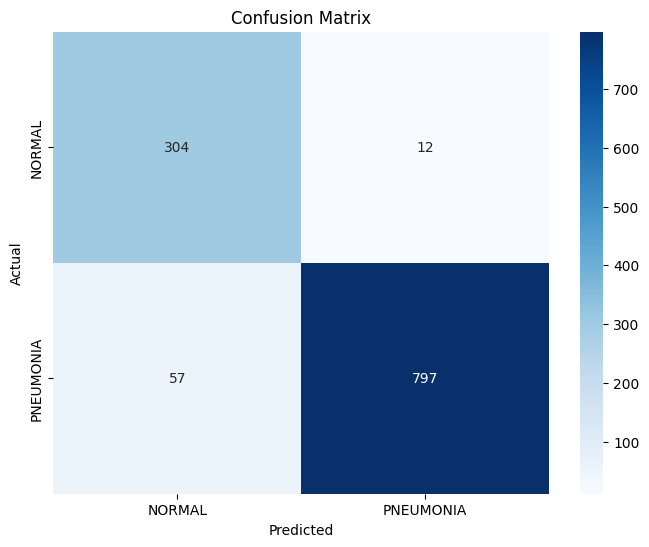

Threshold: 0.95
74/74 [==============================] - 2s 29ms/step - loss: 0.1248 - accuracy: 0.9607 - recall: 0.9696 - precision: 0.9764
Test Accuracy: 0.9606837630271912
Test Loss: 0.12477949261665344
Length predictions: 1170
Hand calculated accuracy: 0.9333
Accuracy: 0.9333333333333333
Precision: 0.9862155388471178
Recall: 0.9215456674473068


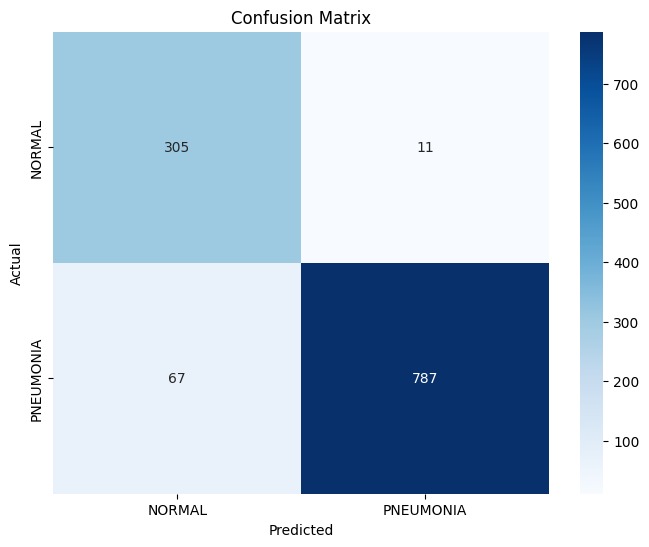

Threshold: 0.99
74/74 [==============================] - 2s 29ms/step - loss: 0.1248 - accuracy: 0.9607 - recall: 0.9696 - precision: 0.9764
Test Accuracy: 0.9606837630271912
Test Loss: 0.12477801740169525
Length predictions: 1170
Hand calculated accuracy: 0.9077
Accuracy: 0.9076923076923077
Precision: 0.9933862433862434
Recall: 0.8793911007025761


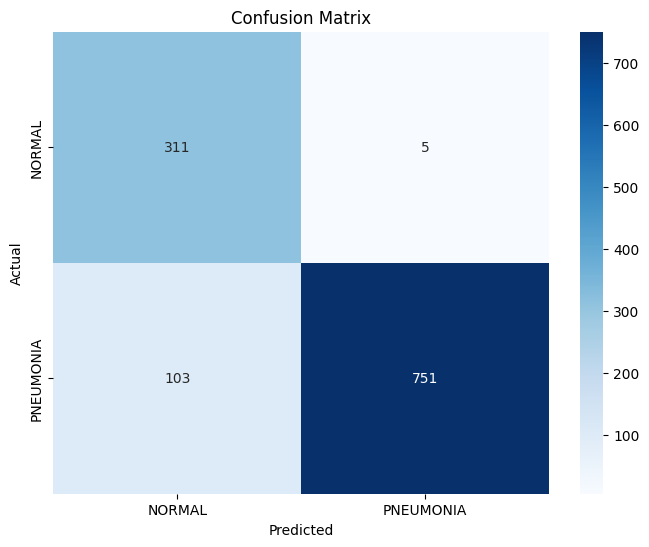

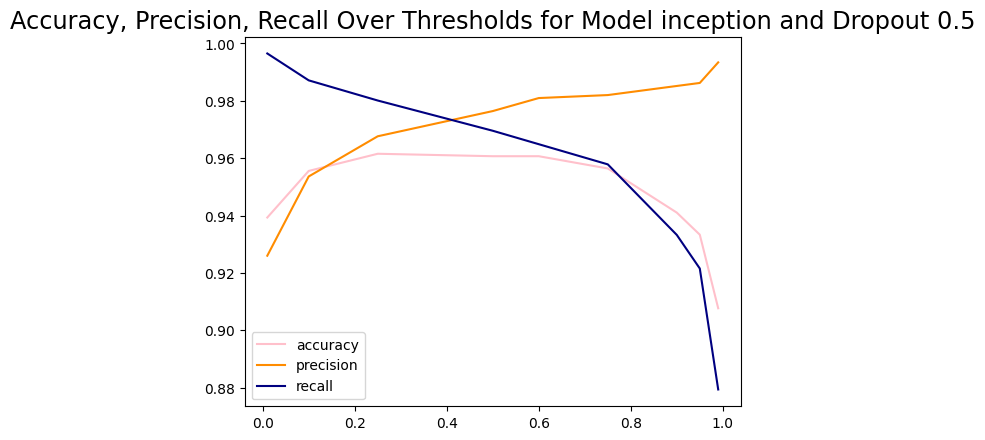



_______________


Model Name: inception
Dropout: 0.7
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 25s 88ms/step - loss: 0.6164 - accuracy: 0.7131 - recall: 0.9478 - precision: 0.7354 - val_loss: 0.5717 - val_accuracy: 0.7291 - val_recall: 1.0000 - val_precision: 0.7291
Epoch 2/4
257/257 [==============================] - 22s 86ms/step - loss: 0.5047 - accuracy: 0.7577 - recall: 0.9311 - precision: 0.7797 - val_loss: 0.2915 - val_accuracy: 0.8790 - val_recall: 0.8481 - val_precision: 0.9837
Epoch 3/4
257/257 [==============================] - 22s 86ms/step - loss: 0.1709 - accuracy: 0.9356 - recall: 0.9519 - precision: 0.9596 - val_loss: 0.1018 - val_accuracy: 0.9642 - val_recall: 0.9696 - val_precision: 0.9811
Epoch 4/4
257/257 [==============================] - 22s 86ms/step - loss: 0.1243 - accuracy: 0.9622 - recall: 0.9759 - precision: 0.9724 - val_loss

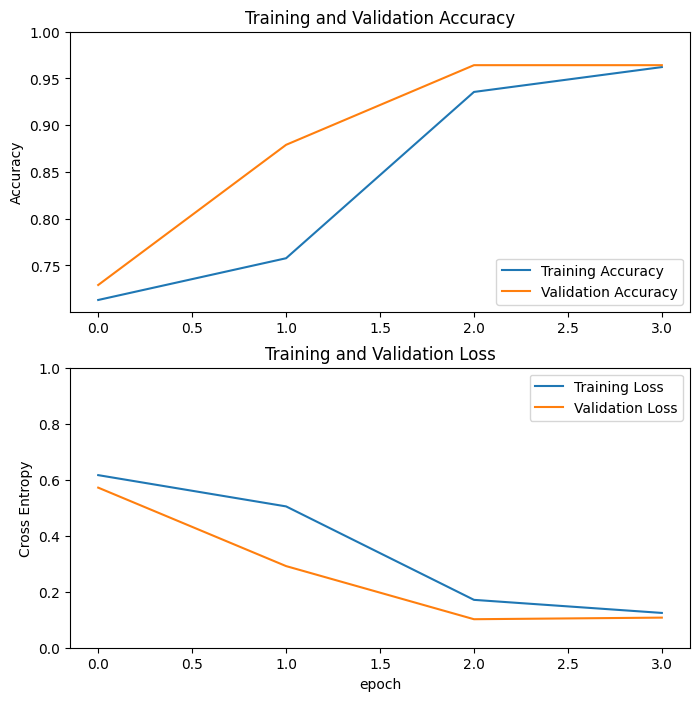

Threshold: 0.01
74/74 [==============================] - 2s 29ms/step - loss: 0.1320 - accuracy: 0.9573 - recall: 0.9824 - precision: 0.9600
Test Accuracy: 0.9572649598121643
Test Loss: 0.13198266923427582
Length predictions: 1170
Hand calculated accuracy: 0.8248
Accuracy: 0.8247863247863247
Precision: 0.8064211520302171
Recall: 1.0


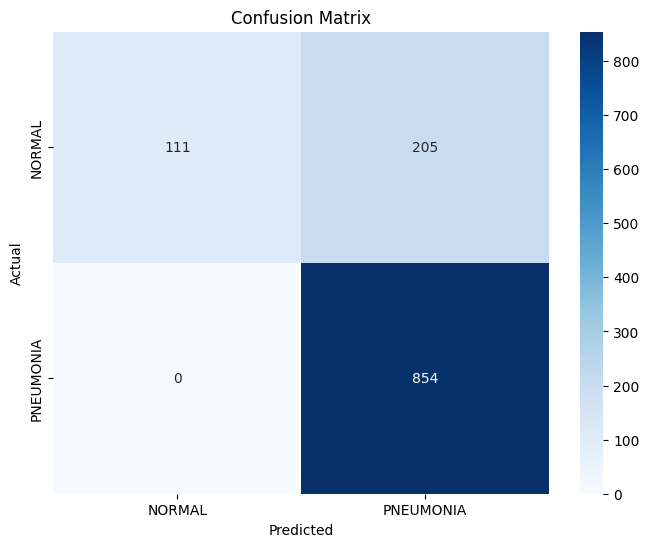

Threshold: 0.1
74/74 [==============================] - 2s 30ms/step - loss: 0.1320 - accuracy: 0.9573 - recall: 0.9824 - precision: 0.9600
Test Accuracy: 0.9572649598121643
Test Loss: 0.13198134303092957
Length predictions: 1170
Hand calculated accuracy: 0.9214
Accuracy: 0.9213675213675213
Precision: 0.9044585987261147
Recall: 0.9976580796252927


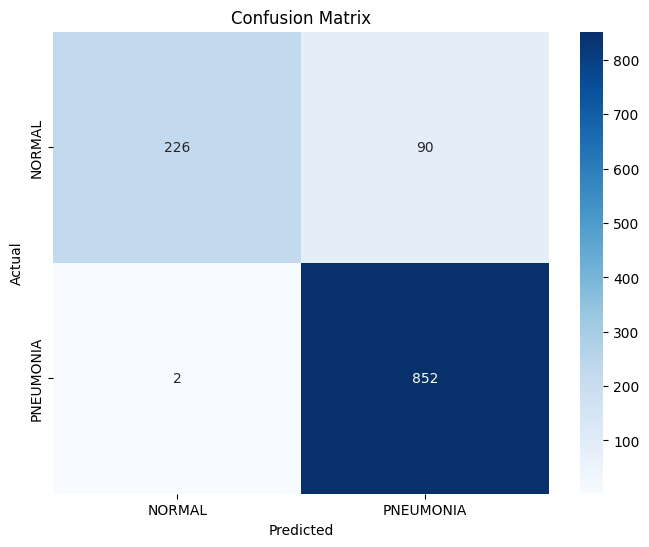

Threshold: 0.25
74/74 [==============================] - 2s 28ms/step - loss: 0.1320 - accuracy: 0.9573 - recall: 0.9824 - precision: 0.9600
Test Accuracy: 0.9572649598121643
Test Loss: 0.13198134303092957
Length predictions: 1170
Hand calculated accuracy: 0.9462
Accuracy: 0.9461538461538461
Precision: 0.937984496124031
Recall: 0.9918032786885246


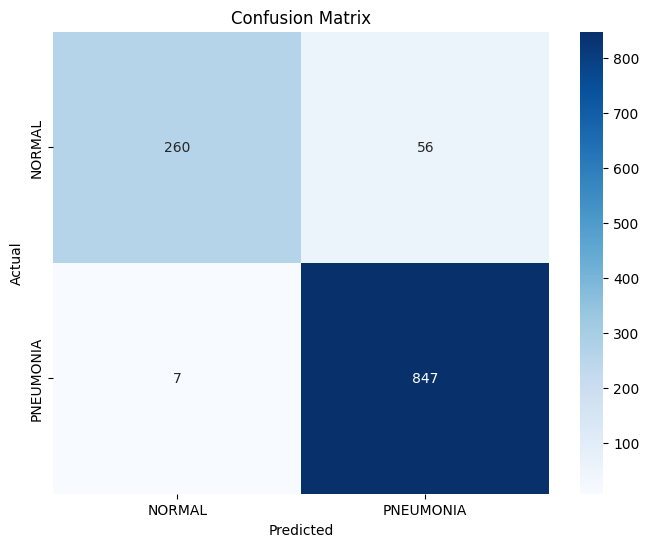

Threshold: 0.5
74/74 [==============================] - 2s 29ms/step - loss: 0.1320 - accuracy: 0.9573 - recall: 0.9824 - precision: 0.9600
Test Accuracy: 0.9572649598121643
Test Loss: 0.13198132812976837
Length predictions: 1170
Hand calculated accuracy: 0.9573
Accuracy: 0.9572649572649573
Precision: 0.959954233409611
Recall: 0.9824355971896955


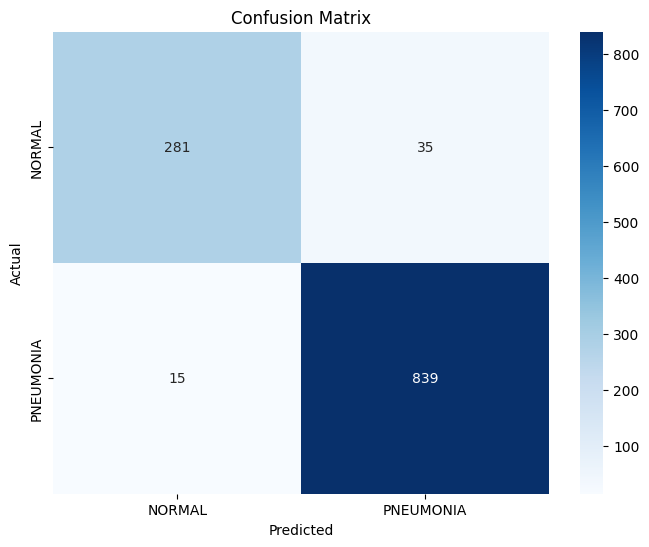

Threshold: 0.6
74/74 [==============================] - 2s 29ms/step - loss: 0.1320 - accuracy: 0.9573 - recall: 0.9824 - precision: 0.9600
Test Accuracy: 0.9572649598121643
Test Loss: 0.13198071718215942
Length predictions: 1170
Hand calculated accuracy: 0.9615
Accuracy: 0.9615384615384616
Precision: 0.9654775604142692
Recall: 0.9824355971896955


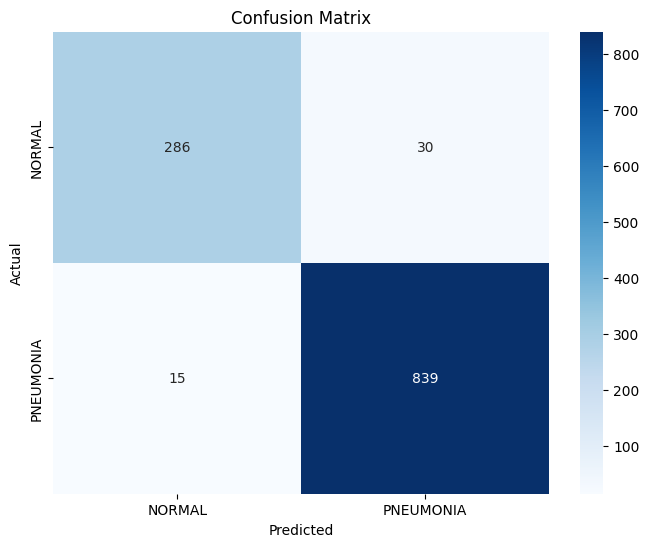

Threshold: 0.75
74/74 [==============================] - 2s 29ms/step - loss: 0.1320 - accuracy: 0.9573 - recall: 0.9824 - precision: 0.9600
Test Accuracy: 0.9572649598121643
Test Loss: 0.13198134303092957
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9732246798603027
Recall: 0.9789227166276346


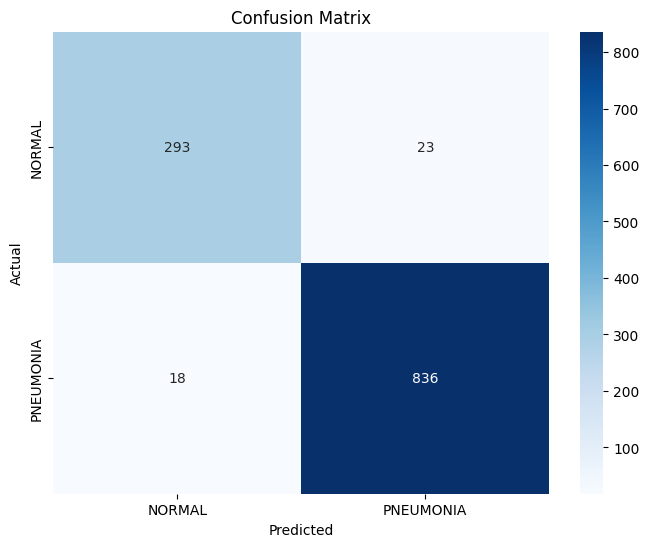

Threshold: 0.9
74/74 [==============================] - 2s 30ms/step - loss: 0.1320 - accuracy: 0.9573 - recall: 0.9824 - precision: 0.9600
Test Accuracy: 0.9572649598121643
Test Loss: 0.13198135793209076
Length predictions: 1170
Hand calculated accuracy: 0.959
Accuracy: 0.958974358974359
Precision: 0.9763593380614657
Recall: 0.9672131147540983


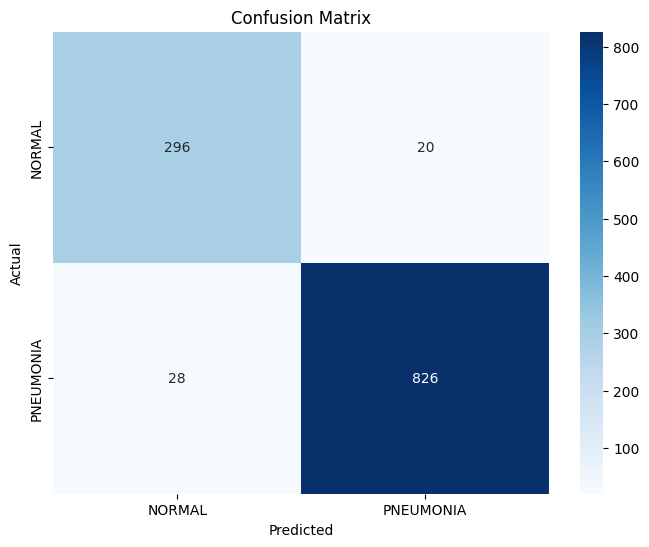

Threshold: 0.95
74/74 [==============================] - 2s 29ms/step - loss: 0.1320 - accuracy: 0.9573 - recall: 0.9824 - precision: 0.9600
Test Accuracy: 0.9572649598121643
Test Loss: 0.13198252022266388
Length predictions: 1170
Hand calculated accuracy: 0.9581
Accuracy: 0.9581196581196582
Precision: 0.980884109916368
Recall: 0.9613583138173302


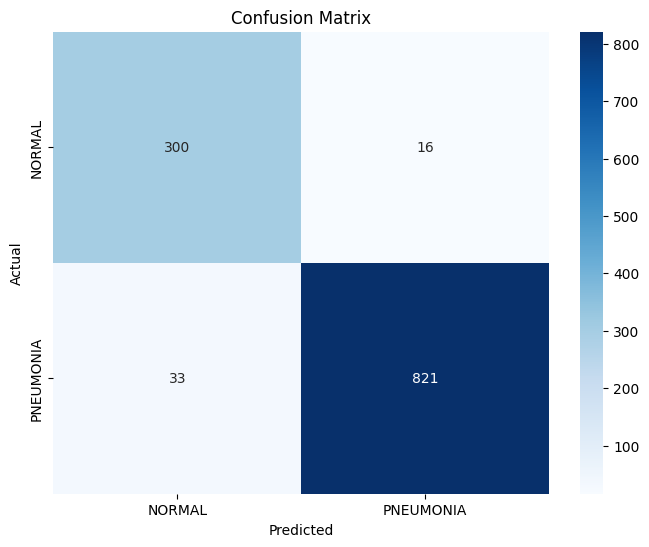

Threshold: 0.99
74/74 [==============================] - 2s 30ms/step - loss: 0.1320 - accuracy: 0.9573 - recall: 0.9824 - precision: 0.9600
Test Accuracy: 0.9572649598121643
Test Loss: 0.13198146224021912
Length predictions: 1170
Hand calculated accuracy: 0.9308
Accuracy: 0.9307692307692308
Precision: 0.987389659520807
Recall: 0.9168618266978923


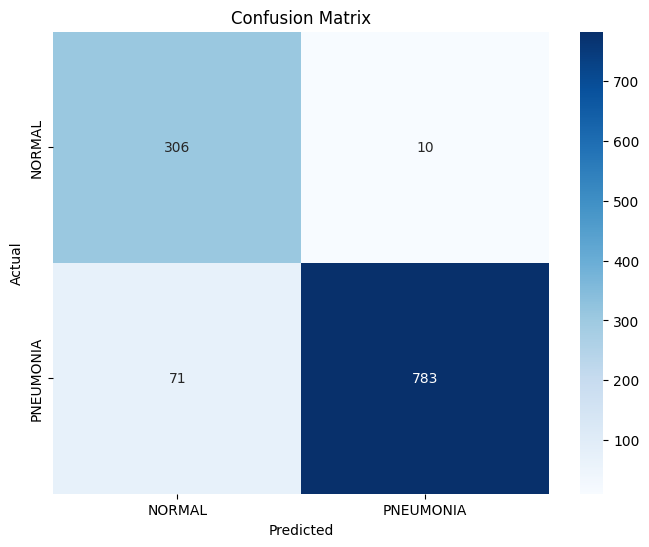

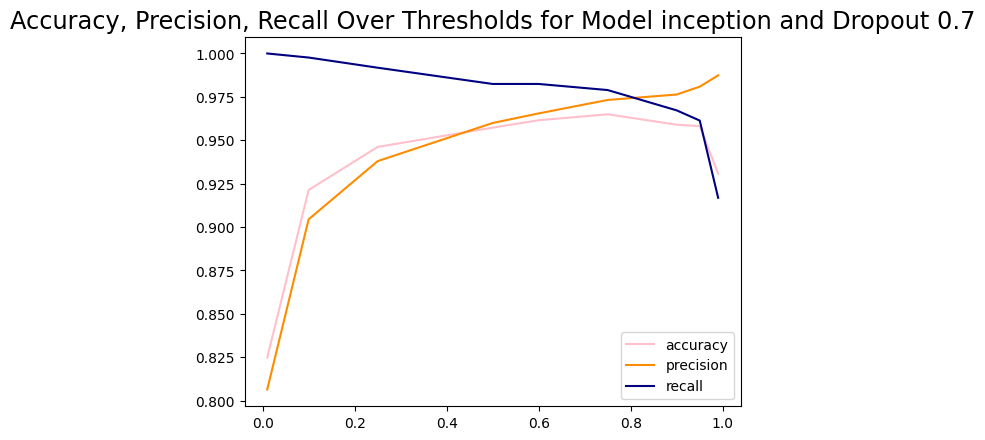



_______________


Model Name: inception
Dropout: 0
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 25s 88ms/step - loss: 0.2679 - accuracy: 0.8909 - recall: 0.9392 - precision: 0.9138 - val_loss: 0.1180 - val_accuracy: 0.9540 - val_recall: 0.9766 - val_precision: 0.9609
Epoch 2/4
257/257 [==============================] - 23s 88ms/step - loss: 0.1296 - accuracy: 0.9573 - recall: 0.9699 - precision: 0.9715 - val_loss: 0.1147 - val_accuracy: 0.9574 - val_recall: 0.9836 - val_precision: 0.9590
Epoch 3/4
257/257 [==============================] - 23s 88ms/step - loss: 0.0954 - accuracy: 0.9639 - recall: 0.9783 - precision: 0.9724 - val_loss: 0.1201 - val_accuracy: 0.9574 - val_recall: 0.9509 - val_precision: 0.9903
Epoch 4/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0572 - accuracy: 0.9802 - recall: 0.9870 - precision: 0.9860 - val_loss: 

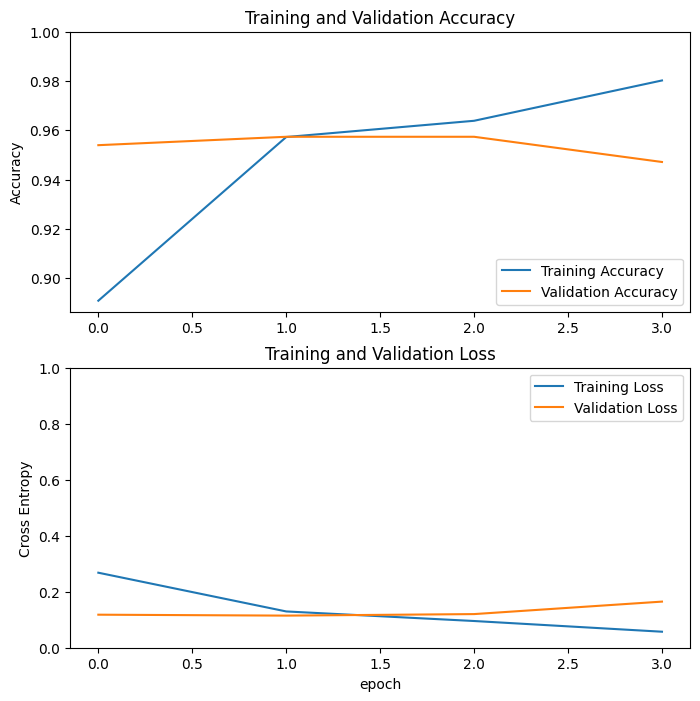

Threshold: 0.01
74/74 [==============================] - 2s 30ms/step - loss: 0.1763 - accuracy: 0.9410 - recall: 0.9262 - precision: 0.9925
Test Accuracy: 0.9410256147384644
Test Loss: 0.17625169456005096
Length predictions: 1170
Hand calculated accuracy: 0.9607
Accuracy: 0.9606837606837607
Precision: 0.963302752293578
Recall: 0.9836065573770492


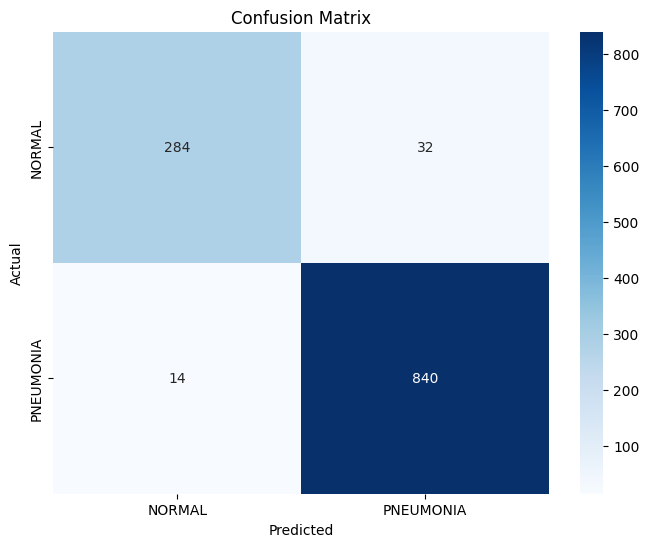

Threshold: 0.1
74/74 [==============================] - 2s 29ms/step - loss: 0.1763 - accuracy: 0.9410 - recall: 0.9262 - precision: 0.9925
Test Accuracy: 0.9410256147384644
Test Loss: 0.17625169456005096
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.98562874251497
Recall: 0.9637002341920374


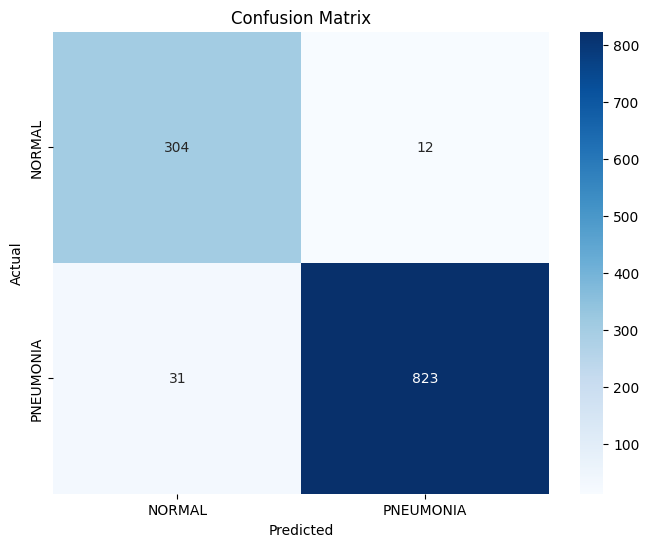

Threshold: 0.25
74/74 [==============================] - 2s 30ms/step - loss: 0.1763 - accuracy: 0.9410 - recall: 0.9262 - precision: 0.9925
Test Accuracy: 0.9410256147384644
Test Loss: 0.17625164985656738
Length predictions: 1170
Hand calculated accuracy: 0.9496
Accuracy: 0.9495726495726495
Precision: 0.9901356350184957
Recall: 0.9402810304449649


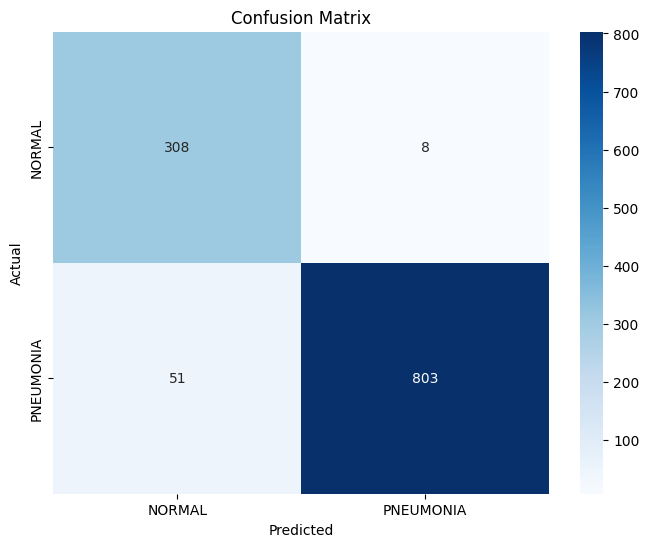

Threshold: 0.5
74/74 [==============================] - 2s 29ms/step - loss: 0.1763 - accuracy: 0.9410 - recall: 0.9262 - precision: 0.9925
Test Accuracy: 0.9410256147384644
Test Loss: 0.1762513965368271
Length predictions: 1170
Hand calculated accuracy: 0.941
Accuracy: 0.941025641025641
Precision: 0.9924717691342535
Recall: 0.9262295081967213


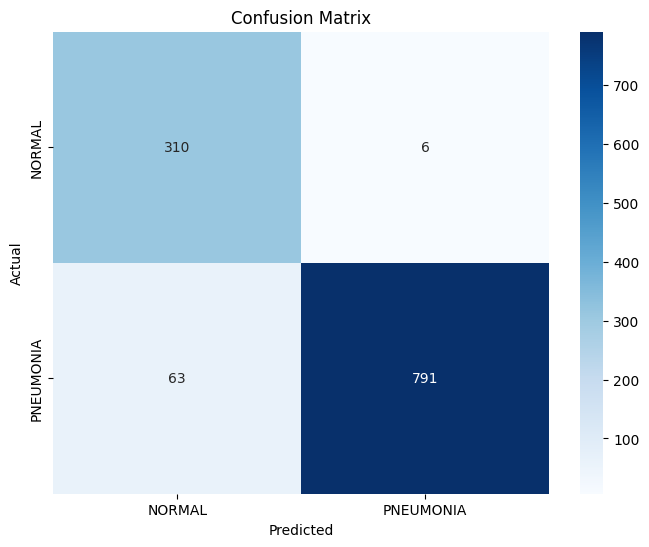

Threshold: 0.6
74/74 [==============================] - 2s 30ms/step - loss: 0.1763 - accuracy: 0.9410 - recall: 0.9262 - precision: 0.9925
Test Accuracy: 0.9410256147384644
Test Loss: 0.17625169456005096
Length predictions: 1170
Hand calculated accuracy: 0.9359
Accuracy: 0.9358974358974359
Precision: 0.9936628643852978
Recall: 0.9180327868852459


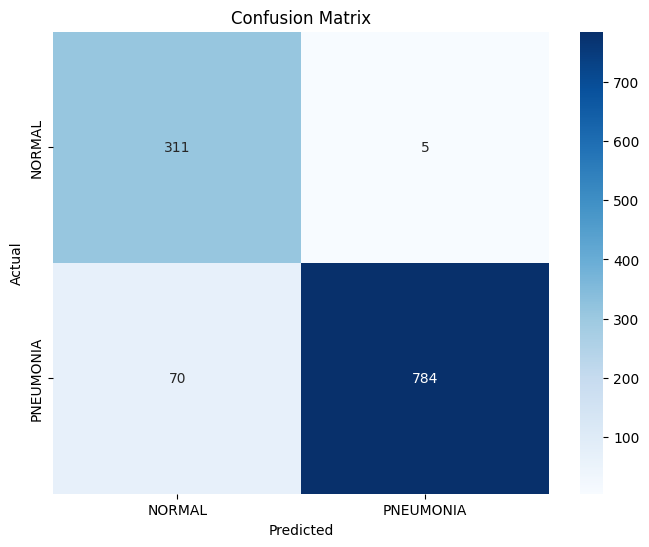

Threshold: 0.75
74/74 [==============================] - 2s 28ms/step - loss: 0.1763 - accuracy: 0.9410 - recall: 0.9262 - precision: 0.9925
Test Accuracy: 0.9410256147384644
Test Loss: 0.17625169456005096
Length predictions: 1170
Hand calculated accuracy: 0.9265
Accuracy: 0.9264957264957265
Precision: 0.9948453608247423
Recall: 0.9039812646370023


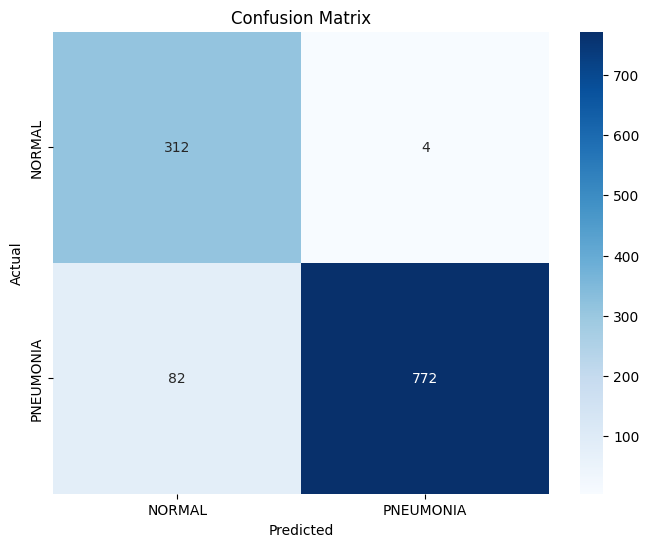

Threshold: 0.9
74/74 [==============================] - 2s 28ms/step - loss: 0.1763 - accuracy: 0.9410 - recall: 0.9262 - precision: 0.9925
Test Accuracy: 0.9410256147384644
Test Loss: 0.17625169456005096
Length predictions: 1170
Hand calculated accuracy: 0.912
Accuracy: 0.911965811965812
Precision: 0.99867197875166
Recall: 0.8805620608899297


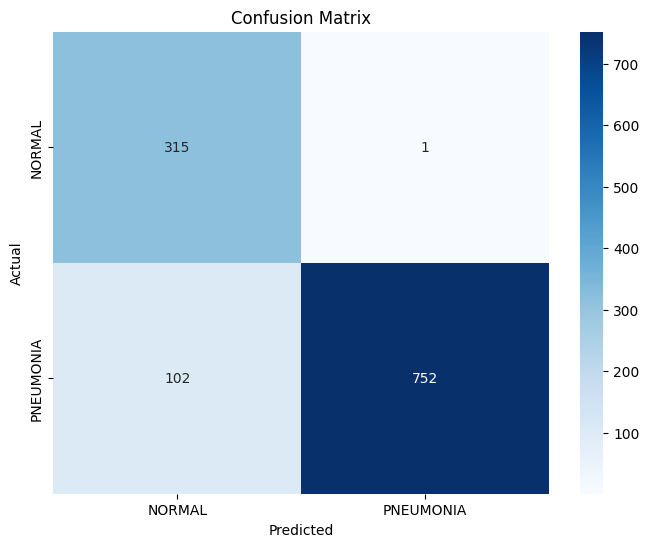

Threshold: 0.95
74/74 [==============================] - 2s 29ms/step - loss: 0.1763 - accuracy: 0.9410 - recall: 0.9262 - precision: 0.9925
Test Accuracy: 0.9410256147384644
Test Loss: 0.17625170946121216
Length predictions: 1170
Hand calculated accuracy: 0.8949
Accuracy: 0.8948717948717949
Precision: 1.0
Recall: 0.8559718969555035


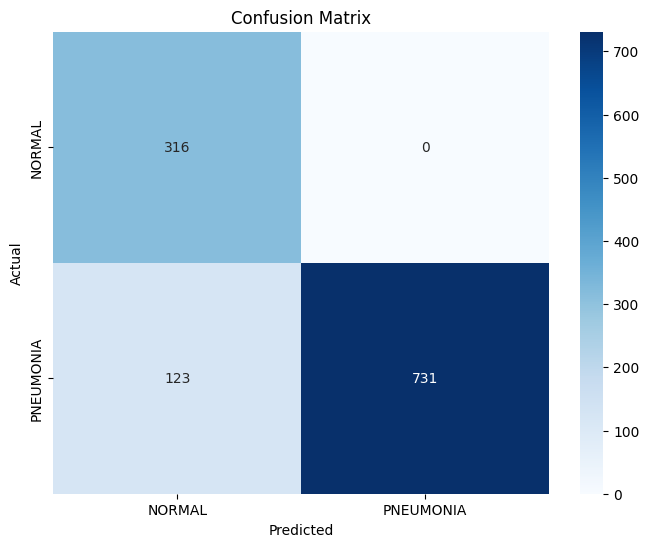

Threshold: 0.99
74/74 [==============================] - 2s 29ms/step - loss: 0.1763 - accuracy: 0.9410 - recall: 0.9262 - precision: 0.9925
Test Accuracy: 0.9410256147384644
Test Loss: 0.17625170946121216
Length predictions: 1170
Hand calculated accuracy: 0.8487
Accuracy: 0.8487179487179487
Precision: 1.0
Recall: 0.7927400468384075


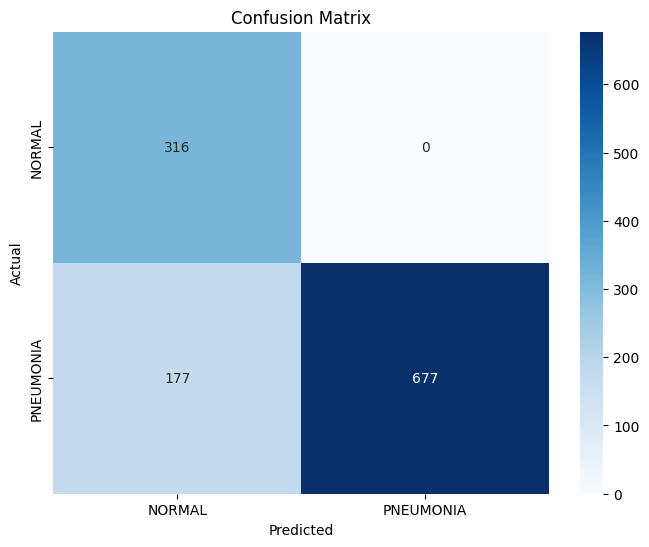

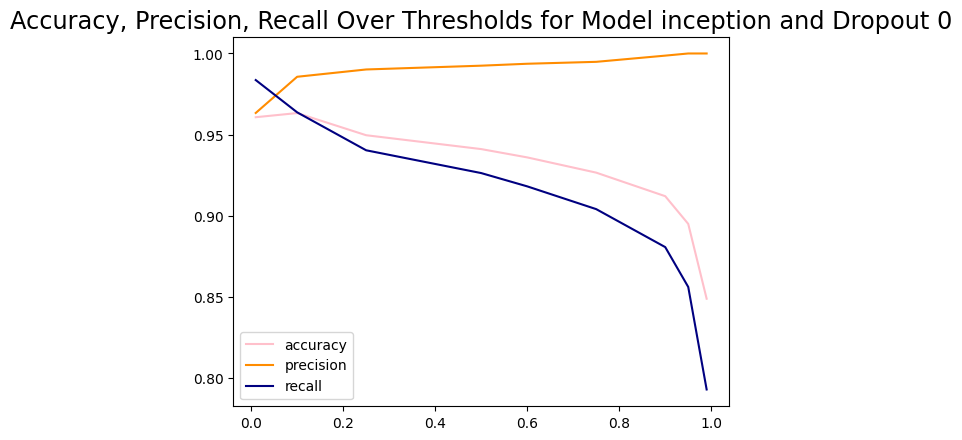



_______________


Model Name: inception
Dropout: 0.2
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 25s 88ms/step - loss: 0.2832 - accuracy: 0.8805 - recall: 0.9345 - precision: 0.9048 - val_loss: 0.1464 - val_accuracy: 0.9557 - val_recall: 0.9509 - val_precision: 0.9879
Epoch 2/4
257/257 [==============================] - 22s 86ms/step - loss: 0.1208 - accuracy: 0.9549 - recall: 0.9669 - precision: 0.9711 - val_loss: 0.2230 - val_accuracy: 0.9370 - val_recall: 0.9930 - val_precision: 0.9259
Epoch 3/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0868 - accuracy: 0.9656 - recall: 0.9749 - precision: 0.9779 - val_loss: 0.1395 - val_accuracy: 0.9370 - val_recall: 0.9229 - val_precision: 0.9900
Epoch 4/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0549 - accuracy: 0.9793 - recall: 0.9846 - precision: 0.9869 - val_loss

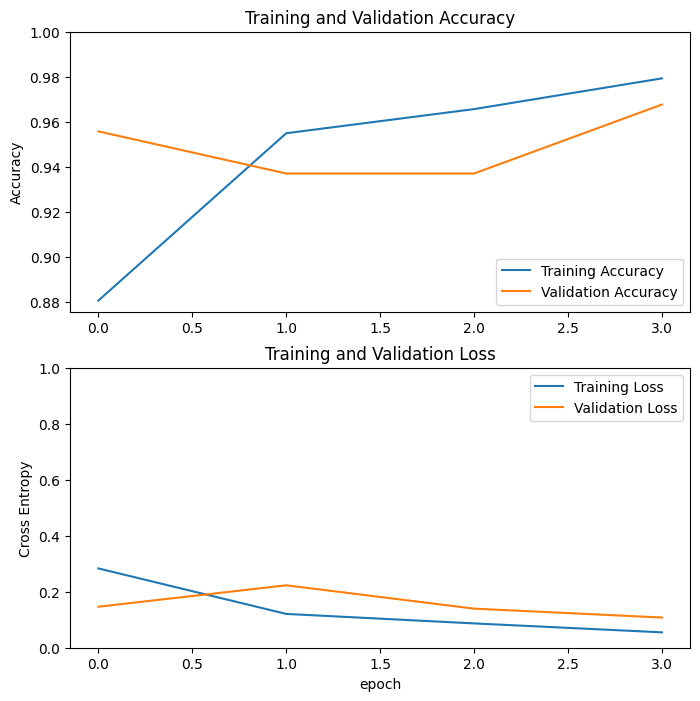

Threshold: 0.01
74/74 [==============================] - 2s 29ms/step - loss: 0.1545 - accuracy: 0.9632 - recall: 0.9801 - precision: 0.9699
Test Accuracy: 0.9632478356361389
Test Loss: 0.15452149510383606
Length predictions: 1170
Hand calculated accuracy: 0.9282
Accuracy: 0.9282051282051282
Precision: 0.9130901287553648
Recall: 0.9964871194379391


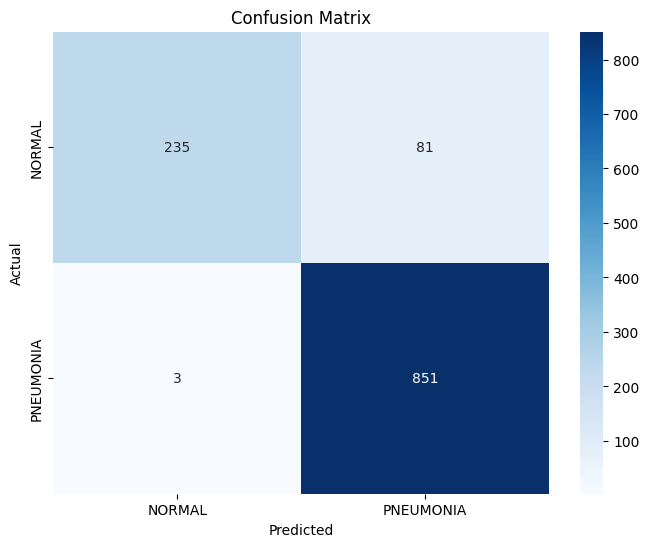

Threshold: 0.1
74/74 [==============================] - 2s 29ms/step - loss: 0.1545 - accuracy: 0.9632 - recall: 0.9801 - precision: 0.9699
Test Accuracy: 0.9632478356361389
Test Loss: 0.15452152490615845
Length predictions: 1170
Hand calculated accuracy: 0.9573
Accuracy: 0.9572649572649573
Precision: 0.9496644295302014
Recall: 0.9941451990632318


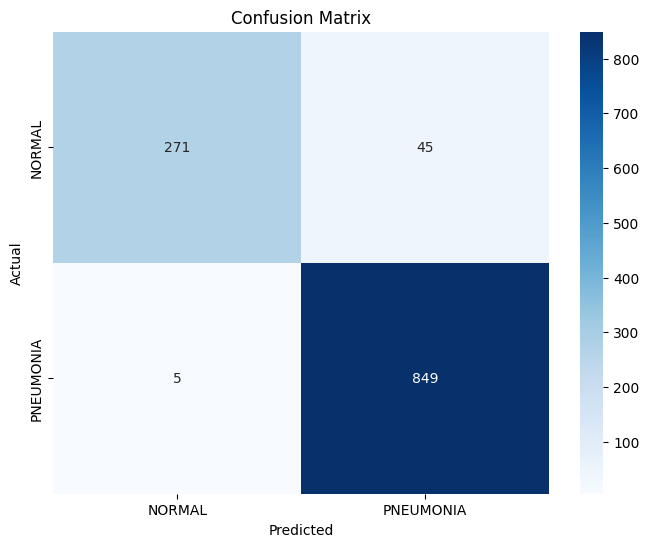

Threshold: 0.25
74/74 [==============================] - 2s 29ms/step - loss: 0.1545 - accuracy: 0.9632 - recall: 0.9801 - precision: 0.9699
Test Accuracy: 0.9632478356361389
Test Loss: 0.15452153980731964
Length predictions: 1170
Hand calculated accuracy: 0.9581
Accuracy: 0.9581196581196582
Precision: 0.9568671963677639
Recall: 0.9871194379391101


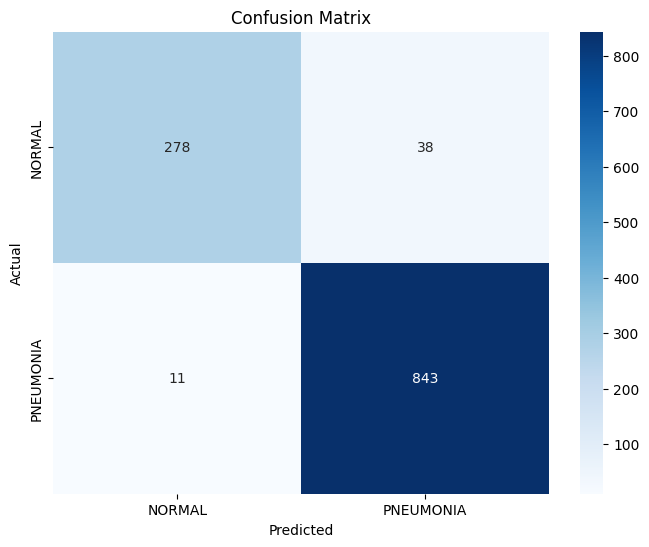

Threshold: 0.5
74/74 [==============================] - 2s 29ms/step - loss: 0.1545 - accuracy: 0.9632 - recall: 0.9801 - precision: 0.9699
Test Accuracy: 0.9632478356361389
Test Loss: 0.15452152490615845
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.9698725376593279
Recall: 0.9800936768149883


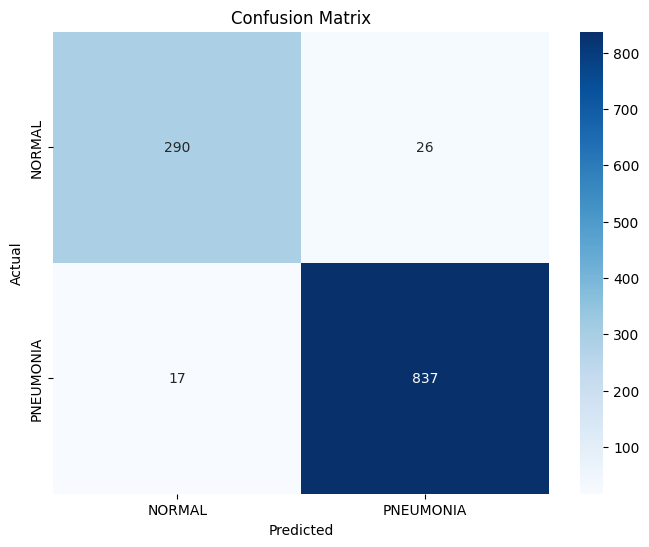

Threshold: 0.6
74/74 [==============================] - 2s 30ms/step - loss: 0.1545 - accuracy: 0.9632 - recall: 0.9801 - precision: 0.9699
Test Accuracy: 0.9632478356361389
Test Loss: 0.15452152490615845
Length predictions: 1170
Hand calculated accuracy: 0.9615
Accuracy: 0.9615384615384616
Precision: 0.9719953325554259
Recall: 0.9754098360655737


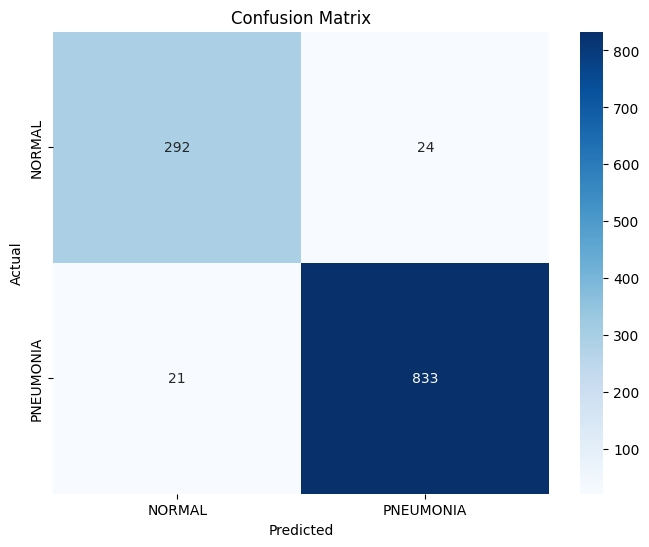

Threshold: 0.75
74/74 [==============================] - 2s 28ms/step - loss: 0.1545 - accuracy: 0.9632 - recall: 0.9801 - precision: 0.9699
Test Accuracy: 0.9632478356361389
Test Loss: 0.15452152490615845
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.9787485242030697
Recall: 0.9707259953161592


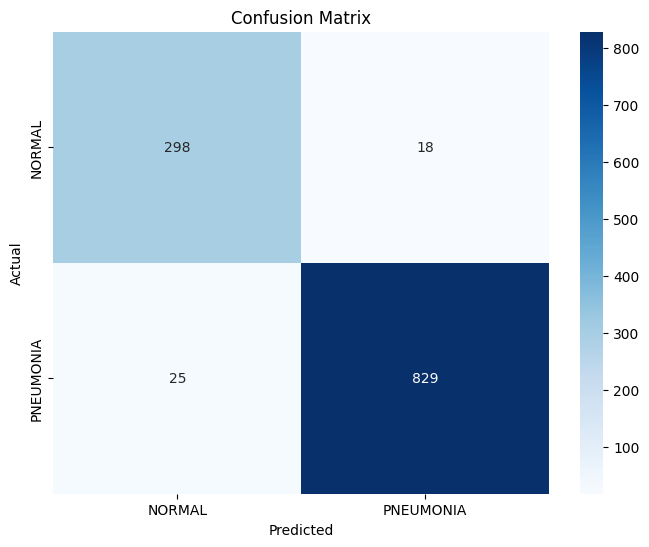

Threshold: 0.9
74/74 [==============================] - 2s 29ms/step - loss: 0.1545 - accuracy: 0.9632 - recall: 0.9801 - precision: 0.9699
Test Accuracy: 0.9632478356361389
Test Loss: 0.15452158451080322
Length predictions: 1170
Hand calculated accuracy: 0.959
Accuracy: 0.958974358974359
Precision: 0.9820574162679426
Recall: 0.9613583138173302


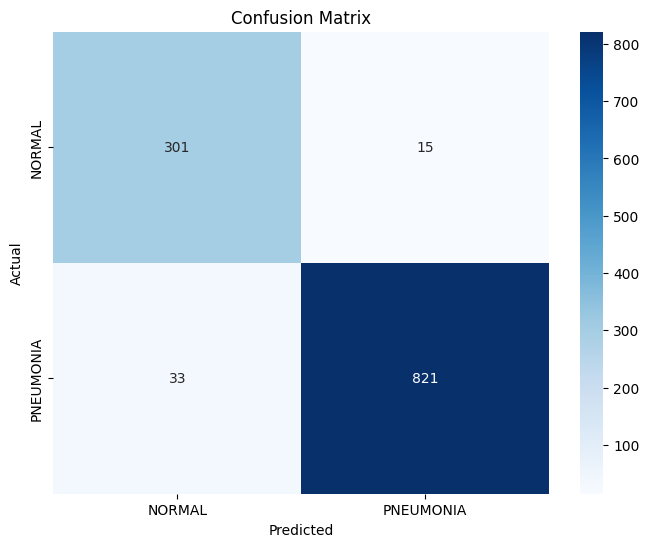

Threshold: 0.95
74/74 [==============================] - 2s 30ms/step - loss: 0.1545 - accuracy: 0.9632 - recall: 0.9801 - precision: 0.9699
Test Accuracy: 0.9632478356361389
Test Loss: 0.15452155470848083
Length predictions: 1170
Hand calculated accuracy: 0.953
Accuracy: 0.9529914529914529
Precision: 0.9830713422007256
Recall: 0.9519906323185011


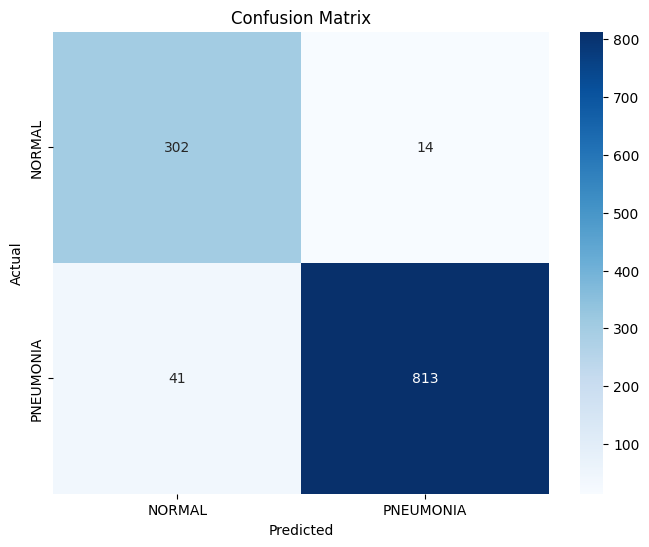

Threshold: 0.99
74/74 [==============================] - 2s 29ms/step - loss: 0.1545 - accuracy: 0.9632 - recall: 0.9801 - precision: 0.9699
Test Accuracy: 0.9632478356361389
Test Loss: 0.15452182292938232
Length predictions: 1170
Hand calculated accuracy: 0.9333
Accuracy: 0.9333333333333333
Precision: 0.9862155388471178
Recall: 0.9215456674473068


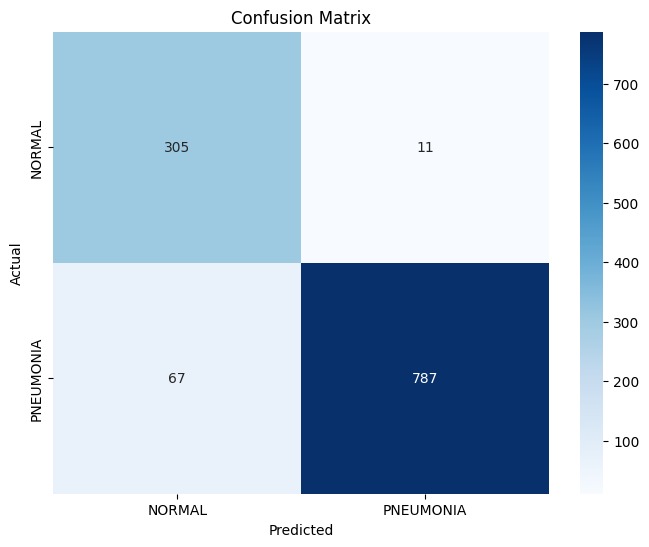

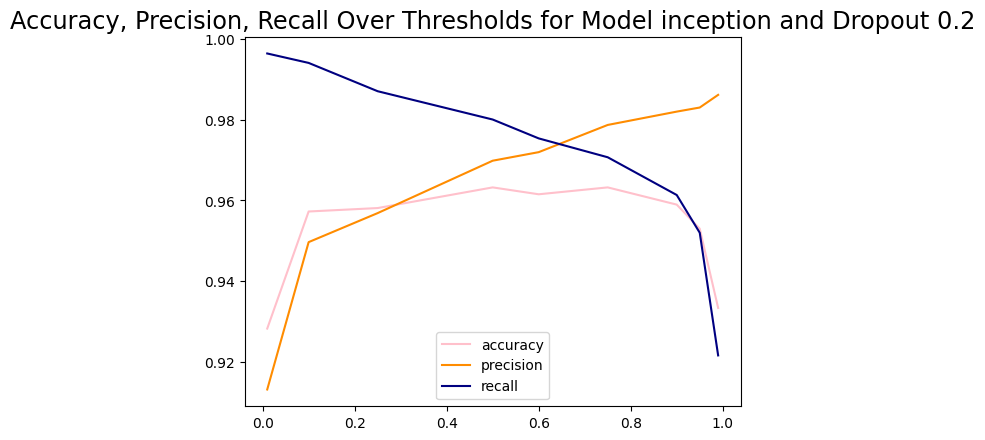



_______________


Model Name: inception
Dropout: 0.5
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 26s 88ms/step - loss: 0.2248 - accuracy: 0.9041 - recall: 0.9428 - precision: 0.9270 - val_loss: 0.1176 - val_accuracy: 0.9540 - val_recall: 0.9603 - val_precision: 0.9762
Epoch 2/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0989 - accuracy: 0.9661 - recall: 0.9763 - precision: 0.9772 - val_loss: 0.1141 - val_accuracy: 0.9625 - val_recall: 0.9626 - val_precision: 0.9856
Epoch 3/4
257/257 [==============================] - 22s 86ms/step - loss: 0.0835 - accuracy: 0.9722 - recall: 0.9813 - precision: 0.9806 - val_loss: 0.1045 - val_accuracy: 0.9625 - val_recall: 0.9603 - val_precision: 0.9880
Epoch 4/4
257/257 [==============================] - 23s 87ms/step - loss: 0.0671 - accuracy: 0.9761 - recall: 0.9813 - precision: 0.9859 - val_loss

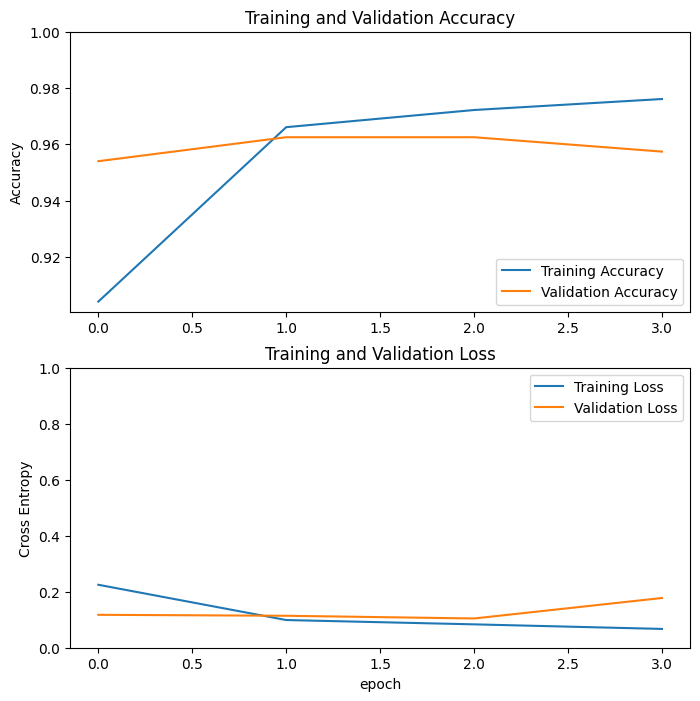

Threshold: 0.01
74/74 [==============================] - 2s 29ms/step - loss: 0.1642 - accuracy: 0.9692 - recall: 0.9883 - precision: 0.9701
Test Accuracy: 0.9692307710647583
Test Loss: 0.16420434415340424
Length predictions: 1170
Hand calculated accuracy: 0.9359
Accuracy: 0.9358974358974359
Precision: 0.9210810810810811
Recall: 0.9976580796252927


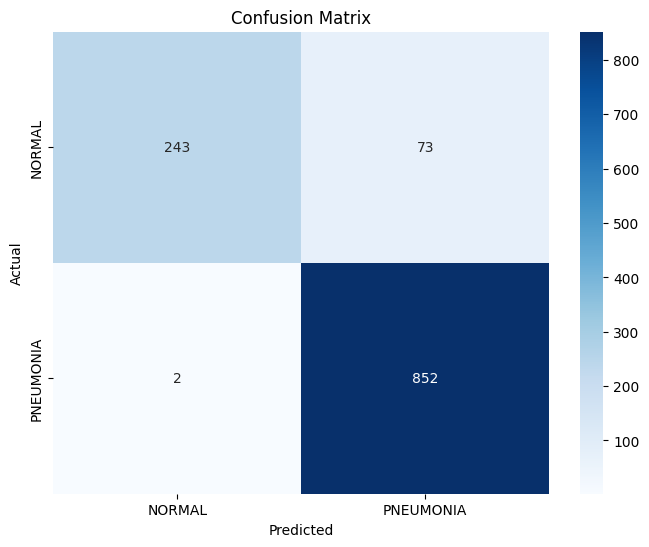

Threshold: 0.1
74/74 [==============================] - 2s 29ms/step - loss: 0.1642 - accuracy: 0.9692 - recall: 0.9883 - precision: 0.9701
Test Accuracy: 0.9692307710647583
Test Loss: 0.16420431435108185
Length predictions: 1170
Hand calculated accuracy: 0.959
Accuracy: 0.958974358974359
Precision: 0.9517937219730942
Recall: 0.9941451990632318


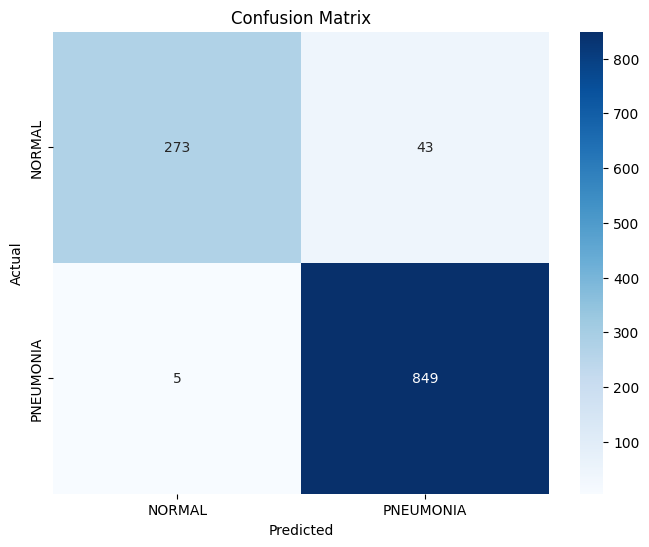

Threshold: 0.25
74/74 [==============================] - 2s 30ms/step - loss: 0.1642 - accuracy: 0.9692 - recall: 0.9883 - precision: 0.9701
Test Accuracy: 0.9692307710647583
Test Loss: 0.16420434415340424
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9614074914869466
Recall: 0.9918032786885246


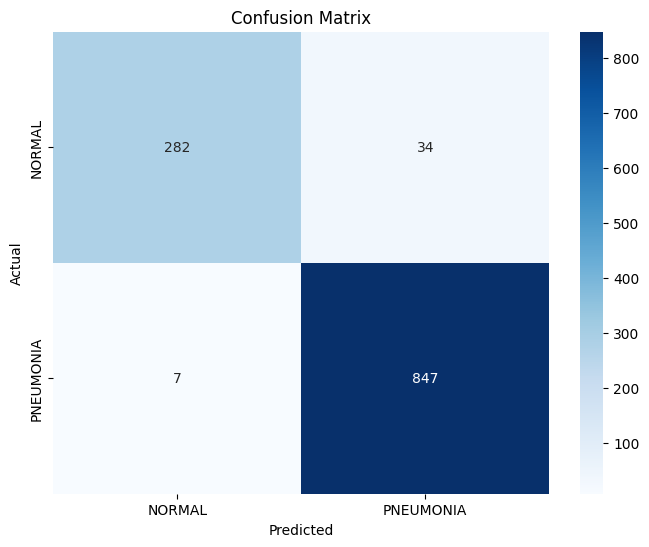

Threshold: 0.5
74/74 [==============================] - 2s 29ms/step - loss: 0.1642 - accuracy: 0.9692 - recall: 0.9883 - precision: 0.9701
Test Accuracy: 0.9692307710647583
Test Loss: 0.16420429944992065
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9701149425287356
Recall: 0.9882903981264637


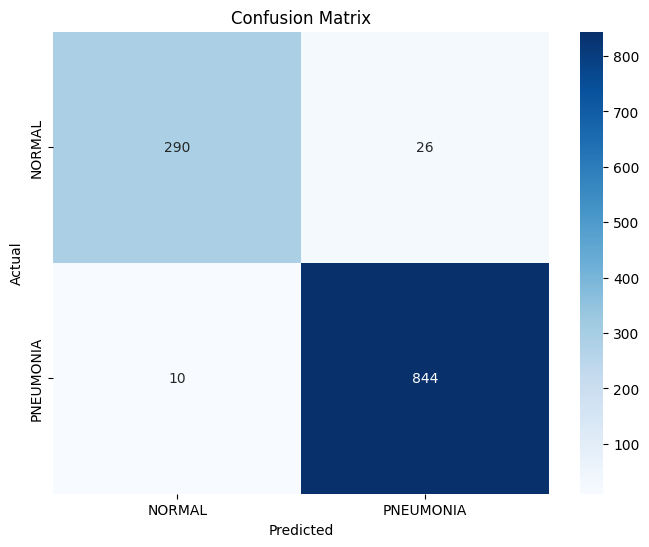

Threshold: 0.6
74/74 [==============================] - 2s 29ms/step - loss: 0.1642 - accuracy: 0.9692 - recall: 0.9883 - precision: 0.9701
Test Accuracy: 0.9692307710647583
Test Loss: 0.16420432925224304
Length predictions: 1170
Hand calculated accuracy: 0.9667
Accuracy: 0.9666666666666667
Precision: 0.9700115340253749
Recall: 0.9847775175644028


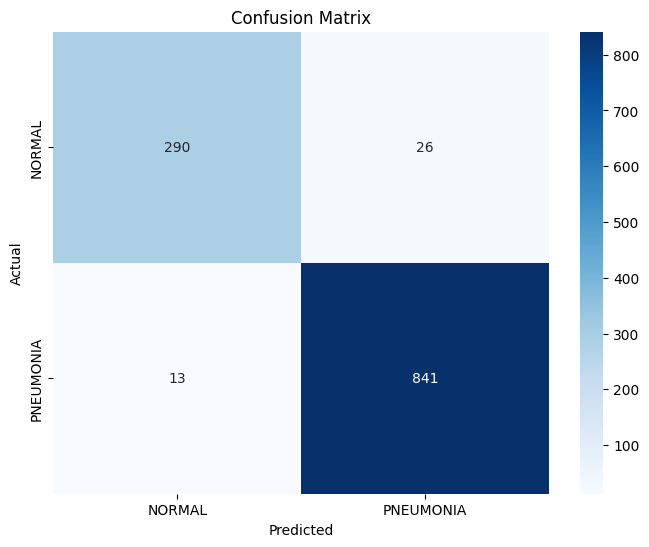

Threshold: 0.75
74/74 [==============================] - 2s 30ms/step - loss: 0.1642 - accuracy: 0.9692 - recall: 0.9883 - precision: 0.9701
Test Accuracy: 0.9692307710647583
Test Loss: 0.16420429944992065
Length predictions: 1170
Hand calculated accuracy: 0.9667
Accuracy: 0.9666666666666667
Precision: 0.9754959159859977
Recall: 0.9789227166276346


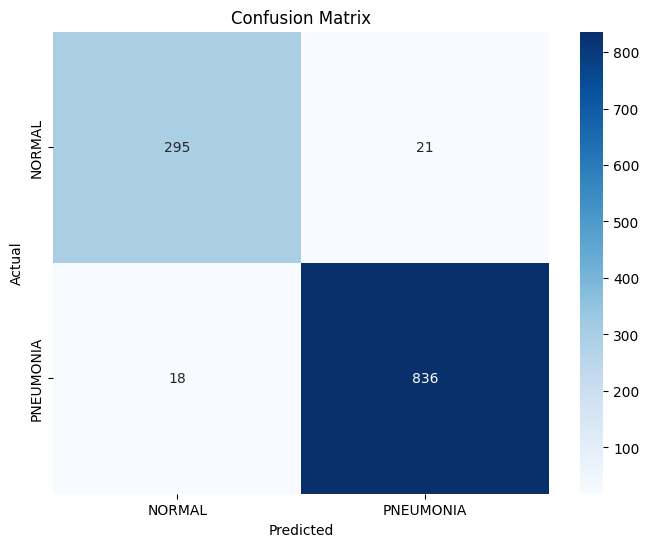

Threshold: 0.9
74/74 [==============================] - 2s 30ms/step - loss: 0.1642 - accuracy: 0.9692 - recall: 0.9883 - precision: 0.9701
Test Accuracy: 0.9692307710647583
Test Loss: 0.16420432925224304
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.9776207302709069
Recall: 0.9718969555035128


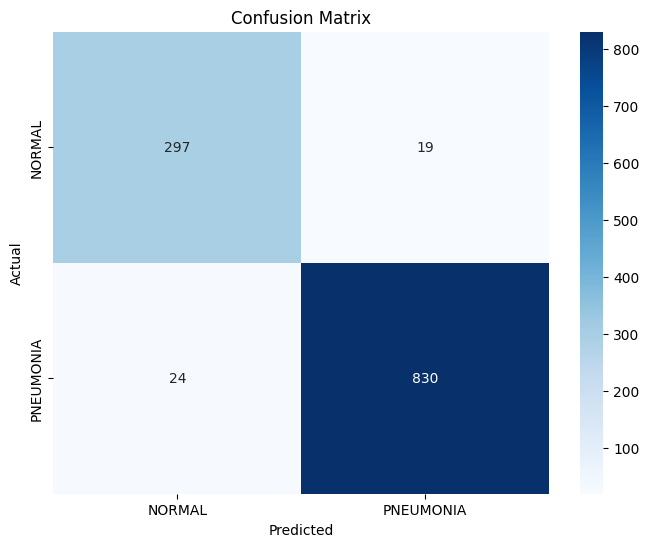

Threshold: 0.95
74/74 [==============================] - 2s 30ms/step - loss: 0.1642 - accuracy: 0.9692 - recall: 0.9883 - precision: 0.9701
Test Accuracy: 0.9692307710647583
Test Loss: 0.16420428454875946
Length predictions: 1170
Hand calculated accuracy: 0.9641
Accuracy: 0.9641025641025641
Precision: 0.9799054373522459
Recall: 0.9707259953161592


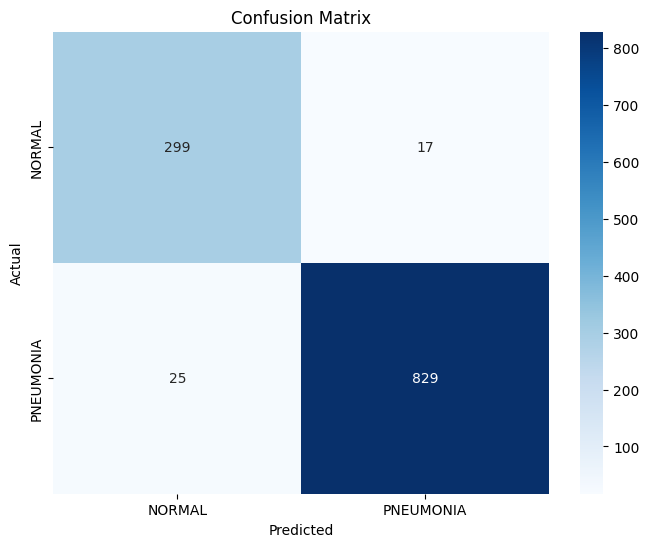

Threshold: 0.99
74/74 [==============================] - 2s 29ms/step - loss: 0.1642 - accuracy: 0.9692 - recall: 0.9883 - precision: 0.9701
Test Accuracy: 0.9692307710647583
Test Loss: 0.16420429944992065
Length predictions: 1170
Hand calculated accuracy: 0.9547
Accuracy: 0.9547008547008548
Precision: 0.9854545454545455
Recall: 0.9519906323185011


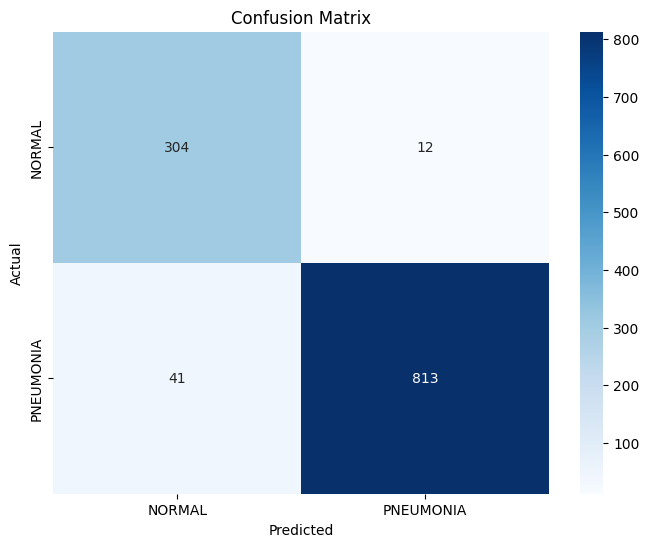

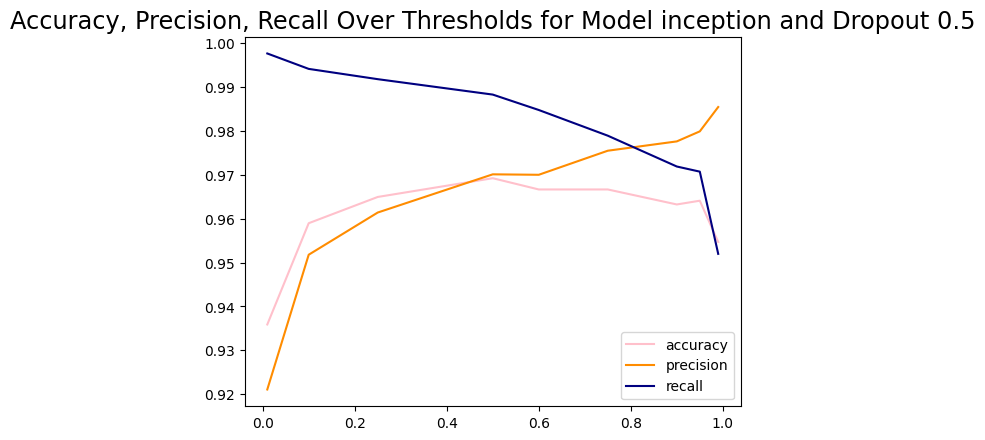



_______________


Model Name: inception
Dropout: 0.7
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 25s 89ms/step - loss: 0.2168 - accuracy: 0.9195 - recall: 0.9485 - precision: 0.9416 - val_loss: 0.1148 - val_accuracy: 0.9625 - val_recall: 0.9626 - val_precision: 0.9856
Epoch 2/4
257/257 [==============================] - 22s 87ms/step - loss: 0.1103 - accuracy: 0.9649 - recall: 0.9759 - precision: 0.9759 - val_loss: 0.1116 - val_accuracy: 0.9642 - val_recall: 0.9696 - val_precision: 0.9811
Epoch 3/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0838 - accuracy: 0.9712 - recall: 0.9796 - precision: 0.9809 - val_loss: 0.1146 - val_accuracy: 0.9608 - val_recall: 0.9930 - val_precision: 0.9551
Epoch 4/4
257/257 [==============================] - 22s 87ms/step - loss: 0.0909 - accuracy: 0.9707 - recall: 0.9789 - precision: 0.9809 - val_loss

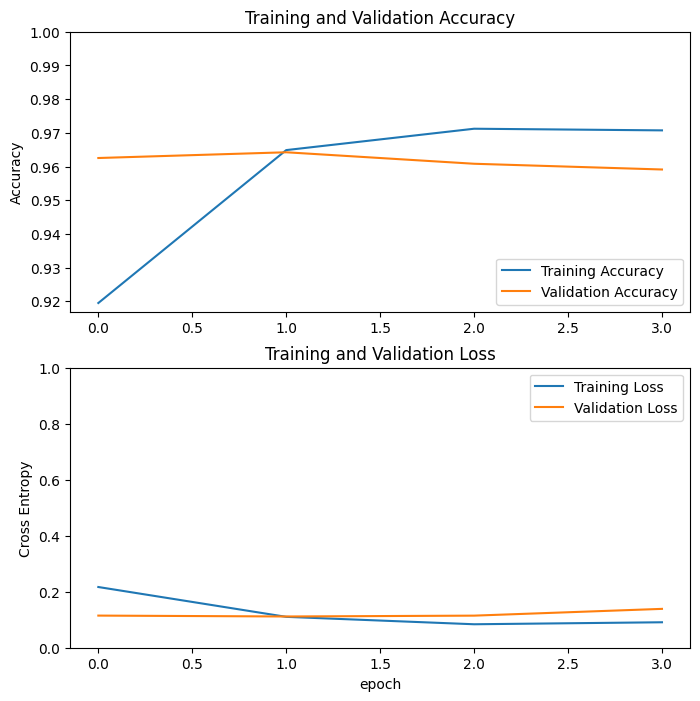

Threshold: 0.01
74/74 [==============================] - 2s 31ms/step - loss: 0.1547 - accuracy: 0.9547 - recall: 0.9532 - precision: 0.9843
Test Accuracy: 0.9547008275985718
Test Loss: 0.15469038486480713
Length predictions: 1170
Hand calculated accuracy: 0.9581
Accuracy: 0.9581196581196582
Precision: 0.952755905511811
Recall: 0.9918032786885246


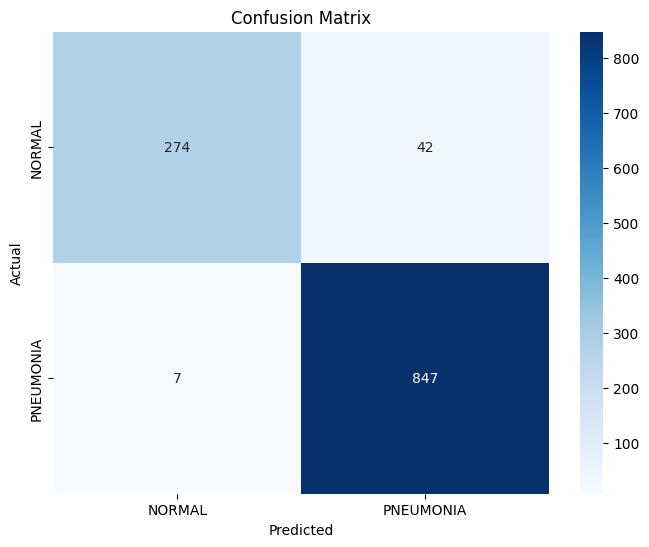

Threshold: 0.1
74/74 [==============================] - 2s 30ms/step - loss: 0.1547 - accuracy: 0.9547 - recall: 0.9532 - precision: 0.9843
Test Accuracy: 0.9547008275985718
Test Loss: 0.15469034016132355
Length predictions: 1170
Hand calculated accuracy: 0.9624
Accuracy: 0.9623931623931624
Precision: 0.9676674364896074
Recall: 0.9812646370023419


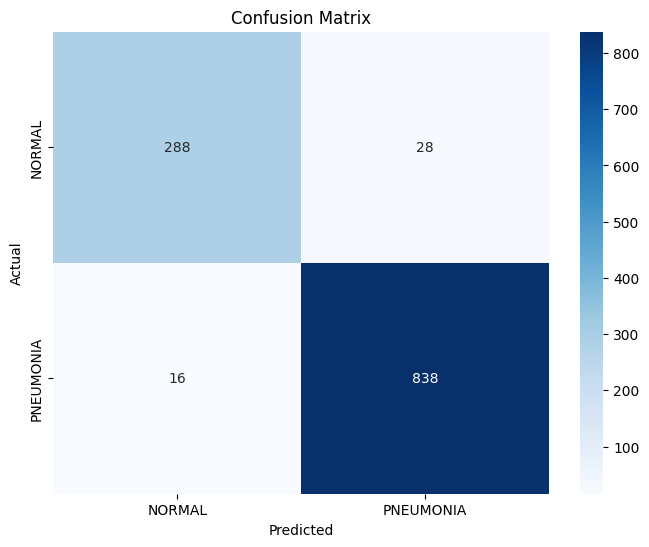

Threshold: 0.25
74/74 [==============================] - 2s 30ms/step - loss: 0.1547 - accuracy: 0.9547 - recall: 0.9532 - precision: 0.9843
Test Accuracy: 0.9547008275985718
Test Loss: 0.15469038486480713
Length predictions: 1170
Hand calculated accuracy: 0.959
Accuracy: 0.958974358974359
Precision: 0.9718969555035128
Recall: 0.9718969555035128


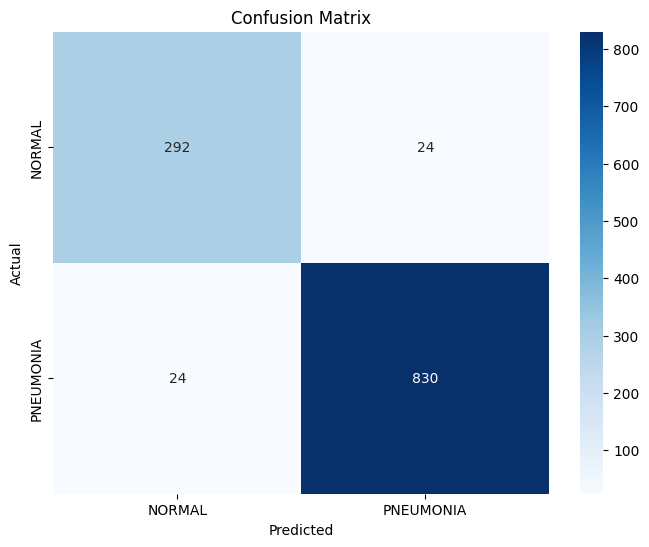

Threshold: 0.5
74/74 [==============================] - 2s 30ms/step - loss: 0.1547 - accuracy: 0.9547 - recall: 0.9532 - precision: 0.9843
Test Accuracy: 0.9547008275985718
Test Loss: 0.15469035506248474
Length predictions: 1170
Hand calculated accuracy: 0.9547
Accuracy: 0.9547008547008548
Precision: 0.9842805320435308
Recall: 0.9531615925058547


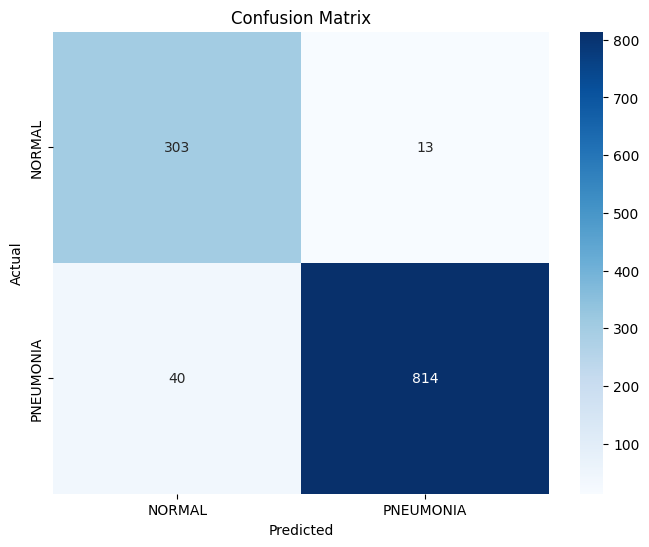

Threshold: 0.6
74/74 [==============================] - 2s 29ms/step - loss: 0.1547 - accuracy: 0.9547 - recall: 0.9532 - precision: 0.9843
Test Accuracy: 0.9547008275985718
Test Loss: 0.15469035506248474
Length predictions: 1170
Hand calculated accuracy: 0.9496
Accuracy: 0.9495726495726495
Precision: 0.9853479853479854
Recall: 0.9449648711943794


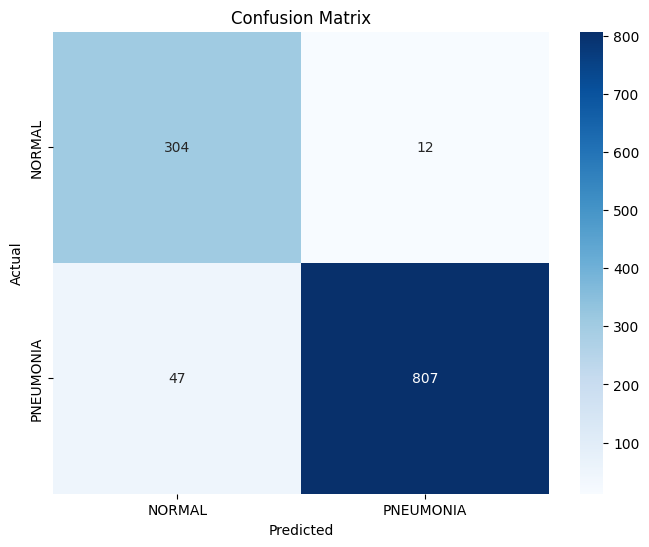

Threshold: 0.75
74/74 [==============================] - 2s 29ms/step - loss: 0.1547 - accuracy: 0.9547 - recall: 0.9532 - precision: 0.9843
Test Accuracy: 0.9547008275985718
Test Loss: 0.15469036996364594
Length predictions: 1170
Hand calculated accuracy: 0.9436
Accuracy: 0.9435897435897436
Precision: 0.9876237623762376
Recall: 0.9344262295081968


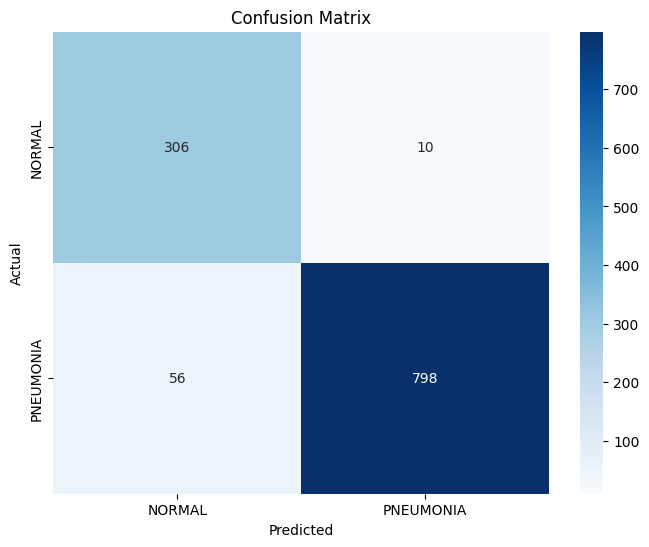

Threshold: 0.9
74/74 [==============================] - 2s 29ms/step - loss: 0.1547 - accuracy: 0.9547 - recall: 0.9532 - precision: 0.9843
Test Accuracy: 0.9547008275985718
Test Loss: 0.15469035506248474
Length predictions: 1170
Hand calculated accuracy: 0.9385
Accuracy: 0.9384615384615385
Precision: 0.9924433249370277
Recall: 0.9227166276346604


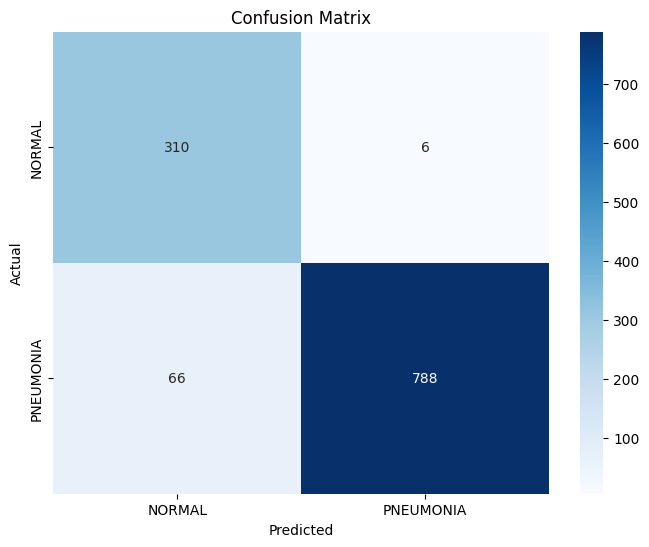

Threshold: 0.95
74/74 [==============================] - 2s 29ms/step - loss: 0.1547 - accuracy: 0.9547 - recall: 0.9532 - precision: 0.9843
Test Accuracy: 0.9547008275985718
Test Loss: 0.15469035506248474
Length predictions: 1170
Hand calculated accuracy: 0.9368
Accuracy: 0.9367521367521368
Precision: 0.9936708860759493
Recall: 0.9192037470725996


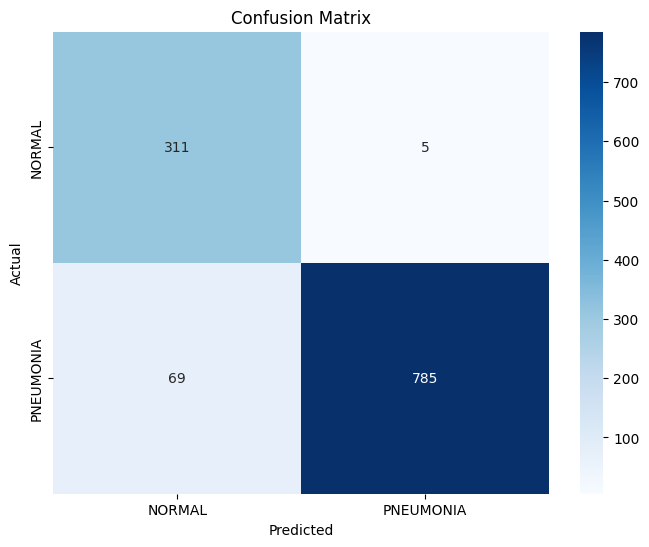

Threshold: 0.99
74/74 [==============================] - 2s 29ms/step - loss: 0.1547 - accuracy: 0.9547 - recall: 0.9532 - precision: 0.9843
Test Accuracy: 0.9547008275985718
Test Loss: 0.15469035506248474
Length predictions: 1170
Hand calculated accuracy: 0.9265
Accuracy: 0.9264957264957265
Precision: 0.9948453608247423
Recall: 0.9039812646370023


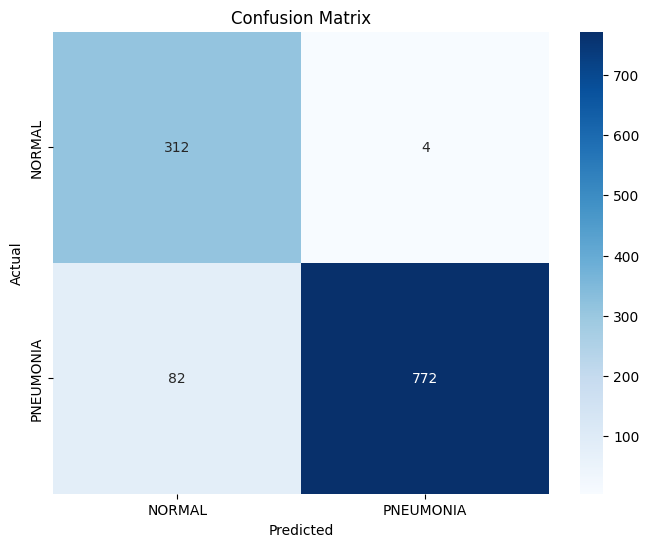

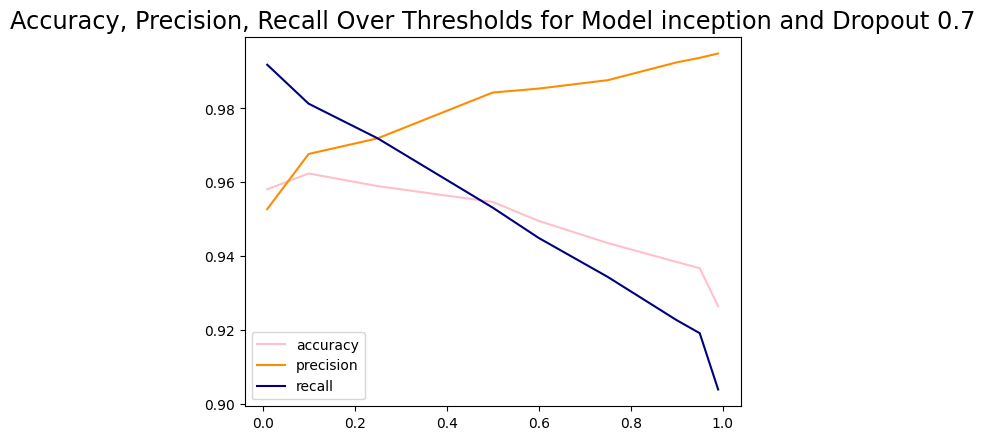



_______________


ACC 1 [(0.9188034188034188, 0.9564102564102565, 0.964957264957265, 0.9683760683760684, 0.9709401709401709, 0.9700854700854701, 0.9709401709401709, 0.9675213675213675, 0.9529914529914529), (0.8641025641025641, 0.9316239316239316, 0.941025641025641, 0.9478632478632478, 0.9512820512820512, 0.9572649572649573, 0.958974358974359, 0.964957264957265, 0.9598290598290599), (0.964957264957265, 0.9717948717948718, 0.9709401709401709, 0.9675213675213675, 0.9666666666666667, 0.9641025641025641, 0.9529914529914529, 0.9504273504273504, 0.9282051282051282), (0.9290598290598291, 0.9521367521367521, 0.9623931623931624, 0.9615384615384616, 0.9641025641025641, 0.964957264957265, 0.9598290598290599, 0.9538461538461539, 0.8948717948717949)]
ACC 2 [(0.9213675213675213, 0.9598290598290599, 0.9641025641025641, 0.9700854700854701, 0.9717948717948718, 0.9717948717948718, 0.9717948717948718, 0.9717948717948718, 0.9564102564102565), (0.888034188034188, 0.9435897435897436, 0.9547008547008548, 0.

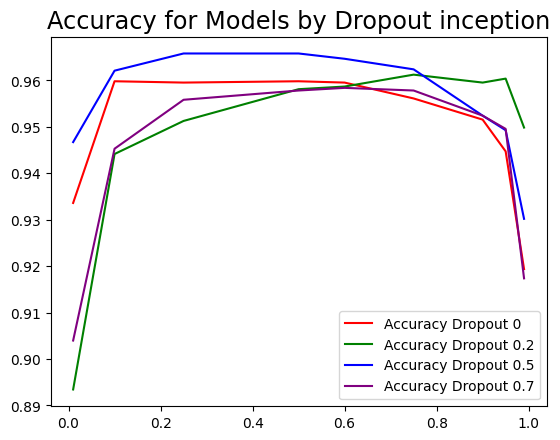



_______________




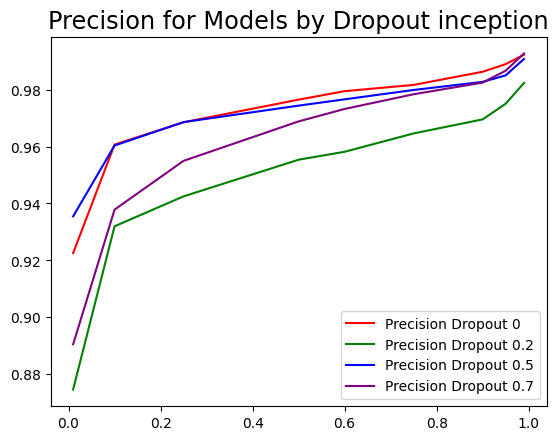



_______________




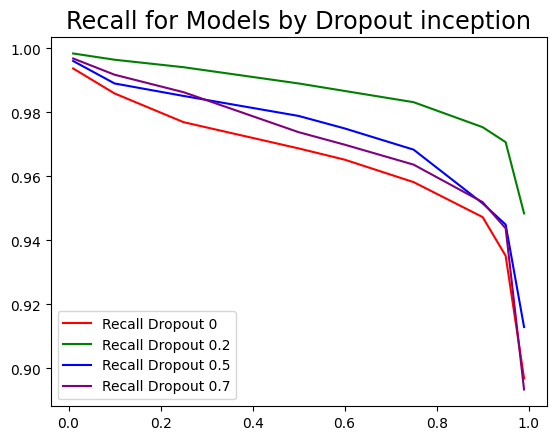



_______________


2023-12-13 10:36:35.872357
Model Name: xception
Dropout: 0
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 58s 213ms/step - loss: 0.1361 - accuracy: 0.9471 - recall: 0.9649 - precision: 0.9626 - val_loss: 0.1417 - val_accuracy: 0.9625 - val_recall: 0.9930 - val_precision: 0.9572
Epoch 2/4
257/257 [==============================] - 53s 208ms/step - loss: 0.0673 - accuracy: 0.9776 - recall: 0.9860 - precision: 0.9833 - val_loss: 0.0890 - val_accuracy: 0.9693 - val_recall: 0.9696 - val_precision: 0.9881
Epoch 3/4
257/257 [==============================] - 53s 208ms/step - loss: 0.0481 - accuracy: 0.9837 - recall: 0.9886 - precision: 0.9890 - val_loss: 0.1185 - val_accuracy: 0.9693 - val_recall: 0.9860 - val_precision: 0.9724
Epoch 4/4
257/257 [==============================] - 53s 207ms/step - loss: 0.0281 - accuracy: 0.9910 - recall: 0.9950 - 

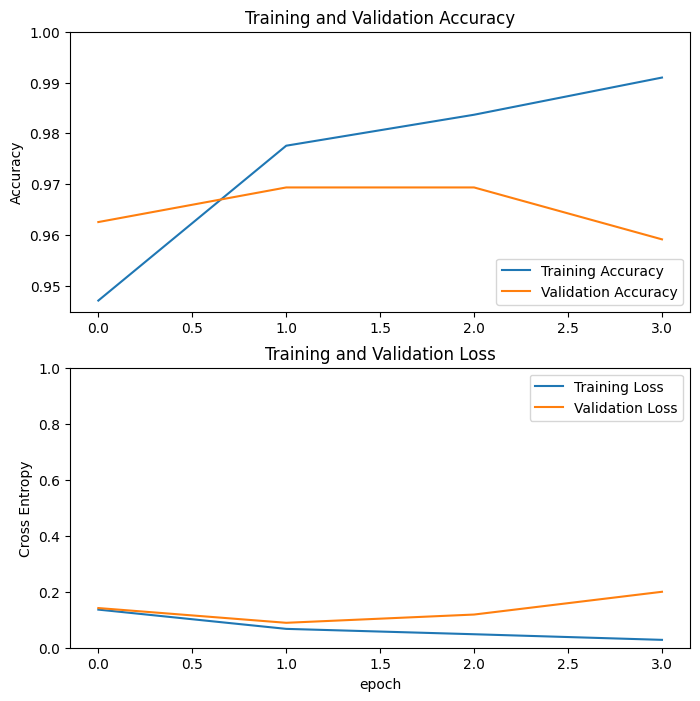

Threshold: 0.01
74/74 [==============================] - 4s 46ms/step - loss: 0.2249 - accuracy: 0.9598 - recall: 0.9965 - precision: 0.9508
Test Accuracy: 0.9598290324211121
Test Loss: 0.22490234673023224
Length predictions: 1170
Hand calculated accuracy: 0.9265
Accuracy: 0.9264957264957265
Precision: 0.9085106382978724
Recall: 1.0


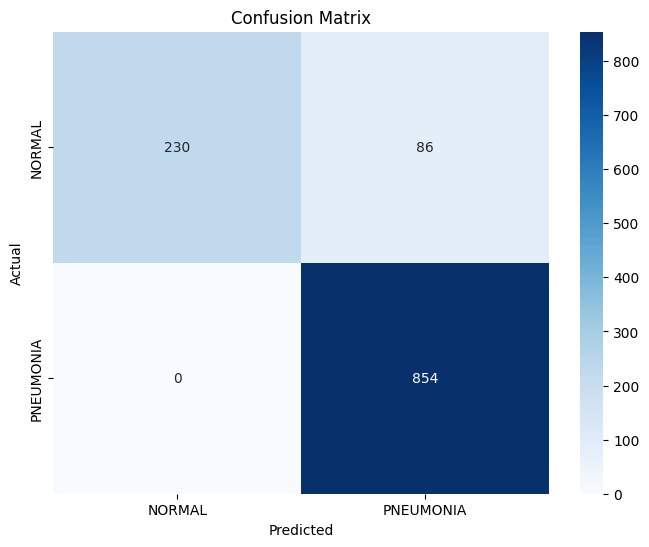

Threshold: 0.1
74/74 [==============================] - 3s 44ms/step - loss: 0.2249 - accuracy: 0.9598 - recall: 0.9965 - precision: 0.9508
Test Accuracy: 0.9598290324211121
Test Loss: 0.22490234673023224
Length predictions: 1170
Hand calculated accuracy: 0.9479
Accuracy: 0.9478632478632478
Precision: 0.9352360043907794
Recall: 0.9976580796252927


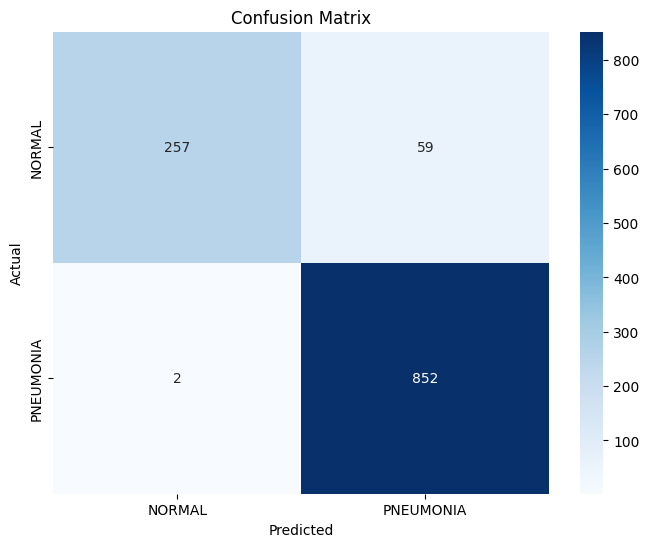

Threshold: 0.25
74/74 [==============================] - 3s 44ms/step - loss: 0.2249 - accuracy: 0.9598 - recall: 0.9965 - precision: 0.9508
Test Accuracy: 0.9598290324211121
Test Loss: 0.22490234673023224
Length predictions: 1170
Hand calculated accuracy: 0.9564
Accuracy: 0.9564102564102565
Precision: 0.946607341490545
Recall: 0.9964871194379391


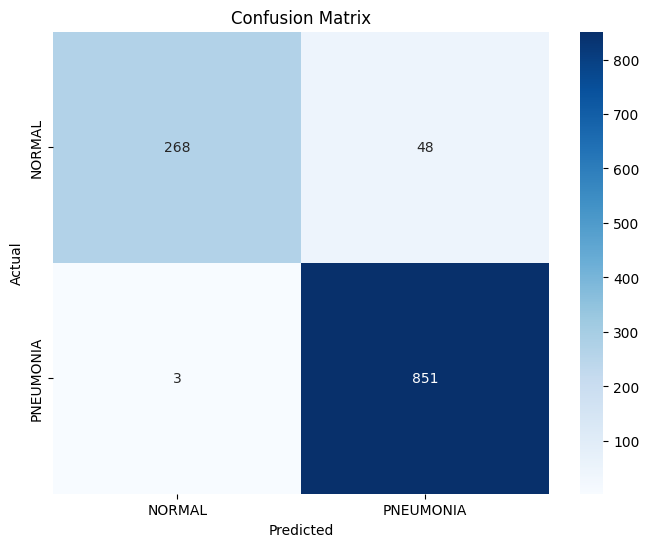

Threshold: 0.5
74/74 [==============================] - 3s 43ms/step - loss: 0.2249 - accuracy: 0.9598 - recall: 0.9965 - precision: 0.9508
Test Accuracy: 0.9598290324211121
Test Loss: 0.22490237653255463
Length predictions: 1170
Hand calculated accuracy: 0.9598
Accuracy: 0.9598290598290599
Precision: 0.9508379888268157
Recall: 0.9964871194379391


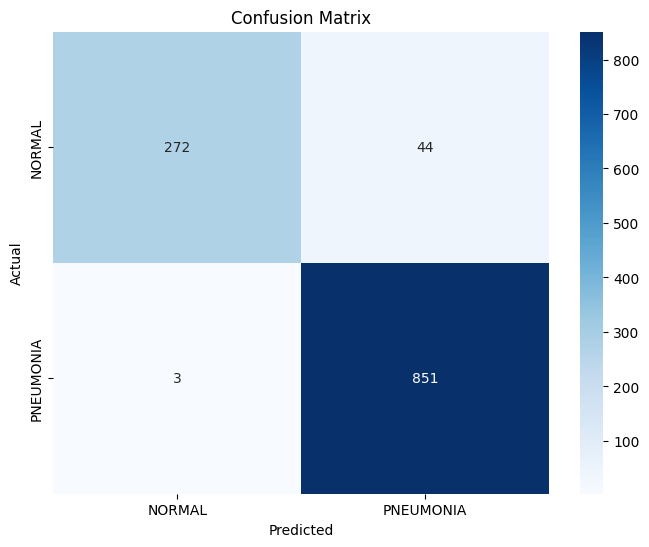

Threshold: 0.6
74/74 [==============================] - 3s 44ms/step - loss: 0.2249 - accuracy: 0.9598 - recall: 0.9965 - precision: 0.9508
Test Accuracy: 0.9598290324211121
Test Loss: 0.22490234673023224
Length predictions: 1170
Hand calculated accuracy: 0.9598
Accuracy: 0.9598290598290599
Precision: 0.9518477043673013
Recall: 0.9953161592505855


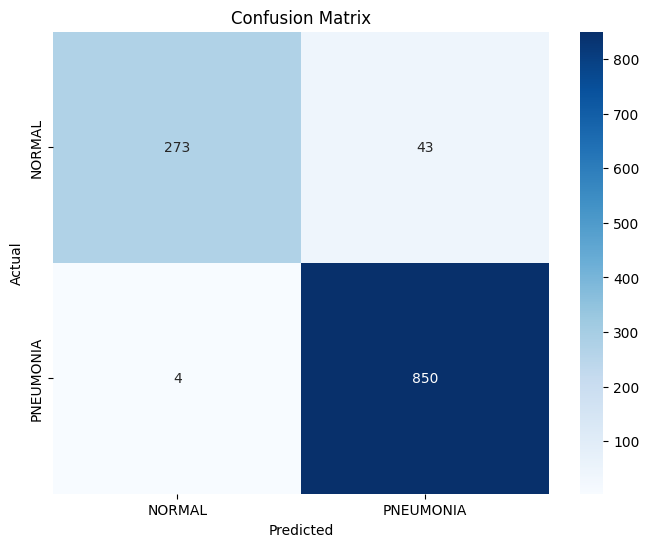

Threshold: 0.75
74/74 [==============================] - 3s 42ms/step - loss: 0.2249 - accuracy: 0.9598 - recall: 0.9965 - precision: 0.9508
Test Accuracy: 0.9598290324211121
Test Loss: 0.22490234673023224
Length predictions: 1170
Hand calculated accuracy: 0.9615
Accuracy: 0.9615384615384616
Precision: 0.9539842873176206
Recall: 0.9953161592505855


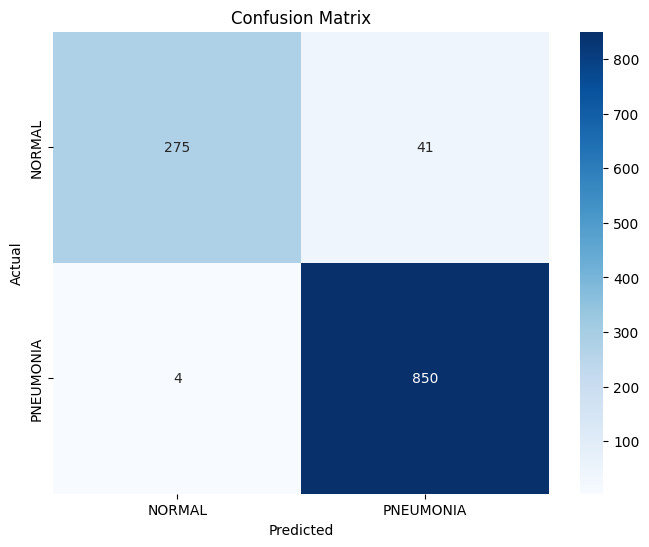

Threshold: 0.9
74/74 [==============================] - 3s 44ms/step - loss: 0.2249 - accuracy: 0.9598 - recall: 0.9965 - precision: 0.9508
Test Accuracy: 0.9598290324211121
Test Loss: 0.2249024212360382
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9593220338983051
Recall: 0.9941451990632318


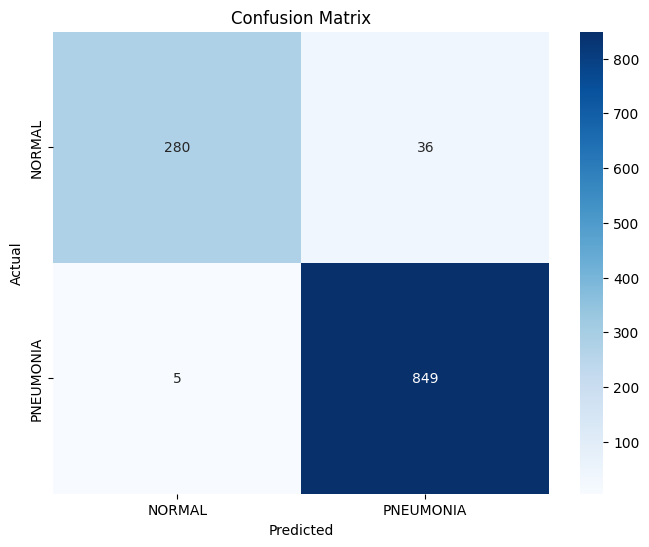

Threshold: 0.95
74/74 [==============================] - 3s 43ms/step - loss: 0.2249 - accuracy: 0.9598 - recall: 0.9965 - precision: 0.9508
Test Accuracy: 0.9598290324211121
Test Loss: 0.22490239143371582
Length predictions: 1170
Hand calculated accuracy: 0.9684
Accuracy: 0.9683760683760684
Precision: 0.963677639046538
Recall: 0.9941451990632318


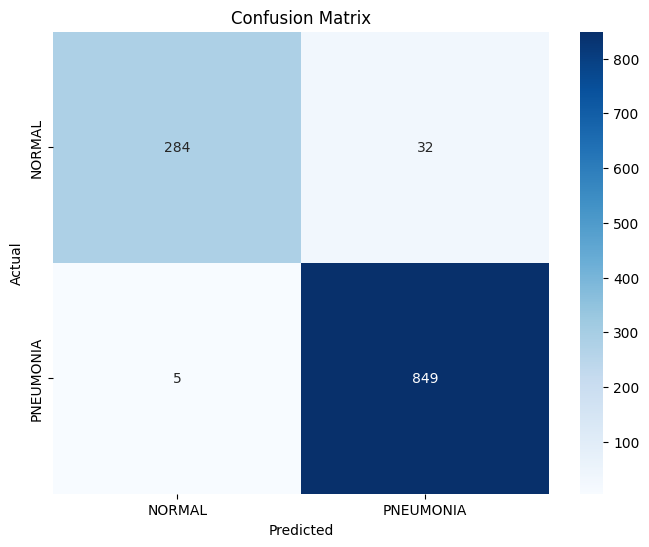

Threshold: 0.99
74/74 [==============================] - 3s 44ms/step - loss: 0.2249 - accuracy: 0.9598 - recall: 0.9965 - precision: 0.9508
Test Accuracy: 0.9598290324211121
Test Loss: 0.22490237653255463
Length predictions: 1170
Hand calculated accuracy: 0.9735
Accuracy: 0.9735042735042735
Precision: 0.9724454649827784
Recall: 0.9918032786885246


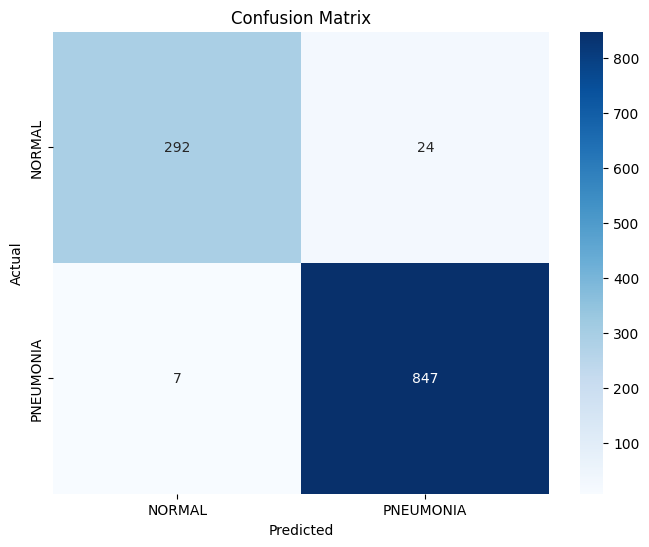

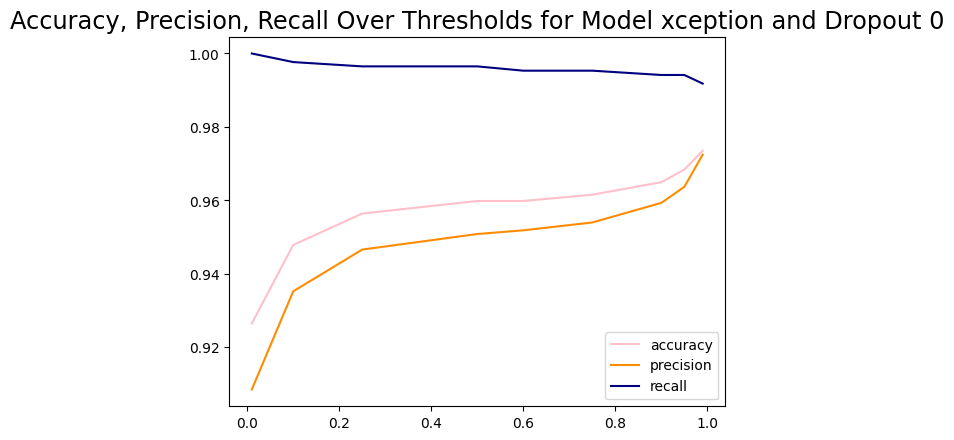



_______________


Model Name: xception
Dropout: 0.2
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 58s 220ms/step - loss: 0.1540 - accuracy: 0.9349 - recall: 0.9619 - precision: 0.9495 - val_loss: 0.0974 - val_accuracy: 0.9676 - val_recall: 0.9743 - val_precision: 0.9812
Epoch 2/4
257/257 [==============================] - 54s 209ms/step - loss: 0.0674 - accuracy: 0.9783 - recall: 0.9870 - precision: 0.9833 - val_loss: 0.0923 - val_accuracy: 0.9744 - val_recall: 0.9813 - val_precision: 0.9836
Epoch 3/4
257/257 [==============================] - 54s 209ms/step - loss: 0.0533 - accuracy: 0.9802 - recall: 0.9853 - precision: 0.9876 - val_loss: 0.2198 - val_accuracy: 0.9472 - val_recall: 1.0000 - val_precision: 0.9325
Epoch 4/4
257/257 [==============================] - 54s 209ms/step - loss: 0.0599 - accuracy: 0.9771 - recall: 0.9829 - precision: 0.9856 - val_l

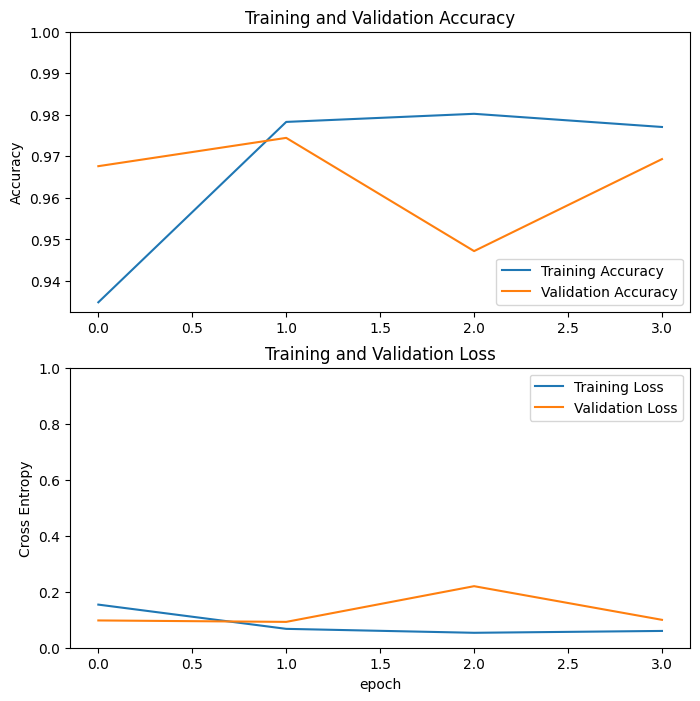

Threshold: 0.01
74/74 [==============================] - 3s 43ms/step - loss: 0.1002 - accuracy: 0.9684 - recall: 0.9859 - precision: 0.9712
Test Accuracy: 0.9683760404586792
Test Loss: 0.1002252846956253
Length predictions: 1170
Hand calculated accuracy: 0.9239
Accuracy: 0.923931623931624
Precision: 0.9064824654622742
Recall: 0.9988290398126464


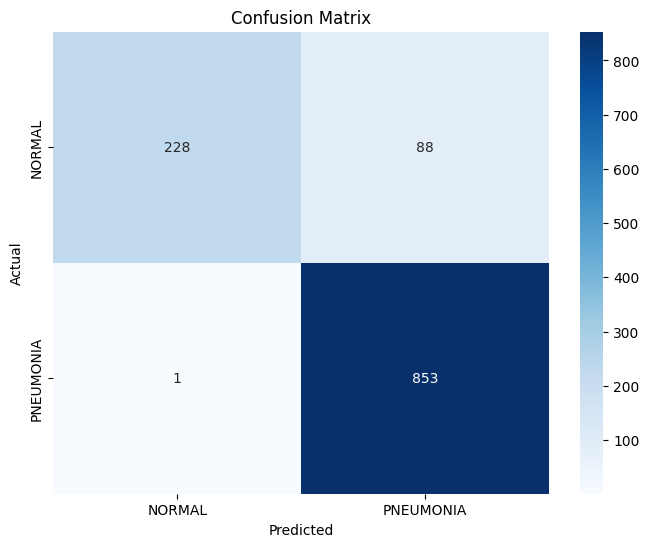

Threshold: 0.1
74/74 [==============================] - 3s 43ms/step - loss: 0.1002 - accuracy: 0.9684 - recall: 0.9859 - precision: 0.9712
Test Accuracy: 0.9683760404586792
Test Loss: 0.1002252846956253
Length predictions: 1170
Hand calculated accuracy: 0.9581
Accuracy: 0.9581196581196582
Precision: 0.9497206703910615
Recall: 0.9953161592505855


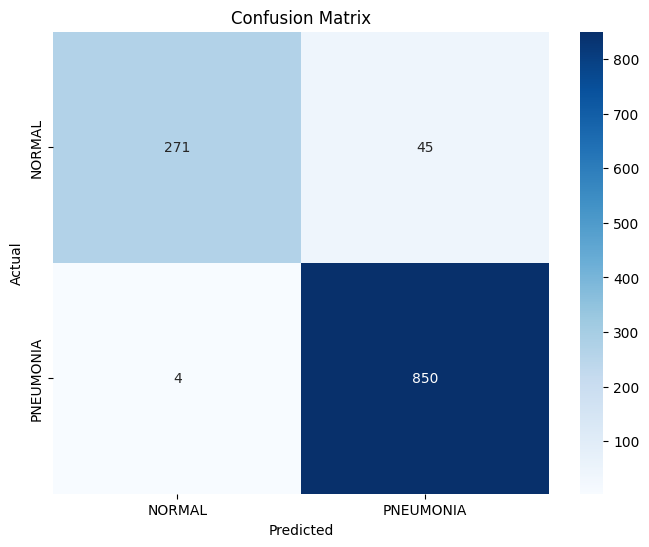

Threshold: 0.25
74/74 [==============================] - 3s 42ms/step - loss: 0.1002 - accuracy: 0.9684 - recall: 0.9859 - precision: 0.9712
Test Accuracy: 0.9683760404586792
Test Loss: 0.1002252846956253
Length predictions: 1170
Hand calculated accuracy: 0.9641
Accuracy: 0.9641025641025641
Precision: 0.9613636363636363
Recall: 0.990632318501171


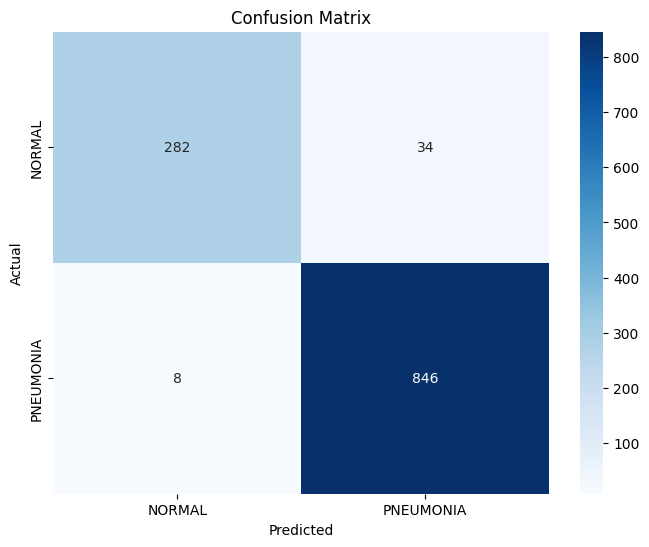

Threshold: 0.5
74/74 [==============================] - 3s 44ms/step - loss: 0.1002 - accuracy: 0.9684 - recall: 0.9859 - precision: 0.9712
Test Accuracy: 0.9683760404586792
Test Loss: 0.1002252995967865
Length predictions: 1170
Hand calculated accuracy: 0.9684
Accuracy: 0.9683760683760684
Precision: 0.9711649365628604
Recall: 0.9859484777517564


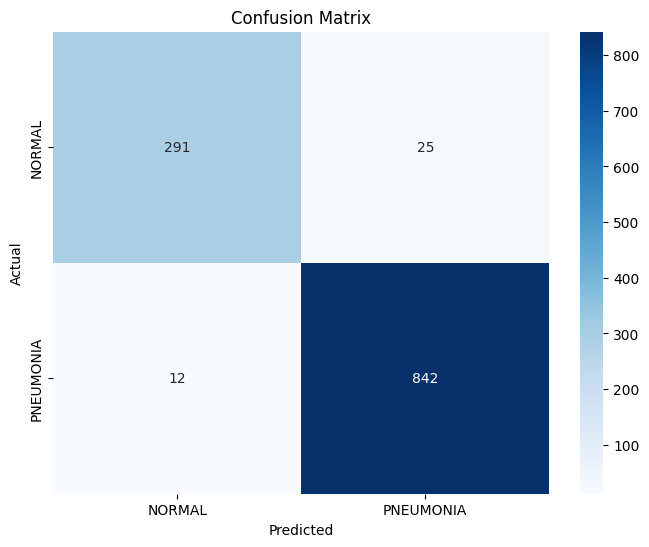

Threshold: 0.6
74/74 [==============================] - 3s 42ms/step - loss: 0.1002 - accuracy: 0.9684 - recall: 0.9859 - precision: 0.9712
Test Accuracy: 0.9683760404586792
Test Loss: 0.10022532194852829
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9767711962833914
Recall: 0.9847775175644028


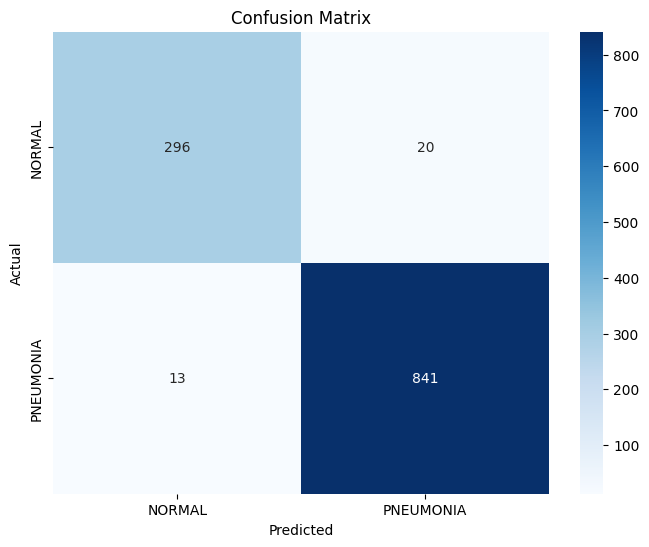

Threshold: 0.75
74/74 [==============================] - 3s 43ms/step - loss: 0.1002 - accuracy: 0.9684 - recall: 0.9859 - precision: 0.9712
Test Accuracy: 0.9683760404586792
Test Loss: 0.1002252846956253
Length predictions: 1170
Hand calculated accuracy: 0.9735
Accuracy: 0.9735042735042735
Precision: 0.9801633605600933
Recall: 0.9836065573770492


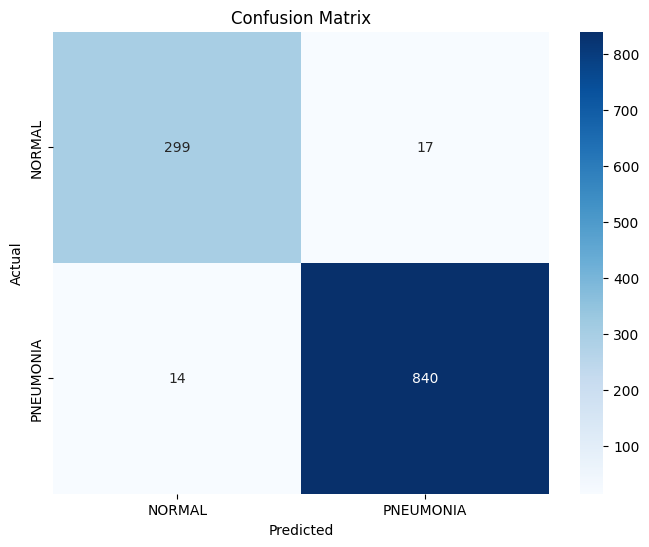

Threshold: 0.9
74/74 [==============================] - 3s 42ms/step - loss: 0.1002 - accuracy: 0.9684 - recall: 0.9859 - precision: 0.9712
Test Accuracy: 0.9683760404586792
Test Loss: 0.10022526979446411
Length predictions: 1170
Hand calculated accuracy: 0.9701
Accuracy: 0.9700854700854701
Precision: 0.9846153846153847
Recall: 0.9742388758782201


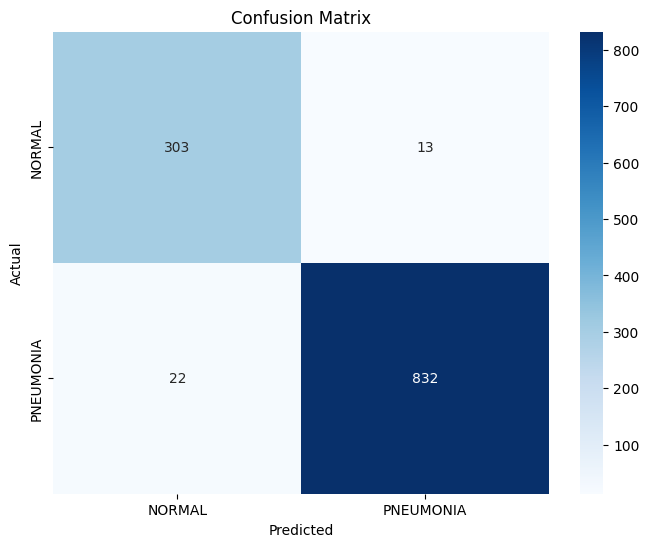

Threshold: 0.95
74/74 [==============================] - 3s 42ms/step - loss: 0.1002 - accuracy: 0.9684 - recall: 0.9859 - precision: 0.9712
Test Accuracy: 0.9683760404586792
Test Loss: 0.1002252921462059
Length predictions: 1170
Hand calculated accuracy: 0.9641
Accuracy: 0.9641025641025641
Precision: 0.9856459330143541
Recall: 0.9648711943793911


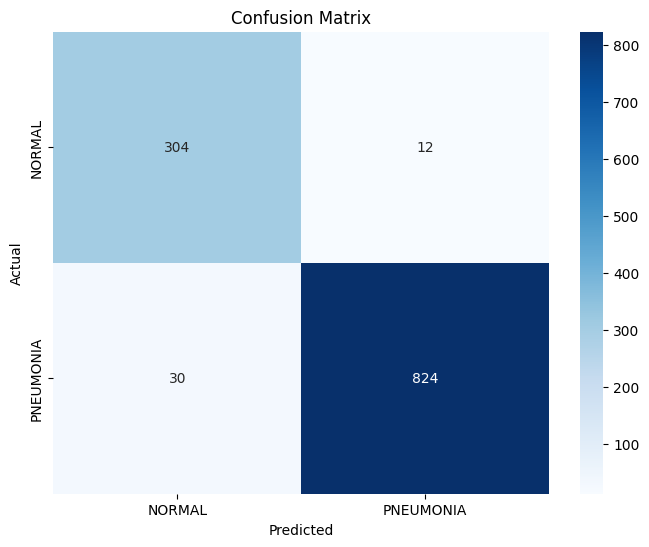

Threshold: 0.99
74/74 [==============================] - 3s 43ms/step - loss: 0.1002 - accuracy: 0.9684 - recall: 0.9859 - precision: 0.9712
Test Accuracy: 0.9683760404586792
Test Loss: 0.1002252921462059
Length predictions: 1170
Hand calculated accuracy: 0.9393
Accuracy: 0.9393162393162393
Precision: 0.9899874843554443
Recall: 0.9262295081967213


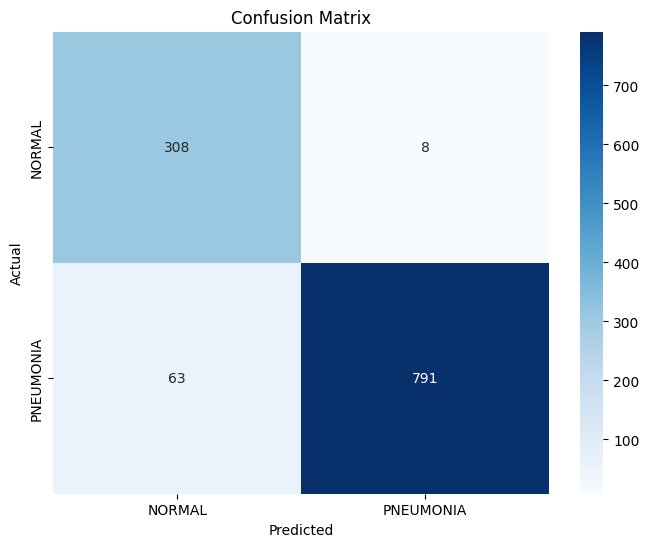

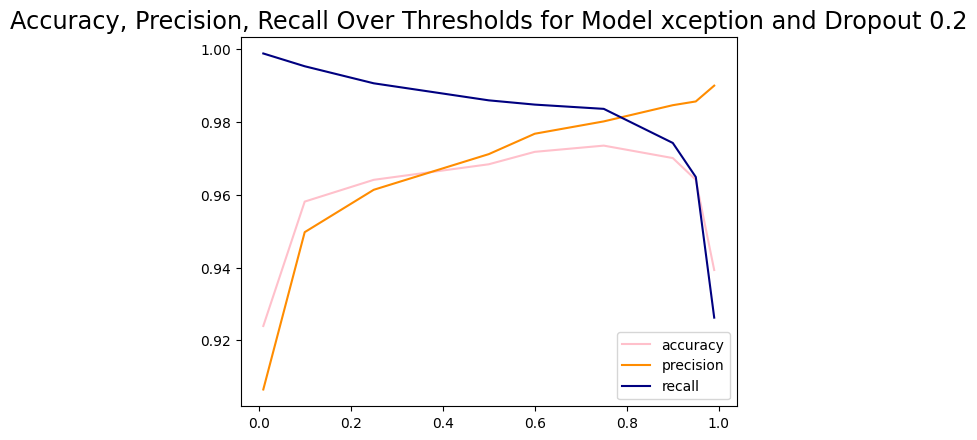



_______________


Model Name: xception
Dropout: 0.5
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 58s 218ms/step - loss: 0.1542 - accuracy: 0.9402 - recall: 0.9599 - precision: 0.9583 - val_loss: 0.1325 - val_accuracy: 0.9523 - val_recall: 0.9463 - val_precision: 0.9878
Epoch 2/4
257/257 [==============================] - 54s 210ms/step - loss: 0.0790 - accuracy: 0.9712 - recall: 0.9786 - precision: 0.9819 - val_loss: 0.0829 - val_accuracy: 0.9693 - val_recall: 0.9743 - val_precision: 0.9835
Epoch 3/4
257/257 [==============================] - 54s 210ms/step - loss: 0.0508 - accuracy: 0.9827 - recall: 0.9903 - precision: 0.9860 - val_loss: 0.1588 - val_accuracy: 0.9574 - val_recall: 0.9907 - val_precision: 0.9528
Epoch 4/4
257/257 [==============================] - 54s 210ms/step - loss: 0.0371 - accuracy: 0.9859 - recall: 0.9910 - precision: 0.9896 - val_l

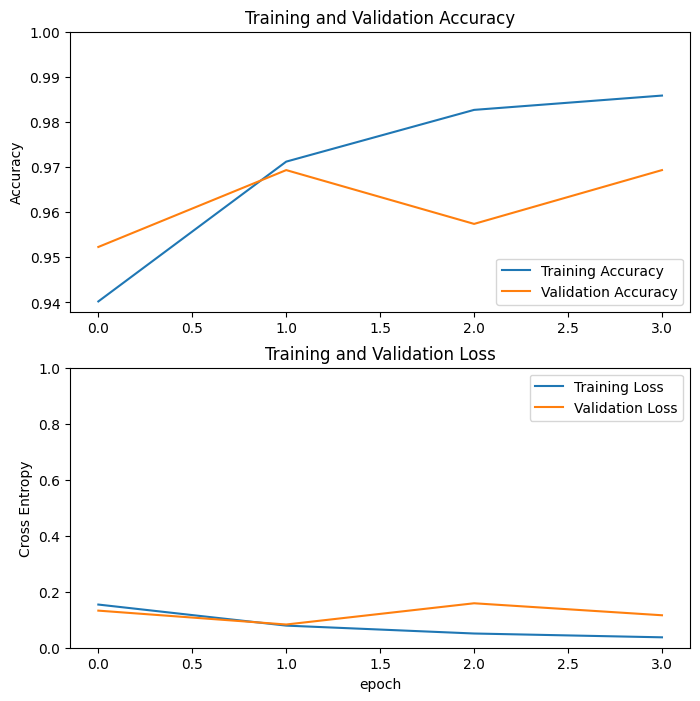

Threshold: 0.01
74/74 [==============================] - 3s 43ms/step - loss: 0.0988 - accuracy: 0.9761 - recall: 0.9824 - precision: 0.9847
Test Accuracy: 0.976068377494812
Test Loss: 0.09878156334161758
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.9581920903954803
Recall: 0.9929742388758782


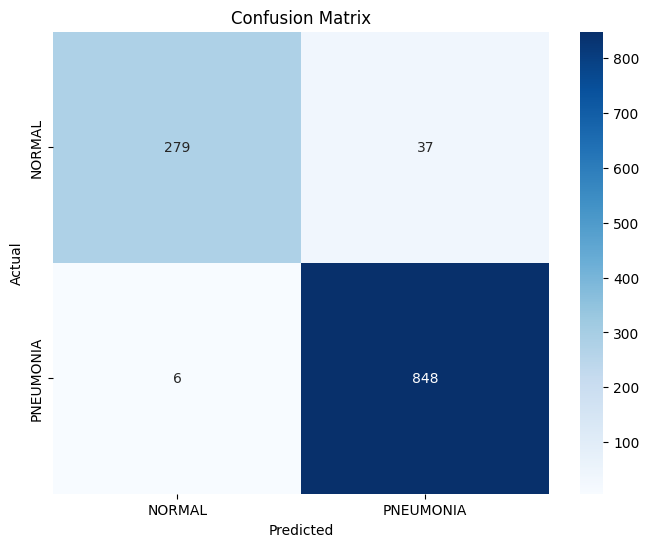

Threshold: 0.1
74/74 [==============================] - 3s 42ms/step - loss: 0.0988 - accuracy: 0.9761 - recall: 0.9824 - precision: 0.9847
Test Accuracy: 0.976068377494812
Test Loss: 0.09878155589103699
Length predictions: 1170
Hand calculated accuracy: 0.9735
Accuracy: 0.9735042735042735
Precision: 0.9757225433526011
Recall: 0.9882903981264637


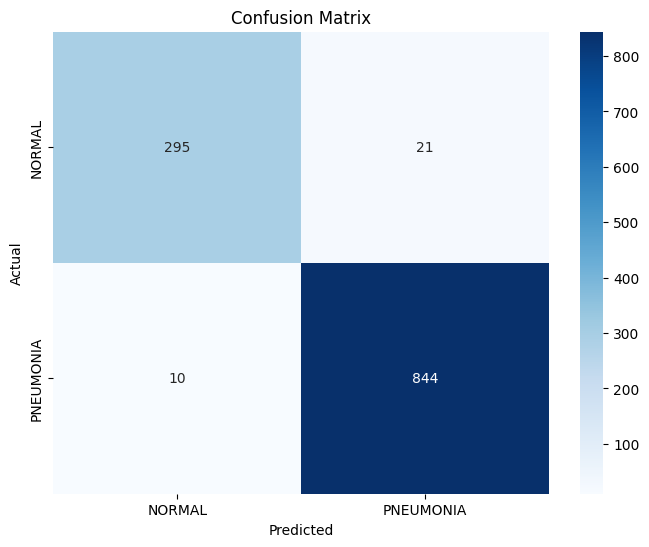

Threshold: 0.25
74/74 [==============================] - 3s 42ms/step - loss: 0.0988 - accuracy: 0.9761 - recall: 0.9824 - precision: 0.9847
Test Accuracy: 0.976068377494812
Test Loss: 0.09878157079219818
Length predictions: 1170
Hand calculated accuracy: 0.9761
Accuracy: 0.976068376068376
Precision: 0.9802325581395349
Recall: 0.9871194379391101


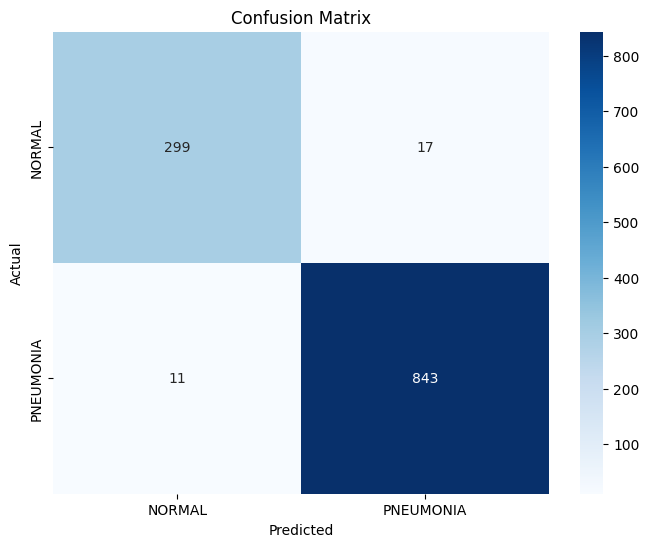

Threshold: 0.5
74/74 [==============================] - 3s 43ms/step - loss: 0.0988 - accuracy: 0.9761 - recall: 0.9824 - precision: 0.9847
Test Accuracy: 0.976068377494812
Test Loss: 0.09878155589103699
Length predictions: 1170
Hand calculated accuracy: 0.9761
Accuracy: 0.976068376068376
Precision: 0.9847417840375586
Recall: 0.9824355971896955


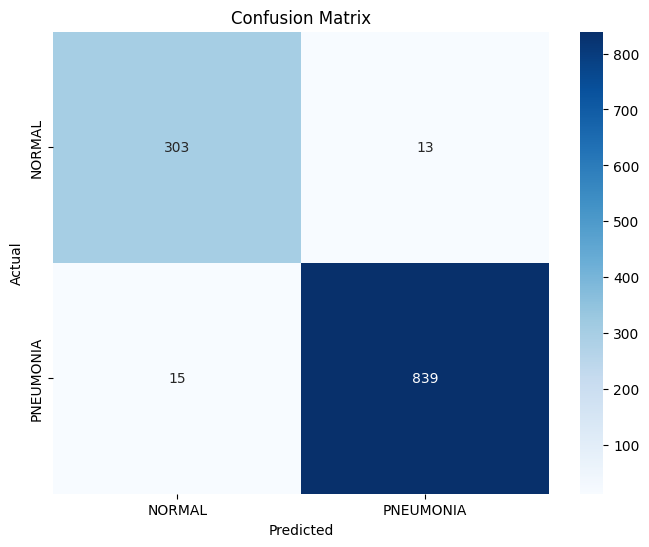

Threshold: 0.6
74/74 [==============================] - 3s 43ms/step - loss: 0.0988 - accuracy: 0.9761 - recall: 0.9824 - precision: 0.9847
Test Accuracy: 0.976068377494812
Test Loss: 0.09878154844045639
Length predictions: 1170
Hand calculated accuracy: 0.9761
Accuracy: 0.976068376068376
Precision: 0.9858823529411764
Recall: 0.9812646370023419


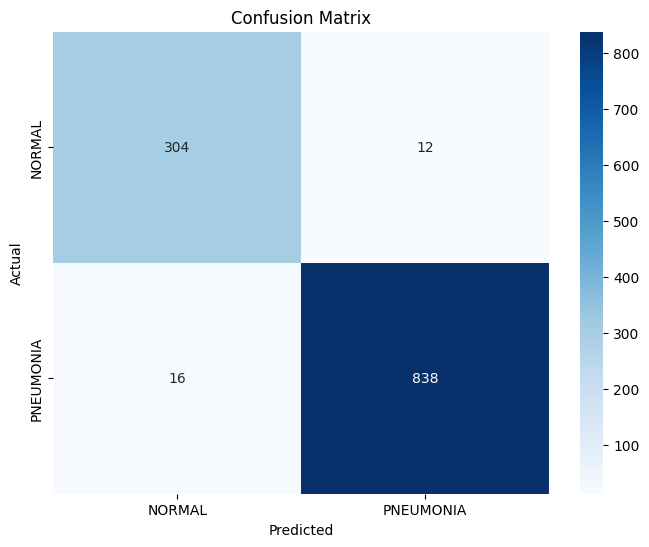

Threshold: 0.75
74/74 [==============================] - 3s 42ms/step - loss: 0.0988 - accuracy: 0.9761 - recall: 0.9824 - precision: 0.9847
Test Accuracy: 0.976068377494812
Test Loss: 0.0987815409898758
Length predictions: 1170
Hand calculated accuracy: 0.9726
Accuracy: 0.9726495726495726
Precision: 0.9869668246445498
Recall: 0.9754098360655737


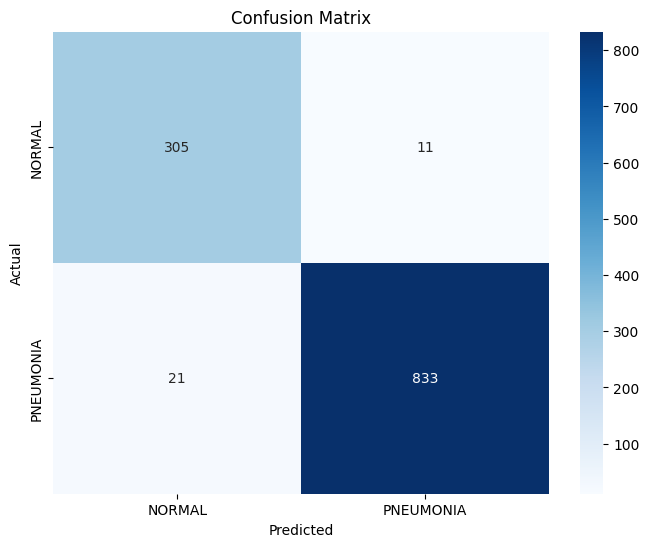

Threshold: 0.9
74/74 [==============================] - 3s 43ms/step - loss: 0.0988 - accuracy: 0.9761 - recall: 0.9824 - precision: 0.9847
Test Accuracy: 0.976068377494812
Test Loss: 0.09878155589103699
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9892344497607656
Recall: 0.968384074941452


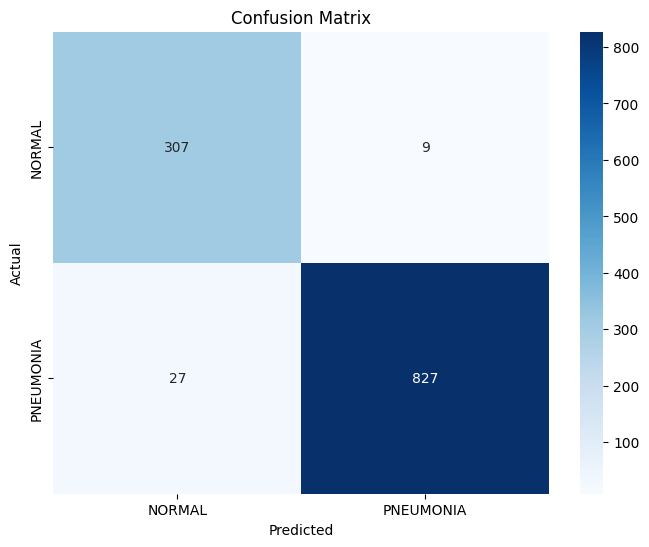

Threshold: 0.95
74/74 [==============================] - 3s 42ms/step - loss: 0.0988 - accuracy: 0.9761 - recall: 0.9824 - precision: 0.9847
Test Accuracy: 0.976068377494812
Test Loss: 0.09878156334161758
Length predictions: 1170
Hand calculated accuracy: 0.9598
Accuracy: 0.9598290598290599
Precision: 0.9914738124238733
Recall: 0.9531615925058547


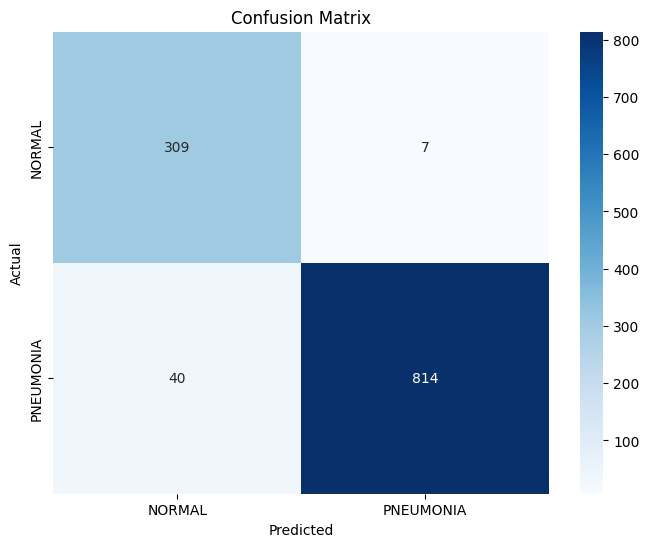

Threshold: 0.99
74/74 [==============================] - 3s 42ms/step - loss: 0.0988 - accuracy: 0.9761 - recall: 0.9824 - precision: 0.9847
Test Accuracy: 0.976068377494812
Test Loss: 0.09878341853618622
Length predictions: 1170
Hand calculated accuracy: 0.935
Accuracy: 0.935042735042735
Precision: 0.9949109414758269
Recall: 0.9156908665105387


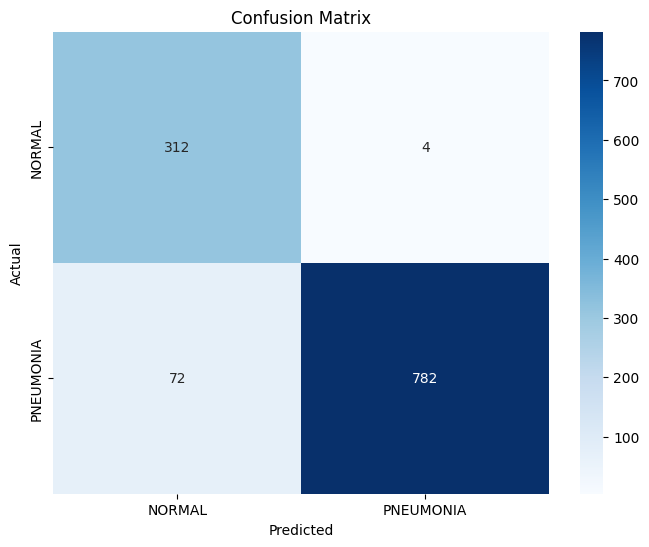

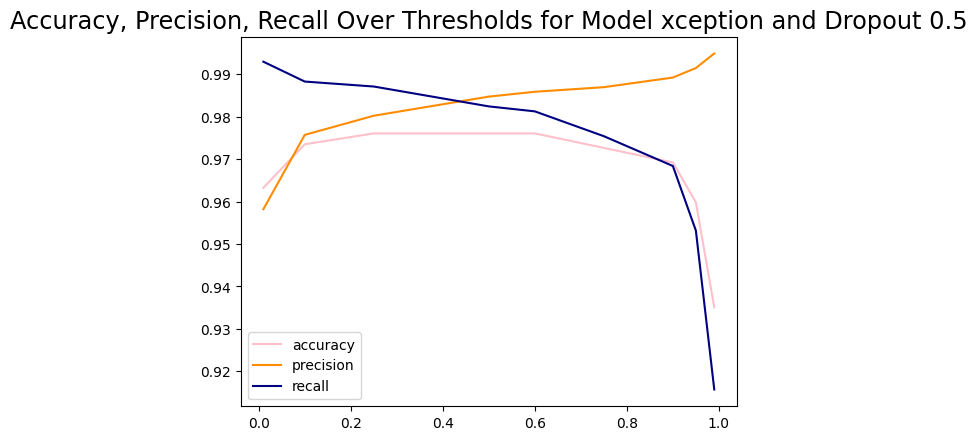



_______________


Model Name: xception
Dropout: 0.7
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 58s 219ms/step - loss: 0.1687 - accuracy: 0.9414 - recall: 0.9612 - precision: 0.9587 - val_loss: 0.1437 - val_accuracy: 0.9540 - val_recall: 0.9907 - val_precision: 0.9485
Epoch 2/4
257/257 [==============================] - 55s 215ms/step - loss: 0.0780 - accuracy: 0.9732 - recall: 0.9819 - precision: 0.9813 - val_loss: 0.1230 - val_accuracy: 0.9710 - val_recall: 0.9696 - val_precision: 0.9905
Epoch 3/4
257/257 [==============================] - 55s 215ms/step - loss: 0.0542 - accuracy: 0.9815 - recall: 0.9866 - precision: 0.9879 - val_loss: 0.1579 - val_accuracy: 0.9676 - val_recall: 0.9650 - val_precision: 0.9904
Epoch 4/4
257/257 [==============================] - 55s 213ms/step - loss: 0.0538 - accuracy: 0.9822 - recall: 0.9883 - precision: 0.9873 - val_l

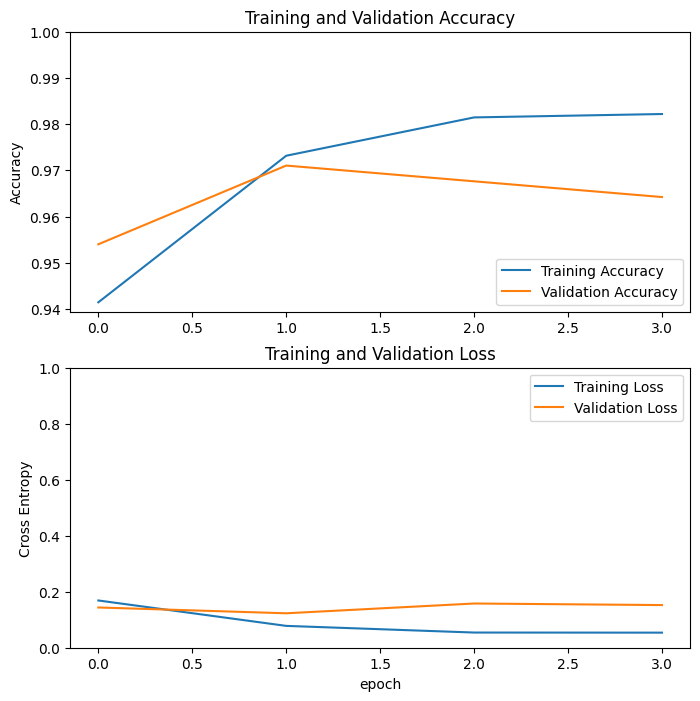

Threshold: 0.01
74/74 [==============================] - 3s 43ms/step - loss: 0.1431 - accuracy: 0.9726 - recall: 0.9906 - precision: 0.9724
Test Accuracy: 0.9726495742797852
Test Loss: 0.14309361577033997
Length predictions: 1170
Hand calculated accuracy: 0.953
Accuracy: 0.9529914529914529
Precision: 0.9424141749723145
Recall: 0.9964871194379391


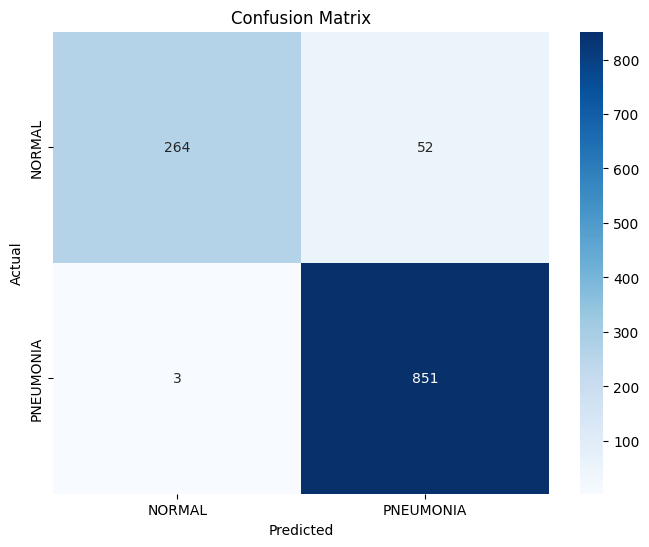

Threshold: 0.1
74/74 [==============================] - 3s 43ms/step - loss: 0.1431 - accuracy: 0.9726 - recall: 0.9906 - precision: 0.9724
Test Accuracy: 0.9726495742797852
Test Loss: 0.14309361577033997
Length predictions: 1170
Hand calculated accuracy: 0.9641
Accuracy: 0.9641025641025641
Precision: 0.9603174603174603
Recall: 0.9918032786885246


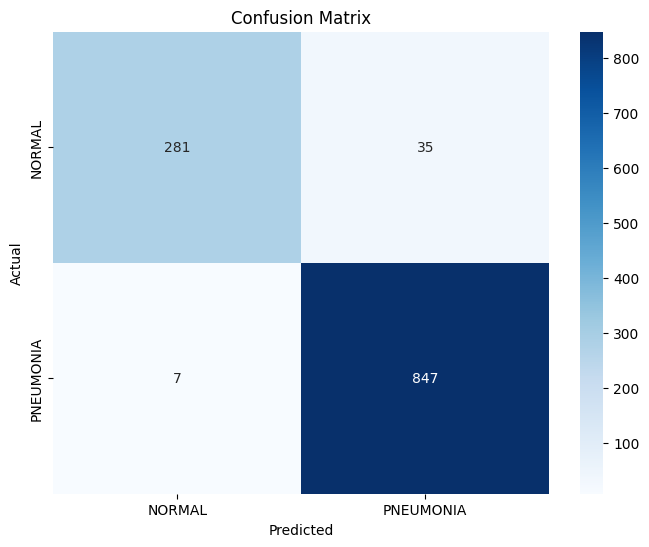

Threshold: 0.25
74/74 [==============================] - 3s 43ms/step - loss: 0.1431 - accuracy: 0.9726 - recall: 0.9906 - precision: 0.9724
Test Accuracy: 0.9726495742797852
Test Loss: 0.14309361577033997
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9668949771689498
Recall: 0.9918032786885246


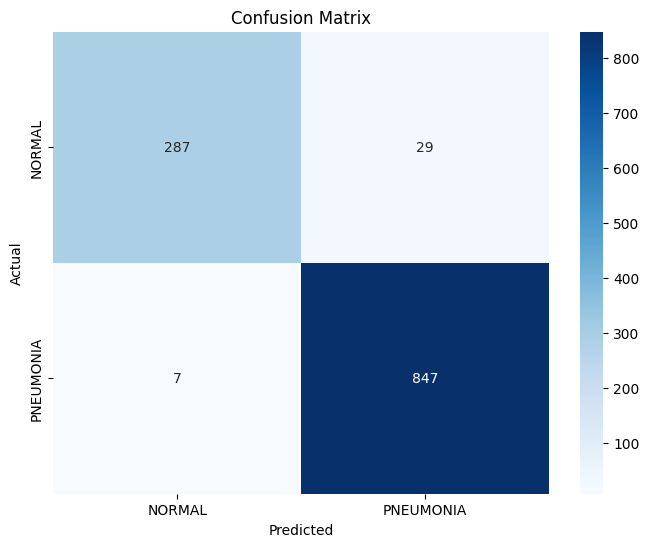

Threshold: 0.5
74/74 [==============================] - 3s 45ms/step - loss: 0.1431 - accuracy: 0.9726 - recall: 0.9906 - precision: 0.9724
Test Accuracy: 0.9726495742797852
Test Loss: 0.1430927962064743
Length predictions: 1170
Hand calculated accuracy: 0.9726
Accuracy: 0.9726495726495726
Precision: 0.9724137931034482
Recall: 0.990632318501171


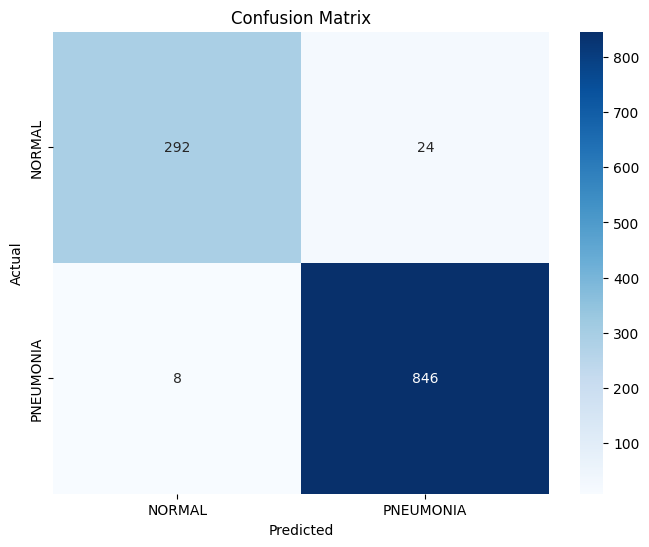

Threshold: 0.6
74/74 [==============================] - 3s 43ms/step - loss: 0.1431 - accuracy: 0.9726 - recall: 0.9906 - precision: 0.9724
Test Accuracy: 0.9726495742797852
Test Loss: 0.14309360086917877
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9734717416378316
Recall: 0.9882903981264637


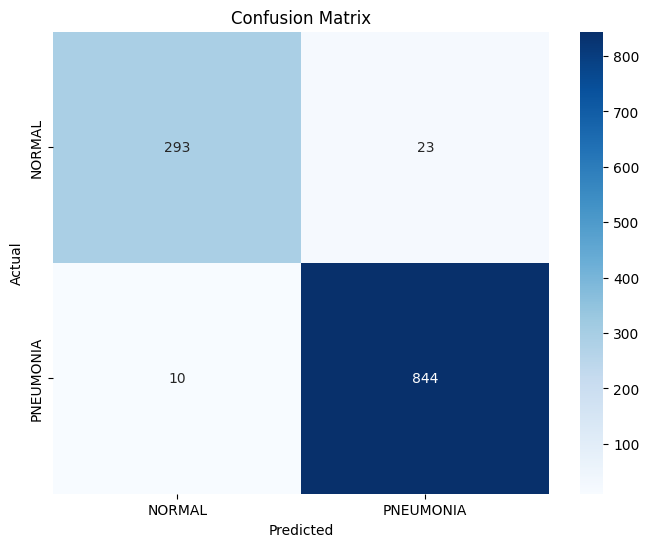

Threshold: 0.75
74/74 [==============================] - 3s 43ms/step - loss: 0.1431 - accuracy: 0.9726 - recall: 0.9906 - precision: 0.9724
Test Accuracy: 0.9726495742797852
Test Loss: 0.1430935561656952
Length predictions: 1170
Hand calculated accuracy: 0.9718
Accuracy: 0.9717948717948718
Precision: 0.9756662804171495
Recall: 0.9859484777517564


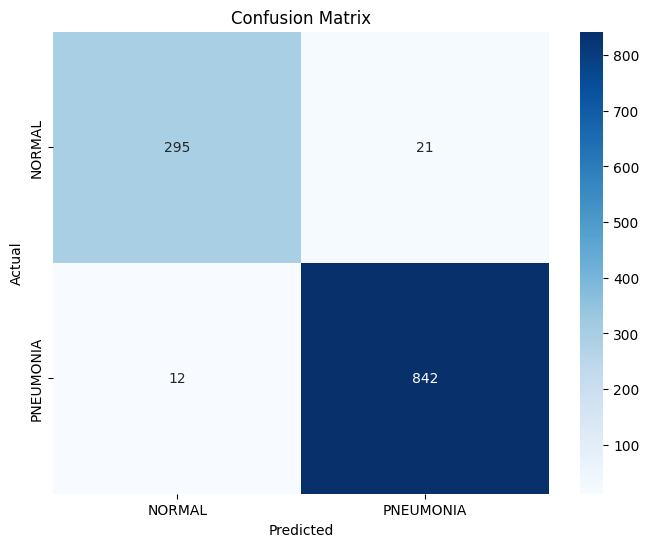

Threshold: 0.9
74/74 [==============================] - 3s 42ms/step - loss: 0.1431 - accuracy: 0.9726 - recall: 0.9906 - precision: 0.9724
Test Accuracy: 0.9726495742797852
Test Loss: 0.14309361577033997
Length predictions: 1170
Hand calculated accuracy: 0.9735
Accuracy: 0.9735042735042735
Precision: 0.9779326364692218
Recall: 0.9859484777517564


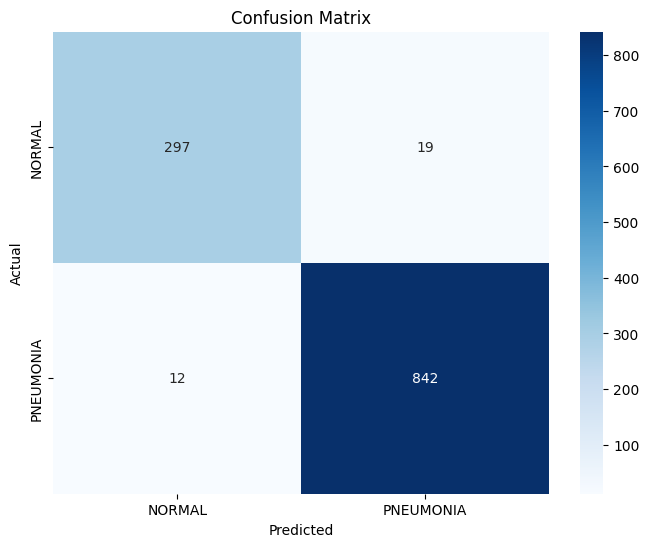

Threshold: 0.95
74/74 [==============================] - 3s 43ms/step - loss: 0.1431 - accuracy: 0.9726 - recall: 0.9906 - precision: 0.9724
Test Accuracy: 0.9726495742797852
Test Loss: 0.14309363067150116
Length predictions: 1170
Hand calculated accuracy: 0.9752
Accuracy: 0.9752136752136752
Precision: 0.9824561403508771
Recall: 0.9836065573770492


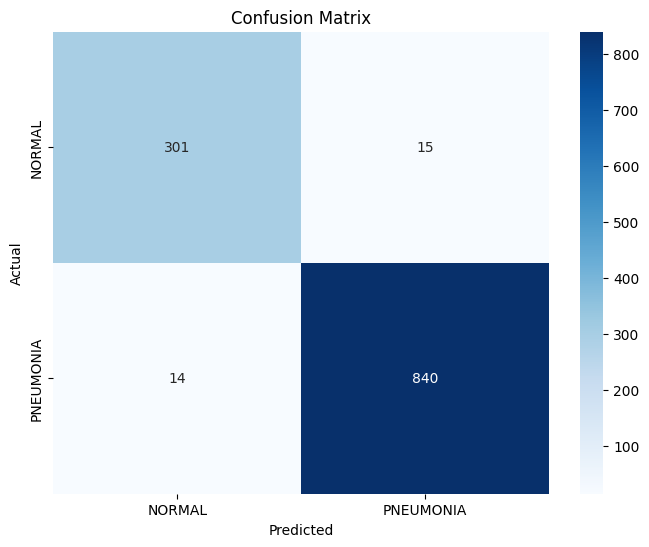

Threshold: 0.99
74/74 [==============================] - 3s 43ms/step - loss: 0.1431 - accuracy: 0.9726 - recall: 0.9906 - precision: 0.9724
Test Accuracy: 0.9726495742797852
Test Loss: 0.14309360086917877
Length predictions: 1170
Hand calculated accuracy: 0.9692
Accuracy: 0.9692307692307692
Precision: 0.9857482185273159
Recall: 0.9718969555035128


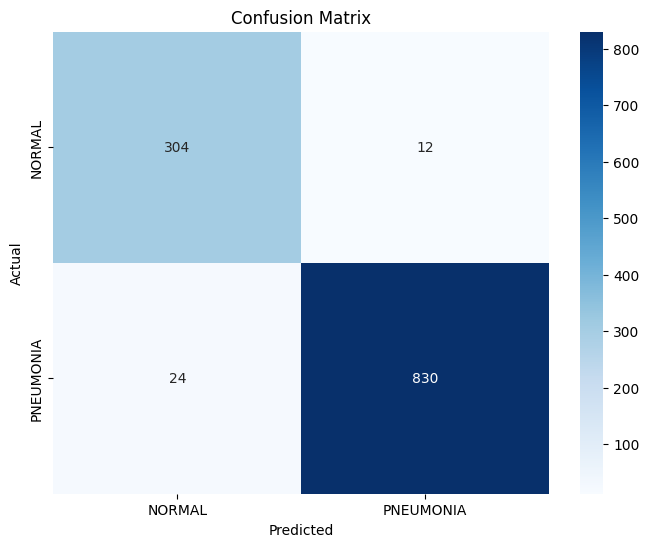

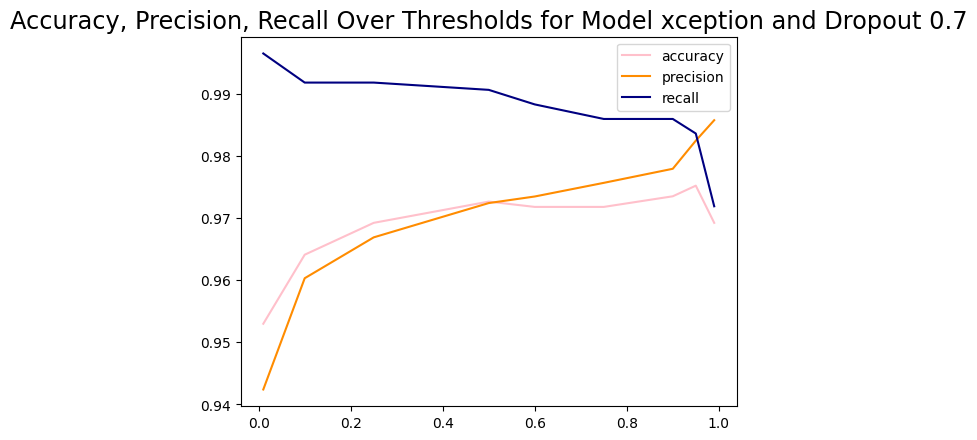



_______________


Model Name: xception
Dropout: 0
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 57s 213ms/step - loss: 0.1506 - accuracy: 0.9429 - recall: 0.9666 - precision: 0.9557 - val_loss: 0.2721 - val_accuracy: 0.9336 - val_recall: 0.9159 - val_precision: 0.9924
Epoch 2/4
257/257 [==============================] - 54s 208ms/step - loss: 0.0851 - accuracy: 0.9707 - recall: 0.9779 - precision: 0.9819 - val_loss: 0.0989 - val_accuracy: 0.9608 - val_recall: 0.9650 - val_precision: 0.9810
Epoch 3/4
257/257 [==============================] - 54s 208ms/step - loss: 0.0648 - accuracy: 0.9766 - recall: 0.9856 - precision: 0.9823 - val_loss: 0.1130 - val_accuracy: 0.9608 - val_recall: 0.9556 - val_precision: 0.9903
Epoch 4/4
257/257 [==============================] - 54s 208ms/step - loss: 0.0505 - accuracy: 0.9798 - recall: 0.9853 - precision: 0.9869 - val_los

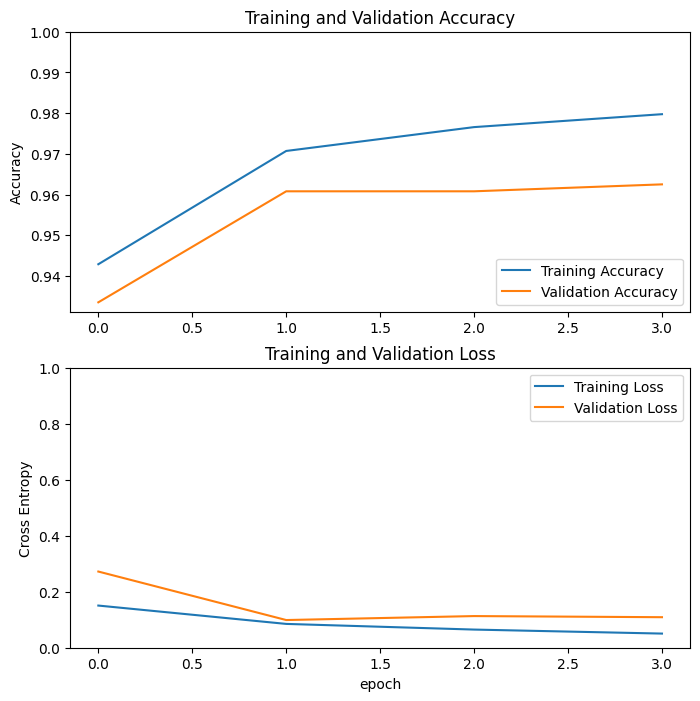

Threshold: 0.01
74/74 [==============================] - 3s 43ms/step - loss: 0.0848 - accuracy: 0.9761 - recall: 0.9883 - precision: 0.9791
Test Accuracy: 0.976068377494812
Test Loss: 0.08481276780366898
Length predictions: 1170
Hand calculated accuracy: 0.894
Accuracy: 0.8940170940170941
Precision: 0.8732106339468303
Recall: 1.0


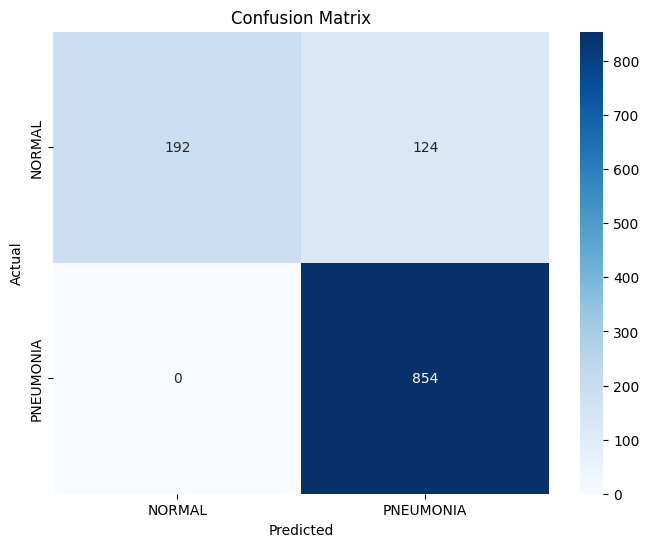

Threshold: 0.1
74/74 [==============================] - 3s 44ms/step - loss: 0.0848 - accuracy: 0.9761 - recall: 0.9883 - precision: 0.9791
Test Accuracy: 0.976068377494812
Test Loss: 0.08481276780366898
Length predictions: 1170
Hand calculated accuracy: 0.9581
Accuracy: 0.9581196581196582
Precision: 0.9507278835386338
Recall: 0.9941451990632318


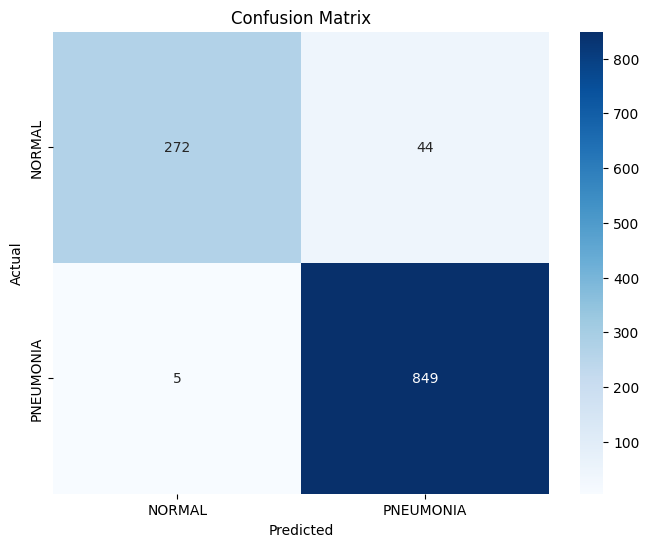

Threshold: 0.25
74/74 [==============================] - 3s 44ms/step - loss: 0.0848 - accuracy: 0.9761 - recall: 0.9883 - precision: 0.9791
Test Accuracy: 0.976068377494812
Test Loss: 0.08481277525424957
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9635119726339795
Recall: 0.9894613583138173


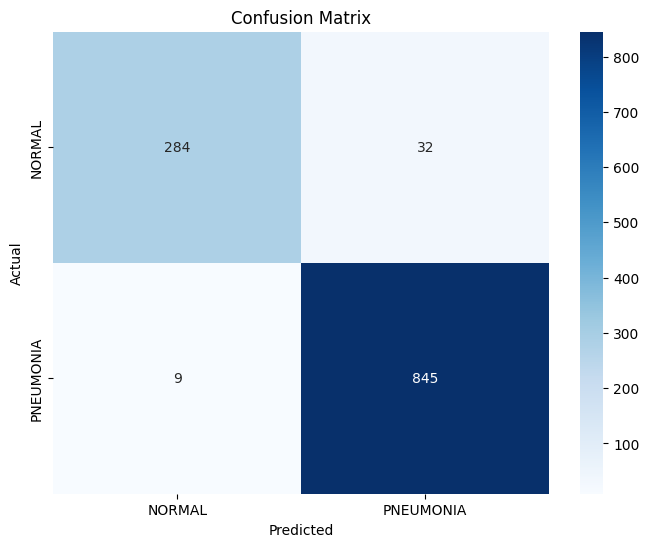

Threshold: 0.5
74/74 [==============================] - 3s 43ms/step - loss: 0.0848 - accuracy: 0.9761 - recall: 0.9883 - precision: 0.9791
Test Accuracy: 0.976068377494812
Test Loss: 0.08481276780366898
Length predictions: 1170
Hand calculated accuracy: 0.9761
Accuracy: 0.976068376068376
Precision: 0.9791183294663574
Recall: 0.9882903981264637


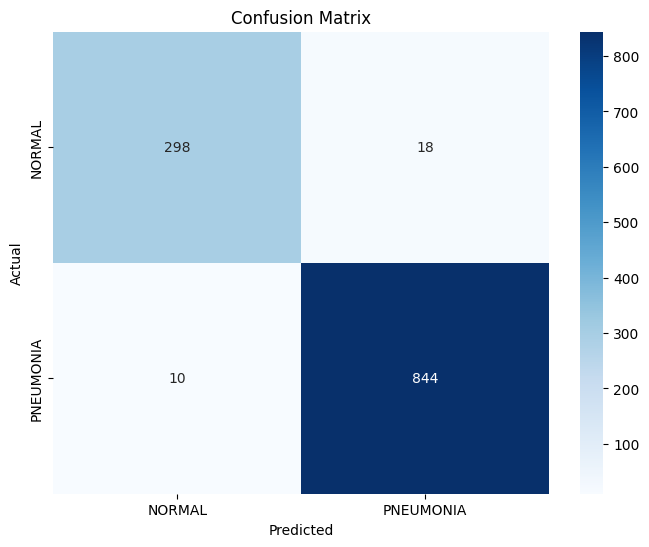

Threshold: 0.6
74/74 [==============================] - 3s 43ms/step - loss: 0.0848 - accuracy: 0.9761 - recall: 0.9883 - precision: 0.9791
Test Accuracy: 0.976068377494812
Test Loss: 0.08481276780366898
Length predictions: 1170
Hand calculated accuracy: 0.9752
Accuracy: 0.9752136752136752
Precision: 0.980209545983702
Recall: 0.9859484777517564


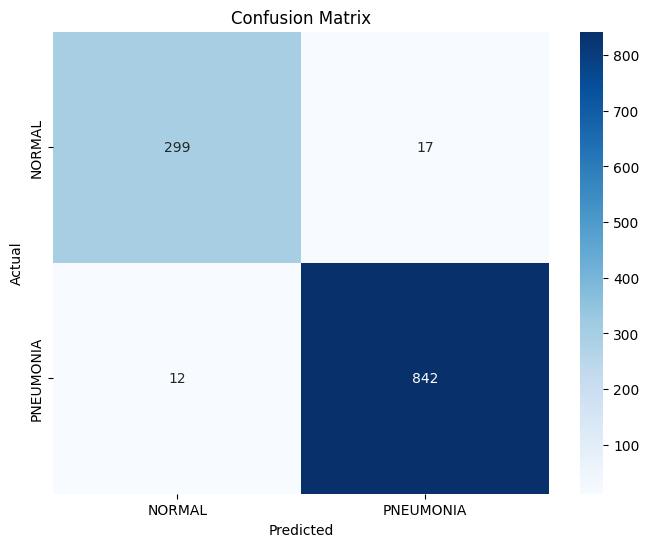

Threshold: 0.75
74/74 [==============================] - 3s 43ms/step - loss: 0.0848 - accuracy: 0.9761 - recall: 0.9883 - precision: 0.9791
Test Accuracy: 0.976068377494812
Test Loss: 0.08481275290250778
Length predictions: 1170
Hand calculated accuracy: 0.9744
Accuracy: 0.9743589743589743
Precision: 0.9869976359338062
Recall: 0.977751756440281


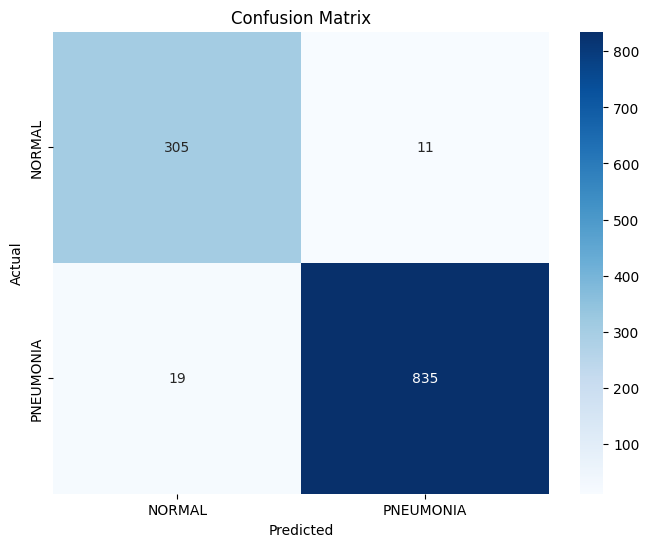

Threshold: 0.9
74/74 [==============================] - 3s 44ms/step - loss: 0.0848 - accuracy: 0.9761 - recall: 0.9883 - precision: 0.9791
Test Accuracy: 0.976068377494812
Test Loss: 0.08481276780366898
Length predictions: 1170
Hand calculated accuracy: 0.9684
Accuracy: 0.9683760683760684
Precision: 0.98805256869773
Recall: 0.968384074941452


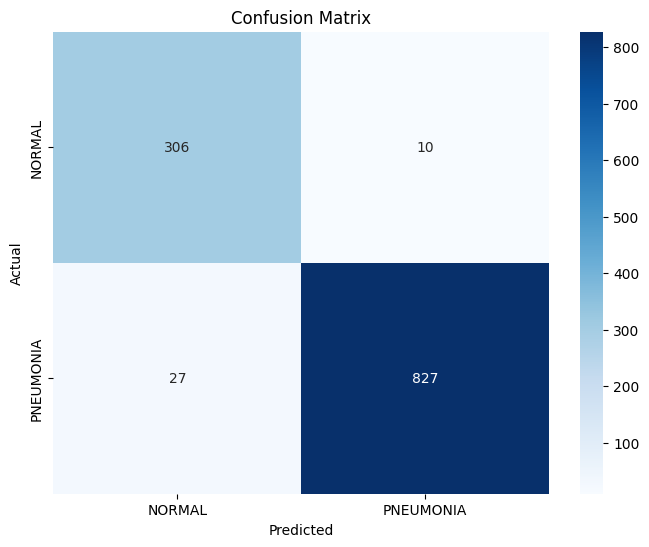

Threshold: 0.95
74/74 [==============================] - 3s 43ms/step - loss: 0.0848 - accuracy: 0.9761 - recall: 0.9883 - precision: 0.9791
Test Accuracy: 0.976068377494812
Test Loss: 0.08481276780366898
Length predictions: 1170
Hand calculated accuracy: 0.9624
Accuracy: 0.9623931623931624
Precision: 0.9927007299270073
Recall: 0.955503512880562


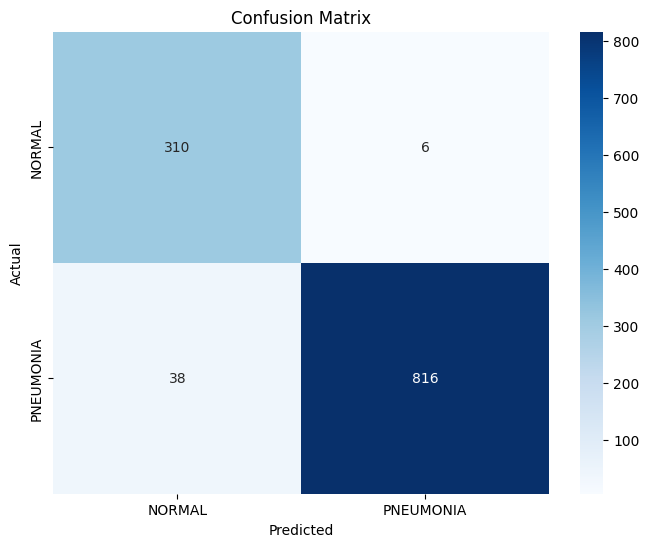

Threshold: 0.99
74/74 [==============================] - 3s 43ms/step - loss: 0.0848 - accuracy: 0.9761 - recall: 0.9883 - precision: 0.9791
Test Accuracy: 0.976068377494812
Test Loss: 0.08481278270483017
Length predictions: 1170
Hand calculated accuracy: 0.9282
Accuracy: 0.9282051282051282
Precision: 0.9935897435897436
Recall: 0.9074941451990632


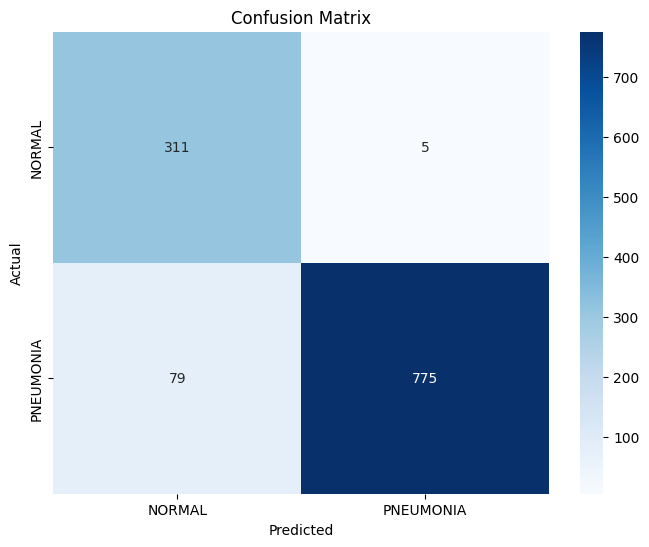

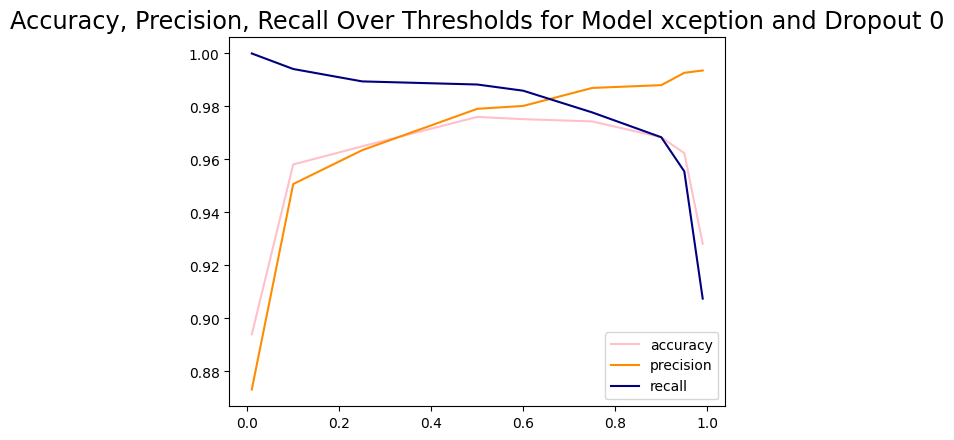



_______________


Model Name: xception
Dropout: 0.2
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 57s 213ms/step - loss: 0.1497 - accuracy: 0.9456 - recall: 0.9659 - precision: 0.9598 - val_loss: 0.1087 - val_accuracy: 0.9625 - val_recall: 0.9836 - val_precision: 0.9656
Epoch 2/4
257/257 [==============================] - 54s 209ms/step - loss: 0.0725 - accuracy: 0.9712 - recall: 0.9806 - precision: 0.9800 - val_loss: 0.0951 - val_accuracy: 0.9625 - val_recall: 0.9860 - val_precision: 0.9635
Epoch 3/4
257/257 [==============================] - 54s 210ms/step - loss: 0.0552 - accuracy: 0.9837 - recall: 0.9893 - precision: 0.9883 - val_loss: 0.1240 - val_accuracy: 0.9608 - val_recall: 0.9579 - val_precision: 0.9880
Epoch 4/4
257/257 [==============================] - 54s 210ms/step - loss: 0.0272 - accuracy: 0.9905 - recall: 0.9936 - precision: 0.9933 - val_l

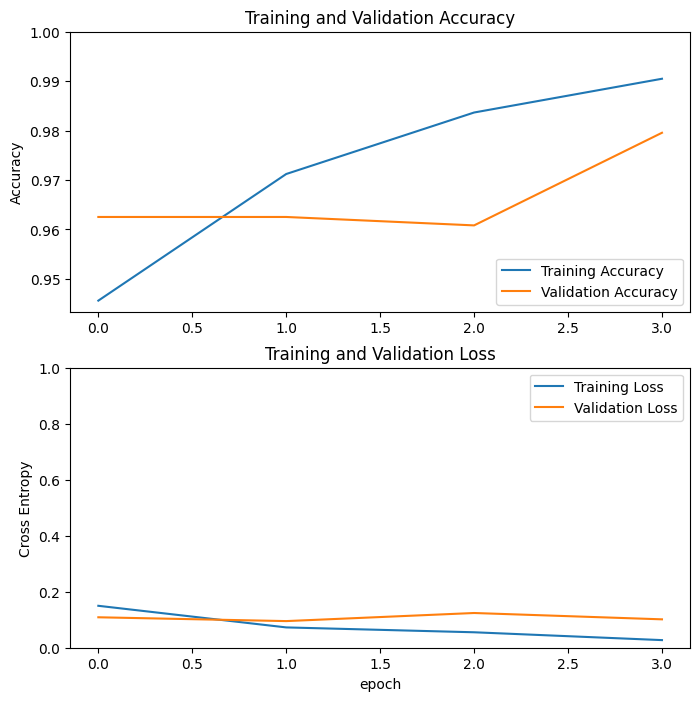

Threshold: 0.01
74/74 [==============================] - 3s 43ms/step - loss: 0.0880 - accuracy: 0.9744 - recall: 0.9801 - precision: 0.9847
Test Accuracy: 0.9743589758872986
Test Loss: 0.08797580748796463
Length predictions: 1170
Hand calculated accuracy: 0.9607
Accuracy: 0.9606837606837607
Precision: 0.952914798206278
Recall: 0.9953161592505855


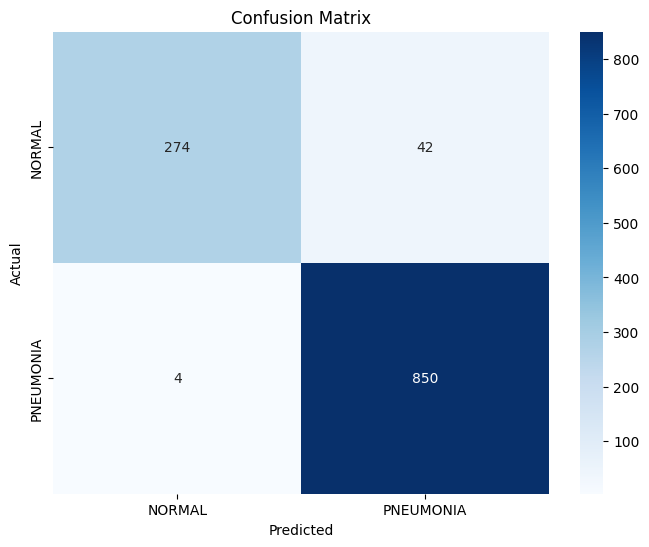

Threshold: 0.1
74/74 [==============================] - 3s 44ms/step - loss: 0.0880 - accuracy: 0.9744 - recall: 0.9801 - precision: 0.9847
Test Accuracy: 0.9743589758872986
Test Loss: 0.08797577768564224
Length predictions: 1170
Hand calculated accuracy: 0.9744
Accuracy: 0.9743589743589743
Precision: 0.9746543778801844
Recall: 0.990632318501171


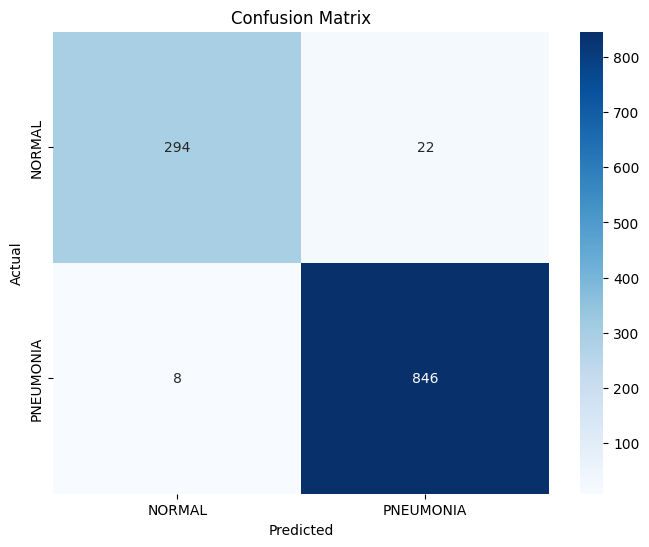

Threshold: 0.25
74/74 [==============================] - 3s 43ms/step - loss: 0.0880 - accuracy: 0.9744 - recall: 0.9801 - precision: 0.9847
Test Accuracy: 0.9743589758872986
Test Loss: 0.08797578513622284
Length predictions: 1170
Hand calculated accuracy: 0.9744
Accuracy: 0.9743589743589743
Precision: 0.9813084112149533
Recall: 0.9836065573770492


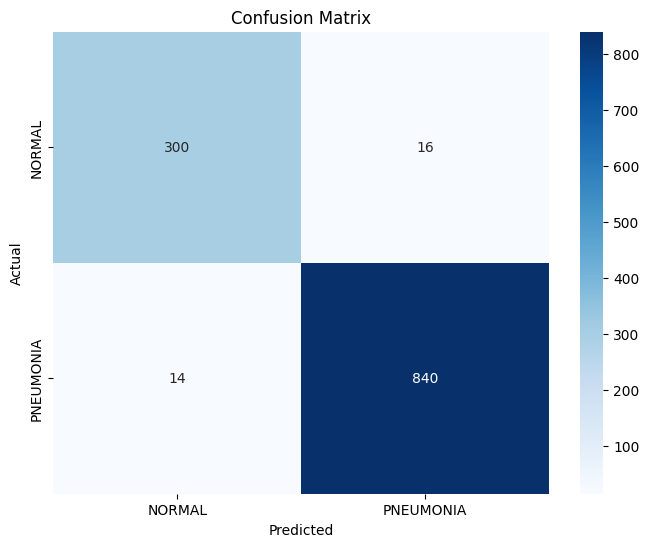

Threshold: 0.5
74/74 [==============================] - 3s 44ms/step - loss: 0.0880 - accuracy: 0.9744 - recall: 0.9801 - precision: 0.9847
Test Accuracy: 0.9743589758872986
Test Loss: 0.08797576278448105
Length predictions: 1170
Hand calculated accuracy: 0.9744
Accuracy: 0.9743589743589743
Precision: 0.9847058823529412
Recall: 0.9800936768149883


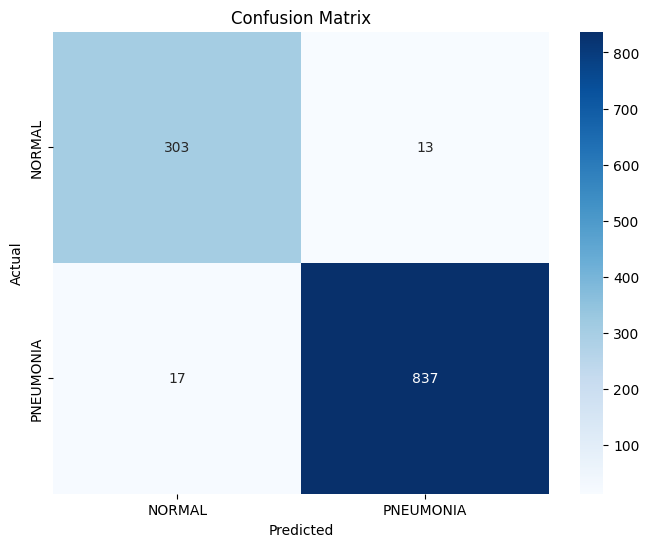

Threshold: 0.6
74/74 [==============================] - 3s 43ms/step - loss: 0.0880 - accuracy: 0.9744 - recall: 0.9801 - precision: 0.9847
Test Accuracy: 0.9743589758872986
Test Loss: 0.08797577023506165
Length predictions: 1170
Hand calculated accuracy: 0.9726
Accuracy: 0.9726495726495726
Precision: 0.9846698113207547
Recall: 0.977751756440281


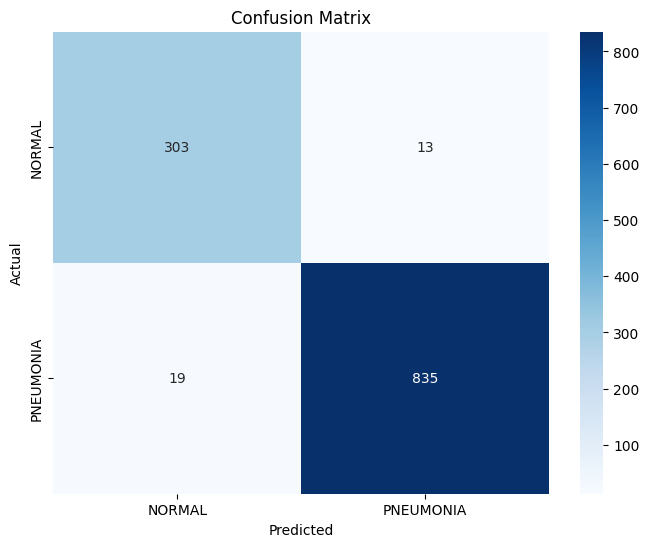

Threshold: 0.75
74/74 [==============================] - 3s 42ms/step - loss: 0.0880 - accuracy: 0.9744 - recall: 0.9801 - precision: 0.9847
Test Accuracy: 0.9743589758872986
Test Loss: 0.08797577768564224
Length predictions: 1170
Hand calculated accuracy: 0.9744
Accuracy: 0.9743589743589743
Precision: 0.9893111638954869
Recall: 0.9754098360655737


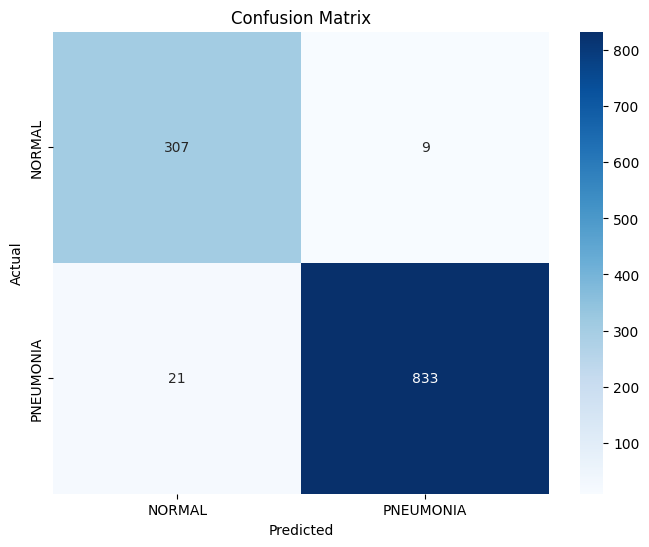

Threshold: 0.9
74/74 [==============================] - 3s 41ms/step - loss: 0.0880 - accuracy: 0.9744 - recall: 0.9801 - precision: 0.9847
Test Accuracy: 0.9743589758872986
Test Loss: 0.08797577768564224
Length predictions: 1170
Hand calculated accuracy: 0.9684
Accuracy: 0.9683760683760684
Precision: 0.9903961584633854
Recall: 0.9660421545667447


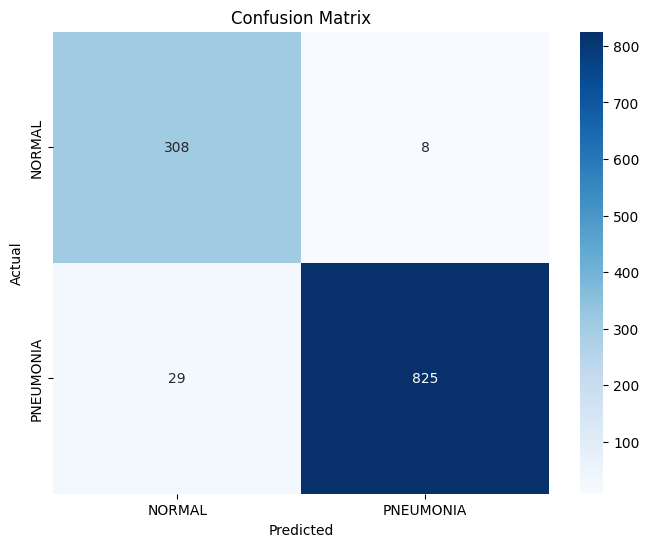

Threshold: 0.95
74/74 [==============================] - 3s 43ms/step - loss: 0.0880 - accuracy: 0.9744 - recall: 0.9801 - precision: 0.9847
Test Accuracy: 0.9743589758872986
Test Loss: 0.08797580003738403
Length predictions: 1170
Hand calculated accuracy: 0.9581
Accuracy: 0.9581196581196582
Precision: 0.9914529914529915
Recall: 0.9508196721311475


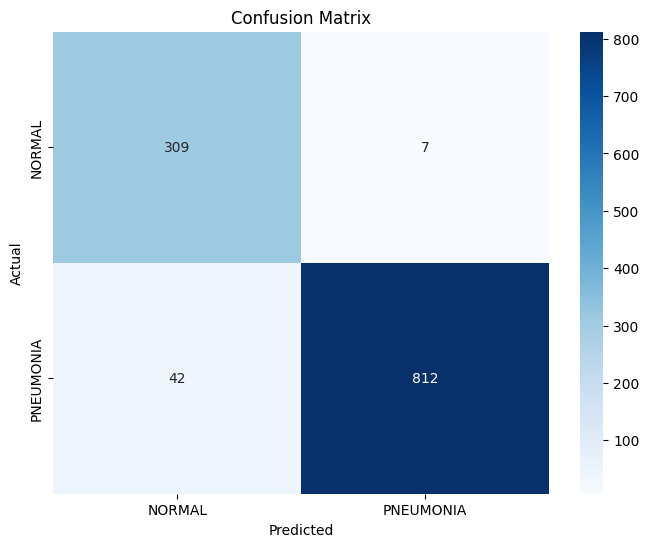

Threshold: 0.99
74/74 [==============================] - 3s 44ms/step - loss: 0.0880 - accuracy: 0.9744 - recall: 0.9801 - precision: 0.9847
Test Accuracy: 0.9743589758872986
Test Loss: 0.08797578513622284
Length predictions: 1170
Hand calculated accuracy: 0.9239
Accuracy: 0.923931623931624
Precision: 0.9973992197659298
Recall: 0.8981264637002342


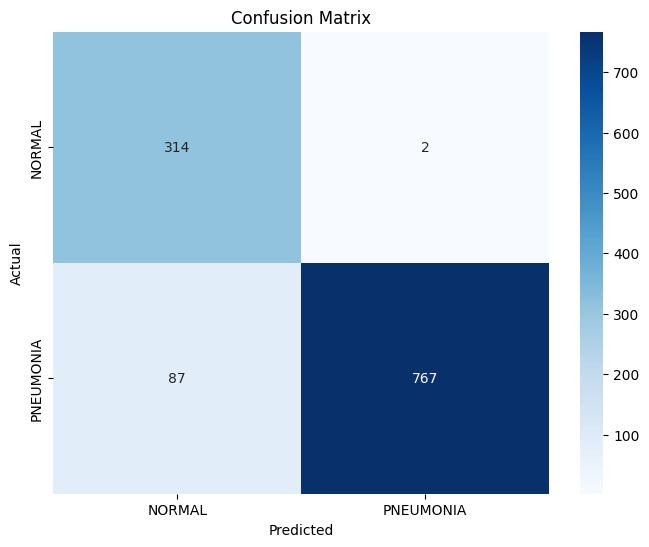

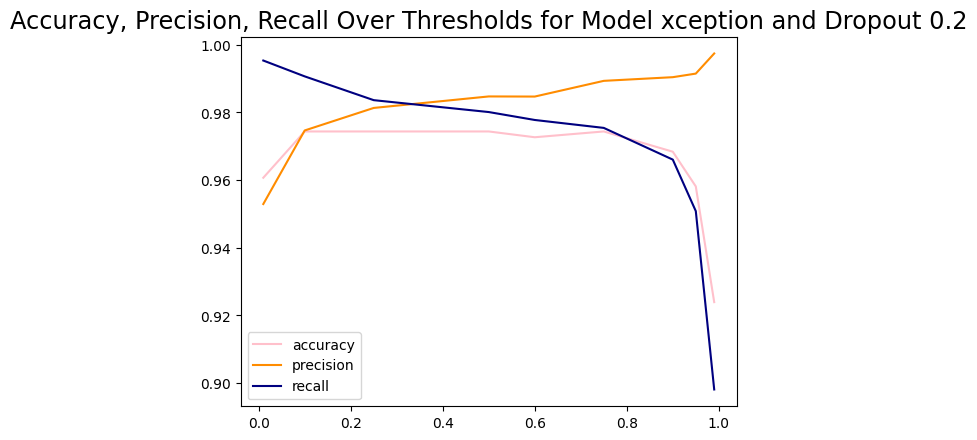



_______________


Model Name: xception
Dropout: 0.5
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 56s 211ms/step - loss: 0.1316 - accuracy: 0.9497 - recall: 0.9692 - precision: 0.9622 - val_loss: 0.1425 - val_accuracy: 0.9506 - val_recall: 0.9439 - val_precision: 0.9878
Epoch 2/4
257/257 [==============================] - 55s 215ms/step - loss: 0.0821 - accuracy: 0.9700 - recall: 0.9803 - precision: 0.9786 - val_loss: 0.0940 - val_accuracy: 0.9659 - val_recall: 0.9673 - val_precision: 0.9857
Epoch 3/4
257/257 [==============================] - 55s 213ms/step - loss: 0.0505 - accuracy: 0.9822 - recall: 0.9890 - precision: 0.9867 - val_loss: 0.1343 - val_accuracy: 0.9659 - val_recall: 0.9953 - val_precision: 0.9595
Epoch 4/4
257/257 [==============================] - 55s 213ms/step - loss: 0.0354 - accuracy: 0.9900 - recall: 0.9933 - precision: 0.9930 - val_l

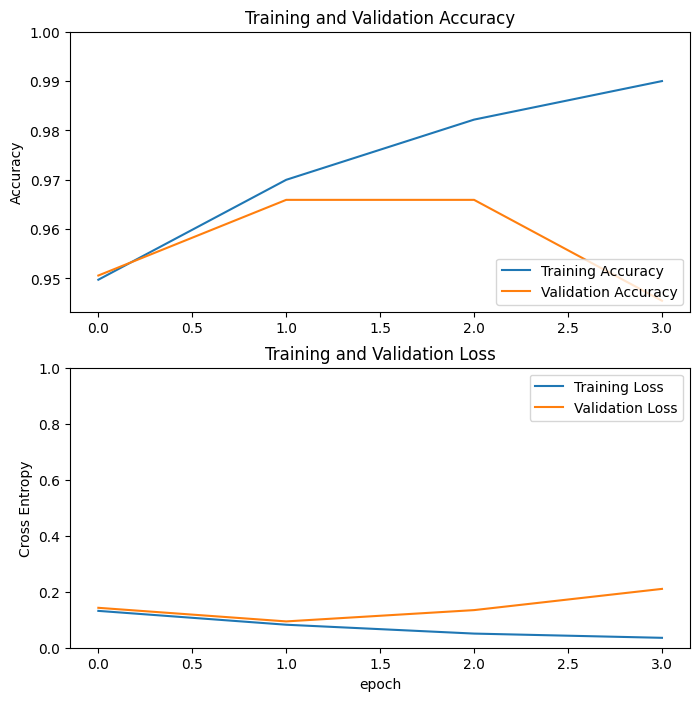

Threshold: 0.01
74/74 [==============================] - 3s 43ms/step - loss: 0.1743 - accuracy: 0.9504 - recall: 0.9415 - precision: 0.9901
Test Accuracy: 0.9504273533821106
Test Loss: 0.17430371046066284
Length predictions: 1170
Hand calculated accuracy: 0.959
Accuracy: 0.958974358974359
Precision: 0.958997722095672
Recall: 0.9859484777517564


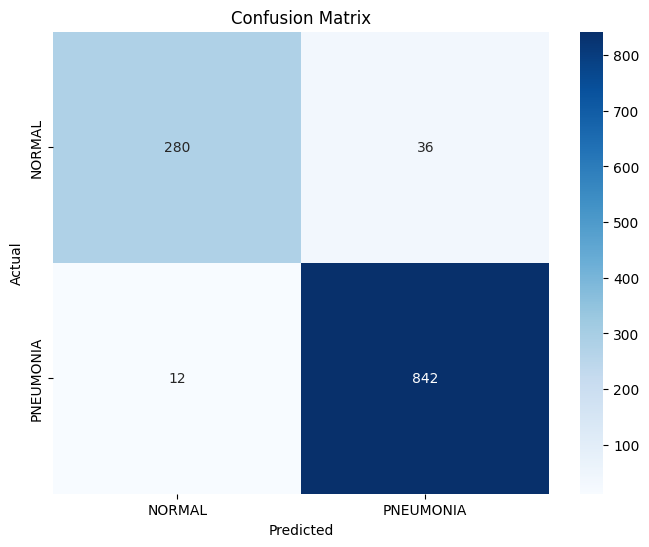

Threshold: 0.1
74/74 [==============================] - 3s 43ms/step - loss: 0.1743 - accuracy: 0.9504 - recall: 0.9415 - precision: 0.9901
Test Accuracy: 0.9504273533821106
Test Loss: 0.17430372536182404
Length predictions: 1170
Hand calculated accuracy: 0.9598
Accuracy: 0.9598290598290599
Precision: 0.9775147928994082
Recall: 0.9672131147540983


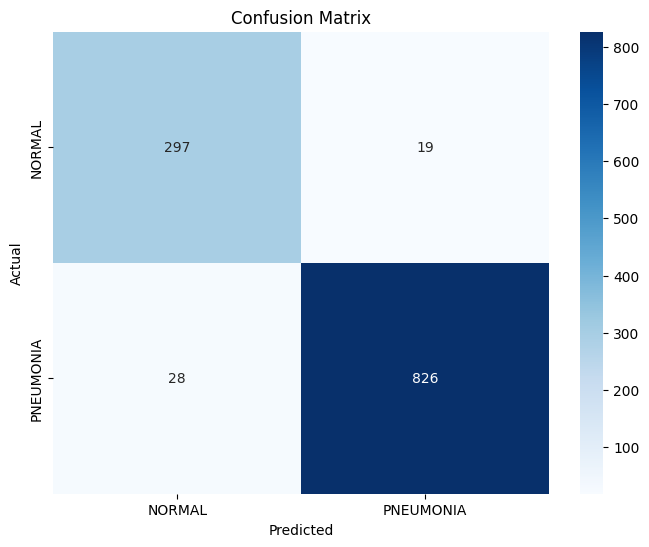

Threshold: 0.25
74/74 [==============================] - 3s 43ms/step - loss: 0.1743 - accuracy: 0.9504 - recall: 0.9415 - precision: 0.9901
Test Accuracy: 0.9504273533821106
Test Loss: 0.17430369555950165
Length predictions: 1170
Hand calculated accuracy: 0.9624
Accuracy: 0.9623931623931624
Precision: 0.9867788461538461
Recall: 0.9613583138173302


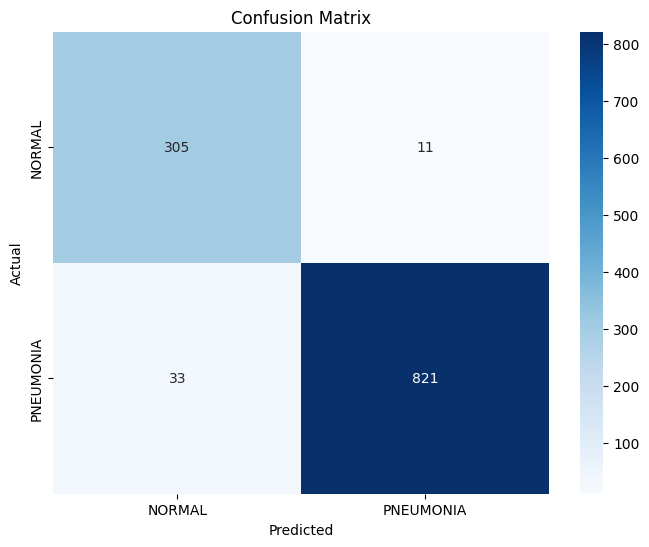

Threshold: 0.5
74/74 [==============================] - 3s 43ms/step - loss: 0.1743 - accuracy: 0.9504 - recall: 0.9415 - precision: 0.9901
Test Accuracy: 0.9504273533821106
Test Loss: 0.17430369555950165
Length predictions: 1170
Hand calculated accuracy: 0.9504
Accuracy: 0.9504273504273504
Precision: 0.9901477832512315
Recall: 0.9414519906323185


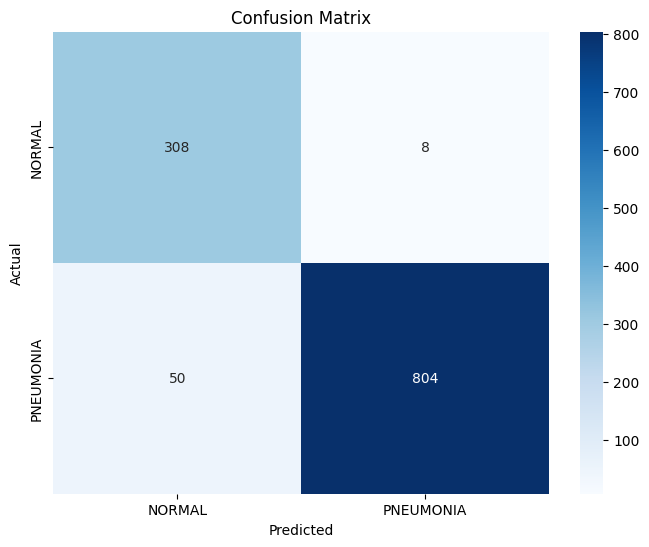

Threshold: 0.6
74/74 [==============================] - 3s 43ms/step - loss: 0.1743 - accuracy: 0.9504 - recall: 0.9415 - precision: 0.9901
Test Accuracy: 0.9504273533821106
Test Loss: 0.17430366575717926
Length predictions: 1170
Hand calculated accuracy: 0.9393
Accuracy: 0.9393162393162393
Precision: 0.9899874843554443
Recall: 0.9262295081967213


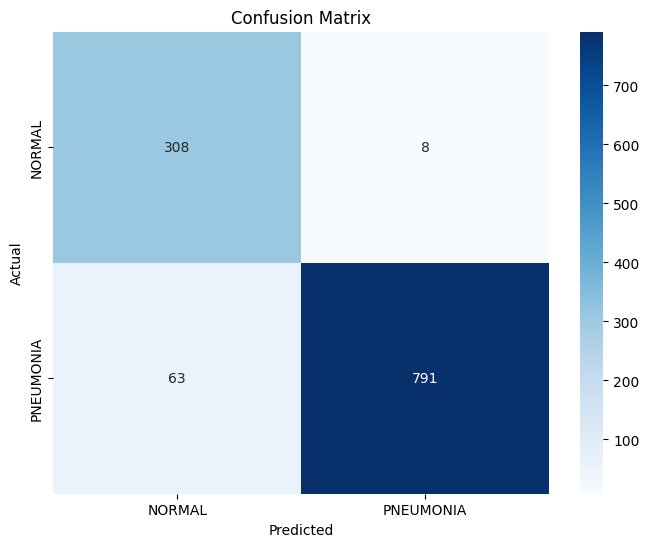

Threshold: 0.75
74/74 [==============================] - 3s 43ms/step - loss: 0.1743 - accuracy: 0.9504 - recall: 0.9415 - precision: 0.9901
Test Accuracy: 0.9504273533821106
Test Loss: 0.17430377006530762
Length predictions: 1170
Hand calculated accuracy: 0.935
Accuracy: 0.935042735042735
Precision: 0.9936548223350253
Recall: 0.9168618266978923


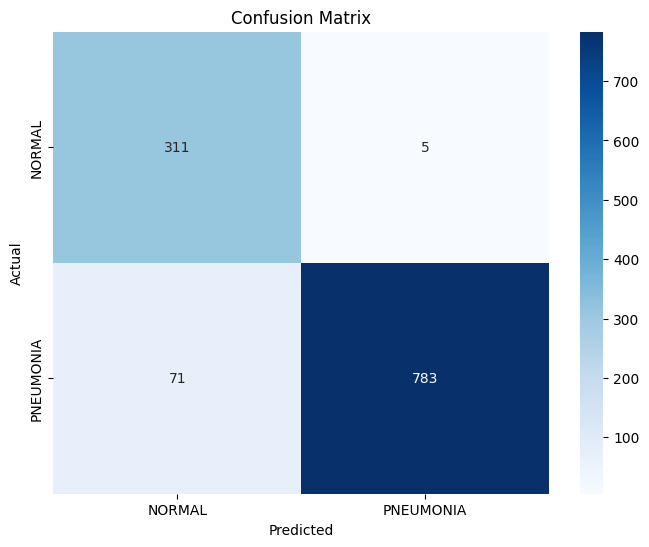

Threshold: 0.9
74/74 [==============================] - 3s 43ms/step - loss: 0.1743 - accuracy: 0.9504 - recall: 0.9415 - precision: 0.9901
Test Accuracy: 0.9504273533821106
Test Loss: 0.17430372536182404
Length predictions: 1170
Hand calculated accuracy: 0.9094
Accuracy: 0.9094017094017094
Precision: 0.9960212201591512
Recall: 0.8793911007025761


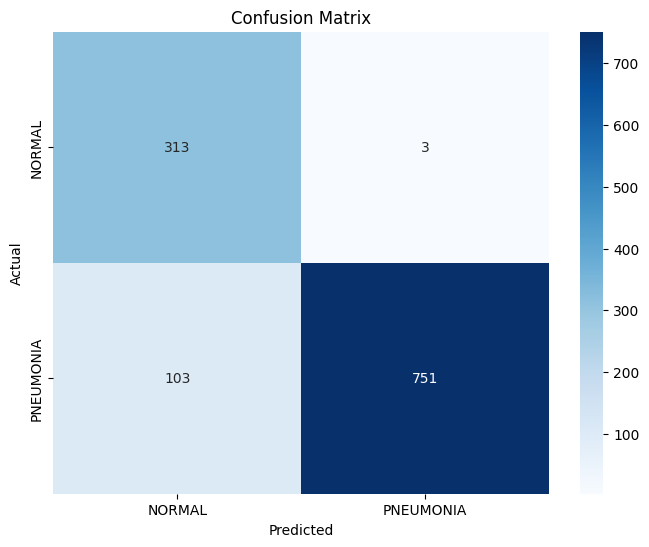

Threshold: 0.95
74/74 [==============================] - 3s 44ms/step - loss: 0.1743 - accuracy: 0.9504 - recall: 0.9415 - precision: 0.9901
Test Accuracy: 0.9504273533821106
Test Loss: 0.174302875995636
Length predictions: 1170
Hand calculated accuracy: 0.8872
Accuracy: 0.8871794871794871
Precision: 0.9986187845303868
Recall: 0.8466042154566745


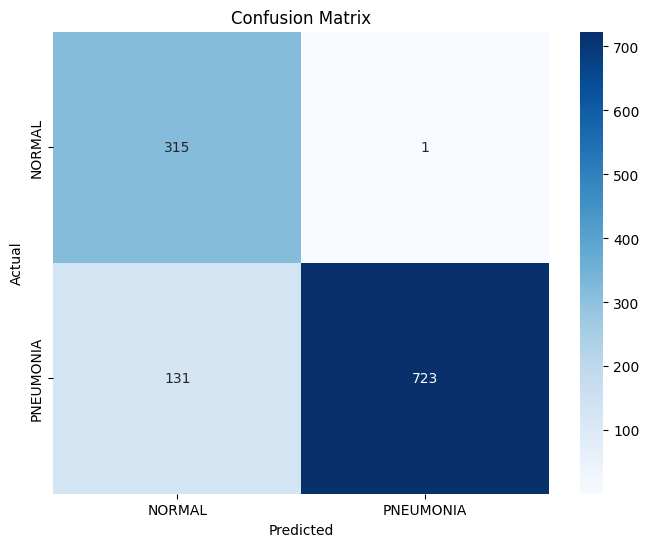

Threshold: 0.99
74/74 [==============================] - 3s 42ms/step - loss: 0.1743 - accuracy: 0.9504 - recall: 0.9415 - precision: 0.9901
Test Accuracy: 0.9504273533821106
Test Loss: 0.17430371046066284
Length predictions: 1170
Hand calculated accuracy: 0.8436
Accuracy: 0.8435897435897436
Precision: 1.0
Recall: 0.7857142857142857


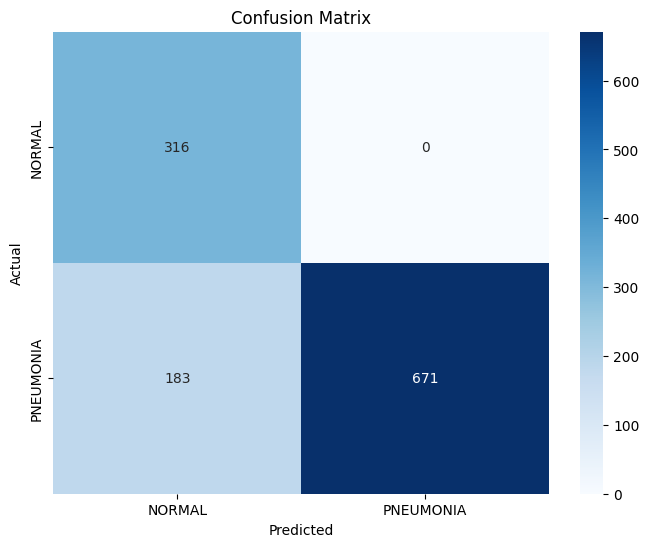

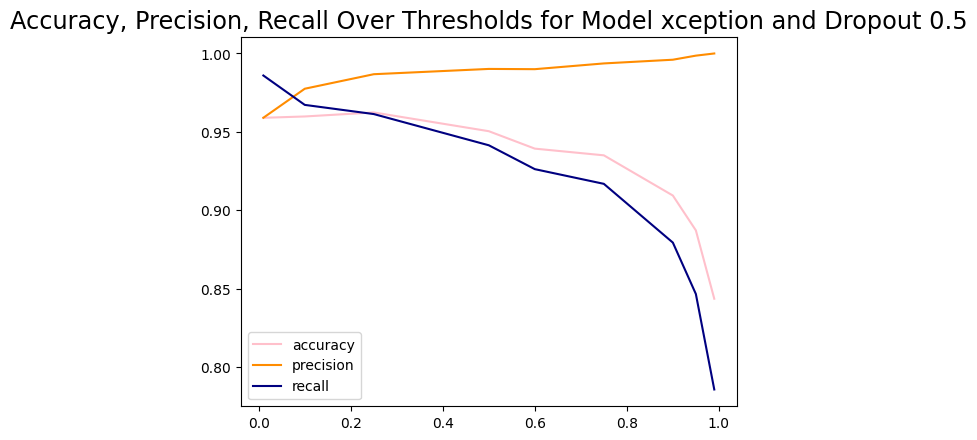



_______________


Model Name: xception
Dropout: 0.7
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 57s 213ms/step - loss: 0.1589 - accuracy: 0.9410 - recall: 0.9632 - precision: 0.9562 - val_loss: 0.1629 - val_accuracy: 0.9353 - val_recall: 0.9182 - val_precision: 0.9924
Epoch 2/4
257/257 [==============================] - 54s 211ms/step - loss: 0.0838 - accuracy: 0.9707 - recall: 0.9786 - precision: 0.9812 - val_loss: 0.1404 - val_accuracy: 0.9625 - val_recall: 0.9907 - val_precision: 0.9593
Epoch 3/4
257/257 [==============================] - 54s 212ms/step - loss: 0.0476 - accuracy: 0.9834 - recall: 0.9906 - precision: 0.9867 - val_loss: 0.0919 - val_accuracy: 0.9625 - val_recall: 0.9673 - val_precision: 0.9810
Epoch 4/4
257/257 [==============================] - 55s 212ms/step - loss: 0.0504 - accuracy: 0.9807 - recall: 0.9876 - precision: 0.9860 - val_l

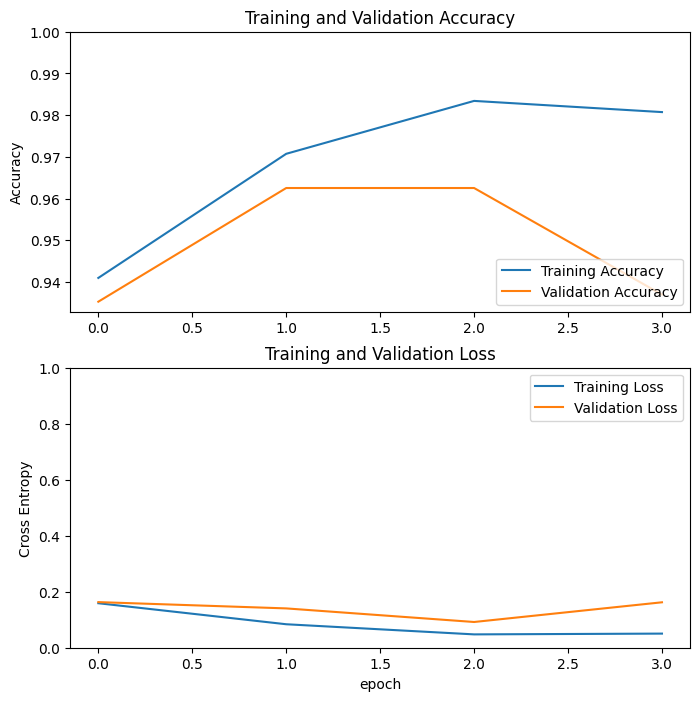

Threshold: 0.01
74/74 [==============================] - 3s 43ms/step - loss: 0.1355 - accuracy: 0.9436 - recall: 0.9415 - precision: 0.9805
Test Accuracy: 0.9435897469520569
Test Loss: 0.13553906977176666
Length predictions: 1170
Hand calculated accuracy: 0.7812
Accuracy: 0.7811965811965812
Precision: 0.7693693693693694
Recall: 1.0


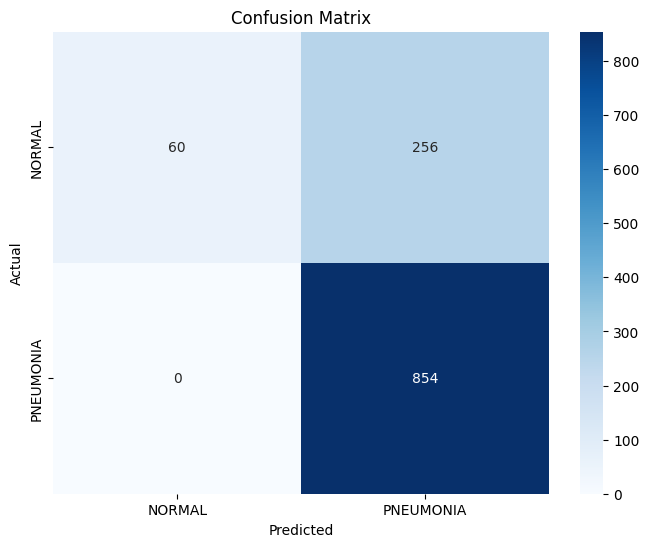

Threshold: 0.1
74/74 [==============================] - 3s 43ms/step - loss: 0.1355 - accuracy: 0.9436 - recall: 0.9415 - precision: 0.9805
Test Accuracy: 0.9435897469520569
Test Loss: 0.13553908467292786
Length predictions: 1170
Hand calculated accuracy: 0.935
Accuracy: 0.935042735042735
Precision: 0.9200863930885529
Recall: 0.9976580796252927


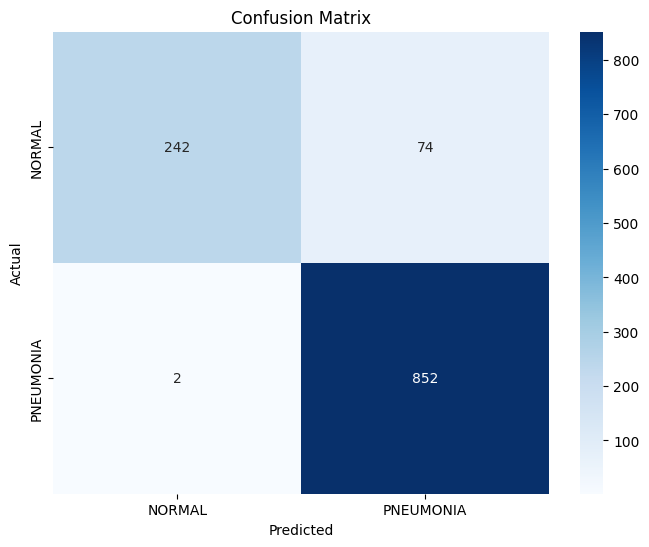

Threshold: 0.25
74/74 [==============================] - 3s 43ms/step - loss: 0.1355 - accuracy: 0.9436 - recall: 0.9415 - precision: 0.9805
Test Accuracy: 0.9435897469520569
Test Loss: 0.13553908467292786
Length predictions: 1170
Hand calculated accuracy: 0.9607
Accuracy: 0.9606837606837607
Precision: 0.9559819413092551
Recall: 0.9918032786885246


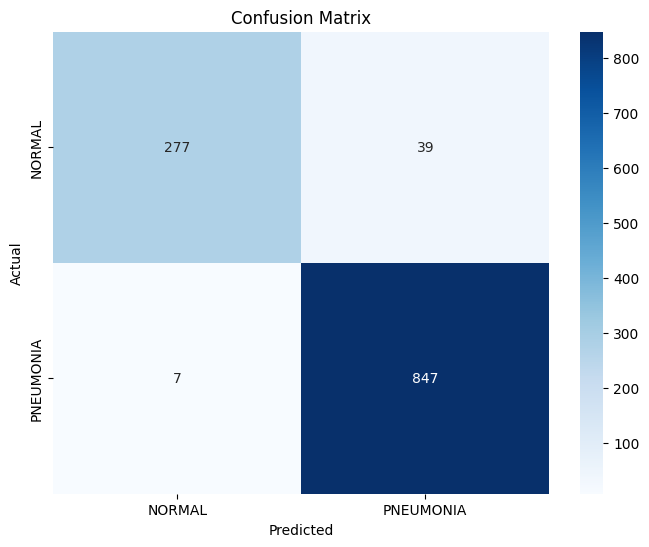

Threshold: 0.5
74/74 [==============================] - 3s 43ms/step - loss: 0.1355 - accuracy: 0.9436 - recall: 0.9415 - precision: 0.9805
Test Accuracy: 0.9435897469520569
Test Loss: 0.13553906977176666
Length predictions: 1170
Hand calculated accuracy: 0.9436
Accuracy: 0.9435897435897436
Precision: 0.9804878048780488
Recall: 0.9414519906323185


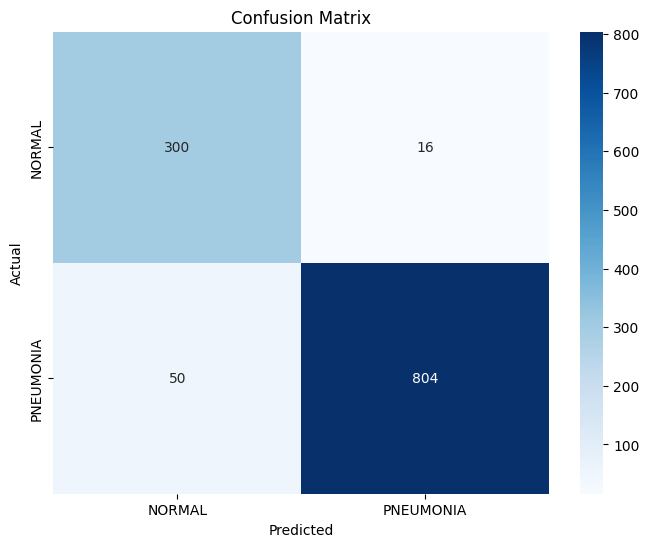

Threshold: 0.6
74/74 [==============================] - 3s 43ms/step - loss: 0.1355 - accuracy: 0.9436 - recall: 0.9415 - precision: 0.9805
Test Accuracy: 0.9435897469520569
Test Loss: 0.13553909957408905
Length predictions: 1170
Hand calculated accuracy: 0.9299
Accuracy: 0.9299145299145299
Precision: 0.9825
Recall: 0.9203747072599532


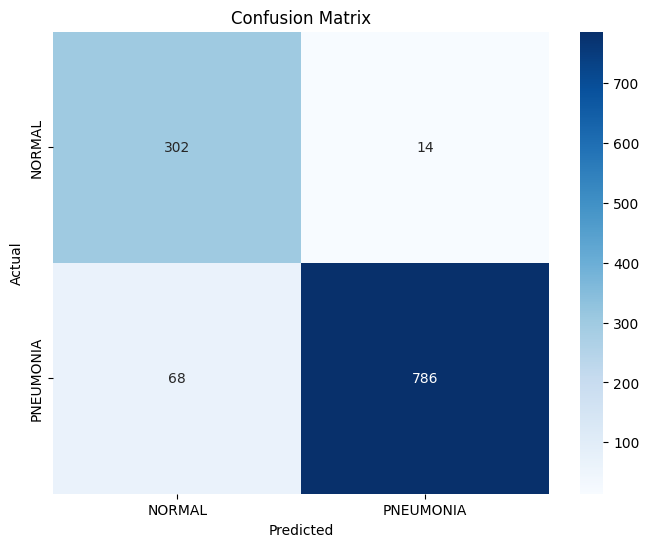

Threshold: 0.75
74/74 [==============================] - 3s 44ms/step - loss: 0.1355 - accuracy: 0.9436 - recall: 0.9415 - precision: 0.9805
Test Accuracy: 0.9435897469520569
Test Loss: 0.1355389952659607
Length predictions: 1170
Hand calculated accuracy: 0.9205
Accuracy: 0.9205128205128205
Precision: 0.9847133757961783
Recall: 0.905152224824356


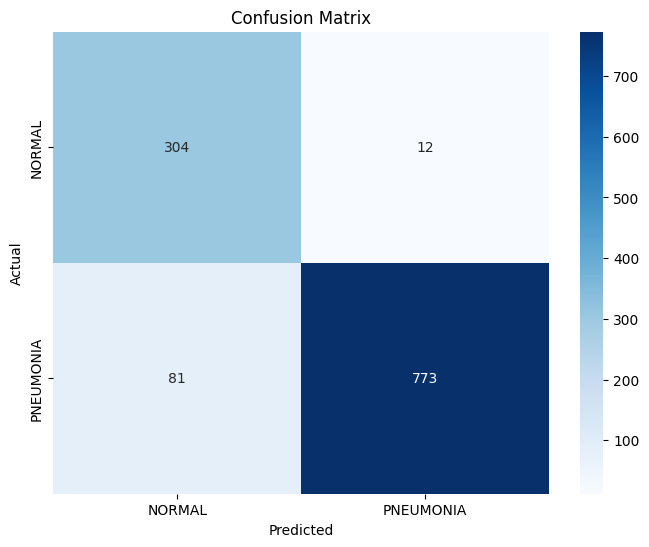

Threshold: 0.9
74/74 [==============================] - 3s 43ms/step - loss: 0.1355 - accuracy: 0.9436 - recall: 0.9415 - precision: 0.9805
Test Accuracy: 0.9435897469520569
Test Loss: 0.13553912937641144
Length predictions: 1170
Hand calculated accuracy: 0.8923
Accuracy: 0.8923076923076924
Precision: 0.9905660377358491
Recall: 0.860655737704918


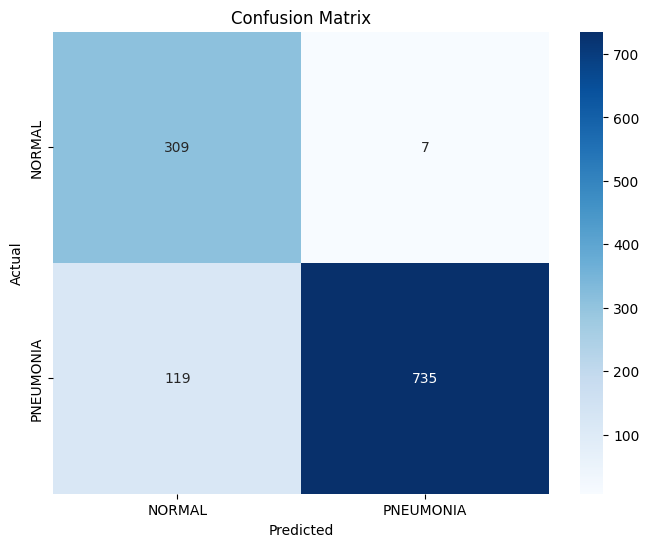

Threshold: 0.95
74/74 [==============================] - 3s 44ms/step - loss: 0.1355 - accuracy: 0.9436 - recall: 0.9415 - precision: 0.9805
Test Accuracy: 0.9435897469520569
Test Loss: 0.13553909957408905
Length predictions: 1170
Hand calculated accuracy: 0.8692
Accuracy: 0.8692307692307693
Precision: 0.9929676511954993
Recall: 0.8266978922716628


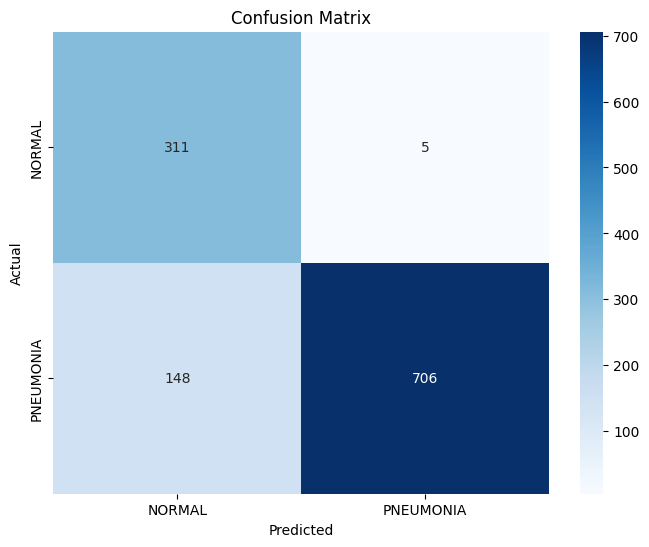

Threshold: 0.99
74/74 [==============================] - 3s 44ms/step - loss: 0.1355 - accuracy: 0.9436 - recall: 0.9415 - precision: 0.9805
Test Accuracy: 0.9435897469520569
Test Loss: 0.13553906977176666
Length predictions: 1170
Hand calculated accuracy: 0.8128
Accuracy: 0.8128205128205128
Precision: 0.9953198127925117
Recall: 0.747072599531616


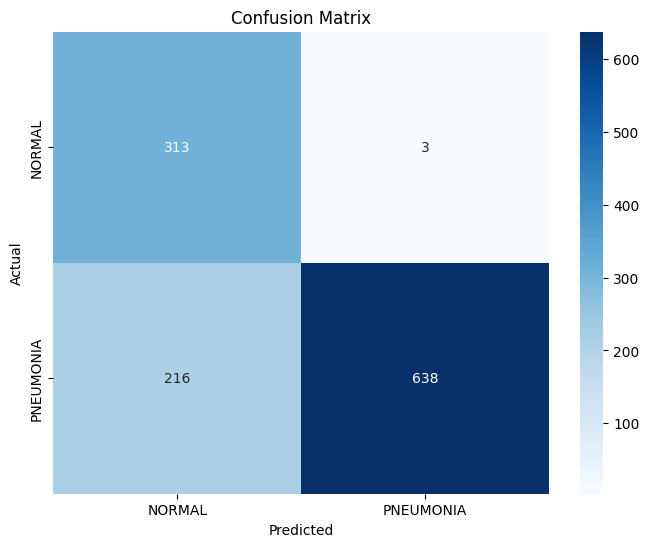

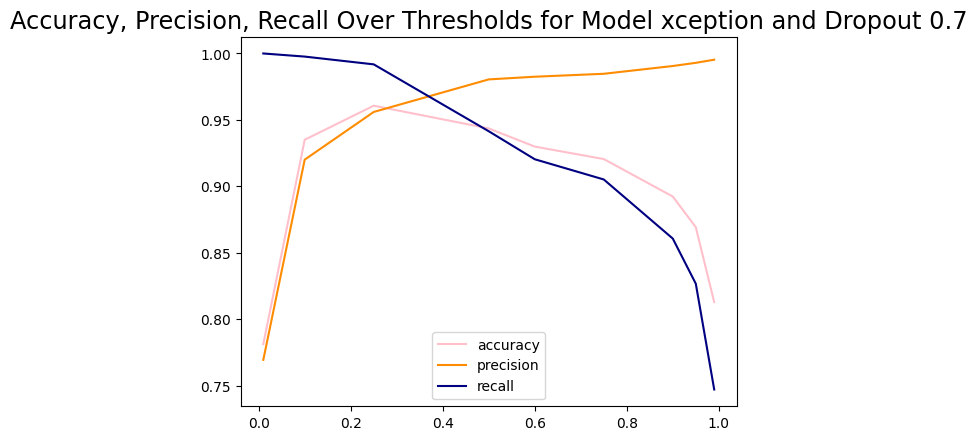



_______________


Model Name: xception
Dropout: 0
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 56s 210ms/step - loss: 0.1583 - accuracy: 0.9385 - recall: 0.9609 - precision: 0.9551 - val_loss: 0.1206 - val_accuracy: 0.9574 - val_recall: 0.9907 - val_precision: 0.9528
Epoch 2/4
257/257 [==============================] - 54s 210ms/step - loss: 0.0672 - accuracy: 0.9751 - recall: 0.9819 - precision: 0.9839 - val_loss: 0.1986 - val_accuracy: 0.9421 - val_recall: 0.9953 - val_precision: 0.9301
Epoch 3/4
257/257 [==============================] - 54s 209ms/step - loss: 0.0485 - accuracy: 0.9812 - recall: 0.9883 - precision: 0.9860 - val_loss: 0.1452 - val_accuracy: 0.9710 - val_recall: 0.9883 - val_precision: 0.9724
Epoch 4/4
257/257 [==============================] - 54s 211ms/step - loss: 0.0252 - accuracy: 0.9912 - recall: 0.9933 - precision: 0.9946 - val_los

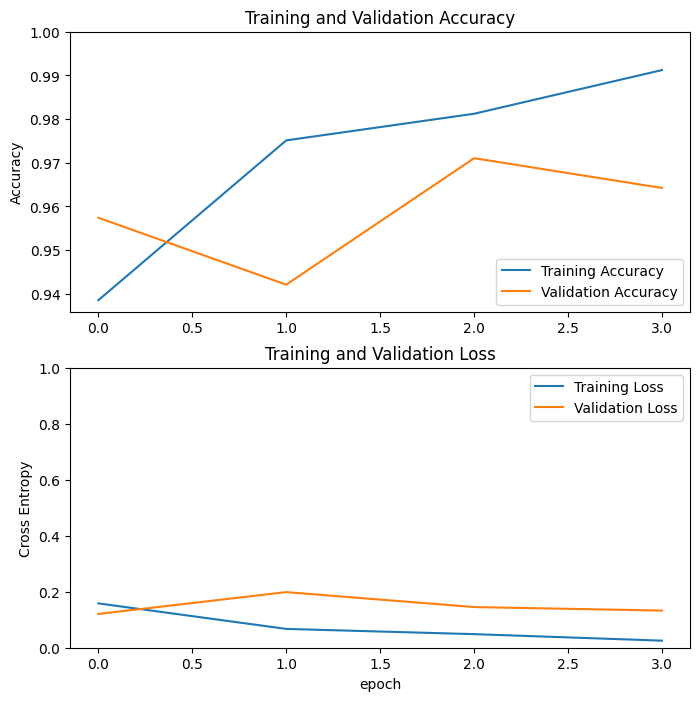

Threshold: 0.01
74/74 [==============================] - 3s 43ms/step - loss: 0.1273 - accuracy: 0.9624 - recall: 0.9836 - precision: 0.9655
Test Accuracy: 0.9623931646347046
Test Loss: 0.1272953301668167
Length predictions: 1170
Hand calculated accuracy: 0.9368
Accuracy: 0.9367521367521368
Precision: 0.925764192139738
Recall: 0.9929742388758782


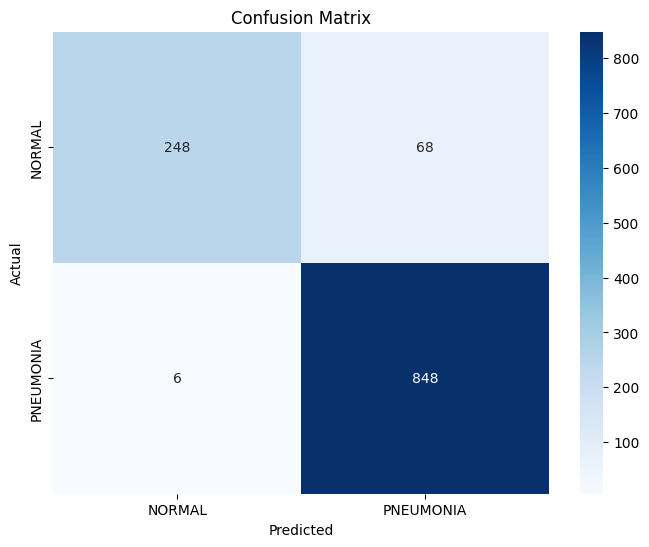

Threshold: 0.1
74/74 [==============================] - 3s 46ms/step - loss: 0.1273 - accuracy: 0.9624 - recall: 0.9836 - precision: 0.9655
Test Accuracy: 0.9623931646347046
Test Loss: 0.12729531526565552
Length predictions: 1170
Hand calculated accuracy: 0.959
Accuracy: 0.958974358974359
Precision: 0.9538288288288288
Recall: 0.9918032786885246


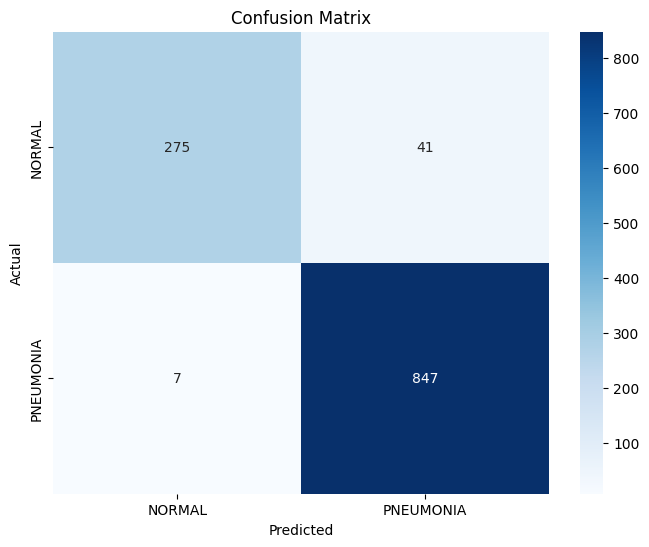

Threshold: 0.25
74/74 [==============================] - 3s 42ms/step - loss: 0.1273 - accuracy: 0.9624 - recall: 0.9836 - precision: 0.9655
Test Accuracy: 0.9623931646347046
Test Loss: 0.1272953450679779
Length predictions: 1170
Hand calculated accuracy: 0.9598
Accuracy: 0.9598290598290599
Precision: 0.9590443686006825
Recall: 0.9871194379391101


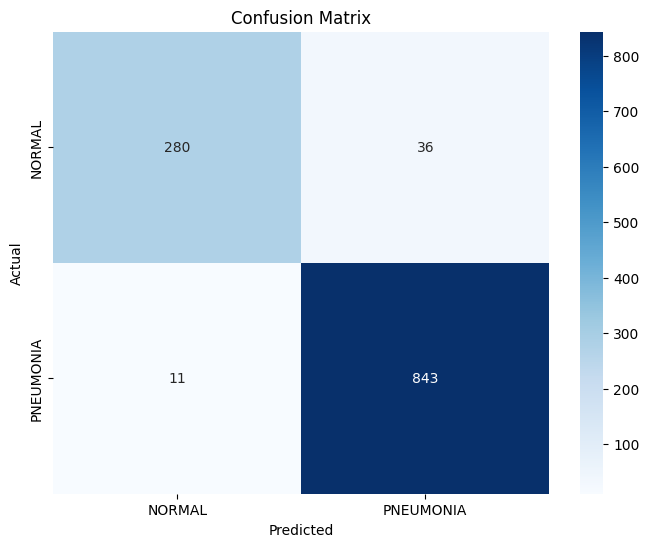

Threshold: 0.5
74/74 [==============================] - 3s 42ms/step - loss: 0.1273 - accuracy: 0.9624 - recall: 0.9836 - precision: 0.9655
Test Accuracy: 0.9623931646347046
Test Loss: 0.12729527056217194
Length predictions: 1170
Hand calculated accuracy: 0.9624
Accuracy: 0.9623931623931624
Precision: 0.9655172413793104
Recall: 0.9836065573770492


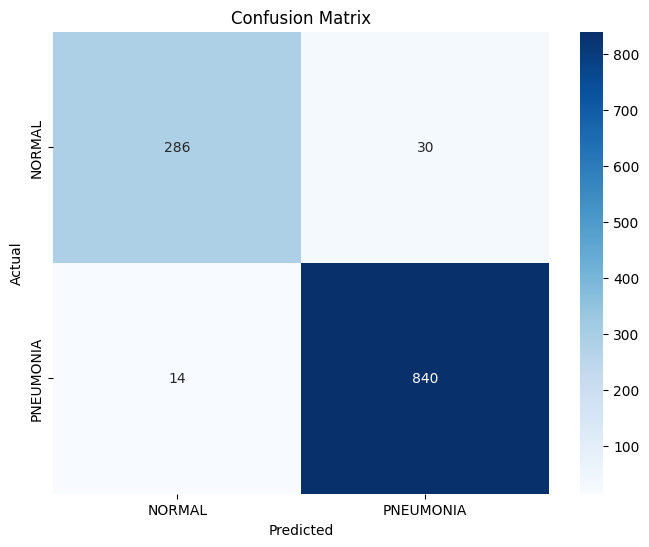

Threshold: 0.6
74/74 [==============================] - 3s 43ms/step - loss: 0.1273 - accuracy: 0.9624 - recall: 0.9836 - precision: 0.9655
Test Accuracy: 0.9623931646347046
Test Loss: 0.1272953897714615
Length predictions: 1170
Hand calculated accuracy: 0.9632
Accuracy: 0.9632478632478633
Precision: 0.9698725376593279
Recall: 0.9800936768149883


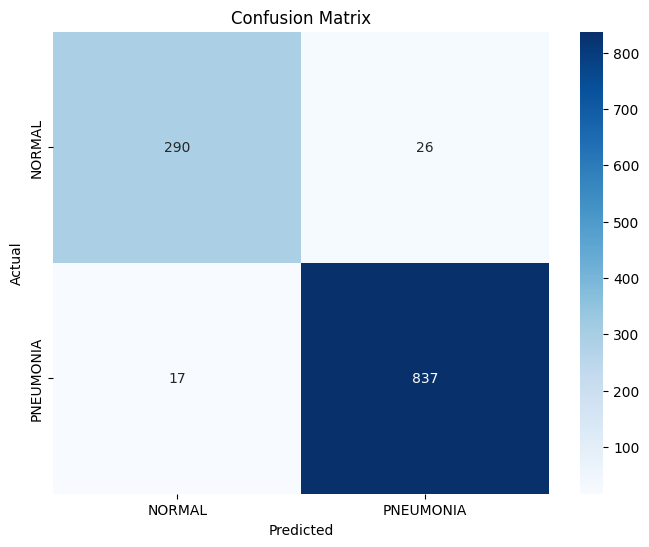

Threshold: 0.75
74/74 [==============================] - 3s 43ms/step - loss: 0.1273 - accuracy: 0.9624 - recall: 0.9836 - precision: 0.9655
Test Accuracy: 0.9623931646347046
Test Loss: 0.12729531526565552
Length predictions: 1170
Hand calculated accuracy: 0.9598
Accuracy: 0.9598290598290599
Precision: 0.9730363423212193
Recall: 0.9718969555035128


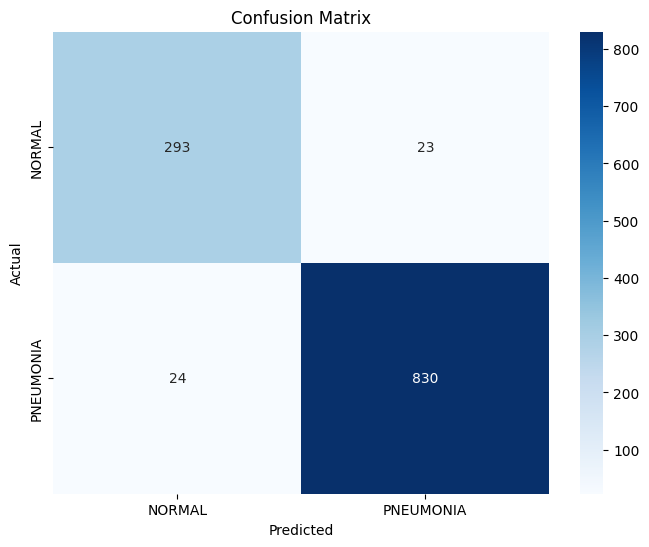

Threshold: 0.9
74/74 [==============================] - 3s 43ms/step - loss: 0.1273 - accuracy: 0.9624 - recall: 0.9836 - precision: 0.9655
Test Accuracy: 0.9623931646347046
Test Loss: 0.1272953301668167
Length predictions: 1170
Hand calculated accuracy: 0.9615
Accuracy: 0.9615384615384616
Precision: 0.9809750297265161
Recall: 0.9660421545667447


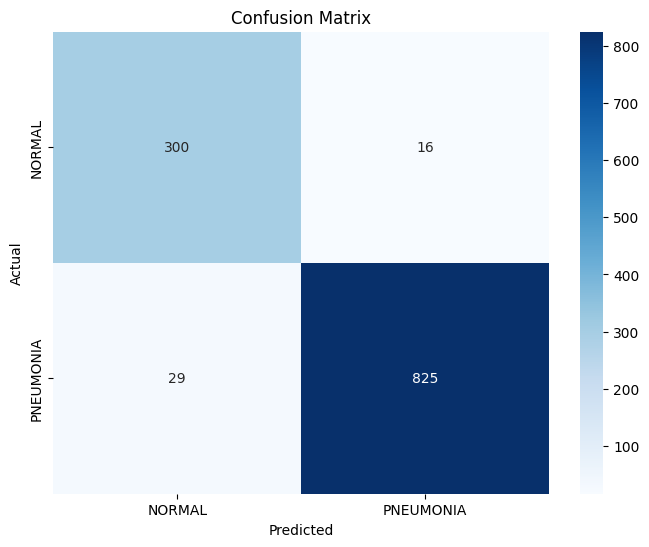

Threshold: 0.95
74/74 [==============================] - 3s 43ms/step - loss: 0.1273 - accuracy: 0.9624 - recall: 0.9836 - precision: 0.9655
Test Accuracy: 0.9623931646347046
Test Loss: 0.12729530036449432
Length predictions: 1170
Hand calculated accuracy: 0.9504
Accuracy: 0.9504273504273504
Precision: 0.9841849148418491
Recall: 0.9473067915690867


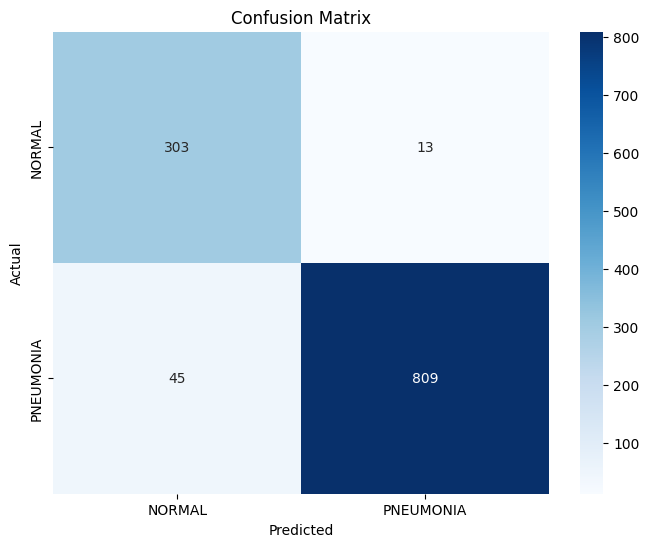

Threshold: 0.99
74/74 [==============================] - 3s 43ms/step - loss: 0.1273 - accuracy: 0.9624 - recall: 0.9836 - precision: 0.9655
Test Accuracy: 0.9623931646347046
Test Loss: 0.1272953450679779
Length predictions: 1170
Hand calculated accuracy: 0.9248
Accuracy: 0.9247863247863248
Precision: 0.9910256410256411
Recall: 0.905152224824356


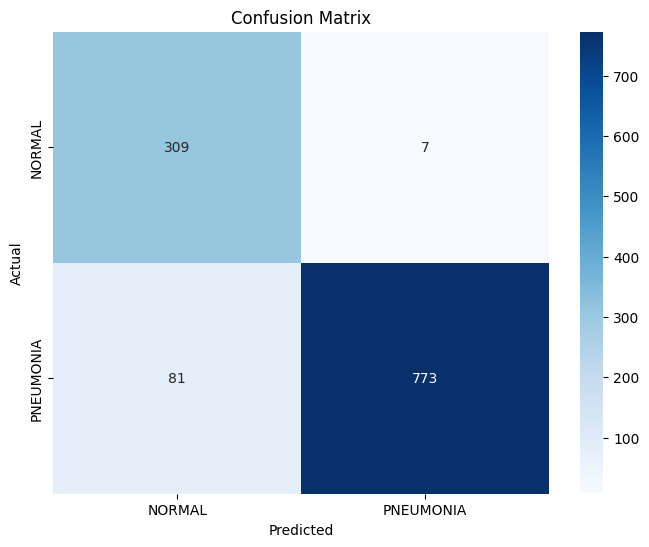

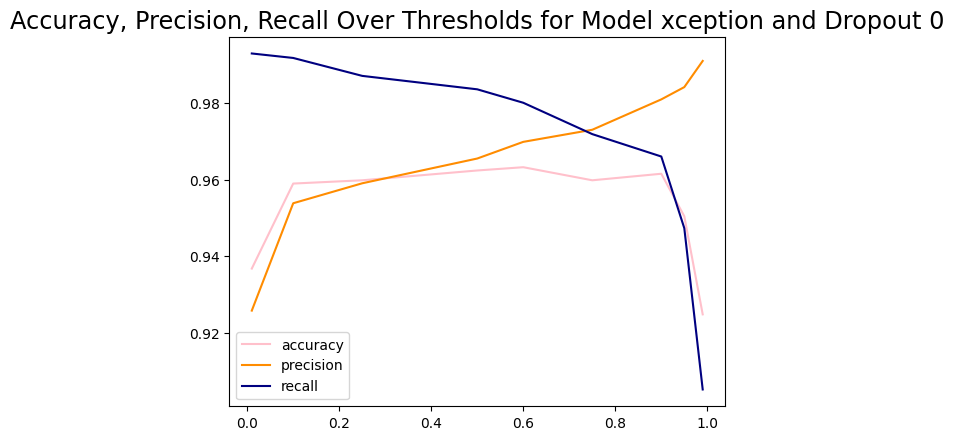



_______________


Model Name: xception
Dropout: 0.2
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 59s 221ms/step - loss: 0.1582 - accuracy: 0.9402 - recall: 0.9669 - precision: 0.9519 - val_loss: 0.0957 - val_accuracy: 0.9659 - val_recall: 0.9907 - val_precision: 0.9636
Epoch 2/4
257/257 [==============================] - 55s 215ms/step - loss: 0.0629 - accuracy: 0.9798 - recall: 0.9873 - precision: 0.9850 - val_loss: 0.1055 - val_accuracy: 0.9625 - val_recall: 0.9883 - val_precision: 0.9614
Epoch 3/4
257/257 [==============================] - 54s 211ms/step - loss: 0.0446 - accuracy: 0.9851 - recall: 0.9900 - precision: 0.9896 - val_loss: 0.0991 - val_accuracy: 0.9710 - val_recall: 0.9860 - val_precision: 0.9746
Epoch 4/4
257/257 [==============================] - 55s 213ms/step - loss: 0.0418 - accuracy: 0.9861 - recall: 0.9906 - precision: 0.9903 - val_l

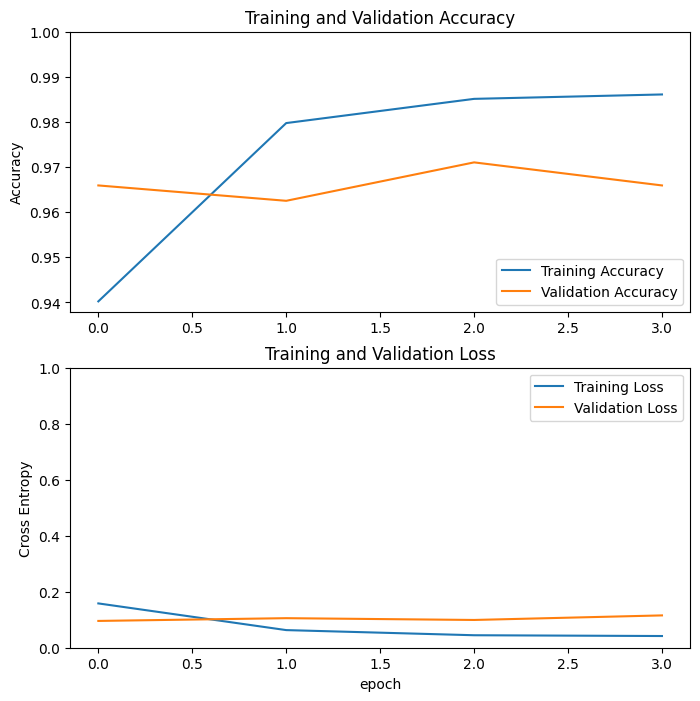

Threshold: 0.01
74/74 [==============================] - 3s 43ms/step - loss: 0.1159 - accuracy: 0.9615 - recall: 0.9906 - precision: 0.9581
Test Accuracy: 0.9615384340286255
Test Loss: 0.11594121158123016
Length predictions: 1170
Hand calculated accuracy: 0.8624
Accuracy: 0.8623931623931624
Precision: 0.8413793103448276
Recall: 1.0


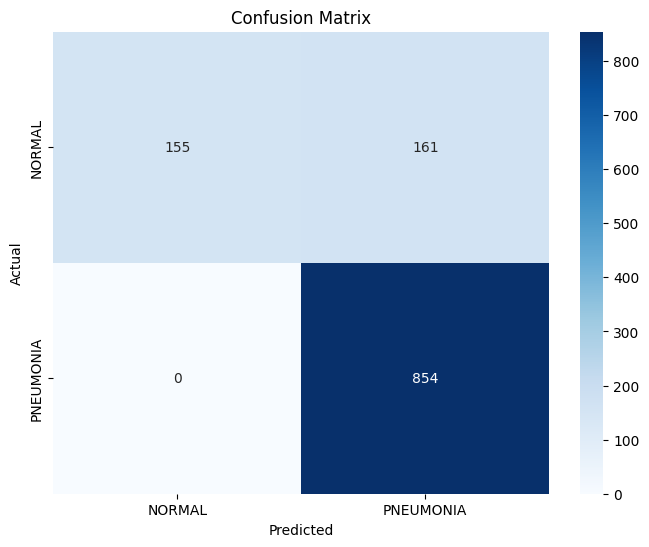

Threshold: 0.1
74/74 [==============================] - 3s 42ms/step - loss: 0.1159 - accuracy: 0.9615 - recall: 0.9906 - precision: 0.9581
Test Accuracy: 0.9615384340286255
Test Loss: 0.11594121158123016
Length predictions: 1170
Hand calculated accuracy: 0.9239
Accuracy: 0.923931623931624
Precision: 0.9056203605514316
Recall: 1.0


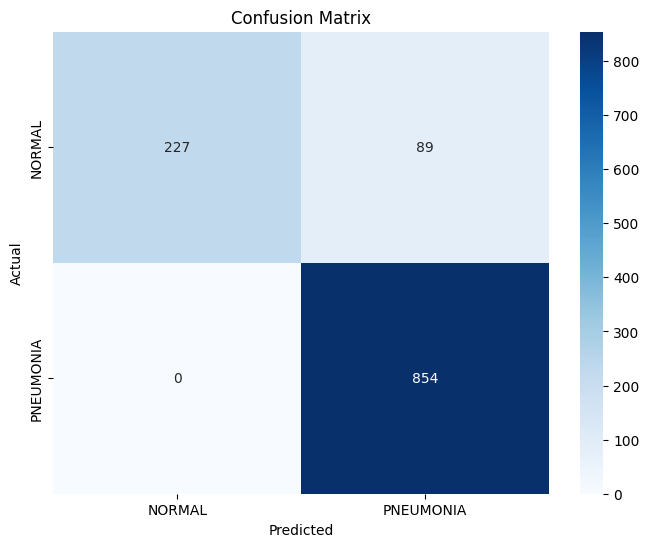

Threshold: 0.25
74/74 [==============================] - 3s 43ms/step - loss: 0.1159 - accuracy: 0.9615 - recall: 0.9906 - precision: 0.9581
Test Accuracy: 0.9615384340286255
Test Loss: 0.11594119668006897
Length predictions: 1170
Hand calculated accuracy: 0.9487
Accuracy: 0.9487179487179487
Precision: 0.9362637362637363
Recall: 0.9976580796252927


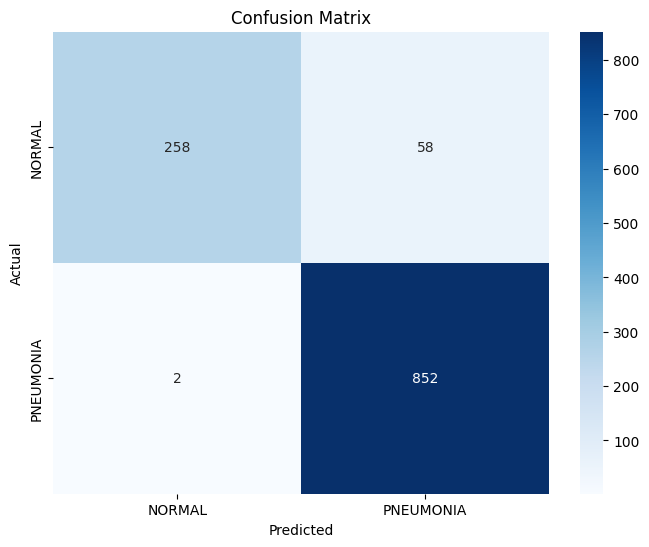

Threshold: 0.5
74/74 [==============================] - 3s 42ms/step - loss: 0.1159 - accuracy: 0.9615 - recall: 0.9906 - precision: 0.9581
Test Accuracy: 0.9615384340286255
Test Loss: 0.11594299226999283
Length predictions: 1170
Hand calculated accuracy: 0.9615
Accuracy: 0.9615384615384616
Precision: 0.9580973952434881
Recall: 0.990632318501171


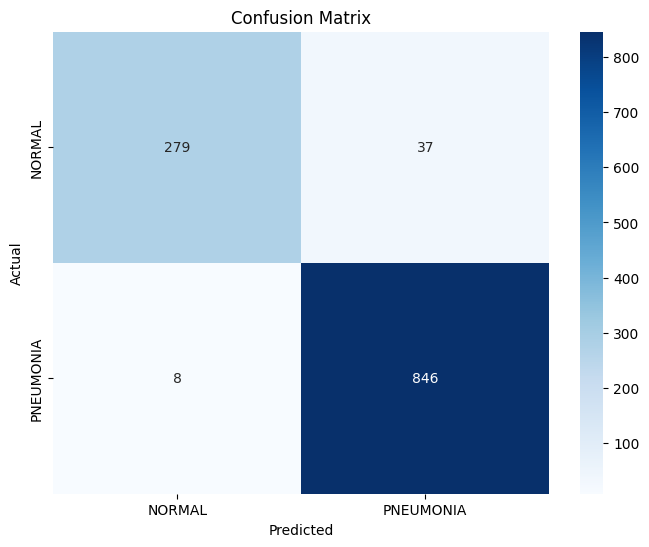

Threshold: 0.6
74/74 [==============================] - 3s 43ms/step - loss: 0.1159 - accuracy: 0.9615 - recall: 0.9906 - precision: 0.9581
Test Accuracy: 0.9615384340286255
Test Loss: 0.11594116687774658
Length predictions: 1170
Hand calculated accuracy: 0.9667
Accuracy: 0.9666666666666667
Precision: 0.9657142857142857
Recall: 0.9894613583138173


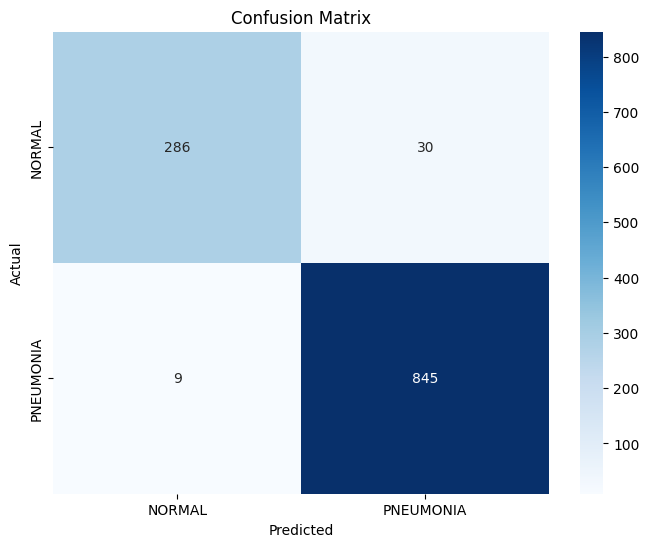

Threshold: 0.75
74/74 [==============================] - 3s 42ms/step - loss: 0.1159 - accuracy: 0.9615 - recall: 0.9906 - precision: 0.9581
Test Accuracy: 0.9615384340286255
Test Loss: 0.11594121903181076
Length predictions: 1170
Hand calculated accuracy: 0.9684
Accuracy: 0.9683760683760684
Precision: 0.9690011481056258
Recall: 0.9882903981264637


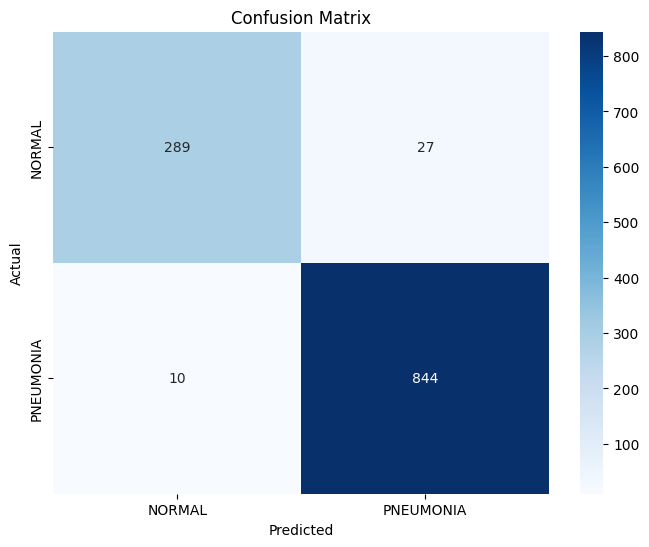

Threshold: 0.9
74/74 [==============================] - 3s 42ms/step - loss: 0.1159 - accuracy: 0.9615 - recall: 0.9906 - precision: 0.9581
Test Accuracy: 0.9615384340286255
Test Loss: 0.11594115942716599
Length predictions: 1170
Hand calculated accuracy: 0.9735
Accuracy: 0.9735042735042735
Precision: 0.9768250289687138
Recall: 0.9871194379391101


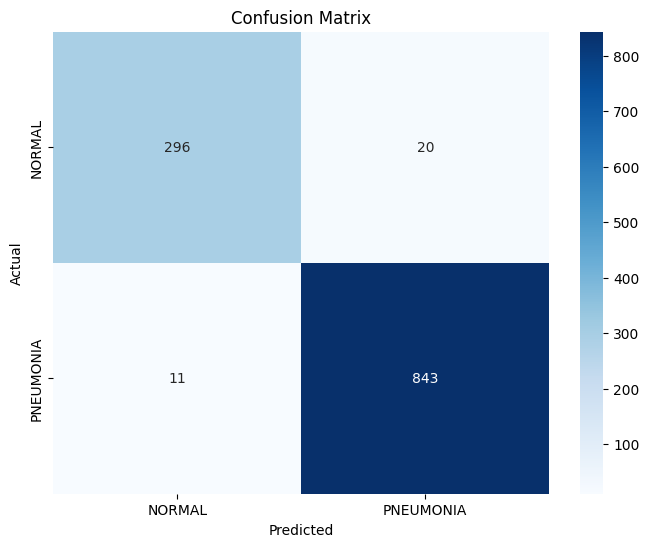

Threshold: 0.95
74/74 [==============================] - 3s 43ms/step - loss: 0.1159 - accuracy: 0.9615 - recall: 0.9906 - precision: 0.9581
Test Accuracy: 0.9615384340286255
Test Loss: 0.11594118177890778
Length predictions: 1170
Hand calculated accuracy: 0.9709
Accuracy: 0.9709401709401709
Precision: 0.9834905660377359
Recall: 0.9765807962529274


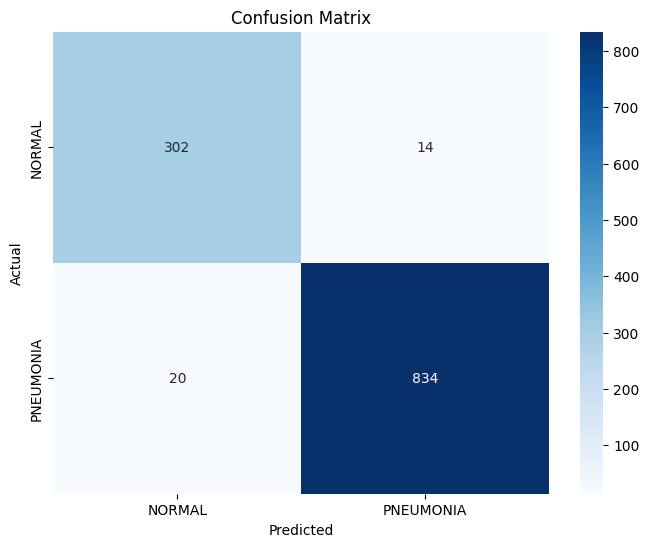

Threshold: 0.99
74/74 [==============================] - 3s 42ms/step - loss: 0.1159 - accuracy: 0.9615 - recall: 0.9906 - precision: 0.9581
Test Accuracy: 0.9615384340286255
Test Loss: 0.11594140529632568
Length predictions: 1170
Hand calculated accuracy: 0.9521
Accuracy: 0.9521367521367521
Precision: 0.9913793103448276
Recall: 0.9426229508196722


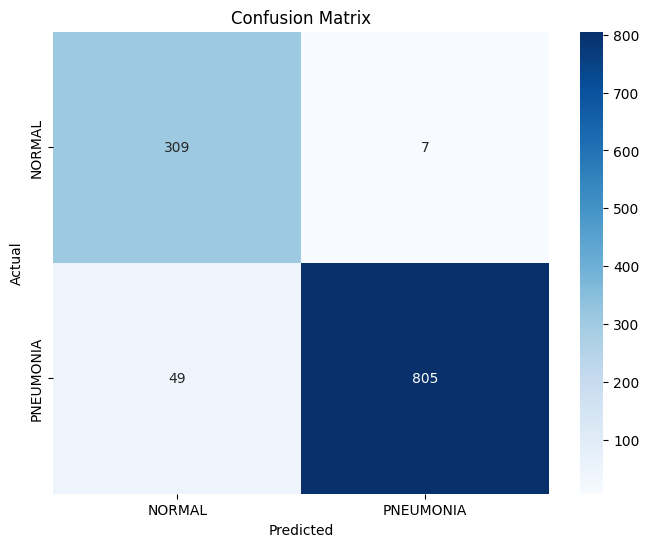

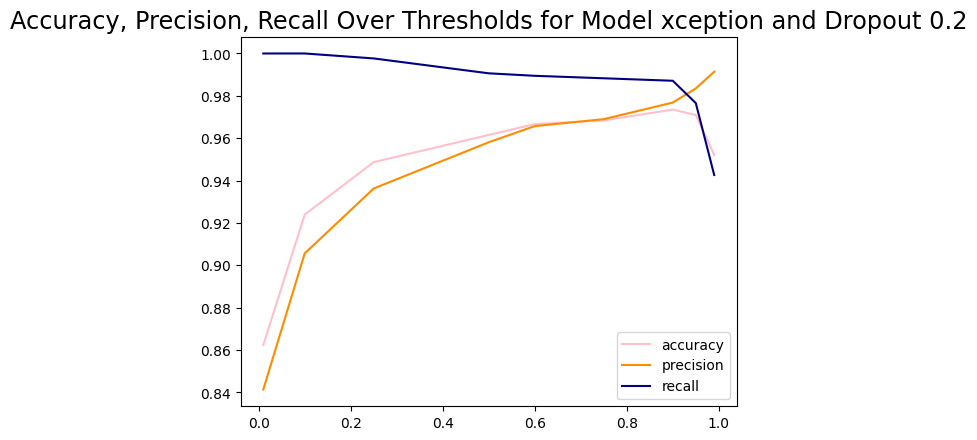



_______________


Model Name: xception
Dropout: 0.5
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 57s 215ms/step - loss: 0.1477 - accuracy: 0.9419 - recall: 0.9656 - precision: 0.9553 - val_loss: 0.1240 - val_accuracy: 0.9574 - val_recall: 0.9533 - val_precision: 0.9879
Epoch 2/4
257/257 [==============================] - 57s 221ms/step - loss: 0.0741 - accuracy: 0.9715 - recall: 0.9813 - precision: 0.9796 - val_loss: 0.0936 - val_accuracy: 0.9659 - val_recall: 0.9907 - val_precision: 0.9636
Epoch 3/4
257/257 [==============================] - 58s 224ms/step - loss: 0.0714 - accuracy: 0.9754 - recall: 0.9846 - precision: 0.9817 - val_loss: 0.1092 - val_accuracy: 0.9676 - val_recall: 0.9650 - val_precision: 0.9904
Epoch 4/4
257/257 [==============================] - 57s 222ms/step - loss: 0.0482 - accuracy: 0.9817 - recall: 0.9886 - precision: 0.9863 - val_l

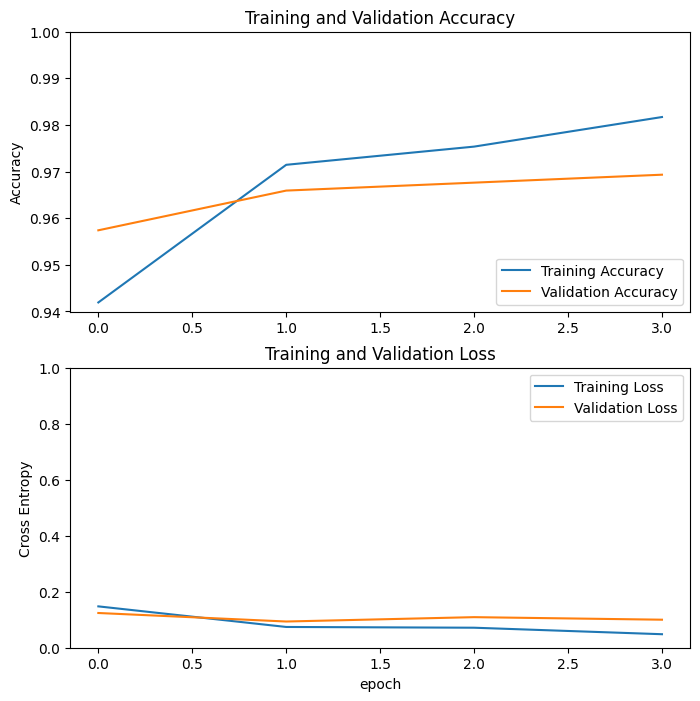

Threshold: 0.01
74/74 [==============================] - 3s 43ms/step - loss: 0.0853 - accuracy: 0.9769 - recall: 0.9778 - precision: 0.9905
Test Accuracy: 0.9769230484962463
Test Loss: 0.08531804382801056
Length predictions: 1170
Hand calculated accuracy: 0.9615
Accuracy: 0.9615384615384616
Precision: 0.9529675251959686
Recall: 0.9964871194379391


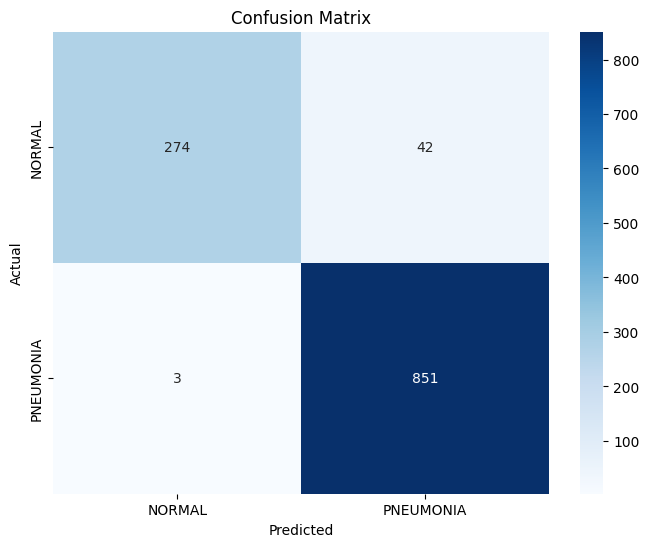

Threshold: 0.1
74/74 [==============================] - 3s 42ms/step - loss: 0.0853 - accuracy: 0.9769 - recall: 0.9778 - precision: 0.9905
Test Accuracy: 0.9769230484962463
Test Loss: 0.08531788736581802
Length predictions: 1170
Hand calculated accuracy: 0.9786
Accuracy: 0.9786324786324786
Precision: 0.9803012746234068
Recall: 0.990632318501171


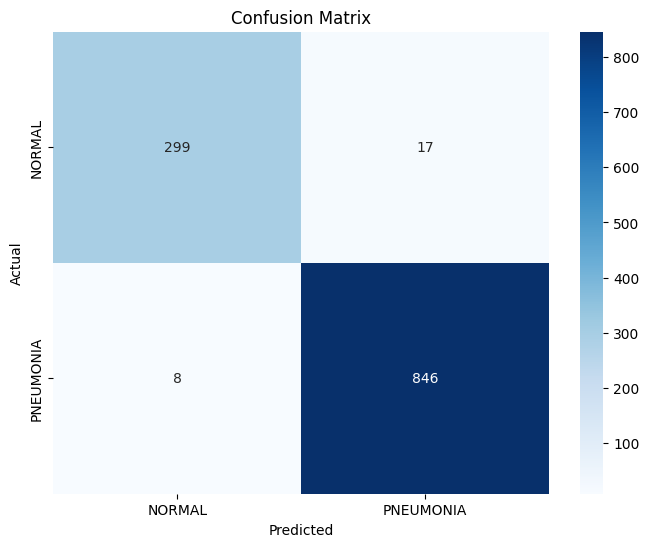

Threshold: 0.25
74/74 [==============================] - 3s 42ms/step - loss: 0.0853 - accuracy: 0.9769 - recall: 0.9778 - precision: 0.9905
Test Accuracy: 0.9769230484962463
Test Loss: 0.08531802892684937
Length predictions: 1170
Hand calculated accuracy: 0.9795
Accuracy: 0.9794871794871794
Precision: 0.9859484777517564
Recall: 0.9859484777517564


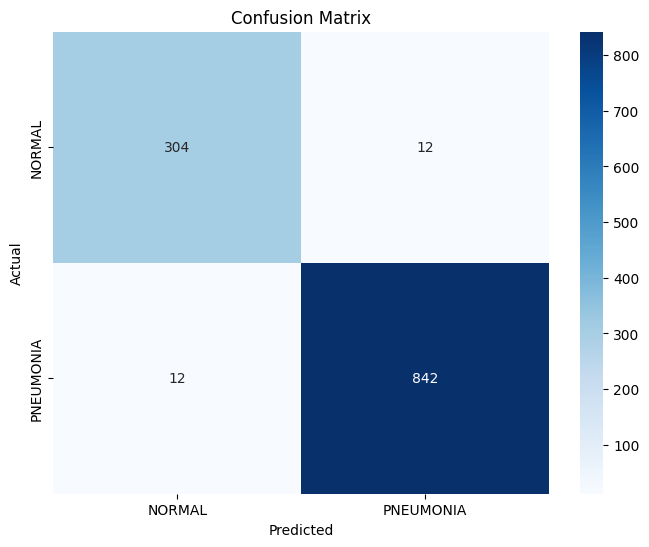

Threshold: 0.5
74/74 [==============================] - 3s 42ms/step - loss: 0.0853 - accuracy: 0.9769 - recall: 0.9778 - precision: 0.9905
Test Accuracy: 0.9769230484962463
Test Loss: 0.08531802892684937
Length predictions: 1170
Hand calculated accuracy: 0.9769
Accuracy: 0.9769230769230769
Precision: 0.9905100830367735
Recall: 0.977751756440281


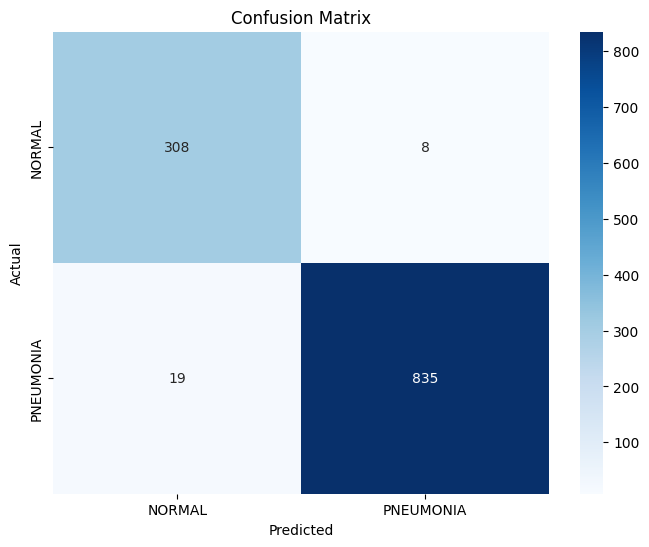

Threshold: 0.6
74/74 [==============================] - 3s 44ms/step - loss: 0.0853 - accuracy: 0.9769 - recall: 0.9778 - precision: 0.9905
Test Accuracy: 0.9769230484962463
Test Loss: 0.08531802892684937
Length predictions: 1170
Hand calculated accuracy: 0.9769
Accuracy: 0.9769230769230769
Precision: 0.9905100830367735
Recall: 0.977751756440281


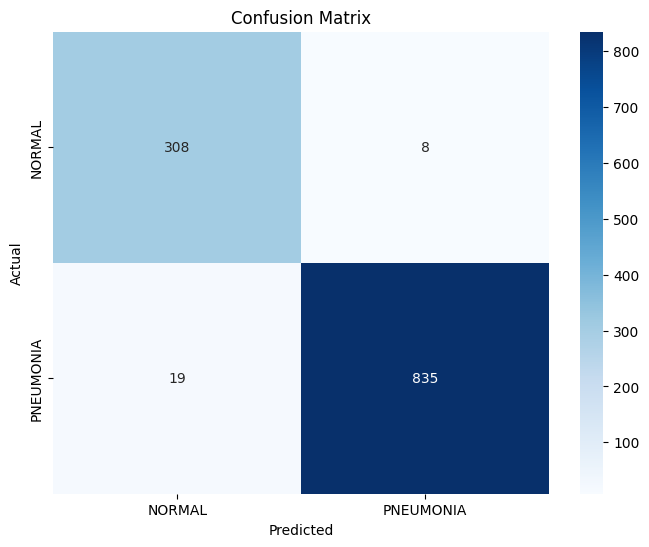

Threshold: 0.75
74/74 [==============================] - 3s 42ms/step - loss: 0.0853 - accuracy: 0.9769 - recall: 0.9778 - precision: 0.9905
Test Accuracy: 0.9769230484962463
Test Loss: 0.08531803637742996
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9927272727272727
Recall: 0.9590163934426229


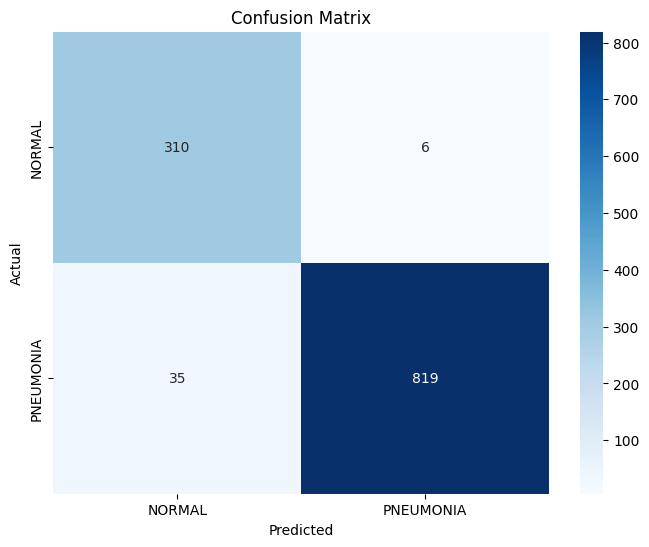

Threshold: 0.9
74/74 [==============================] - 3s 42ms/step - loss: 0.0853 - accuracy: 0.9769 - recall: 0.9778 - precision: 0.9905
Test Accuracy: 0.9769230484962463
Test Loss: 0.08531801402568817
Length predictions: 1170
Hand calculated accuracy: 0.9427
Accuracy: 0.9427350427350427
Precision: 0.9924906132665833
Recall: 0.9285714285714286


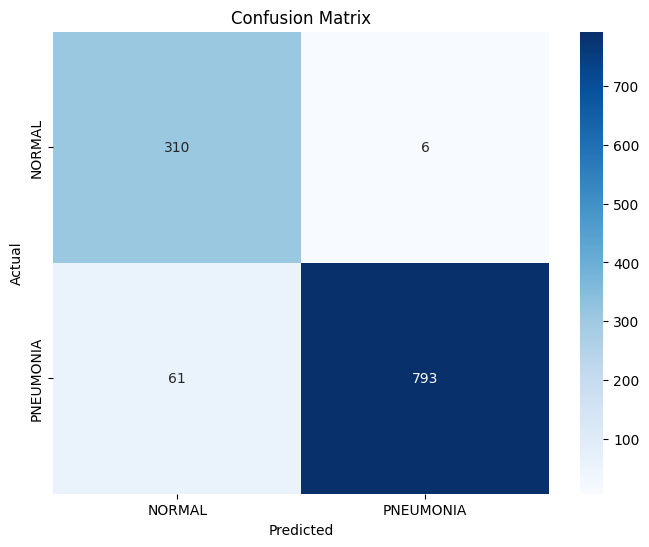

Threshold: 0.95
74/74 [==============================] - 3s 43ms/step - loss: 0.0853 - accuracy: 0.9769 - recall: 0.9778 - precision: 0.9905
Test Accuracy: 0.9769230484962463
Test Loss: 0.08531802892684937
Length predictions: 1170
Hand calculated accuracy: 0.9333
Accuracy: 0.9333333333333333
Precision: 0.9948979591836735
Recall: 0.9133489461358314


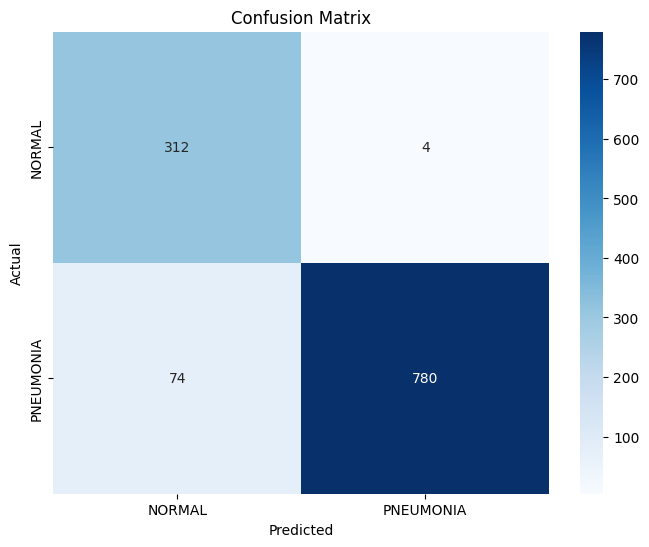

Threshold: 0.99
74/74 [==============================] - 3s 42ms/step - loss: 0.0853 - accuracy: 0.9769 - recall: 0.9778 - precision: 0.9905
Test Accuracy: 0.9769230484962463
Test Loss: 0.08531803637742996
Length predictions: 1170
Hand calculated accuracy: 0.9
Accuracy: 0.9
Precision: 0.9973009446693657
Recall: 0.8653395784543325


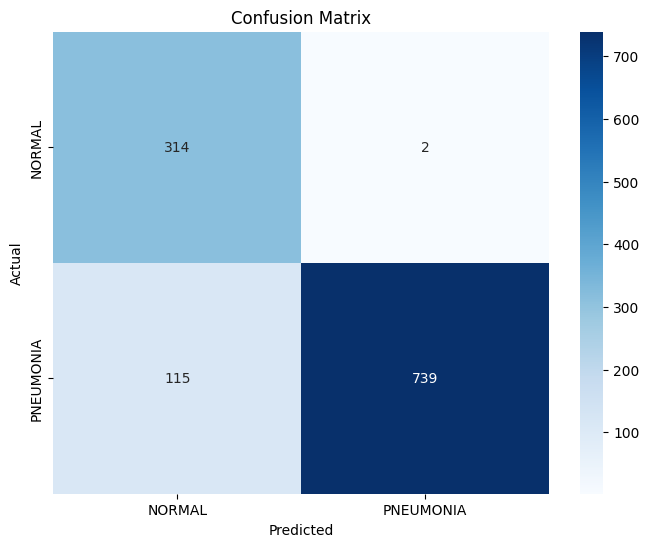

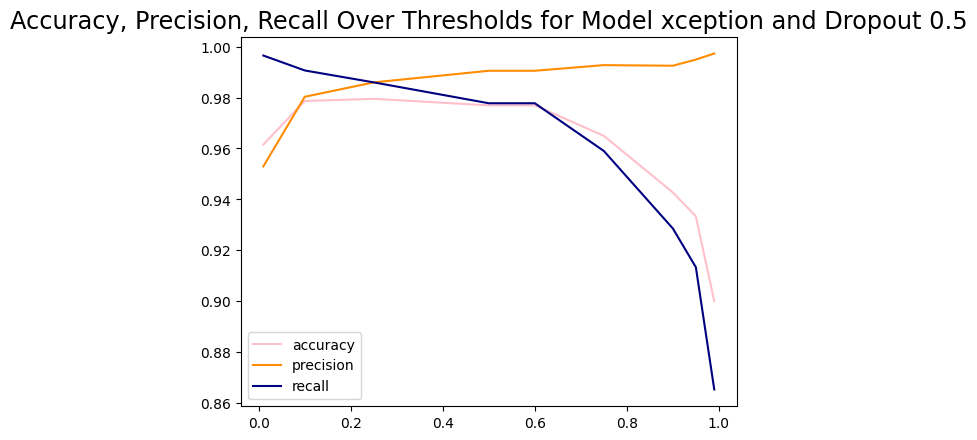



_______________


Model Name: xception
Dropout: 0.7
Found 4099 files belonging to 2 classes.
Found 587 files belonging to 2 classes.
Found 1170 files belonging to 2 classes.
Epoch 1/4
257/257 [==============================] - 56s 212ms/step - loss: 0.1697 - accuracy: 0.9366 - recall: 0.9616 - precision: 0.9520 - val_loss: 0.1069 - val_accuracy: 0.9693 - val_recall: 0.9743 - val_precision: 0.9835
Epoch 2/4
257/257 [==============================] - 55s 213ms/step - loss: 0.0769 - accuracy: 0.9741 - recall: 0.9833 - precision: 0.9813 - val_loss: 0.1104 - val_accuracy: 0.9727 - val_recall: 0.9860 - val_precision: 0.9769
Epoch 3/4
257/257 [==============================] - 55s 214ms/step - loss: 0.0559 - accuracy: 0.9810 - recall: 0.9880 - precision: 0.9860 - val_loss: 0.2448 - val_accuracy: 0.9302 - val_recall: 1.0000 - val_precision: 0.9126
Epoch 4/4
257/257 [==============================] - 55s 214ms/step - loss: 0.0342 - accuracy: 0.9878 - recall: 0.9926 - precision: 0.9907 - val_l

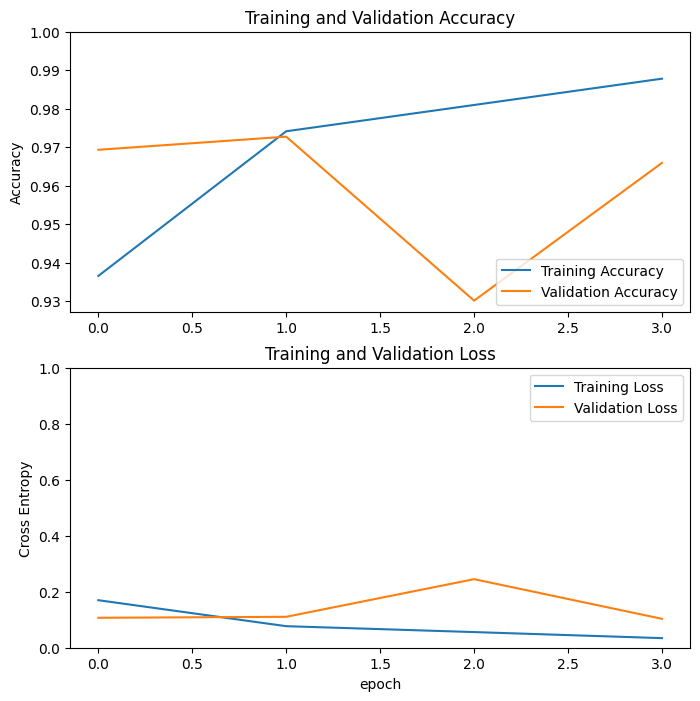

Threshold: 0.01
74/74 [==============================] - 3s 44ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9719 - precision: 0.9869
Test Accuracy: 0.9700854420661926
Test Loss: 0.09828996658325195
Length predictions: 1170
Hand calculated accuracy: 0.9667
Accuracy: 0.9666666666666667
Precision: 0.9614949037372593
Recall: 0.9941451990632318


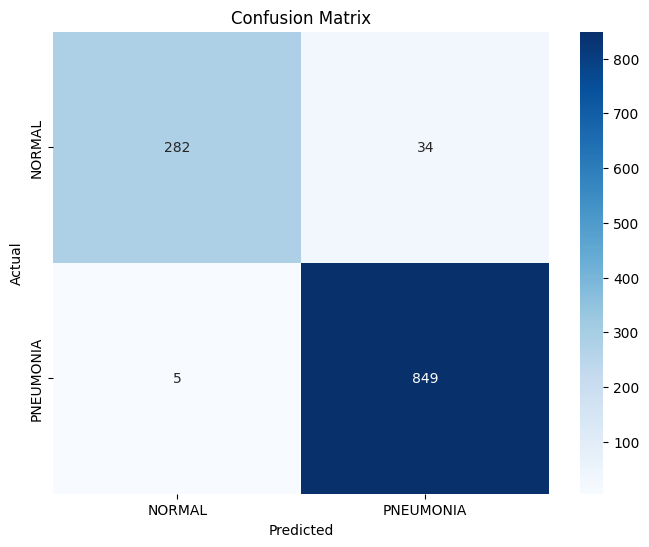

Threshold: 0.1
74/74 [==============================] - 3s 43ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9719 - precision: 0.9869
Test Accuracy: 0.9700854420661926
Test Loss: 0.0982898622751236
Length predictions: 1170
Hand calculated accuracy: 0.9769
Accuracy: 0.9769230769230769
Precision: 0.9791425260718424
Recall: 0.9894613583138173


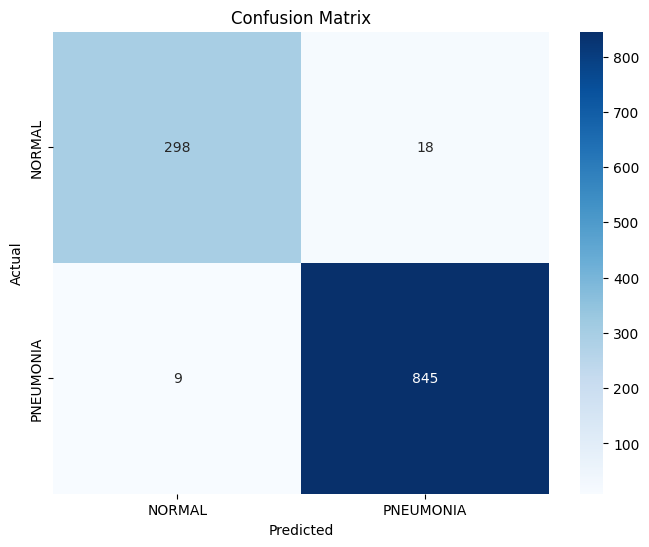

Threshold: 0.25
74/74 [==============================] - 3s 43ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9719 - precision: 0.9869
Test Accuracy: 0.9700854420661926
Test Loss: 0.098289854824543
Length predictions: 1170
Hand calculated accuracy: 0.9761
Accuracy: 0.976068376068376
Precision: 0.9847417840375586
Recall: 0.9824355971896955


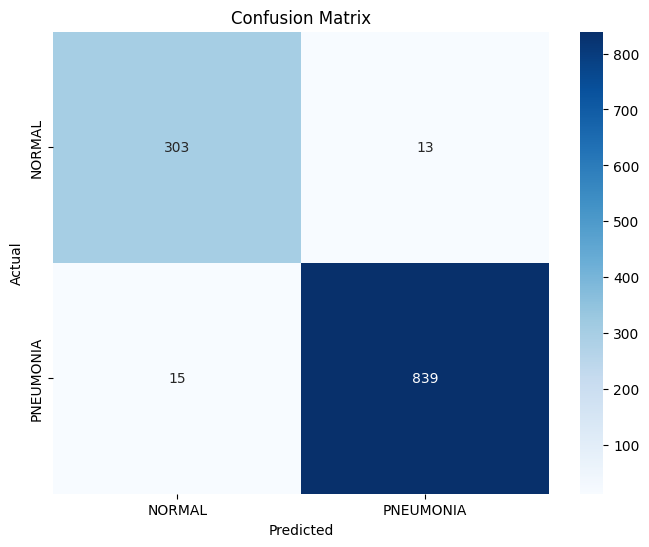

Threshold: 0.5
74/74 [==============================] - 3s 43ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9719 - precision: 0.9869
Test Accuracy: 0.9700854420661926
Test Loss: 0.098289854824543
Length predictions: 1170
Hand calculated accuracy: 0.9701
Accuracy: 0.9700854700854701
Precision: 0.9869203329369798
Recall: 0.9718969555035128


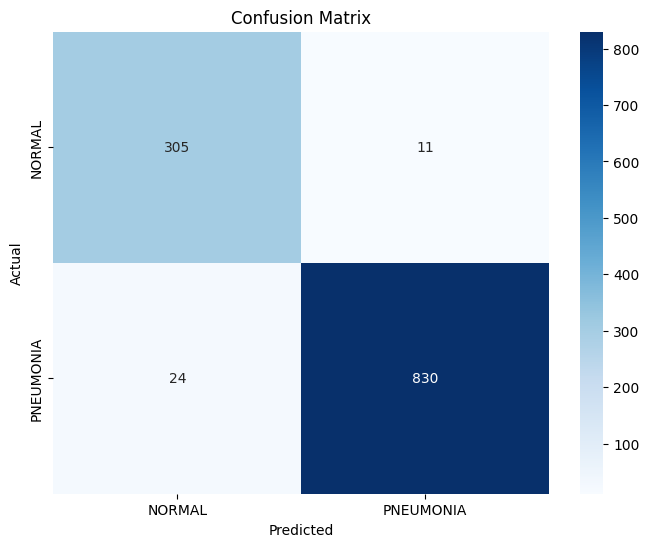

Threshold: 0.6
74/74 [==============================] - 3s 41ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9719 - precision: 0.9869
Test Accuracy: 0.9700854420661926
Test Loss: 0.0982898473739624
Length predictions: 1170
Hand calculated accuracy: 0.965
Accuracy: 0.964957264957265
Precision: 0.9868263473053892
Recall: 0.9648711943793911


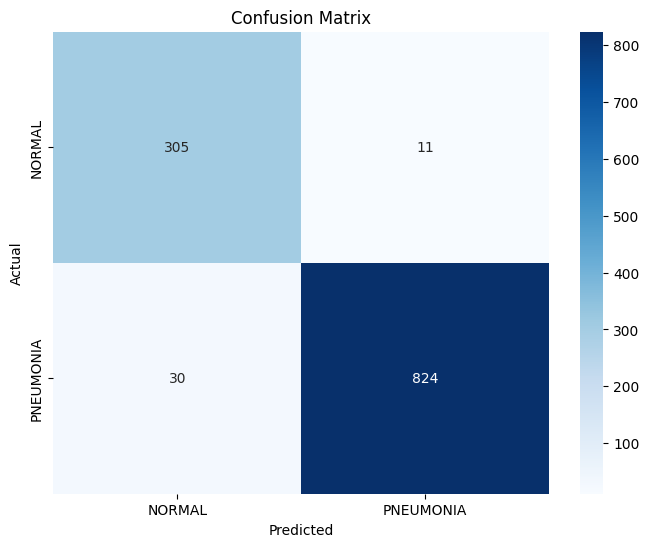

Threshold: 0.75
74/74 [==============================] - 3s 43ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9719 - precision: 0.9869
Test Accuracy: 0.9700854420661926
Test Loss: 0.09828983247280121
Length predictions: 1170
Hand calculated accuracy: 0.959
Accuracy: 0.958974358974359
Precision: 0.9878934624697336
Recall: 0.955503512880562


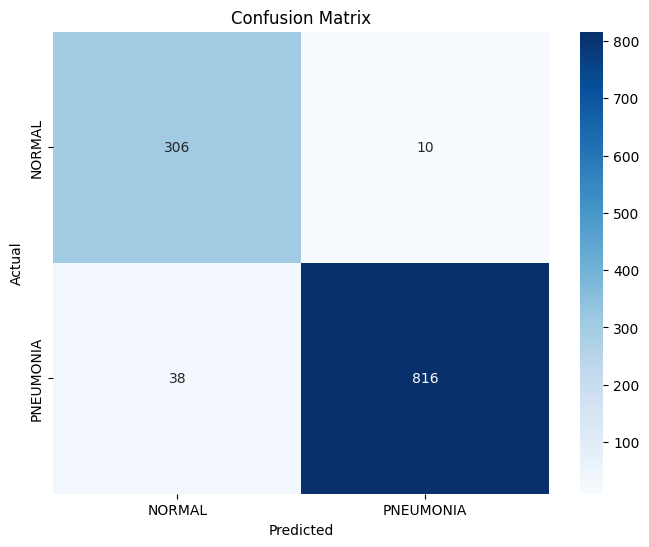

Threshold: 0.9
74/74 [==============================] - 3s 43ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9719 - precision: 0.9869
Test Accuracy: 0.9700854420661926
Test Loss: 0.098289854824543
Length predictions: 1170
Hand calculated accuracy: 0.9462
Accuracy: 0.9461538461538461
Precision: 0.9937578027465668
Recall: 0.9320843091334895


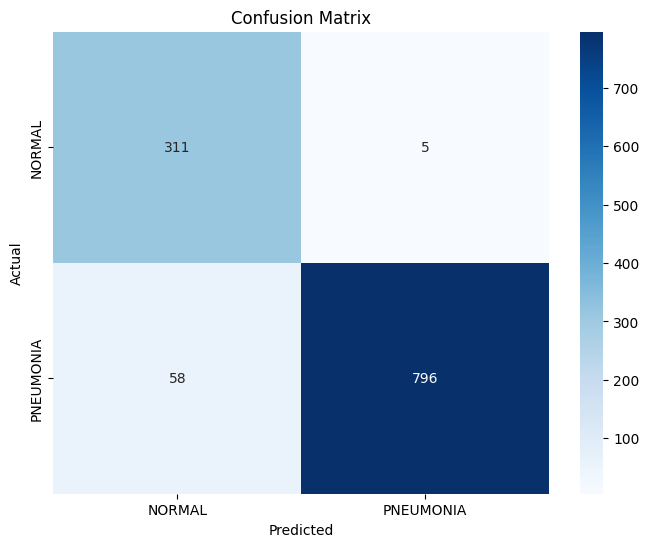

Threshold: 0.95
74/74 [==============================] - 3s 43ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9719 - precision: 0.9869
Test Accuracy: 0.9700854420661926
Test Loss: 0.0982898622751236
Length predictions: 1170
Hand calculated accuracy: 0.9316
Accuracy: 0.9316239316239316
Precision: 0.9961538461538462
Recall: 0.9098360655737705


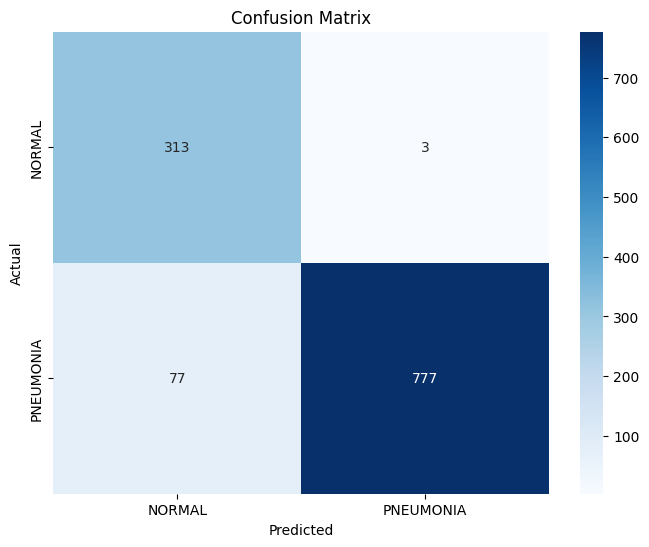

Threshold: 0.99
74/74 [==============================] - 3s 42ms/step - loss: 0.0983 - accuracy: 0.9701 - recall: 0.9719 - precision: 0.9869
Test Accuracy: 0.9700854420661926
Test Loss: 0.0982898622751236
Length predictions: 1170
Hand calculated accuracy: 0.8923
Accuracy: 0.8923076923076924
Precision: 0.9972677595628415
Recall: 0.8548009367681498


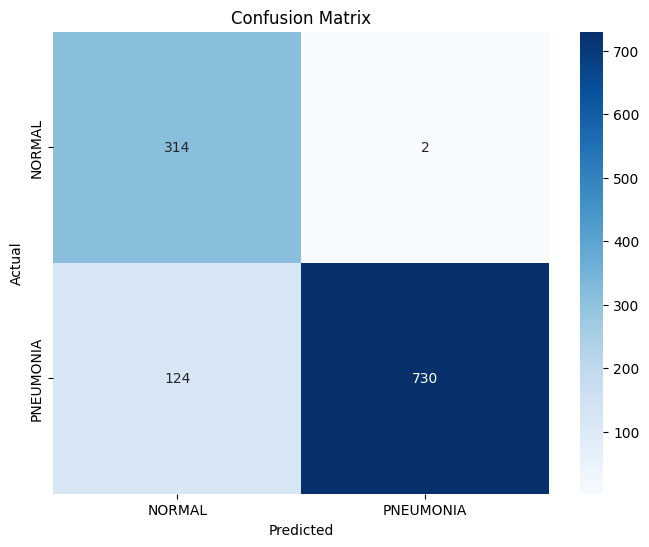

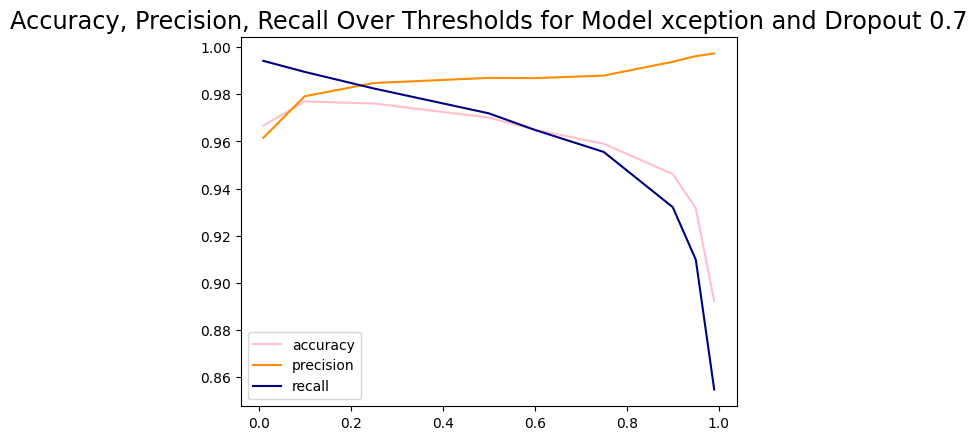



_______________


ACC 1 [(0.9264957264957265, 0.9478632478632478, 0.9564102564102565, 0.9598290598290599, 0.9598290598290599, 0.9615384615384616, 0.964957264957265, 0.9683760683760684, 0.9735042735042735), (0.923931623931624, 0.9581196581196582, 0.9641025641025641, 0.9683760683760684, 0.9717948717948718, 0.9735042735042735, 0.9700854700854701, 0.9641025641025641, 0.9393162393162393), (0.9632478632478633, 0.9735042735042735, 0.976068376068376, 0.976068376068376, 0.976068376068376, 0.9726495726495726, 0.9692307692307692, 0.9598290598290599, 0.935042735042735), (0.9529914529914529, 0.9641025641025641, 0.9692307692307692, 0.9726495726495726, 0.9717948717948718, 0.9717948717948718, 0.9735042735042735, 0.9752136752136752, 0.9692307692307692)]
ACC 2 [(0.8940170940170941, 0.9581196581196582, 0.964957264957265, 0.976068376068376, 0.9752136752136752, 0.9743589743589743, 0.9683760683760684, 0.9623931623931624, 0.9282051282051282), (0.9606837606837607, 0.9743589743589743, 0.9743589743589743, 0.9

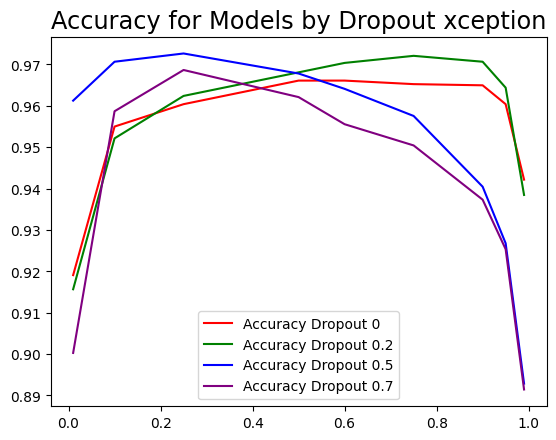



_______________




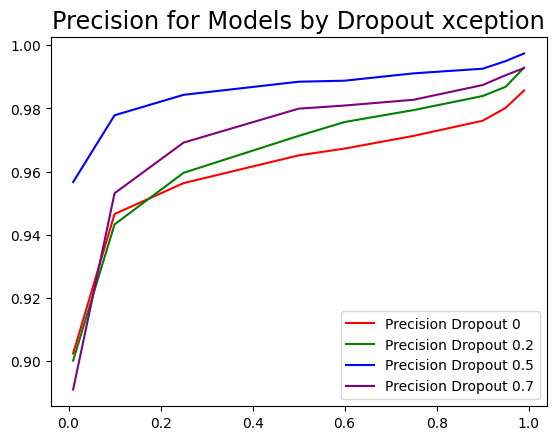



_______________




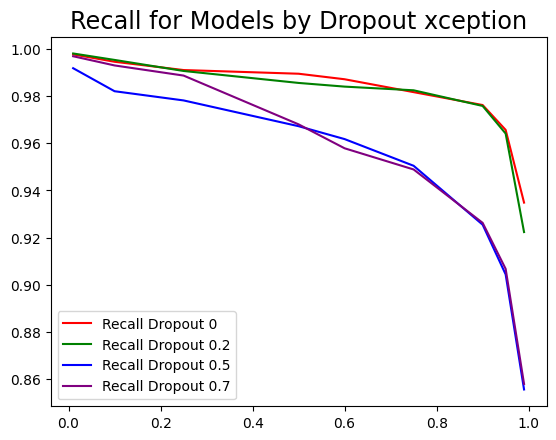



_______________


2023-12-13 11:33:42.194236


In [7]:
"""
Loop that tests every different model/dropout/threshold combination.
Essentially, hyperparameter tuning
"""
all_unorganized_data = []


model_names = ['mobilenet', 'inception', 'xception']
thresholds = [.01,.1,.25,.5,.6,.75,.9,.95,.99]
dropout_values = [0,.2,.5,.7]


for m in model_names:
    now = datetime.now()
    print(now)
    accuracies_overall = []
    precisions_overall = []
    recalls_overall = []
    
    accuracies_1, precisions_1, recalls_1  = test_dropouts(dropout_values, thresholds)    
    accuracies_2, precisions_2, recalls_2  = test_dropouts(dropout_values, thresholds)    
    accuracies_3, precisions_3, recalls_3  = test_dropouts(dropout_values, thresholds)    

    
    sum_accuracies = [[sum(x) for x in zip(accuracies_1[i], accuracies_2[i],accuracies_3[i])] for i in range(len(accuracies_1))]
    average_accuracies = [[num / 3 for num in inner_list] for inner_list in sum_accuracies]


    print("ACC 1", accuracies_1)
    print("ACC 2", accuracies_2)
    print("ACC 3", accuracies_3)
    print("AVERAGE ACCURACIES", average_accuracies)
    
    
    sum_precisions = [[sum(x) for x in zip(precisions_1[i], precisions_2[i],precisions_3[i])] for i in range(len(precisions_1))]
    average_precisions = [[num / 3 for num in inner_list] for inner_list in sum_precisions]


    print("PRE 1", precisions_1)
    print("PRE 2", precisions_2)
    print("PRE 3", precisions_3)

    print("AVERAGE PRE", average_precisions)
    
 
    sum_recalls = [[sum(x) for x in zip(recalls_1[i], recalls_2[i],recalls_3[i])] for i in range(len(recalls_1))]
    average_recalls = [[num / 3 for num in inner_list] for inner_list in sum_recalls]


    print("RECALL 1", recalls_1)
    print("RECALL 2", recalls_2)
    print("RECALL 3", recalls_3)

    print("AVERAGE RECALL", average_recalls)
    
    # Graphing Overall Model Results    
    graphModelResults(average_accuracies, dropout_values, thresholds, "Accuracy")
    graphModelResults(average_precisions, dropout_values, thresholds, "Precision")
    graphModelResults(average_recalls, dropout_values, thresholds, "Recall")
    
now = datetime.now()
print(now)
